In [1]:
#!pip install fastai --upgrade -q
#!pip install optuna

In [1]:
import fastai.tabular.all as ft
import gc
import math
import matplotlib.pyplot as plt
import numpy as np
import optuna
import pandas as pd
import seaborn as sns
import scipy.stats as st
from sklearn.base import clone
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor, BaggingClassifier, BaggingRegressor, RandomForestClassifier, RandomForestRegressor, VotingClassifier, VotingRegressor
from sklearn.impute import KNNImputer
from sklearn.metrics import accuracy_score,  f1_score, mean_absolute_error, mean_squared_error, precision_score, recall_score
from sklearn.model_selection import cross_val_score, cross_validate, train_test_split
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR, SVC
import torch
import torch.nn as nn
import torch.nn.functional as F
import warnings

In [2]:
gc.collect()

0

In [3]:
warnings.filterwarnings('ignore')

In [4]:
base_path = "./ConjuntosDatos/"
endutih_path = base_path + "ENDUTIH2020/conjuntos_de_datos/"
enigh_path = base_path + "ENIGH2020/"

# Tratado de datos

In [5]:
vars = [
    #Identificar filas
    "idx_original", "encuesta",
    #Compartidas
    "upm", "radio", "tva", "tvd", "cel", "compu", "internet",
    "tv_paga", "tel", "estrato", "entidad", "ambito", "loc", "piso",
    "agua", "drenaje", "electricidad", "refri", "lavadora", "auto", "res"
]

### ENDUTIH

In [4]:
endutih_vivienda = pd.read_csv(endutih_path+"tr_endutih_vivienda_anual_2020.csv")
endutih_hogar = pd.read_csv(endutih_path+"tr_endutih_hogar_anual_2020.csv")

endutih = endutih_hogar.merge(endutih_vivienda, on=["UPM","VIV_SEL"])
endutih.head()

C:\Users\jazmi\AppData\Local\Temp\ipykernel_9296\2978788288.py:2: DtypeWarning: Columns (29) have mixed types. Specify dtype option on import or set low_memory=False.
  endutih_hogar = pd.read_csv(endutih_path+"tr_endutih_hogar_anual_2020.csv")


,UPM,VIV_SEL,HOGAR,P4_1_1,P4_1_2,P4_1_3,P4_1_4,P4_1_5,P4_1_6,P4_1_6_1,...,P2_1,P2_2,P2_3,FAC_VIV,UPM_DIS_y,EST_DIS_y,DOMINIO_y,TLOC_y,ESTRATO_y,ENT_y
0,101072,4,1,1,2,2,1,1,1,2.0,...,3,1,NaN,208,144,6,U,1,2,1
1,101072,5,1,1,2,2,1,2,1,3.0,...,3,1,NaN,208,144,6,U,1,2,1
2,101080,1,1,1,1,1,1,1,1,3.0,...,4,1,NaN,200,145,6,U,1,2,1
3,101080,2,1,1,1,2,1,2,1,6.0,...,6,1,NaN,200,145,6,U,1,2,1
4,101080,3,1,1,1,2,1,2,1,3.0,...,3,1,NaN,200,145,6,U,1,2,1


In [5]:
endutih.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58154 entries, 0 to 58153
Columns: 101 entries, UPM to ENT_y
dtypes: float64(53), int64(41), object(7)
memory usage: 45.3+ MB


In [6]:
endutih21 = pd.DataFrame(columns = vars)
#Valores directos
endutih21.idx_original = list(endutih.index)
endutih21.encuesta = [1]*endutih.shape[0] 
endutih21.upm = endutih.UPM.astype("int")
endutih21.estrato = endutih.ESTRATO_x.astype("int")
endutih21.res = endutih.P2_1
endutih21.loc = endutih.TLOC_x
endutih21.entidad = endutih.ENT_x.astype("str")
endutih21.piso = endutih.P1_1.astype("str")
endutih21.agua = endutih.P1_2.astype("str")
endutih21.drenaje = endutih.P1_3.astype("str")

endutih21

,idx_original,encuesta,upm,radio,tva,tvd,cel,compu,internet,tv_paga,...,ambito,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res
0,0,1,101072,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,3,1,1,NaN,NaN,NaN,NaN,3
1,1,1,101072,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,2,1,1,NaN,NaN,NaN,NaN,3
2,2,1,101080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,2,1,1,NaN,NaN,NaN,NaN,4
3,3,1,101080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,3,1,1,NaN,NaN,NaN,NaN,6
4,4,1,101080,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,1,1,1,NaN,NaN,NaN,NaN,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58149,58149,1,3260770,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4,3,1,1,NaN,NaN,NaN,NaN,3
58150,58150,1,3260770,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4,2,1,1,NaN,NaN,NaN,NaN,3
58151,58151,1,3260770,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4,2,1,1,NaN,NaN,NaN,NaN,4
58152,58152,1,3260770,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4,3,1,1,NaN,NaN,NaN,NaN,7


In [7]:
#Valores tratamiento
endutih21.ambito =( endutih.DOMINIO_x=="U").astype('int')
endutih21.radio = (endutih.P4_1_1==1).astype('int')
endutih21.tva = (endutih.P4_1_2==1).astype('int')
endutih21.tvd = (endutih.P4_1_3==1).astype('int')
endutih21.cel = (endutih.P4_1_6==1).astype('int')
endutih21.compu = ((endutih.P4_2_1==1)|(endutih.P4_2_2==1)|(endutih.P4_2_3==1)).astype('int')
endutih21.internet = (endutih.P4_4==1).astype('int')
endutih21.tv_paga = (endutih.P5_1==1).astype('int')
endutih21.tel = (endutih.P5_5==1).astype('int')
endutih21.electricidad = (endutih.P1_4==1).astype('int')
endutih21.refri = (endutih.P1_5_1==1).astype('int')
endutih21.lavadora = (endutih.P1_5_2==1).astype('int')
endutih21.auto = (endutih.P1_5_3==1).astype('int')

endutih21

,idx_original,encuesta,upm,radio,tva,tvd,cel,compu,internet,tv_paga,...,ambito,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res
0,0,1,101072,1,0,0,1,1,1,0,...,1,1,3,1,1,1,1,1,1,3
1,1,1,101072,1,0,0,1,0,1,1,...,1,1,2,1,1,1,1,1,0,3
2,2,1,101080,1,1,1,1,1,1,1,...,1,1,2,1,1,1,1,1,0,4
3,3,1,101080,1,1,0,1,1,1,0,...,1,1,3,1,1,1,1,1,1,6
4,4,1,101080,1,1,0,1,0,0,0,...,1,1,1,1,1,1,1,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58149,58149,1,3260770,0,0,0,1,1,1,1,...,0,4,3,1,1,1,1,1,0,3
58150,58150,1,3260770,0,0,0,1,0,1,0,...,0,4,2,1,1,1,1,1,0,3
58151,58151,1,3260770,1,1,0,1,1,1,0,...,0,4,2,1,1,1,1,1,1,4
58152,58152,1,3260770,1,1,1,1,1,1,0,...,0,4,3,1,1,1,1,1,1,7


In [8]:
endutih21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58154 entries, 0 to 58153
Data columns (total 23 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   idx_original  58154 non-null  int64 
 1   encuesta      58154 non-null  int64 
 2   upm           58154 non-null  int32 
 3   radio         58154 non-null  int32 
 4   tva           58154 non-null  int32 
 5   tvd           58154 non-null  int32 
 6   cel           58154 non-null  int32 
 7   compu         58154 non-null  int32 
 8   internet      58154 non-null  int32 
 9   tv_paga       58154 non-null  int32 
 10  tel           58154 non-null  int32 
 11  estrato       58154 non-null  int32 
 12  entidad       58154 non-null  object
 13  ambito        58154 non-null  int32 
 14  loc           58154 non-null  int64 
 15  piso          58154 non-null  object
 16  agua          58154 non-null  object
 17  drenaje       58154 non-null  object
 18  electricidad  58154 non-null  int32 
 19  refr

In [9]:
#Columnas a completar
colsENDUTIH = {
    "P4_1_6_1":"int", "P4_2_1":"str", "P4_2_2":"str", "P4_2_3":"str", 
    "P4_3":"str", "P4_5":"str", "P4_6_1":"str", "P4_6_2":"str", 
    "P4_6_3":"str", "P4_6_4":"str", "P4_6_5":"str", "P4_7_1":"str", 
    "P4_7_2":"str", "P4_7_3":"str", "P4_8":"str", "P5_2_1":"str", 
    "P5_2_2":"str", "P5_3_1":"str", "P5_3_2":"str", "P5_4":"str",  
    "P5_11_1":"int", "P5_11_2":"int", "P5_11_3":"int", "VIV_SEL":"str"
}

In [10]:
for col,tipo in colsENDUTIH.items():
   # if tipo == "str":
       # endutih21[col] = endutih[col].fillna(0).astype("int")
    #else:
    endutih21[col] = endutih[col].fillna(0).astype(tipo)

In [11]:
endutih21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58154 entries, 0 to 58153
Data columns (total 47 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   idx_original  58154 non-null  int64 
 1   encuesta      58154 non-null  int64 
 2   upm           58154 non-null  int32 
 3   radio         58154 non-null  int32 
 4   tva           58154 non-null  int32 
 5   tvd           58154 non-null  int32 
 6   cel           58154 non-null  int32 
 7   compu         58154 non-null  int32 
 8   internet      58154 non-null  int32 
 9   tv_paga       58154 non-null  int32 
 10  tel           58154 non-null  int32 
 11  estrato       58154 non-null  int32 
 12  entidad       58154 non-null  object
 13  ambito        58154 non-null  int32 
 14  loc           58154 non-null  int64 
 15  piso          58154 non-null  object
 16  agua          58154 non-null  object
 17  drenaje       58154 non-null  object
 18  electricidad  58154 non-null  int32 
 19  refr

### ENIGH

In [13]:
enigh_vivienda = pd.read_csv(enigh_path+"conjunto_de_datos_viviendas_enigh_2020_ns/conjunto_de_datos/conjunto_de_datos_viviendas_enigh_2020_ns.csv")

enigh_hogar = pd.read_csv(enigh_path+"conjunto_de_datos_hogares_enigh_2020_ns/conjunto_de_datos/conjunto_de_datos_hogares_enigh_2020_ns.csv")
enigh_concentrado_hogar = pd.read_csv(enigh_path+"conjunto_de_datos_concentradohogar_enigh_2020_ns/conjunto_de_datos/conjunto_de_datos_concentradohogar_enigh_2020_ns.csv", usecols = ["folioviv","foliohog","factor", "comunica",])

enigh_hogar = enigh_hogar.merge(enigh_concentrado_hogar, on=["folioviv","foliohog"])

del enigh_concentrado_hogar

enigh = enigh_hogar.merge(enigh_vivienda, on=["folioviv"])
enigh.head()

,folioviv,foliohog,huespedes,huesp_come,num_trab_d,trab_come,acc_alim1,acc_alim2,acc_alim3,acc_alim4,...,tot_hom,tot_muj,tot_hog,ubica_geo,tam_loc,est_socio,est_dis,upm,factor_y,procaptar
0,100013605,1,0,,0,,1,2,1,1,...,1,2,1,1001,1,3,2,1,190,0
1,100013606,1,0,,0,,1,1,1,1,...,3,1,1,1001,1,3,2,1,190,0
2,100017801,1,0,,0,,2,2,2,2,...,1,1,1,1001,1,3,2,2,189,0
3,100017802,1,0,,0,,2,2,2,2,...,2,0,1,1001,1,3,2,2,189,0
4,100017803,1,0,,0,,2,2,2,2,...,1,1,1,1001,1,3,2,2,189,0


In [14]:
enigh_hogar

,folioviv,foliohog,huespedes,huesp_come,num_trab_d,trab_come,acc_alim1,acc_alim2,acc_alim3,acc_alim4,...,cond_licon,lts_licon,otros_lts,diconsa,frec_dicon,cond_dicon,pago_dicon,otro_pago,factor,comunica
0,100013605,1,0,,0,,1,2,1,1,...,,,,9,,,,,190,3000.0
1,100013606,1,0,,0,,1,1,1,1,...,,,,9,,,,,190,2250.0
2,100017801,1,0,,0,,2,2,2,2,...,,,,9,,,,,189,2040.0
3,100017802,1,0,,0,,2,2,2,2,...,,,,9,,,,,189,4647.0
4,100017803,1,0,,0,,2,2,2,2,...,,,,2,,,,,189,1140.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89001,3260770714,1,0,,0,,2,2,2,2,...,2,7,2,1,2,2,2,,128,540.0
89002,3260770715,1,0,,0,,2,2,2,2,...,2,7,2,1,3,,,,128,150.0
89003,3260770716,1,0,,0,,1,2,2,1,...,,,,1,3,,,,128,150.0
89004,3260770717,1,0,,0,,2,2,2,2,...,,,,1,2,2,3,,128,750.0


In [15]:
enigh.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89006 entries, 0 to 89005
Columns: 202 entries, folioviv to procaptar
dtypes: float64(1), int64(111), object(90)
memory usage: 137.8+ MB


In [16]:
enigh21 = pd.DataFrame(columns = vars)
#Valores directos
enigh21.idx_original = list(enigh.index)
enigh21.encuesta = [2]*enigh.shape[0] 
enigh21.upm = enigh.upm.astype("int")
enigh21.estrato = enigh.est_socio.astype("int")
enigh21.loc = enigh.tam_loc
enigh21.piso = enigh.mat_pisos.replace("&",0).astype("str")
enigh21.res = enigh.tot_resid
enigh21.agua = enigh.disp_agua.astype("str")
enigh21.drenaje = enigh.drenaje.astype("str")

enigh21

,idx_original,encuesta,upm,radio,tva,tvd,cel,compu,internet,tv_paga,...,ambito,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res
0,0,2,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,3,1,1,NaN,NaN,NaN,NaN,3
1,1,2,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,3,1,1,NaN,NaN,NaN,NaN,4
2,2,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,3,1,1,NaN,NaN,NaN,NaN,2
3,3,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,3,1,1,NaN,NaN,NaN,NaN,2
4,4,2,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1,3,1,1,NaN,NaN,NaN,NaN,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89001,89001,2,10149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4,2,1,1,NaN,NaN,NaN,NaN,2
89002,89002,2,10149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4,2,1,1,NaN,NaN,NaN,NaN,2
89003,89003,2,10149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4,2,1,5,NaN,NaN,NaN,NaN,3
89004,89004,2,10149,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,4,2,1,1,NaN,NaN,NaN,NaN,7


In [17]:
#Valores tratamiento
enigh21.radio = (enigh.num_radio>0).astype('int')
enigh21.tva = (enigh.num_tva>0).astype('int')
enigh21.tvd = (enigh.num_tvd>0).astype('int')
enigh21.cel = (enigh.celular==1).astype('int')
enigh21.compu = (enigh.num_compu>0).astype('int')
enigh21.internet = (enigh.conex_inte==1).astype('int')
enigh21.tv_paga = (enigh.tv_paga==1).astype('int')
enigh21.tel = (enigh.telefono==1).astype('int')
enigh21.entidad = enigh.folioviv.apply(lambda x: str(x)[:2])
enigh21.ambito = enigh.folioviv.apply(lambda x: 1 if (int(str(x)[2])!=6) else 0)
enigh21.electricidad = (enigh.disp_elect!=5).astype('int')
enigh21.refri = (enigh.num_refri>0).astype('int')
enigh21.lavadora = (enigh.num_lavad>0).astype('int')
enigh21.auto = (enigh.num_auto+enigh.num_pickup>0).astype('int')

enigh21

,idx_original,encuesta,upm,radio,tva,tvd,cel,compu,internet,tv_paga,...,ambito,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res
0,0,2,1,0,0,0,1,1,1,0,...,1,1,3,1,1,1,1,1,0,3
1,1,2,1,1,0,1,1,1,1,0,...,1,1,3,1,1,1,1,1,1,4
2,2,2,2,0,0,1,1,1,1,0,...,1,1,3,1,1,1,1,1,1,2
3,3,2,2,0,0,1,1,1,1,1,...,1,1,3,1,1,1,1,1,0,2
4,4,2,2,0,0,1,1,1,1,1,...,1,1,3,1,1,1,1,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89001,89001,2,10149,1,1,0,1,0,0,0,...,0,4,2,1,1,1,1,1,1,2
89002,89002,2,10149,0,0,1,1,0,0,0,...,0,4,2,1,1,1,1,1,0,2
89003,89003,2,10149,1,0,1,0,0,0,0,...,0,4,2,1,5,1,0,0,0,3
89004,89004,2,10149,0,0,1,1,0,1,0,...,0,4,2,1,1,1,1,1,1,7


#### Columnas que podríamos llevar a la ENDUTIH

In [18]:
cols_agregar = ["num_impre", "anio_impre", "num_compu", "anio_compu", "num_juego", "anio_juego", "tarjeta", "comunica"]

for col in cols_agregar:
    enigh21[col] = enigh[col].copy()

In [19]:
enigh21.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 89006 entries, 0 to 89005
Data columns (total 31 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   idx_original  89006 non-null  int64  
 1   encuesta      89006 non-null  int64  
 2   upm           89006 non-null  int32  
 3   radio         89006 non-null  int32  
 4   tva           89006 non-null  int32  
 5   tvd           89006 non-null  int32  
 6   cel           89006 non-null  int32  
 7   compu         89006 non-null  int32  
 8   internet      89006 non-null  int32  
 9   tv_paga       89006 non-null  int32  
 10  tel           89006 non-null  int32  
 11  estrato       89006 non-null  int32  
 12  entidad       89006 non-null  object 
 13  ambito        89006 non-null  int64  
 14  loc           89006 non-null  int64  
 15  piso          89006 non-null  object 
 16  agua          89006 non-null  object 
 17  drenaje       89006 non-null  object 
 18  electricidad  89006 non-nu

In [20]:
endutih21.to_csv(endutih_path+"endutih21.csv",index=False)
enigh21.to_csv(enigh_path+"enigh21.csv",index=False)

# ENTRENAMIENTO

In [6]:
endutih21 = pd.read_csv(endutih_path+"endutih21.csv")
enigh21 = pd.read_csv(enigh_path+"enigh21.csv")

In [17]:
columnas = dict(enigh21.iloc[:,2:23].dtypes)
columnas

{'upm': dtype('int64'),
 'radio': dtype('int64'),
 'tva': dtype('int64'),
 'tvd': dtype('int64'),
 'cel': dtype('int64'),
 'compu': dtype('int64'),
 'internet': dtype('int64'),
 'tv_paga': dtype('int64'),
 'tel': dtype('int64'),
 'estrato': dtype('int64'),
 'entidad': dtype('int64'),
 'ambito': dtype('int64'),
 'loc': dtype('int64'),
 'piso': dtype('int64'),
 'agua': dtype('int64'),
 'drenaje': dtype('int64'),
 'electricidad': dtype('int64'),
 'refri': dtype('int64'),
 'lavadora': dtype('int64'),
 'auto': dtype('int64'),
 'res': dtype('int64')}

In [8]:
def objective_regr(trial):
    """
    Lo primero a optimizar son las capas de las redes, para
    decidir cuántas capas y cuántas neuronas hay en cada una,
    lo que haremos será sugerir un valor para el total de capas
    y posteriormente crearemos una lista con sugerencias de optuna
    para la cantidad de neuronas por capa
    """

    nl = trial.suggest_int("n_layers", 1,13)
    layers =  [trial.suggest_int("n_neuronas_layer"+str(i), 32, 256) for i in range(nl)]

    #print(f"Caps de neuronas:{layers}")

    """
    Dentro de las opciones para configurar el modelo del learner nos
    encontramos con bn_final y embed_p, anteriormente estos parámetros
    fueron de ayuda en la tarea pasada, por lo que vamos a ver la 
    sugerencia de optuna
    """
    bnFinal = trial.suggest_categorical("bn_final", [True, False])
    embedP = trial.suggest_float("embed_p",0.01,1)
    
    """
    También vamos a buscar la función de activación más adecuada 
    para este caso. Dado que optuna no nos permite elegir un elemento
    de una lista de funciones, lo que haremos será crear una lista de 
    funciones y dejaremos que optuna elija el índice de esta lista, así
    va a elegir de manera indirecta la función de activación adecuada.
    """
    actClsList = [nn.ReLU(inplace=True),nn.LeakyReLU(inplace=True), nn.CELU(inplace=True)]
    idxActCls = trial.suggest_int("idx_act_cls",0,2)
    actCls= actClsList[idxActCls]

    """
    También podemos dejar que optuna elija el optimizador por nosootros,
    y lo haremos de la misma forma en la que se elige la función de 
    activación.
    """
    optimList = [ft.ranger, ft.Adam]
    idxOptim = trial.suggest_int('idx_opt_func',0,1)
    optim = optimList[idxOptim]

    #Creamos el learner
    learn = ft.tabular_learner(dls,
                                layers = layers,
                                config =ft.tabular_config(
                                    act_cls=actCls, 
                                    embed_p=embedP, 
                                    bn_final=bnFinal),
                                opt_func=optim,
                                metrics=[F.l1_loss,F.mse_loss],
                               )

    
    """
    Para el entrenamiento del learner vamos a optimizar el
    número de épocas, la tasa de aprendizaje, el pct_start, div_final
    y el valor de div
    """

    epoch = trial.suggest_int("epoch",23,250)
    lr = trial.suggest_float("lr",1e-6,1e-1)
    pctStart = trial.suggest_float("pct_start",0.01,0.9)
    divFinal = trial.suggest_int("div_final",int(1e2),int(1e6))
    div = trial.suggest_float("div",0.01,1)
    

    #Entrenamos el learner con lo obtenido
    learn.fit_one_cycle(epoch, lr, pct_start=pctStart, 
                        div_final=divFinal, div=div
                        )
    
    #Regresamos el error promedio del entrenamiento
    return learn.recorder.metrics[0].value.item()

In [9]:
def objective_clas(trial):
    """
    Lo primero a optimizar son las capas de las redes, para
    decidir cuántas capas y cuántas neuronas hay en cada una,
    lo que haremos será sugerir un valor para el total de capas
    y posteriormente crearemos una lista con sugerencias de optuna
    para la cantidad de neuronas por capa
    """

    nl = trial.suggest_int("n_layers", 1,13)
    layers =  [trial.suggest_int("n_neuronas_layer"+str(i), 32, 256) for i in range(nl)]

    #print(f"Caps de neuronas:{layers}")

    """
    Dentro de las opciones para configurar el modelo del learner nos
    encontramos con bn_final y embed_p, anteriormente estos parámetros
    fueron de ayuda en la tarea pasada, por lo que vamos a ver la 
    sugerencia de optuna
    """
    bnFinal = trial.suggest_categorical("bn_final", [True, False])
    embedP = trial.suggest_float("embed_p",0.01,1)
    
    """
    También vamos a buscar la función de activación más adecuada 
    para este caso. Dado que optuna no nos permite elegir un elemento
    de una lista de funciones, lo que haremos será crear una lista de 
    funciones y dejaremos que optuna elija el índice de esta lista, así
    va a elegir de manera indirecta la función de activación adecuada.
    """
    actClsList = [nn.ReLU(inplace=True),nn.LeakyReLU(inplace=True), nn.CELU(inplace=True)]
    idxActCls = trial.suggest_int("idx_act_cls",0,2)
    actCls= actClsList[idxActCls]

    """
    También podemos dejar que optuna elija el optimizador por nosootros,
    y lo haremos de la misma forma en la que se elige la función de 
    activación.
    """
    optimList = [ft.ranger, ft.Adam]
    idxOptim = trial.suggest_int('idx_opt_func',0,1)
    optim = optimList[idxOptim]

    #Creamos el learner
    learn = ft.tabular_learner(dls,
                                layers = layers,
                               loss_func= ft.CrossEntropyLossFlat(),
                                config =ft.tabular_config(
                                    act_cls=actCls, 
                                    embed_p=embedP, 
                                    bn_final=bnFinal),
                                opt_func=optim,
                                metrics=[ft.accuracy, ft.Recall(average="weighted"), ft.Precision(average="weighted"), ft.F1Score(average="weighted")],
                               )

    
    """
    Para el entrenamiento del learner vamos a optimizar el
    número de épocas, la tasa de aprendizaje, el pct_start, div_final
    y el valor de div
    """

    epoch = trial.suggest_int("epoch",23,250)
    lr = trial.suggest_float("lr",1e-6,1e-1)
    pctStart = trial.suggest_float("pct_start",0.01,0.9)
    divFinal = trial.suggest_int("div_final",int(1e2),int(1e6))
    div = trial.suggest_float("div",0.01,1)
    

    #Entrenamos el learner con lo obtenido
    learn.fit_one_cycle(epoch, lr, pct_start=pctStart, 
                        div_final=divFinal, div=div
                        )
    
    #Regresamos el error promedio del entrenamiento
    return 1-learn.recorder.metrics[0].value.item()

In [10]:
def eval_cv_clas(cv):
    """
    EVALUA EL DESEMPENIO PROMEDIO AL HACER VALIDACION CRUZADA
    """
    return np.mean(cv["test_accuracy"]), np.mean(cv["test_recall_weighted"]), np.mean(cv["test_precision_weighted"]), np.mean(cv["test_f1_weighted"])

In [11]:
def eval_pred_clas(y_test, y_pred):
    """
    EVALUA LA PREDICCION CLASIFICADA
    """
    return accuracy_score(y_test, y_pred), recall_score(y_test, y_pred, average="weighted"), precision_score(y_test, y_pred, average="weighted"), f1_score(y_test, y_pred, average="weighted")

# Cantidad de celulares

### Con RN

In [6]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [7]:
y_names = ["P4_1_6_1"]

In [8]:
# Filtrado de datos, solo aquellos que tengan al menos un celular
train_df = endutih21[(endutih21.cel==1)&(endutih21.P4_1_6_1!=99)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_1_6_1
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,2
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,3
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,3
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,6
4,101080,1,1,0,1,0,0,0,0,2,...,1,1,1,1,1,1,0,0,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,2
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,2
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,4
58152,3260770,1,1,1,1,1,1,0,0,2,...,4,3,1,1,1,1,1,1,7,4


In [30]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=18)

In [31]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names,axis=1).columns)
train_df[y_names[0]] = y_train

In [32]:
train_df[y_names].describe()

,P4_1_6_1
count,35348.000000
mean,2.458017
std,1.293567
min,1.000000
25%,2.000000
50%,2.000000
75%,3.000000
max,21.000000


In [103]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing, ft.Normalize],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048
                       )

In [108]:
study = optuna.create_study()
study.optimize(objective_regr, n_trials=53)

[I 2023-02-17 19:36:30,507] A new study created in memory with name: no-name-c74b4235-90a6-478c-94cf-2ff07bec5070


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,3.629382,2.159551,1.092445,2.159551,00:00
1,2.394894,40.438957,4.324423,40.438957,00:00
2,1.796504,46.539486,4.523771,46.539486,00:00
3,1.479707,11.229517,2.265468,11.229517,00:00
4,1.290937,4.429506,1.409021,4.429506,00:00
5,1.172247,1.185036,0.804377,1.185036,00:00
6,1.098744,0.980304,0.728122,0.980304,00:00
7,1.048358,1.001324,0.738563,1.001324,00:00
8,1.006970,0.992127,0.727317,0.992127,00:00
9,0.973286,0.895471,0.673528,0.895471,00:00


[I 2023-02-17 19:37:20,736] Trial 0 finished with value: 0.7745749950408936 and parameters: {'n_layers': 18, 'n_neuronas_layer0': 72, 'n_neuronas_layer1': 161, 'n_neuronas_layer2': 209, 'n_neuronas_layer3': 167, 'n_neuronas_layer4': 93, 'n_neuronas_layer5': 67, 'n_neuronas_layer6': 158, 'n_neuronas_layer7': 237, 'n_neuronas_layer8': 143, 'n_neuronas_layer9': 138, 'n_neuronas_layer10': 141, 'n_neuronas_layer11': 113, 'n_neuronas_layer12': 237, 'n_neuronas_layer13': 124, 'n_neuronas_layer14': 148, 'n_neuronas_layer15': 201, 'n_neuronas_layer16': 119, 'n_neuronas_layer17': 230, 'bn_final': False, 'embed_p': 0.7994029682339143, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 167, 'lr': 0.05524322108453414, 'pct_start': 0.8261560077464937, 'div_final': 491193, 'div': 0.6398369452308208}. Best is trial 0 with value: 0.7745749950408936.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,591082174882441559277568.000000,308253127893421836468224.000000,545120288768.000000,308253127893421836468224.000000,00:00
1,434670034124840114323456.000000,295325347004671223398400.000000,505433161728.000000,295325347004671223398400.000000,00:00
2,377158490422566576979968.000000,280502595507911181467648.000000,482392571904.000000,280502595507911181467648.000000,00:00
3,344165623955608588779520.000000,264828249350412397707264.000000,466679529472.000000,264828249350412397707264.000000,00:00
4,320892858550005832613888.000000,249736524869507280273408.000000,452952227840.000000,249736524869507280273408.000000,00:00
5,302471947123758878162944.000000,247317821653631681691648.000000,449432354816.000000,247317821653631681691648.000000,00:00
6,286970809407928763678720.000000,233620771905330659459072.000000,437074755584.000000,233620771905330659459072.000000,00:00
7,273274804494741291401216.000000,222112165331157037088768.000000,426575691776.000000,222112165331157037088768.000000,00:00
8,260862649734527581159424.000000,210884475287340276776960.000000,415865044992.000000,210884475287340276776960.000000,00:00
9,249462489839381040332800.000000,201376655898020780441600.000000,406704750592.000000,201376655898020780441600.000000,00:00


[I 2023-02-17 19:37:55,745] Trial 1 finished with value: 208832888832.0 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 245, 'n_neuronas_layer1': 225, 'n_neuronas_layer2': 174, 'n_neuronas_layer3': 52, 'n_neuronas_layer4': 96, 'bn_final': False, 'embed_p': 0.5655716020947977, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 176, 'lr': 0.09336988189474912, 'pct_start': 0.16000669674028453, 'div_final': 331773, 'div': 0.24144049390981664}. Best is trial 0 with value: 0.7745749950408936.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,836.811890,867970.437500,554.308838,867970.437500,00:00
1,476.398346,11040.619141,51.800728,11040.619141,00:00
2,336.971436,244.027527,7.978360,244.027527,00:00
3,238.483444,688.217590,3.718607,688.217590,00:00
4,176.312515,42.329510,5.253561,42.329510,00:00
5,131.287872,2.469708,1.166063,2.469708,00:00
6,98.486137,5.426826,1.986379,5.426826,00:00
7,73.853539,2.574383,1.193518,2.574383,00:00
8,55.552521,1.602975,1.019724,1.602975,00:00
9,42.127823,1.514689,0.924784,1.514689,00:00


[I 2023-02-17 19:38:31,445] Trial 2 finished with value: 0.6823853254318237 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 188, 'n_neuronas_layer1': 256, 'n_neuronas_layer2': 103, 'n_neuronas_layer3': 100, 'bn_final': False, 'embed_p': 0.817617402015965, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 157, 'lr': 0.07449173687306762, 'pct_start': 0.10299398068750594, 'div_final': 414020, 'div': 0.07913867447296953}. Best is trial 2 with value: 0.6823853254318237.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,6.704319,5.179348,1.997311,5.179348,00:00
1,5.641247,4.882599,1.939157,4.882599,00:00
2,4.568780,2.306371,1.297992,2.306371,00:00
3,3.425607,0.908301,0.705462,0.908301,00:00
4,2.628643,0.889577,0.701058,0.889577,00:00
5,2.122566,0.870725,0.686543,0.870725,00:00
6,1.779623,0.867592,0.673296,0.867592,00:00
7,1.540982,0.893492,0.712036,0.893492,00:00
8,1.374111,0.867902,0.679262,0.867902,00:00
9,1.248138,0.879643,0.681469,0.879643,00:00


[I 2023-02-17 19:38:39,168] Trial 3 finished with value: 0.6723881363868713 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 193, 'n_neuronas_layer1': 186, 'n_neuronas_layer2': 188, 'n_neuronas_layer3': 193, 'n_neuronas_layer4': 178, 'n_neuronas_layer5': 252, 'n_neuronas_layer6': 218, 'n_neuronas_layer7': 202, 'n_neuronas_layer8': 83, 'bn_final': False, 'embed_p': 0.9017470622233081, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 35, 'lr': 0.0038210775851651568, 'pct_start': 0.16944170451626195, 'div_final': 983402, 'div': 0.782961565175308}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,111.795471,31585846.000000,2415.854492,31585846.000000,00:00
1,74.489342,28529.621094,47.401806,28529.621094,00:00
2,51.477695,195.986771,4.359365,195.986771,00:00
3,38.046867,26.052494,2.097532,26.052494,00:00
4,27.658089,58.384300,3.362860,58.384300,00:00
5,20.582359,7.132489,1.836771,7.132489,00:00
6,15.567443,2.281700,1.128614,2.281700,00:00
7,11.997785,1.793867,1.062210,1.793867,00:00
8,9.406873,1.775243,1.011279,1.775243,00:00
9,7.501369,1.695418,1.055095,1.695418,00:00


[I 2023-02-17 19:39:23,516] Trial 4 finished with value: 0.7300951480865479 and parameters: {'n_layers': 10, 'n_neuronas_layer0': 146, 'n_neuronas_layer1': 36, 'n_neuronas_layer2': 242, 'n_neuronas_layer3': 50, 'n_neuronas_layer4': 88, 'n_neuronas_layer5': 167, 'n_neuronas_layer6': 181, 'n_neuronas_layer7': 56, 'n_neuronas_layer8': 93, 'n_neuronas_layer9': 129, 'bn_final': False, 'embed_p': 0.2676335259725391, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 184, 'lr': 0.09888330202401995, 'pct_start': 0.724122041446953, 'div_final': 697340, 'div': 0.29081610935833846}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,5.664851,5.589385,2.143780,5.589385,00:00
1,5.484859,5.156183,2.082456,5.156183,00:00
2,5.310030,4.790884,1.999387,4.790884,00:00
3,5.121252,4.548977,1.939401,4.548977,00:00
4,4.915391,4.286472,1.872460,4.286472,00:00
5,4.680553,4.045154,1.808986,4.045154,00:00
6,4.438478,3.700526,1.715617,3.700526,00:00
7,4.181581,3.323403,1.606751,3.323403,00:00
8,3.916805,3.004298,1.509046,3.004298,00:00
9,3.647894,2.632079,1.388311,2.632079,00:00


[I 2023-02-17 19:39:52,827] Trial 5 finished with value: 0.7177152633666992 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 197, 'bn_final': True, 'embed_p': 0.011066786137162426, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 138, 'lr': 0.025058494035799916, 'pct_start': 0.7346543149902169, 'div_final': 292230, 'div': 0.9380599726674288}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,5.475546,4.209827,1.800277,4.209827,00:00
1,4.509672,2.675097,1.410759,2.675097,00:00
2,3.357787,0.902381,0.702799,0.902381,00:00
3,2.571341,1.230016,0.822382,1.230016,00:00
4,2.057501,0.930648,0.708711,0.930648,00:00
5,1.717891,0.874719,0.682427,0.874719,00:00
6,1.485366,0.885705,0.690220,0.885705,00:00
7,1.324446,0.884354,0.691703,0.884354,00:00
8,1.210374,0.890095,0.687781,0.890095,00:00
9,1.120849,0.868437,0.683057,0.868437,00:00


[I 2023-02-17 19:40:29,962] Trial 6 finished with value: 0.8103342056274414 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 51, 'n_neuronas_layer1': 228, 'n_neuronas_layer2': 78, 'n_neuronas_layer3': 218, 'n_neuronas_layer4': 118, 'bn_final': False, 'embed_p': 0.3460714775666885, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 183, 'lr': 0.017320312197974, 'pct_start': 0.24003237790028367, 'div_final': 720827, 'div': 0.4160531573513758}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,nan,nan,nan,nan,00:00
1,nan,nan,nan,nan,00:00
2,nan,nan,nan,nan,00:00
3,nan,nan,nan,nan,00:00
4,nan,nan,nan,nan,00:00
5,nan,nan,nan,nan,00:00
6,nan,nan,nan,nan,00:00
7,nan,nan,nan,nan,00:00
8,nan,nan,nan,nan,00:00
9,nan,nan,nan,nan,00:00


[W 2023-02-17 19:40:42,521] Trial 7 failed with parameters: {'n_layers': 1, 'n_neuronas_layer0': 124, 'bn_final': False, 'embed_p': 0.8902542232993875, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 62, 'lr': 0.07642223661359154, 'pct_start': 0.056523468835640224, 'div_final': 518196, 'div': 0.14427745137115222} because of the following error: The value nan is not acceptable..
[W 2023-02-17 19:40:42,522] Trial 7 failed with value nan.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,1486.604004,6760787477528576.000000,30578452.000000,6760787477528576.000000,00:00
1,1685.339111,248201006075084800.000000,97729648.000000,248201006075084800.000000,00:00
2,1220.242432,23047247872.000000,6680.930176,23047247872.000000,00:00
3,824.762329,1078943700484096.000000,394342.156250,1078943700484096.000000,00:00
4,574.235168,711406631878918144.000000,10233116.000000,711406631878918144.000000,00:00
5,410.499847,95135535651094528.000000,4971984.500000,95135535651094528.000000,00:00
6,299.594604,55043111739312513744896.000000,3827365120.000000,55043111739312513744896.000000,00:00
7,221.840530,3335171398039921560013977545605120.000000,907222452273152.000000,3335171398039921560013977545605120.000000,00:00
8,165.955795,inf,121958362328858624.000000,inf,00:00
9,125.135986,inf,3682502543671296.000000,inf,00:00


[W 2023-02-17 19:41:49,840] Trial 8 failed with parameters: {'n_layers': 19, 'n_neuronas_layer0': 133, 'n_neuronas_layer1': 33, 'n_neuronas_layer2': 63, 'n_neuronas_layer3': 164, 'n_neuronas_layer4': 95, 'n_neuronas_layer5': 217, 'n_neuronas_layer6': 49, 'n_neuronas_layer7': 117, 'n_neuronas_layer8': 117, 'n_neuronas_layer9': 243, 'n_neuronas_layer10': 207, 'n_neuronas_layer11': 228, 'n_neuronas_layer12': 209, 'n_neuronas_layer13': 212, 'n_neuronas_layer14': 106, 'n_neuronas_layer15': 172, 'n_neuronas_layer16': 185, 'n_neuronas_layer17': 208, 'n_neuronas_layer18': 66, 'bn_final': False, 'embed_p': 0.1824039177215626, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 218, 'lr': 0.05675195694381418, 'pct_start': 0.4943717026104246, 'div_final': 88985, 'div': 0.043351084579019344} because of the following error: The value nan is not acceptable..
[W 2023-02-17 19:41:49,840] Trial 8 failed with value nan.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,523.462158,54467944.000000,3813.598633,54467944.000000,00:00
1,334.600372,98260.062500,121.015381,98260.062500,00:00
2,221.514145,165.766586,9.762501,165.766586,00:00
3,149.957260,11.314686,2.670115,11.314686,00:00
4,104.451164,5.715413,2.046752,5.715413,00:00
5,75.357834,5.514177,1.955965,5.514177,00:00
6,55.535748,1.799311,1.102546,1.799311,00:00
7,41.519192,1.520731,0.955859,1.520731,00:00
8,31.395540,1.816718,0.975189,1.816718,00:00
9,23.976196,1.459640,0.944129,1.459640,00:00


[I 2023-02-17 19:42:14,144] Trial 9 finished with value: 0.6769571304321289 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 71, 'n_neuronas_layer1': 217, 'n_neuronas_layer2': 159, 'n_neuronas_layer3': 239, 'n_neuronas_layer4': 220, 'n_neuronas_layer5': 128, 'n_neuronas_layer6': 253, 'n_neuronas_layer7': 217, 'bn_final': False, 'embed_p': 0.9888075720827691, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 111, 'lr': 0.09815684395638245, 'pct_start': 0.7098720018653483, 'div_final': 638472, 'div': 0.2229083251523703}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,6.053410,2654846.000000,1320.734131,2654846.000000,00:00
1,4.274749,1524.350708,32.325073,1524.350708,00:00
2,3.032944,71.113907,7.003197,71.113907,00:00
3,2.283065,11.705333,2.786789,11.705333,00:00
4,1.869241,2.244522,1.194640,2.244522,00:00
5,1.615595,0.948505,0.737561,0.948505,00:00
6,1.430077,0.869692,0.680195,0.869692,00:00
7,1.284744,0.874667,0.680146,0.874667,00:00
8,1.179175,0.887986,0.697241,0.887986,00:00
9,1.102956,0.893557,0.689162,0.893557,00:00


[I 2023-02-17 19:43:10,534] Trial 10 finished with value: 0.7667806148529053 and parameters: {'n_layers': 19, 'n_neuronas_layer0': 229, 'n_neuronas_layer1': 39, 'n_neuronas_layer2': 247, 'n_neuronas_layer3': 143, 'n_neuronas_layer4': 212, 'n_neuronas_layer5': 229, 'n_neuronas_layer6': 232, 'n_neuronas_layer7': 113, 'n_neuronas_layer8': 38, 'n_neuronas_layer9': 104, 'n_neuronas_layer10': 46, 'n_neuronas_layer11': 196, 'n_neuronas_layer12': 86, 'n_neuronas_layer13': 78, 'n_neuronas_layer14': 55, 'n_neuronas_layer15': 129, 'n_neuronas_layer16': 213, 'n_neuronas_layer17': 139, 'n_neuronas_layer18': 150, 'bn_final': True, 'embed_p': 0.3895386119925692, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 187, 'lr': 0.016013704517645385, 'pct_start': 0.41859003761698144, 'div_final': 288010, 'div': 0.2612198948132732}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,6.496869,47.828480,5.862640,47.828480,00:00
1,5.557656,8.528292,2.422066,8.528292,00:00
2,4.744768,4.105775,1.770736,4.105775,00:00
3,4.025144,2.730658,1.430438,2.730658,00:00
4,3.387655,1.896346,1.161647,1.896346,00:00
5,2.847498,1.368156,0.938128,1.368156,00:00
6,2.396114,1.064924,0.780438,1.064924,00:00
7,2.031787,0.939914,0.720616,0.939914,00:00
8,1.744694,0.886770,0.689727,0.886770,00:00
9,1.525667,0.862598,0.667965,0.862598,00:00


[I 2023-02-17 19:43:46,484] Trial 11 finished with value: 0.8036102056503296 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 93, 'n_neuronas_layer1': 138, 'n_neuronas_layer2': 179, 'n_neuronas_layer3': 115, 'n_neuronas_layer4': 104, 'n_neuronas_layer5': 169, 'bn_final': True, 'embed_p': 0.44674776841297686, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 164, 'lr': 0.013090758883056825, 'pct_start': 0.8958656520241508, 'div_final': 504265, 'div': 0.5189760482000519}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,6.754770,6.119494,2.124314,6.119494,00:00
1,5.525862,3.251267,1.476939,3.251267,00:00
2,4.002316,1.124108,0.802506,1.124108,00:00
3,2.934132,1.126908,0.788208,1.126908,00:00
4,2.293533,0.976551,0.716753,0.976551,00:00
5,1.876418,0.954560,0.718802,0.954560,00:00
6,1.590025,0.973025,0.726458,0.973025,00:00
7,1.392025,0.963943,0.713306,0.963943,00:00
8,1.245495,1.051947,0.726132,1.051947,00:00
9,1.134845,0.952696,0.714374,0.952696,00:00


[I 2023-02-17 19:43:55,720] Trial 12 finished with value: 0.7721509337425232 and parameters: {'n_layers': 15, 'n_neuronas_layer0': 144, 'n_neuronas_layer1': 143, 'n_neuronas_layer2': 120, 'n_neuronas_layer3': 192, 'n_neuronas_layer4': 170, 'n_neuronas_layer5': 252, 'n_neuronas_layer6': 55, 'n_neuronas_layer7': 170, 'n_neuronas_layer8': 251, 'n_neuronas_layer9': 253, 'n_neuronas_layer10': 255, 'n_neuronas_layer11': 36, 'n_neuronas_layer12': 33, 'n_neuronas_layer13': 255, 'n_neuronas_layer14': 238, 'bn_final': False, 'embed_p': 0.6856546050262988, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 33, 'lr': 0.0031699221142482037, 'pct_start': 0.03832814168280968, 'div_final': 971384, 'div': 0.8247443380791669}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,5.992715,4481.476074,50.047478,4481.476074,00:00
1,3.564408,23.727819,3.268668,23.727819,00:00
2,2.579044,6.014944,1.804993,6.014944,00:00
3,2.030943,2.111814,1.082902,2.111814,00:00
4,1.689397,1.290179,0.803046,1.290179,00:00
5,1.466012,0.929945,0.725238,0.929945,00:00
6,1.319595,0.952614,0.744014,0.952614,00:00
7,1.215260,0.903939,0.710460,0.903939,00:00
8,1.138948,0.872828,0.679533,0.872828,00:00
9,1.073964,0.865914,0.678495,0.865914,00:00


[I 2023-02-17 19:44:12,068] Trial 13 finished with value: 0.7154540419578552 and parameters: {'n_layers': 11, 'n_neuronas_layer0': 119, 'n_neuronas_layer1': 189, 'n_neuronas_layer2': 156, 'n_neuronas_layer3': 252, 'n_neuronas_layer4': 245, 'n_neuronas_layer5': 97, 'n_neuronas_layer6': 248, 'n_neuronas_layer7': 229, 'n_neuronas_layer8': 53, 'n_neuronas_layer9': 44, 'n_neuronas_layer10': 253, 'bn_final': False, 'embed_p': 0.9862335250163203, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 66, 'lr': 0.03672327187153697, 'pct_start': 0.5139312299808757, 'div_final': 891673, 'div': 0.7512433007127349}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,4.550118,9263.567383,75.885246,9263.567383,00:00
1,2.952017,32.929482,4.722608,32.929482,00:00
2,2.223599,7.895463,2.086659,7.895463,00:00
3,1.791975,2.293193,1.224124,2.293193,00:00
4,1.521393,1.048691,0.778943,1.048691,00:00
5,1.338639,0.939593,0.733167,0.939593,00:00
6,1.206922,0.874774,0.690158,0.874774,00:00
7,1.117915,0.858619,0.675801,0.858619,00:00
8,1.053695,0.862145,0.678498,0.862145,00:00
9,1.007595,0.858516,0.674428,0.858516,00:00


[I 2023-02-17 19:44:35,502] Trial 14 finished with value: 0.777084231376648 and parameters: {'n_layers': 11, 'n_neuronas_layer0': 177, 'n_neuronas_layer1': 188, 'n_neuronas_layer2': 35, 'n_neuronas_layer3': 253, 'n_neuronas_layer4': 173, 'n_neuronas_layer5': 122, 'n_neuronas_layer6': 251, 'n_neuronas_layer7': 180, 'n_neuronas_layer8': 157, 'n_neuronas_layer9': 230, 'n_neuronas_layer10': 42, 'bn_final': False, 'embed_p': 0.9881277504452752, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 95, 'lr': 0.0523142630016755, 'pct_start': 0.31989713909704, 'div_final': 36532, 'div': 0.9827551493371167}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,7.411166,70.166245,6.941802,70.166245,00:00
1,4.410540,17.823406,3.258202,17.823406,00:00
2,3.200702,4.017467,1.579538,4.017467,00:00
3,2.502701,2.441034,1.252562,2.441034,00:00
4,2.021668,1.054543,0.771066,1.054543,00:00
5,1.708998,0.957139,0.718988,0.957139,00:00
6,1.489585,0.920831,0.708471,0.920831,00:00
7,1.330930,0.874398,0.690148,0.874398,00:00
8,1.214433,0.877007,0.687752,0.877007,00:00
9,1.126956,0.865370,0.677175,0.865370,00:00


[I 2023-02-17 19:45:31,841] Trial 15 finished with value: 0.8177477121353149 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 47, 'n_neuronas_layer1': 105, 'n_neuronas_layer2': 202, 'n_neuronas_layer3': 203, 'n_neuronas_layer4': 208, 'n_neuronas_layer5': 207, 'n_neuronas_layer6': 197, 'n_neuronas_layer7': 203, 'n_neuronas_layer8': 126, 'bn_final': False, 'embed_p': 0.8643669322917799, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 246, 'lr': 0.0003758198244561556, 'pct_start': 0.5612902436539035, 'div_final': 752726, 'div': 0.02079269607553652}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,11.697995,2318.095947,31.118038,2318.095947,00:00
1,6.871099,12.584742,2.491401,12.584742,00:00
2,4.914909,2.744674,1.322140,2.744674,00:00
3,3.783352,4.264097,1.493504,4.264097,00:00
4,3.023145,2.658842,1.244994,2.658842,00:00
5,2.483730,1.167560,0.803641,1.167560,00:00
6,2.082465,0.987442,0.748043,0.987442,00:00
7,1.791337,0.977046,0.748083,0.977046,00:00
8,1.568517,0.929097,0.732037,0.929097,00:00
9,1.409001,0.906736,0.713536,0.906736,00:00


[I 2023-02-17 19:45:50,995] Trial 16 finished with value: 0.7252106070518494 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 216, 'n_neuronas_layer1': 201, 'n_neuronas_layer2': 137, 'n_neuronas_layer3': 224, 'n_neuronas_layer4': 256, 'n_neuronas_layer5': 41, 'n_neuronas_layer6': 95, 'n_neuronas_layer7': 123, 'bn_final': False, 'embed_p': 0.9988059013390038, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 89, 'lr': 0.06788814094679733, 'pct_start': 0.3143110685368661, 'div_final': 856988, 'div': 0.5962415919899555}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,5.353862,31098.267578,139.887375,31098.267578,00:00
1,3.390292,255.126923,13.456013,255.126923,00:00
2,2.358152,31.798494,4.606246,31.798494,00:00
3,1.903928,3.566801,1.478315,3.566801,00:00
4,1.630795,1.191224,0.776785,1.191224,00:00
5,1.415519,0.926459,0.709018,0.926459,00:00
6,1.264168,0.893955,0.694327,0.893955,00:00
7,1.160355,0.865817,0.673968,0.865817,00:00
8,1.081792,0.873812,0.679934,0.873812,00:00
9,1.025513,0.870238,0.676586,0.870238,00:00


[I 2023-02-17 19:46:01,017] Trial 17 finished with value: 0.693651020526886 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 105, 'n_neuronas_layer1': 94, 'n_neuronas_layer2': 206, 'n_neuronas_layer3': 191, 'n_neuronas_layer4': 32, 'n_neuronas_layer5': 143, 'n_neuronas_layer6': 209, 'n_neuronas_layer7': 246, 'n_neuronas_layer8': 224, 'n_neuronas_layer9': 195, 'n_neuronas_layer10': 151, 'n_neuronas_layer11': 241, 'n_neuronas_layer12': 216, 'bn_final': True, 'embed_p': 0.7156963954715315, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 38, 'lr': 0.03663122098138413, 'pct_start': 0.6054687997788568, 'div_final': 562069, 'div': 0.4240815807054955}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,3.816600,2738461.750000,1171.866699,2738461.750000,00:00
1,2.414843,2420.793701,39.537380,2420.793701,00:00
2,1.856915,145.022949,9.010765,145.022949,00:00
3,1.548064,4.232983,1.647307,4.232983,00:00
4,1.360795,2.979063,1.311437,2.979063,00:00
5,1.227755,1.018301,0.728028,1.018301,00:00
6,1.135358,0.938442,0.699256,0.938442,00:00
7,1.070044,0.923540,0.695872,0.923540,00:00
8,1.026331,1.025334,0.762180,1.025334,00:00
9,0.989986,0.868812,0.687782,0.868812,00:00


[I 2023-02-17 19:46:27,776] Trial 18 finished with value: 0.7219190001487732 and parameters: {'n_layers': 15, 'n_neuronas_layer0': 161, 'n_neuronas_layer1': 244, 'n_neuronas_layer2': 157, 'n_neuronas_layer3': 153, 'n_neuronas_layer4': 211, 'n_neuronas_layer5': 202, 'n_neuronas_layer6': 151, 'n_neuronas_layer7': 197, 'n_neuronas_layer8': 91, 'n_neuronas_layer9': 37, 'n_neuronas_layer10': 163, 'n_neuronas_layer11': 110, 'n_neuronas_layer12': 151, 'n_neuronas_layer13': 248, 'n_neuronas_layer14': 42, 'bn_final': False, 'embed_p': 0.8955090492879416, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 100, 'lr': 0.08629256376520855, 'pct_start': 0.3923100762162771, 'div_final': 970865, 'div': 0.7163623879714847}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,3.342154,2.764158,1.244320,2.764158,00:00
1,2.226515,0.988774,0.754234,0.988774,00:00
2,1.692566,0.958636,0.722921,0.958636,00:00
3,1.431262,0.935264,0.715937,0.935264,00:00
4,1.271243,0.923215,0.705616,0.923215,00:00
5,1.166521,0.891840,0.690264,0.891840,00:00
6,1.090643,0.963443,0.737261,0.963443,00:00
7,1.046049,0.918738,0.707993,0.918738,00:00
8,1.004026,0.914011,0.700065,0.914011,00:00
9,0.976543,0.965489,0.717581,0.965489,00:00


[I 2023-02-17 19:46:39,918] Trial 19 finished with value: 0.692201554775238 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 33, 'n_neuronas_layer1': 167, 'bn_final': False, 'embed_p': 0.6658345778939875, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 61, 'lr': 0.06596598940549399, 'pct_start': 0.018813862018117522, 'div_final': 127589, 'div': 0.8580228629759794}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,4.611090,124.558846,8.070621,124.558846,00:00
1,2.729980,86.257942,7.729018,86.257942,00:00
2,2.197212,16.965752,3.405200,16.965752,00:00
3,1.829238,1.743222,0.994953,1.743222,00:00
4,1.544278,1.149572,0.835479,1.149572,00:00
5,1.373605,1.084431,0.807099,1.084431,00:00
6,1.242315,0.859025,0.669405,0.859025,00:00
7,1.148054,0.858677,0.676020,0.858677,00:00
8,1.076412,0.856695,0.669366,0.856695,00:00
9,1.023930,0.857061,0.678314,0.857061,00:00


[I 2023-02-17 19:47:04,774] Trial 20 finished with value: 0.7654663920402527 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 130, 'n_neuronas_layer1': 209, 'n_neuronas_layer2': 84, 'n_neuronas_layer3': 238, 'n_neuronas_layer4': 164, 'n_neuronas_layer5': 103, 'n_neuronas_layer6': 111, 'bn_final': True, 'embed_p': 0.8912091753298984, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 115, 'lr': 0.08612429625131127, 'pct_start': 0.46922801890309196, 'div_final': 616284, 'div': 0.6401393088258851}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,120.356750,2676442880.000000,30655.646484,2676442880.000000,00:00
1,64.117119,121075.289062,49.535656,121075.289062,00:00
2,41.906818,92.006660,1.881366,92.006660,00:00
3,28.848724,3.921642,1.680229,3.921642,00:00
4,20.597633,2.870328,1.320934,2.870328,00:00
5,15.078480,1.083087,0.793483,1.083087,00:00
6,11.254104,27.421513,0.898052,27.421513,00:00
7,8.582585,134.298676,1.322475,134.298676,00:00
8,6.692556,1.911664,1.029598,1.911664,00:00
9,5.305235,1.180903,0.804178,1.180903,00:00


[I 2023-02-17 19:47:21,403] Trial 21 finished with value: 187625968.0 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 75, 'n_neuronas_layer1': 108, 'n_neuronas_layer2': 187, 'n_neuronas_layer3': 177, 'n_neuronas_layer4': 134, 'n_neuronas_layer5': 167, 'n_neuronas_layer6': 215, 'n_neuronas_layer7': 140, 'n_neuronas_layer8': 183, 'n_neuronas_layer9': 196, 'n_neuronas_layer10': 105, 'n_neuronas_layer11': 32, 'n_neuronas_layer12': 153, 'bn_final': False, 'embed_p': 0.758970090325718, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 61, 'lr': 0.04209480700633396, 'pct_start': 0.23421518594848262, 'div_final': 824009, 'div': 0.14261115920128753}. Best is trial 3 with value: 0.6723881363868713.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,41115.605469,1769.392334,32.300968,1769.392334,00:00
1,18374.490234,764.059204,17.768471,764.059204,00:00
2,10653.228516,333.024078,15.078371,333.024078,00:00
3,6888.788086,139.204559,10.041695,139.204559,00:00
4,4720.334961,49.327877,6.074404,49.327877,00:00
5,3349.836426,15.162023,2.984271,15.162023,00:00
6,2432.035156,8.869088,2.254395,8.869088,00:00
7,1793.517212,5.676800,1.775492,5.676800,00:00
8,1337.433350,4.313066,1.563068,4.313066,00:00
9,1005.369507,3.671928,1.475847,3.671928,00:00


[I 2023-02-17 19:54:41,534] Trial 41 finished with value: 0.7333163619041443 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 198, 'n_neuronas_layer1': 201, 'n_neuronas_layer2': 86, 'n_neuronas_layer3': 137, 'n_neuronas_layer4': 55, 'n_neuronas_layer5': 256, 'n_neuronas_layer6': 167, 'bn_final': True, 'embed_p': 0.8252918770854235, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 131, 'lr': 0.009959949206468073, 'pct_start': 0.175821274351626, 'div_final': 73880, 'div': 0.23059218688700386}. Best is trial 26 with value: 0.6690112352371216.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,5.661142,50.752106,5.700184,50.752106,00:00
1,3.413681,3.095990,1.467217,3.095990,00:00
2,2.507449,1.935984,1.011335,1.935984,00:00
3,1.981335,1.045579,0.776628,1.045579,00:00
4,1.652148,0.897454,0.706593,0.897454,00:00
5,1.433636,0.871840,0.676315,0.871840,00:00
6,1.284679,0.862469,0.678967,0.862469,00:00
7,1.179791,0.865098,0.685566,0.865098,00:00
8,1.101516,0.857122,0.673701,0.857122,00:00
9,1.045543,0.857590,0.672672,0.857590,00:00


[I 2023-02-17 19:54:52,862] Trial 42 finished with value: 0.6716122031211853 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 227, 'n_neuronas_layer1': 129, 'n_neuronas_layer2': 72, 'n_neuronas_layer3': 69, 'n_neuronas_layer4': 120, 'bn_final': False, 'embed_p': 0.6428627920502875, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 52, 'lr': 0.016217467260658314, 'pct_start': 0.2491409408301772, 'div_final': 263917, 'div': 0.3963802287500269}. Best is trial 26 with value: 0.6690112352371216.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,4.816309,10.616952,2.466868,10.616952,00:00
1,2.982327,3.154050,1.340323,3.154050,00:00
2,2.219129,1.521438,0.993353,1.521438,00:00
3,1.779141,1.124511,0.821262,1.124511,00:00
4,1.508335,0.938046,0.721953,0.938046,00:00
5,1.328023,0.872069,0.681947,0.872069,00:00
6,1.206192,0.887590,0.673270,0.887590,00:00
7,1.121971,0.860701,0.671898,0.860701,00:00
8,1.060153,0.859840,0.676491,0.859840,00:00
9,1.013137,0.856378,0.674862,0.856378,00:00


[I 2023-02-17 19:55:04,308] Trial 43 finished with value: 0.6738928556442261 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 232, 'n_neuronas_layer1': 128, 'n_neuronas_layer2': 72, 'n_neuronas_layer3': 35, 'n_neuronas_layer4': 117, 'bn_final': False, 'embed_p': 0.6578804649881688, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 52, 'lr': 0.017891702339612937, 'pct_start': 0.2534904023489395, 'div_final': 257186, 'div': 0.38315913420901226}. Best is trial 26 with value: 0.6690112352371216.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,8.099317,8.209326,2.494217,8.209326,00:00
1,4.570950,1.521406,0.933857,1.521406,00:00
2,3.140731,1.434637,0.942542,1.434637,00:00
3,2.374218,0.906845,0.709611,0.906845,00:00
4,1.917519,0.895470,0.699094,0.895470,00:00
5,1.621729,0.886912,0.700135,0.886912,00:00
6,1.425059,0.883043,0.698307,0.883043,00:00
7,1.286012,0.878469,0.694133,0.878469,00:00
8,1.186225,0.877056,0.690269,0.877056,00:00
9,1.111267,0.874675,0.685493,0.874675,00:00


[I 2023-02-17 19:55:18,795] Trial 44 finished with value: 0.6776901483535767 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 241, 'n_neuronas_layer1': 71, 'n_neuronas_layer2': 53, 'n_neuronas_layer3': 60, 'n_neuronas_layer4': 80, 'n_neuronas_layer5': 241, 'bn_final': False, 'embed_p': 0.605584711781836, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 68, 'lr': 0.00693388620554547, 'pct_start': 0.08816136121444143, 'div_final': 485, 'div': 0.2927211154817617}. Best is trial 26 with value: 0.6690112352371216.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,5.618495,2.764706,1.311120,2.764706,00:00
1,3.351181,3.425307,1.493909,3.425307,00:00
2,2.389501,1.645865,1.001323,1.645865,00:00
3,1.883928,0.977200,0.722877,0.977200,00:00
4,1.575224,0.879578,0.683053,0.879578,00:00
5,1.374061,0.867553,0.680836,0.867553,00:00
6,1.239450,0.866396,0.681886,0.866396,00:00
7,1.144820,0.861009,0.678779,0.861009,00:00
8,1.077884,0.859973,0.679003,0.859973,00:00
9,1.028478,0.858701,0.677850,0.858701,00:00


[I 2023-02-17 19:55:27,046] Trial 45 finished with value: 0.6709614992141724 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 225, 'n_neuronas_layer1': 128, 'n_neuronas_layer2': 32, 'n_neuronas_layer3': 105, 'bn_final': False, 'embed_p': 0.7588881196529913, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 41, 'lr': 0.022655043111723776, 'pct_start': 0.18375298535231135, 'div_final': 335152, 'div': 0.4514499330132009}. Best is trial 26 with value: 0.6690112352371216.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,5.450615,2860.213867,43.451180,2860.213867,00:00
1,3.152303,19.705379,3.595485,19.705379,00:00
2,2.246355,1.274314,0.887151,1.274314,00:00
3,1.771031,0.885918,0.687103,0.885918,00:00
4,1.491420,0.864546,0.680536,0.864546,00:00
5,1.315147,0.864985,0.677647,0.864985,00:00
6,1.196820,0.859930,0.677244,0.859930,00:00
7,1.111908,0.895387,0.691007,0.895387,00:00
8,1.052522,0.861786,0.684829,0.861786,00:00
9,1.007862,0.859768,0.681571,0.859768,00:00


[I 2023-02-17 19:55:32,929] Trial 46 finished with value: 0.6704461574554443 and parameters: {'n_layers': 12, 'n_neuronas_layer0': 187, 'n_neuronas_layer1': 154, 'n_neuronas_layer2': 33, 'n_neuronas_layer3': 116, 'n_neuronas_layer4': 154, 'n_neuronas_layer5': 226, 'n_neuronas_layer6': 204, 'n_neuronas_layer7': 165, 'n_neuronas_layer8': 106, 'n_neuronas_layer9': 90, 'n_neuronas_layer10': 123, 'n_neuronas_layer11': 71, 'bn_final': False, 'embed_p': 0.7687713208661154, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 23, 'lr': 0.021808128649176233, 'pct_start': 0.15405280754344394, 'div_final': 356724, 'div': 0.46793173133043564}. Best is trial 26 with value: 0.6690112352371216.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,5.365532,1912.056763,34.821171,1912.056763,00:00
1,3.247470,9.402578,2.320065,9.402578,00:00
2,2.340899,3.109766,1.309477,3.109766,00:00
3,1.839870,1.177507,0.824257,1.177507,00:00
4,1.540916,0.911051,0.707756,0.911051,00:00
5,1.348659,0.905376,0.691558,0.905376,00:00
6,1.218787,0.865642,0.678351,0.865642,00:00
7,1.128473,0.864166,0.680080,0.864166,00:00
8,1.061586,0.873438,0.675147,0.873438,00:00
9,1.014687,0.884547,0.680404,0.884547,00:00


[I 2023-02-17 19:55:38,711] Trial 47 finished with value: 0.6668083667755127 and parameters: {'n_layers': 12, 'n_neuronas_layer0': 178, 'n_neuronas_layer1': 230, 'n_neuronas_layer2': 47, 'n_neuronas_layer3': 133, 'n_neuronas_layer4': 153, 'n_neuronas_layer5': 231, 'n_neuronas_layer6': 241, 'n_neuronas_layer7': 168, 'n_neuronas_layer8': 101, 'n_neuronas_layer9': 70, 'n_neuronas_layer10': 120, 'n_neuronas_layer11': 71, 'bn_final': False, 'embed_p': 0.8341246055640156, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 25, 'lr': 0.028108437518606776, 'pct_start': 0.141515208810195, 'div_final': 158570, 'div': 0.3498739086748459}. Best is trial 47 with value: 0.6668083667755127.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,15.145210,232239.546875,392.908203,232239.546875,00:00
1,8.052122,248.685043,11.895219,248.685043,00:00
2,5.401473,2.975154,1.306024,2.975154,00:00
3,3.989660,1.452157,0.919187,1.452157,00:00
4,3.120009,1.203893,0.839325,1.203893,00:00
5,2.532326,1.085946,0.800422,1.085946,00:00
6,2.121225,1.019649,0.772716,1.019649,00:00
7,1.822791,0.975757,0.739544,0.975757,00:00
8,1.603480,0.952206,0.736086,0.952206,00:00
9,1.436143,0.944839,0.734065,0.944839,00:00


[I 2023-02-17 19:56:03,540] Trial 48 finished with value: 0.6712354421615601 and parameters: {'n_layers': 14, 'n_neuronas_layer0': 131, 'n_neuronas_layer1': 228, 'n_neuronas_layer2': 46, 'n_neuronas_layer3': 161, 'n_neuronas_layer4': 179, 'n_neuronas_layer5': 239, 'n_neuronas_layer6': 241, 'n_neuronas_layer7': 179, 'n_neuronas_layer8': 122, 'n_neuronas_layer9': 62, 'n_neuronas_layer10': 170, 'n_neuronas_layer11': 133, 'n_neuronas_layer12': 36, 'n_neuronas_layer13': 179, 'bn_final': False, 'embed_p': 0.8423415456732067, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 100, 'lr': 0.029738048214798307, 'pct_start': 0.07362257872997141, 'div_final': 183540, 'div': 0.34880077703053936}. Best is trial 47 with value: 0.6668083667755127.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,4.585873,90.924889,3.950278,90.924889,00:00
1,2.729412,36.997959,4.901296,36.997959,00:00
2,2.212779,21.829992,3.599636,21.829992,00:00
3,1.835424,2.692105,1.264745,2.692105,00:00
4,1.554147,1.090061,0.748632,1.090061,00:00
5,1.382395,1.052393,0.761540,1.052393,00:00
6,1.246344,0.938324,0.699796,0.938324,00:00
7,1.152685,0.867818,0.681368,0.867818,00:00
8,1.077004,0.863943,0.672749,0.863943,00:00
9,1.024712,0.871104,0.679920,0.871104,00:00


[I 2023-02-17 19:56:40,892] Trial 49 finished with value: 0.7998715043067932 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 153, 'n_neuronas_layer1': 218, 'n_neuronas_layer2': 133, 'n_neuronas_layer3': 141, 'n_neuronas_layer4': 142, 'n_neuronas_layer5': 207, 'n_neuronas_layer6': 220, 'n_neuronas_layer7': 189, 'n_neuronas_layer8': 94, 'bn_final': True, 'embed_p': 0.9269490045938527, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 170, 'lr': 0.03401715466880721, 'pct_start': 0.29232890468524364, 'div_final': 103871, 'div': 0.2443803689546245}. Best is trial 47 with value: 0.6668083667755127.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,5.472371,6253.606934,59.266701,6253.606934,00:00
1,3.245194,86.390953,7.519464,86.390953,00:00
2,2.344908,3.202692,1.366999,3.202692,00:00
3,1.854463,1.925801,1.030641,1.925801,00:00
4,1.552852,1.080058,0.750422,1.080058,00:00
5,1.358324,0.881230,0.681196,0.881230,00:00
6,1.226163,0.853404,0.673774,0.853404,00:00
7,1.127576,0.856297,0.674627,0.856297,00:00
8,1.061982,0.857043,0.671866,0.857043,00:00
9,1.013237,0.860069,0.673457,0.860069,00:00


[I 2023-02-17 19:56:48,837] Trial 50 finished with value: 0.6669796705245972 and parameters: {'n_layers': 11, 'n_neuronas_layer0': 202, 'n_neuronas_layer1': 246, 'n_neuronas_layer2': 104, 'n_neuronas_layer3': 130, 'n_neuronas_layer4': 169, 'n_neuronas_layer5': 181, 'n_neuronas_layer6': 244, 'n_neuronas_layer7': 156, 'n_neuronas_layer8': 70, 'n_neuronas_layer9': 177, 'n_neuronas_layer10': 69, 'bn_final': False, 'embed_p': 0.808906605523434, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 35, 'lr': 0.027591844077481775, 'pct_start': 0.2282365848481624, 'div_final': 154248, 'div': 0.5285513902692545}. Best is trial 47 with value: 0.6668083667755127.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,4.359094,14789.074219,80.658188,14789.074219,00:00
1,2.719061,36.128712,4.426404,36.128712,00:00
2,1.994002,1.388798,0.878175,1.388798,00:00
3,1.608240,0.985573,0.736269,0.985573,00:00
4,1.376790,0.886164,0.679192,0.886164,00:00
5,1.228021,0.859046,0.665425,0.859046,00:00
6,1.125985,0.859948,0.671421,0.859948,00:00
7,1.055521,0.873863,0.672825,0.873863,00:00
8,1.004168,0.871555,0.673283,0.871555,00:00
9,0.965582,0.872018,0.675203,0.872018,00:00


[I 2023-02-17 19:56:56,360] Trial 51 finished with value: 0.6906030774116516 and parameters: {'n_layers': 11, 'n_neuronas_layer0': 180, 'n_neuronas_layer1': 249, 'n_neuronas_layer2': 60, 'n_neuronas_layer3': 133, 'n_neuronas_layer4': 163, 'n_neuronas_layer5': 156, 'n_neuronas_layer6': 253, 'n_neuronas_layer7': 152, 'n_neuronas_layer8': 61, 'n_neuronas_layer9': 178, 'n_neuronas_layer10': 72, 'bn_final': False, 'embed_p': 0.7141492998945702, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 32, 'lr': 0.02735262366255896, 'pct_start': 0.23355187512915304, 'div_final': 303480, 'div': 0.5545011966086915}. Best is trial 47 with value: 0.6668083667755127.


epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,3.729683,2.306451,1.122926,2.306451,00:00
1,2.435140,8.769038,2.036246,8.769038,00:00
2,1.816121,18.965046,2.895592,18.965046,00:00
3,1.490032,12.431463,2.251362,12.431463,00:00
4,1.295974,3.052392,1.167988,3.052392,00:00
5,1.178962,0.945370,0.700540,0.945370,00:00
6,1.100183,0.967775,0.713021,0.967775,00:00
7,1.045078,0.951872,0.725342,0.951872,00:00
8,0.999473,0.928396,0.708345,0.928396,00:00
9,0.967017,0.981171,0.746119,0.981171,00:00


[I 2023-02-17 19:57:12,643] Trial 52 finished with value: 0.7520466446876526 and parameters: {'n_layers': 17, 'n_neuronas_layer0': 202, 'n_neuronas_layer1': 231, 'n_neuronas_layer2': 109, 'n_neuronas_layer3': 113, 'n_neuronas_layer4': 201, 'n_neuronas_layer5': 182, 'n_neuronas_layer6': 220, 'n_neuronas_layer7': 171, 'n_neuronas_layer8': 33, 'n_neuronas_layer9': 148, 'n_neuronas_layer10': 124, 'n_neuronas_layer11': 67, 'n_neuronas_layer12': 103, 'n_neuronas_layer13': 120, 'n_neuronas_layer14': 126, 'n_neuronas_layer15': 237, 'n_neuronas_layer16': 243, 'bn_final': False, 'embed_p': 0.8519173770112862, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 58, 'lr': 0.03517452303867887, 'pct_start': 0.33409764305033907, 'div_final': 452919, 'div': 0.4413894964355359}. Best is trial 47 with value: 0.6668083667755127.


In [109]:
study.best_value

0.6668083667755127

In [110]:
study.best_params

{'n_layers': 12,
 'n_neuronas_layer0': 178,
 'n_neuronas_layer1': 230,
 'n_neuronas_layer2': 47,
 'n_neuronas_layer3': 133,
 'n_neuronas_layer4': 153,
 'n_neuronas_layer5': 231,
 'n_neuronas_layer6': 241,
 'n_neuronas_layer7': 168,
 'n_neuronas_layer8': 101,
 'n_neuronas_layer9': 70,
 'n_neuronas_layer10': 120,
 'n_neuronas_layer11': 71,
 'bn_final': False,
 'embed_p': 0.8341246055640156,
 'idx_act_cls': 2,
 'idx_opt_func': 1,
 'epoch': 25,
 'lr': 0.028108437518606776,
 'pct_start': 0.141515208810195,
 'div_final': 158570,
 'div': 0.3498739086748459}

In [112]:
learn = ft.tabular_learner(dls,
                           layers = [1178,230,47,133,153,231,241,168,101,70,120,71],
                           config = ft.tabular_config(act_cls=nn.CELU(inplace=True),
                                                      embed_p=0.8341246055640156,
                                                      bn_final=False
                                                     ),
                           opt_func=ft.Adam,
                           metrics=[F.l1_loss,F.mse_loss])

In [ ]:
learn.lr_find()

In [113]:
learn.fit_one_cycle(25,0.028108437518606776, pct_start = 0.141515208810195, div_final = 158570, div=0.3498739086748459)

epoch,train_loss,valid_loss,l1_loss,mse_loss,time
0,5.581161,8929.139648,50.649624,8929.139648,00:00
1,3.323263,17.240484,2.830497,17.240484,00:00
2,2.391335,2.002678,1.055282,2.002678,00:00
3,1.887212,1.234120,0.846055,1.234120,00:00
4,1.586909,1.013766,0.762292,1.013766,00:00
5,1.390971,0.925923,0.724587,0.925923,00:00
6,1.253467,0.885182,0.704234,0.885182,00:00
7,1.154989,0.869116,0.692833,0.869116,00:00
8,1.084664,0.889809,0.695192,0.889809,00:00
9,1.033082,0.924251,0.693142,0.924251,00:00


In [116]:
learn.save('learner_cantidad_celus')

Path('models/learner_cantidad_celus.pth')

In [120]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=64) # apply transforms
preds,  _ = learn.get_preds(dl=dl) # get prediction

In [127]:
mean_absolute_error(preds,y_test)

0.6846546593904721

### Con SVM

In [128]:
regr = SVR(C=1.0, epsilon=0.2)

In [129]:
regr_cv = cross_val_score(regr, X_train, y_train, cv=10, scoring="neg_mean_squared_error")

In [130]:
np.mean(np.abs(regr_cv))

1.7398565899309886

In [131]:
regr.fit(X_train, y_train)

SVR(epsilon=0.2)

In [132]:
y_test_pred = regr.predict(X_test)

In [133]:
mean_absolute_error(y_test_pred,y_test)

1.0098394144576084

### Con N-vecinos

In [134]:
nr = KNeighborsRegressor(n_neighbors=6, weights='distance')

In [136]:
nr_cv = cross_val_score(nr, X_train, y_train, cv=10, scoring="neg_mean_squared_error")

In [137]:
np.mean(np.abs(nr_cv))

1.6252159484150113

In [138]:
nr.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=6, weights='distance')

In [139]:
y_test_prednn = nr.predict(X_test)

In [140]:
mean_absolute_error(y_test_prednn, y_test)

0.9638274420431479

### Random Forest

In [141]:
rf = RandomForestRegressor(random_state=18)

In [142]:
rf_cv =  cross_val_score(rf, X_train, y_train, cv=10, scoring="neg_mean_squared_error")

In [143]:
np.mean(np.abs(rf_cv))

0.9533514463702423

In [144]:
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=18)

In [145]:
y_test_predrf = rf.predict(X_test)

In [146]:
mean_absolute_error(y_test_predrf, y_test)

0.7167202910503592

### Ensemble

In [149]:
vot = VotingRegressor(
    estimators=[('svr', regr), ('rf', rf), ('nr', nr)]
)

In [150]:
vot_cv =  cross_val_score(vot, X_train, y_train, cv=10, scoring="neg_mean_squared_error")

In [151]:
np.mean(np.abs(vot_cv))

1.1718783052481878

In [152]:
vot.fit(X_train, y_train)

VotingRegressor(estimators=[('svr', SVR(epsilon=0.2)),
                            ('rf', RandomForestRegressor(random_state=18)),
                            ('nr',
                             KNeighborsRegressor(n_neighbors=6,
                                                 weights='distance'))])

In [153]:
y_test_predvot = rf.predict(X_test)

In [154]:
mean_absolute_error(y_test_predvot, y_test)

0.7167202910503592


# Nivel de satisfacción con servicio de telefonía móvil

### Con RN

In [85]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [86]:
y_names = ["P5_11_3"]

In [87]:
# Filtrado de datos, solo aquellos que tengan al menos un celular
train_df = endutih21[(endutih21.cel==1)&(endutih21.P4_1_6_1!=99)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P5_11_3
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,2
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,3
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,1
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,3
4,101080,1,1,0,1,0,0,0,0,2,...,1,1,1,1,1,1,0,0,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,3
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,3
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,3
58152,3260770,1,1,1,1,1,1,0,0,2,...,4,3,1,1,1,1,1,1,7,3


In [88]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=18)

In [89]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names,axis=1).columns)
train_df[y_names[0]] = y_train

In [90]:
train_df[y_names].describe()

,P5_11_3
count,46511.000000
mean,2.353959
std,1.006042
min,1.000000
25%,1.000000
50%,3.000000
75%,3.000000
max,8.000000


In [91]:
learn = ft.tabular_learner(dls,
                           layers = [256,256,128,128],
                           config = ft.tabular_config(act_cls=nn.LeakyReLU(inplace=True)),
                           opt_func=ft.ranger,
                           metrics=[F.mse_loss, F.l1_loss ])

SuggestedLRs(valley=0.0020892962347716093)

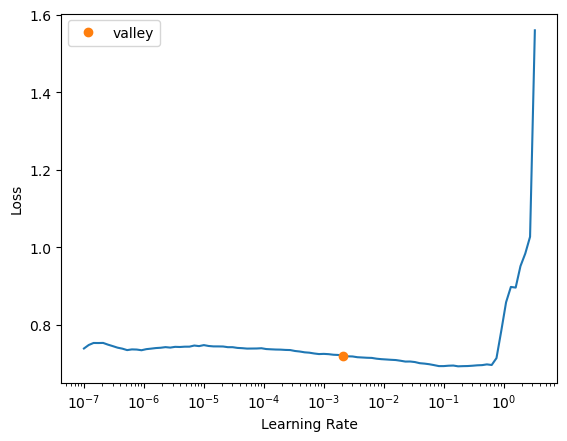

In [92]:
learn.lr_find()

In [26]:
learn.fit_one_cycle(100,0.0021, div=55e4, pct_start=0.15)

epoch,train_loss,valid_loss,mse_loss,l1_loss,time
0,6.447376,6.329398,6.329398,2.325743,00:01
1,5.904449,5.775294,5.775294,2.314026,00:01
2,5.458238,5.388214,5.388214,2.241331,00:01
3,4.848964,4.545224,4.545224,2.043746,00:01
4,3.157799,2.352494,2.352494,1.404897,00:01
5,1.044434,0.538273,0.538273,0.448374,00:01
6,0.355400,0.369172,0.369172,0.294632,00:01
7,0.312046,0.363883,0.363883,0.226280,00:01
8,0.296729,0.353384,0.353384,0.228967,00:01
9,0.301868,0.336141,0.336141,0.196586,00:01


In [32]:
learn.save('learner_satisfaccion_celus')

Path('models/learner_satisfaccion_celus.pth')

In [33]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=64) # apply transforms
preds,  _ = learn.get_preds(dl=dl) # get prediction

In [34]:
mean_absolute_error(preds,y_test)

0.17292911576600473

### Con SVM

In [35]:
regr = SVR(C=1.0)

In [36]:
cv_regr = cross_val_score(regr, X_train, y_train, cv=10, scoring="neg_mean_squared_error")

In [37]:
np.mean(np.abs(cv_regr))

1.3101660273818447

In [38]:
regr.fit(X_train, y_train)

SVR()

In [39]:
y_test_pred = regr.predict(X_test)

In [40]:
mean_absolute_error(y_test_pred, y_test)

0.7465485868703999

### Con N-vecinos

In [41]:
nr = KNeighborsRegressor(n_neighbors=6, weights='distance')

In [42]:
cv_nr = cross_val_score(nr, X_train, y_train, cv=10, scoring="neg_mean_squared_error")

In [43]:
np.mean(np.abs(cv_nr))

0.9307731159904895

In [44]:
nr.fit(X_train, y_train)

KNeighborsRegressor(n_neighbors=6, weights='distance')

In [45]:
y_test_prednn = nr.predict(X_test)

In [46]:
mean_absolute_error(y_test_prednn, y_test)

0.6516384796386989

### Random Forest

In [47]:
rf = RandomForestRegressor(random_state=18)

In [48]:
cv_rf = cross_val_score(rf, X_train, y_train, cv=10, scoring="neg_mean_squared_error")

In [49]:
np.mean(np.abs(cv_rf))

0.3257818158474948

In [50]:
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=18)

In [51]:
y_test_predrf = rf.predict(X_test)

In [52]:
mean_absolute_error(y_test_predrf, y_test)

0.16063702207972816

### Ensamble

#### Votacion

In [82]:
vot = VotingRegressor(
    estimators=[('svr', clone(regr)), ('rf', clone(rf)), ('nr', clone(nr))]
)

In [83]:
vot_cv =  cross_val_score(vot, X_train, y_train, cv=10, scoring="neg_mean_squared_error")

In [84]:
np.mean(np.abs(vot_cv))

0.5915206528312884

In [85]:
vot.fit(X_train, y_train)

VotingRegressor(estimators=[('svr', SVR()),
                            ('rf', RandomForestRegressor(random_state=18)),
                            ('nr',
                             KNeighborsRegressor(n_neighbors=6,
                                                 weights='distance'))])

In [103]:
y_test_predvot = vot.predict(X_test)

In [104]:
mean_absolute_error(y_test_predvot, y_test)

0.49305316085827905

#### Bagging

In [88]:
bag = BaggingRegressor(
    base_estimator=clone(rf)
)

In [89]:
bag_cv =  cross_val_score(vot, X_train, y_train, cv=10, scoring="neg_mean_squared_error")

In [90]:
np.mean(np.abs(bag_cv))

0.5915206528312884

In [91]:
bag.fit(X_train, y_train)

BaggingRegressor(base_estimator=RandomForestRegressor(random_state=18))

In [106]:
y_test_predbag = bag.predict(X_test)

In [107]:
mean_absolute_error(y_test_predbag, y_test)

0.16201289947398664

#### Boost

In [94]:
boost = AdaBoostRegressor(clone(rf)
)

In [192]:
boost_cv =  cross_val_score(boost, X_train, y_train, cv=10, scoring="neg_mean_squared_error")

In [193]:
np.mean(np.abs(boost_cv))

0.2256792799642798

In [97]:
boost.fit(X_train, y_train)

AdaBoostRegressor(base_estimator=RandomForestRegressor(random_state=18))

In [102]:
y_test_predboost = boost.predict(X_test)

In [108]:
mean_absolute_error(y_test_predboost, y_test)

0.18035125485277584


# Computadora, detalles

# De escritorio

### Con RN

In [115]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [116]:
y_names = ["P4_2_1"]

In [117]:
# Filtrado de datos, solo aquellos que tengan al menos un celular
train_df = endutih21[(endutih21.compu==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_2_1
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,2
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,1
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,1
8,101083,1,1,0,1,1,0,1,0,3,...,1,2,1,1,1,1,1,1,6,2
9,101083,1,0,0,1,1,1,1,0,3,...,1,3,1,1,1,1,1,1,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58128,3260730,1,1,1,1,1,0,0,1,1,...,4,2,2,1,1,1,1,1,6,2
58140,3260770,1,1,1,1,1,1,0,1,2,...,4,3,1,1,1,1,0,0,4,2
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,2
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,2


In [118]:
train_df[y_names] = abs(train_df[y_names]-2)
train_df[y_names].value_counts()

P4_2_1
0         17449
1          7716
dtype: int64

In [119]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=0)

In [120]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [121]:
train_df[y_names].value_counts()

P4_2_1
0         14799
1          6591
dtype: int64

In [124]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing,ft.Normalize],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       device="cpu",
                       bs=1024
                    )

In [125]:
study = optuna.create_study()
study.optimize(objective_clas, n_trials=23)

[I 2023-02-19 12:06:02,672] A new study created in memory with name: no-name-fecd1c86-3db9-45bd-b6a4-a31d39db11a2


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.663265,0.622979,0.646096,0.646096,0.638391,0.641938,00:00
1,0.628330,0.631077,0.651706,0.651706,0.646820,0.649134,00:00
2,0.614689,0.599443,0.701496,0.701496,0.634617,0.593647,00:00
3,0.607253,0.613921,0.652408,0.652408,0.643054,0.647252,00:00
4,0.602276,0.591863,0.698925,0.698925,0.634716,0.609828,00:00
5,0.598422,0.589888,0.700561,0.700561,0.596495,0.583168,00:00
6,0.596251,0.592863,0.702665,0.702665,0.493738,0.579959,00:00
7,0.594593,0.591675,0.701262,0.701262,0.632357,0.593136,00:00
8,0.593332,0.593160,0.700795,0.700795,0.588420,0.582030,00:00
9,0.592275,0.594203,0.701262,0.701262,0.493444,0.579278,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
[I 2023-02-19 12:07:16,003] Trial 0 finished with value: 0.3852267265319824 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 57, 'n_neuronas_layer1': 137, 'n_neuronas_layer2': 57, 'n_neuronas_layer3': 124, 'n_neuronas_layer4': 239, 'n_neuronas_layer5': 241, 'bn_final': True, 'embed_p': 0.4718407854715672, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 116, 'lr': 0.06995981713318594, 'pct_start': 0.4977989308754265, 'div_final': 77003, 'div': 0.5256306338631164}. Best is trial 0 with value: 0.3852267265319824.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,3.384509,2806.123291,0.375643,0.375643,0.610265,0.329721,00:01
1,2.021433,11.418709,0.308555,0.308555,0.556479,0.177471,00:01
2,1.518916,1.354584,0.702665,0.702665,0.493738,0.579959,00:01
3,1.292352,18.357494,0.297569,0.297569,0.791094,0.136784,00:01
4,1.336415,3.488572,0.297569,0.297569,0.791094,0.136784,00:01
5,2.459840,2.192135,0.413511,0.413511,0.661701,0.380878,00:01
6,5.709087,47.630497,0.616643,0.616643,0.612447,0.614475,00:01
7,6.522152,9.761939,0.702665,0.702665,0.493738,0.579959,00:01
8,5.233420,1.883098,0.702665,0.702665,0.493738,0.579959,00:01
9,4.015430,0.829287,0.700795,0.700795,0.493346,0.579051,00:01


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.683468,0.665735,0.568256,0.568256,0.636909,0.586586,00:00
1,0.643862,0.612766,0.675316,0.675316,0.622978,0.630719,00:00
2,0.622853,0.607643,0.688640,0.688640,0.631920,0.630514,00:00
3,0.611207,0.609192,0.702665,0.702665,0.642672,0.581682,00:00
4,0.603587,0.603043,0.687237,0.687237,0.622768,0.620963,00:00
5,0.598227,0.594143,0.695185,0.695185,0.614105,0.599593,00:00
6,0.594437,0.599456,0.694016,0.694016,0.616704,0.603960,00:00
7,0.591096,0.600608,0.692146,0.692146,0.628497,0.620462,00:00
8,0.587300,0.601090,0.692847,0.692847,0.613371,0.603268,00:00
9,0.584483,0.602116,0.701262,0.701262,0.631087,0.591976,00:00


[I 2023-02-19 12:10:31,378] Trial 2 finished with value: 0.3910706043243408 and parameters: {'n_layers': 12, 'n_neuronas_layer0': 111, 'n_neuronas_layer1': 105, 'n_neuronas_layer2': 231, 'n_neuronas_layer3': 168, 'n_neuronas_layer4': 37, 'n_neuronas_layer5': 124, 'n_neuronas_layer6': 112, 'n_neuronas_layer7': 255, 'n_neuronas_layer8': 204, 'n_neuronas_layer9': 149, 'n_neuronas_layer10': 107, 'n_neuronas_layer11': 121, 'bn_final': True, 'embed_p': 0.26812984154057623, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 164, 'lr': 0.012562557424212726, 'pct_start': 0.08009556657133075, 'div_final': 286419, 'div': 0.12866947899972495}. Best is trial 1 with value: 0.2992052435874939.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.748994,6.759967,0.406966,0.406966,0.641709,0.376246,00:00
1,0.680755,1.249774,0.597008,0.597008,0.628152,0.608921,00:00
2,0.655568,0.601329,0.699158,0.699158,0.613959,0.590465,00:00
3,0.636634,0.599258,0.694483,0.694483,0.624970,0.611227,00:00
4,0.623031,0.594675,0.701730,0.701730,0.624564,0.585414,00:00
5,0.613523,0.592058,0.700795,0.700795,0.623191,0.589374,00:00
6,0.605537,0.598490,0.701730,0.701730,0.620074,0.584172,00:00
7,0.600890,0.593386,0.702665,0.702665,0.493738,0.579959,00:00
8,0.597958,0.596296,0.695418,0.695418,0.616273,0.600759,00:00
9,0.595101,0.595553,0.694717,0.694717,0.641943,0.635396,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
[I 2023-02-19 12:11:14,924] Trial 3 finished with value: 0.38826555013656616 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 204, 'n_neuronas_layer1': 60, 'n_neuronas_layer2': 133, 'n_neuronas_layer3': 46, 'n_neuronas_layer4': 168, 'n_neuronas_layer5': 67, 'n_neuronas_layer6': 46, 'n_neuronas_layer7': 208, 'bn_final': False, 'embed_p': 0.8132561899262217, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 93, 'lr': 0.046022494438859335, 'pct_start': 0.06658643085673865, 'div_final': 113076, 'div': 0.10189813518206352}. Best is trial 1 with value: 0.2992052435874939.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.632414,0.935322,0.659187,0.659187,0.623900,0.634581,00:00
1,0.614651,0.642291,0.651239,0.651239,0.633633,0.640777,00:00
2,0.605674,0.597963,0.687938,0.687938,0.634818,0.635238,00:00
3,0.600959,0.592570,0.695418,0.695418,0.636176,0.624226,00:00
4,0.597923,0.588895,0.703132,0.703132,0.664276,0.583615,00:00
5,0.596294,0.591172,0.699392,0.699392,0.577278,0.582165,00:00
6,0.594927,0.590304,0.701029,0.701029,0.636469,0.600096,00:00
7,0.593489,0.590325,0.702665,0.702665,0.643411,0.586302,00:00
8,0.593261,0.590708,0.702431,0.702431,0.621318,0.581139,00:00
9,0.592443,0.592875,0.691912,0.691912,0.616438,0.607490,00:00


[I 2023-02-19 12:12:22,990] Trial 4 finished with value: 0.38686299324035645 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 54, 'n_neuronas_layer1': 43, 'n_neuronas_layer2': 202, 'n_neuronas_layer3': 230, 'n_neuronas_layer4': 94, 'n_neuronas_layer5': 112, 'bn_final': True, 'embed_p': 0.5655572507587809, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 135, 'lr': 0.0701096026378905, 'pct_start': 0.033520736509434296, 'div_final': 971524, 'div': 0.511554042727609}. Best is trial 1 with value: 0.2992052435874939.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.651664,0.647306,0.619916,0.619916,0.617149,0.618501,00:00
1,0.635952,0.643492,0.628331,0.628331,0.621033,0.624450,00:00
2,0.624221,0.589080,0.700561,0.700561,0.539174,0.579795,00:00
3,0.616166,0.593806,0.693081,0.693081,0.635645,0.628676,00:00
4,0.611274,0.586648,0.702431,0.702431,0.493689,0.579846,00:00
5,0.607182,0.588951,0.701730,0.701730,0.605443,0.582072,00:00
6,0.603115,0.589253,0.701029,0.701029,0.628555,0.591462,00:00
7,0.601219,0.589565,0.701964,0.701964,0.592903,0.580910,00:00
8,0.600703,0.586581,0.702899,0.702899,0.791188,0.580506,00:00
9,0.599608,0.590476,0.702665,0.702665,0.493738,0.579959,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,9.506964,12.182708,0.635577,0.635577,0.594022,0.608228,00:00
1,6.612960,3.854639,0.688406,0.688406,0.601062,0.599989,00:00
2,4.431479,1.103420,0.564984,0.564984,0.565476,0.565229,00:00
3,3.078737,0.788264,0.489949,0.489949,0.638295,0.501009,00:00
4,2.281019,0.623312,0.702665,0.702665,0.493738,0.579959,00:00
5,1.785192,0.602340,0.699860,0.699860,0.624637,0.594280,00:00
6,1.440020,0.616530,0.702665,0.702665,0.493738,0.579959,00:00
7,1.198807,0.604172,0.702665,0.702665,0.493738,0.579959,00:00
8,1.029076,0.601835,0.701029,0.701029,0.493395,0.579165,00:00
9,0.908547,0.592302,0.701029,0.701029,0.597351,0.582566,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.635576,0.975210,0.631837,0.631837,0.643267,0.636951,00:00
1,0.615466,0.742816,0.584385,0.584385,0.654656,0.602102,00:00
2,0.606491,0.589371,0.702197,0.702197,0.629461,0.583989,00:00
3,0.601392,0.595871,0.688406,0.688406,0.637981,0.638997,00:00
4,0.598643,0.587696,0.701496,0.701496,0.610443,0.583219,00:00
5,0.596616,0.588537,0.699860,0.699860,0.593064,0.583642,00:00
6,0.594621,0.589766,0.700561,0.700561,0.619184,0.588458,00:00
7,0.593052,0.589996,0.700094,0.700094,0.586077,0.582517,00:00
8,0.592318,0.592904,0.702899,0.702899,0.651801,0.583921,00:00
9,0.591622,0.589646,0.700795,0.700795,0.628171,0.592499,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
[I 2023-02-19 12:14:55,883] Trial 7 finished with value: 0.37891536951065063 and parameters: {

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.682485,1.541841,0.699860,0.699860,0.567884,0.581145,00:00
1,0.656347,0.699979,0.676017,0.676017,0.635333,0.643602,00:00
2,0.639048,0.604127,0.696120,0.696120,0.646956,0.641199,00:00
3,0.626123,0.593278,0.701964,0.701964,0.608284,0.581764,00:00
4,0.616418,0.599190,0.699158,0.699158,0.585293,0.583287,00:00
5,0.608667,0.588905,0.702665,0.702665,0.642472,0.580392,00:00
6,0.603115,0.601481,0.701496,0.701496,0.634277,0.593262,00:00
7,0.599668,0.598452,0.693315,0.693315,0.640107,0.635133,00:00
8,0.598187,0.592039,0.702665,0.702665,0.493738,0.579959,00:00
9,0.596494,0.603013,0.686770,0.686770,0.619643,0.618040,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
[I 2023-02-19 12:15:19,671] Trial 8 finished with value: 0.36208510398864746 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 171, 'n_neuronas_layer1': 98, 'n_neuronas_layer2': 221, 'n_neuronas_layer3': 161, 'bn_final': False, 'embed_p': 0.5923883595031573, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 56, 'lr': 0.0977405684791661, 'pct_start': 0.6776657845719942, 'div_final': 547258, 'div

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.650768,0.658927,0.698925,0.698925,0.624089,0.597464,00:00
1,0.620682,0.682136,0.643993,0.643993,0.640522,0.642196,00:00
2,0.609043,0.601945,0.699626,0.699626,0.618829,0.591487,00:00
3,0.602069,0.628186,0.660823,0.660823,0.634644,0.643675,00:00
4,0.597867,0.598572,0.693782,0.693782,0.626569,0.614702,00:00
5,0.595514,0.596992,0.701029,0.701029,0.634392,0.597166,00:00
6,0.593219,0.605866,0.692380,0.692380,0.614059,0.604610,00:00
7,0.590955,0.591248,0.702431,0.702431,0.493689,0.579846,00:00
8,0.589825,0.592980,0.696120,0.696120,0.620685,0.602867,00:00
9,0.588866,0.599589,0.690977,0.690977,0.629581,0.623952,00:00


[I 2023-02-19 12:15:34,143] Trial 9 finished with value: 0.311126708984375 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 242, 'n_neuronas_layer1': 47, 'n_neuronas_layer2': 248, 'n_neuronas_layer3': 173, 'n_neuronas_layer4': 156, 'n_neuronas_layer5': 178, 'n_neuronas_layer6': 101, 'n_neuronas_layer7': 35, 'bn_final': False, 'embed_p': 0.6819502672604799, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 24, 'lr': 0.09778573230734287, 'pct_start': 0.8937893700550202, 'div_final': 864510, 'div': 0.8187880184464985}. Best is trial 1 with value: 0.2992052435874939.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,78.814255,995367.562500,0.702665,0.702665,0.493738,0.579959,00:00
1,61.056870,18436.048828,0.680692,0.680692,0.563886,0.585510,00:00
2,49.030483,23.588881,0.313698,0.313698,0.632525,0.180722,00:00
3,34.614567,52232.121094,0.694483,0.694483,0.539188,0.579289,00:00
4,25.335831,12.429585,0.702431,0.702431,0.493689,0.579846,00:00
5,20.343601,2.150219,0.702431,0.702431,0.493689,0.579846,00:00
6,15.253098,5.287431,0.702665,0.702665,0.493738,0.579959,00:00
7,11.506818,5.897729,0.297803,0.297803,0.791114,0.137276,00:00
8,8.651030,0.602826,0.700561,0.700561,0.625212,0.591601,00:00
9,6.430912,1.000525,0.702665,0.702665,0.493738,0.579959,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,50.904919,25689990.000000,0.702665,0.702665,0.493738,0.579959,00:00
1,43.625263,1946941.500000,0.670874,0.670874,0.595833,0.607174,00:00
2,31.457024,23814936.000000,0.694717,0.694717,0.567534,0.583036,00:00
3,22.527155,1110769795072.000000,0.702665,0.702665,0.493738,0.579959,00:00
4,17.053226,325935071232.000000,0.700561,0.700561,0.539174,0.579795,00:00
5,12.548777,3146895327232.000000,0.701262,0.701262,0.626505,0.588824,00:00
6,9.212811,80512399966208.000000,0.303647,0.303647,0.539184,0.162603,00:00
7,6.965831,1171740898099200.000000,0.673212,0.673212,0.596626,0.606884,00:00
8,5.273502,0.981394,0.692380,0.692380,0.569093,0.584168,00:00
9,4.028983,19012247355392.000000,0.675082,0.675082,0.583314,0.596650,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.661303,0.628887,0.690510,0.690510,0.622286,0.615802,00:00
1,0.631142,0.603880,0.675549,0.675549,0.627760,0.635703,00:00
2,0.613729,0.605420,0.682328,0.682328,0.624337,0.627784,00:00
3,0.605299,0.612899,0.672744,0.672744,0.613549,0.622271,00:00
4,0.598103,0.600026,0.686068,0.686068,0.609617,0.608992,00:00
5,0.592197,0.602600,0.688640,0.688640,0.615548,0.611472,00:00
6,0.586877,0.607652,0.681861,0.681861,0.605491,0.609181,00:00
7,0.582452,0.616265,0.671809,0.671809,0.629939,0.639141,00:00
8,0.578441,0.615393,0.674848,0.674848,0.606976,0.615000,00:00
9,0.574602,0.625233,0.675082,0.675082,0.621571,0.629348,00:00


[I 2023-02-19 12:24:36,435] Trial 12 finished with value: 0.3775128722190857 and parameters: {'n_layers': 10, 'n_neuronas_layer0': 116, 'n_neuronas_layer1': 193, 'n_neuronas_layer2': 89, 'n_neuronas_layer3': 207, 'n_neuronas_layer4': 210, 'n_neuronas_layer5': 200, 'n_neuronas_layer6': 242, 'n_neuronas_layer7': 123, 'n_neuronas_layer8': 72, 'n_neuronas_layer9': 32, 'bn_final': False, 'embed_p': 0.05603512649165365, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 242, 'lr': 0.0014645886672136066, 'pct_start': 0.5829964053836674, 'div_final': 699567, 'div': 0.3265040457043598}. Best is trial 1 with value: 0.2992052435874939.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,128.081985,645837.125000,0.702665,0.702665,0.493738,0.579959,00:01
1,77.114487,9270.096680,0.423095,0.423095,0.559884,0.434751,00:01
2,56.245911,5.011208,0.480832,0.480832,0.598134,0.498817,00:01
3,44.265247,48.576092,0.654511,0.654511,0.585153,0.602134,00:01
4,34.719536,8.890781,0.702665,0.702665,0.493738,0.579959,00:01
5,28.159376,10.423265,0.702431,0.702431,0.493689,0.579846,00:01
6,23.968946,22.542557,0.702665,0.702665,0.493738,0.579959,00:01
7,20.032022,51.189331,0.702665,0.702665,0.493738,0.579959,00:01
8,17.939423,52.110222,0.301777,0.301777,0.730310,0.146387,00:01
9,14.792350,22651550.000000,0.297335,0.297335,0.088408,0.136292,00:01


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.664407,1.080307,0.661290,0.661290,0.605661,0.618221,00:00
1,0.631620,1.608039,0.698691,0.698691,0.583665,0.583459,00:00
2,0.617797,0.607028,0.700327,0.700327,0.623986,0.591863,00:00
3,0.609280,0.695928,0.650771,0.650771,0.631997,0.639512,00:00
4,0.604040,0.611391,0.669705,0.669705,0.633203,0.642678,00:00
5,0.600250,0.595109,0.692380,0.692380,0.627891,0.619238,00:00
6,0.597224,0.601960,0.677653,0.677653,0.634450,0.642101,00:00
7,0.594372,0.606323,0.666900,0.666900,0.628883,0.638869,00:00
8,0.592210,0.594094,0.695886,0.695886,0.624602,0.607354,00:00
9,0.591154,0.600653,0.702197,0.702197,0.640166,0.593253,00:00


[I 2023-02-19 12:30:32,876] Trial 14 finished with value: 0.3793829083442688 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 153, 'n_neuronas_layer1': 255, 'n_neuronas_layer2': 32, 'n_neuronas_layer3': 132, 'n_neuronas_layer4': 254, 'n_neuronas_layer5': 173, 'n_neuronas_layer6': 187, 'n_neuronas_layer7': 176, 'n_neuronas_layer8': 144, 'n_neuronas_layer9': 125, 'n_neuronas_layer10': 242, 'n_neuronas_layer11': 249, 'n_neuronas_layer12': 61, 'bn_final': False, 'embed_p': 0.7329116390053553, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 71, 'lr': 0.031283224885542166, 'pct_start': 0.33289663317033935, 'div_final': 804541, 'div': 0.2748620380433667}. Best is trial 1 with value: 0.2992052435874939.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,67.329033,39082.269531,0.698223,0.698223,0.550754,0.580332,00:00
1,37.236107,28042788.000000,0.353904,0.353904,0.575081,0.298359,00:00
2,32.717491,6714.716309,0.682796,0.682796,0.529281,0.576091,00:00
3,25.154184,12.316904,0.688406,0.688406,0.540726,0.578992,00:00
4,18.552347,36.322979,0.700795,0.700795,0.523146,0.579481,00:00
5,14.577815,5.177487,0.303179,0.303179,0.691071,0.150482,00:00
6,11.444694,6.176723,0.701730,0.701730,0.543165,0.579937,00:00
7,8.996117,1.811530,0.298504,0.298504,0.791176,0.138749,00:00
8,7.327513,0.623336,0.699392,0.699392,0.599497,0.585444,00:00
9,6.129810,3.544162,0.701964,0.701964,0.493591,0.579619,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.684114,0.669432,0.587658,0.587658,0.654775,0.605115,00:00
1,0.668985,0.656736,0.596774,0.596774,0.654305,0.613219,00:00
2,0.659421,0.649976,0.594437,0.594437,0.651064,0.610884,00:00
3,0.651878,0.643341,0.607761,0.607761,0.645658,0.621009,00:00
4,0.645102,0.639937,0.616176,0.616176,0.648118,0.627915,00:00
5,0.638985,0.631834,0.631136,0.631136,0.646031,0.637569,00:00
6,0.633408,0.629014,0.638149,0.638149,0.645375,0.641510,00:00
7,0.628659,0.626167,0.642590,0.642590,0.644779,0.643661,00:00
8,0.623777,0.626705,0.641655,0.641655,0.639623,0.640619,00:00
9,0.620046,0.628388,0.638149,0.638149,0.638313,0.638231,00:00


[I 2023-02-19 12:32:47,617] Trial 16 finished with value: 0.33450210094451904 and parameters: {'n_layers': 11, 'n_neuronas_layer0': 143, 'n_neuronas_layer1': 163, 'n_neuronas_layer2': 125, 'n_neuronas_layer3': 202, 'n_neuronas_layer4': 108, 'n_neuronas_layer5': 158, 'n_neuronas_layer6': 248, 'n_neuronas_layer7': 168, 'n_neuronas_layer8': 110, 'n_neuronas_layer9': 207, 'n_neuronas_layer10': 42, 'bn_final': False, 'embed_p': 0.8015072390653296, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 23, 'lr': 0.00022012168574932905, 'pct_start': 0.3746989266621149, 'div_final': 430263, 'div': 0.3909977692201987}. Best is trial 1 with value: 0.2992052435874939.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.652166,5.290210,0.481533,0.481533,0.632256,0.491723,00:00
1,0.629420,1.238278,0.473586,0.473586,0.645174,0.477664,00:00
2,0.617385,0.611125,0.677653,0.677653,0.630860,0.638158,00:00
3,0.609993,0.611017,0.702665,0.702665,0.493738,0.579959,00:00
4,0.607973,0.612209,0.702665,0.702665,0.493738,0.579959,00:00
5,0.606275,0.601407,0.677653,0.677653,0.632514,0.639980,00:00
6,0.601297,0.595170,0.695185,0.695185,0.636380,0.625149,00:00
7,0.597869,0.595956,0.699860,0.699860,0.632407,0.601929,00:00
8,0.595920,0.589348,0.701964,0.701964,0.627750,0.585120,00:00
9,0.594129,0.598718,0.689575,0.689575,0.627547,0.623539,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.648623,2609.779297,0.701964,0.701964,0.493591,0.579619,00:00
1,0.626814,1.141337,0.646798,0.646798,0.553638,0.580993,00:00
2,0.617272,0.627913,0.687237,0.687237,0.616313,0.613993,00:00
3,0.610150,0.594421,0.702431,0.702431,0.493689,0.579846,00:00
4,0.606183,0.594717,0.702431,0.702431,0.493689,0.579846,00:00
5,0.603131,0.587606,0.702665,0.702665,0.493738,0.579959,00:00
6,0.600703,0.588202,0.702665,0.702665,0.493738,0.579959,00:00
7,0.598566,0.589330,0.702665,0.702665,0.493738,0.579959,00:00
8,0.596854,0.588901,0.702665,0.702665,0.493738,0.579959,00:00
9,0.595974,0.591487,0.702665,0.702665,0.493738,0.579959,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.667074,0.615699,0.661524,0.661524,0.631840,0.641463,00:00
1,0.629609,0.609404,0.665965,0.665965,0.627879,0.638012,00:00
2,0.614763,0.596062,0.694483,0.694483,0.632805,0.621428,00:00
3,0.607559,0.601742,0.677653,0.677653,0.628469,0.635522,00:00
4,0.602605,0.590139,0.696587,0.696587,0.626157,0.607125,00:00
5,0.599896,0.590592,0.701964,0.701964,0.553125,0.580051,00:00
6,0.597749,0.598100,0.690042,0.690042,0.635215,0.633106,00:00
7,0.596474,0.596138,0.702431,0.702431,0.638566,0.586183,00:00
8,0.596107,0.591792,0.701262,0.701262,0.632742,0.593520,00:00
9,0.596938,0.611151,0.681159,0.681159,0.613561,0.617206,00:00


[I 2023-02-19 12:36:21,593] Trial 19 finished with value: 0.3896680474281311 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 162, 'n_neuronas_layer1': 165, 'n_neuronas_layer2': 171, 'n_neuronas_layer3': 187, 'n_neuronas_layer4': 130, 'n_neuronas_layer5': 207, 'n_neuronas_layer6': 224, 'n_neuronas_layer7': 208, 'n_neuronas_layer8': 85, 'bn_final': False, 'embed_p': 0.1506709995197062, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 86, 'lr': 0.020330783367267864, 'pct_start': 0.430969366988154, 'div_final': 370535, 'div': 0.3869304622936789}. Best is trial 1 with value: 0.2992052435874939.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.697278,37.979183,0.297569,0.297569,0.471559,0.138821,00:00
1,0.660755,2.607194,0.694717,0.694717,0.609374,0.597236,00:00
2,0.643924,0.635749,0.677419,0.677419,0.631111,0.638539,00:00
3,0.636052,0.608539,0.690977,0.690977,0.624894,0.618057,00:00
4,0.621956,0.613972,0.652641,0.652641,0.631748,0.639837,00:00
5,0.611817,0.594207,0.702665,0.702665,0.493738,0.579959,00:00
6,0.605607,0.595173,0.702665,0.702665,0.493738,0.579959,00:00
7,0.601133,0.599369,0.700094,0.700094,0.632678,0.601000,00:00
8,0.597879,0.596189,0.693782,0.693782,0.621461,0.608940,00:00
9,0.595408,0.595856,0.702665,0.702665,0.493738,0.579959,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,18.029064,29628.253906,0.328191,0.328191,0.624874,0.218859,00:00
1,10.233804,3952.576904,0.656615,0.656615,0.598127,0.612345,00:00
2,7.305367,15972.089844,0.702197,0.702197,0.568040,0.580164,00:00
3,5.542643,12624.270508,0.701029,0.701029,0.526499,0.579595,00:00
4,4.586339,4.937484,0.702431,0.702431,0.592867,0.580278,00:00
5,3.734396,1.198694,0.702197,0.702197,0.493640,0.579732,00:00
6,3.007836,5.374948,0.297803,0.297803,0.791114,0.137276,00:00
7,2.386557,2021464473600.000000,0.297569,0.297569,0.791094,0.136784,00:00
8,1.909534,0.642980,0.703132,0.703132,0.717037,0.581483,00:00
9,1.551528,0.680565,0.702665,0.702665,0.493738,0.579959,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,3.227802,3032.925537,0.702665,0.702665,0.493738,0.579959,00:00
1,1.995918,167.708893,0.361618,0.361618,0.571415,0.317783,00:00
2,1.505874,4255.176270,0.701496,0.701496,0.536036,0.579823,00:00
3,1.257660,377662.812500,0.700094,0.700094,0.532977,0.579567,00:00
4,1.077775,903.469849,0.691211,0.691211,0.612206,0.604867,00:00
5,0.980511,1787248.875000,0.702899,0.702899,0.672388,0.581368,00:00
6,0.895905,1752820096.000000,0.696120,0.696120,0.567630,0.582555,00:00
7,0.822128,62388776960.000000,0.681393,0.681393,0.590915,0.598653,00:00
8,0.769763,562139278344192.000000,0.698691,0.698691,0.540744,0.579725,00:00
9,0.731829,272278609916329984.000000,0.677419,0.677419,0.600556,0.607994,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

In [126]:
study.best_value

0.2992052435874939

In [127]:
study.best_params

{'n_layers': 9,
 'n_neuronas_layer0': 106,
 'n_neuronas_layer1': 170,
 'n_neuronas_layer2': 38,
 'n_neuronas_layer3': 185,
 'n_neuronas_layer4': 229,
 'n_neuronas_layer5': 222,
 'n_neuronas_layer6': 228,
 'n_neuronas_layer7': 147,
 'n_neuronas_layer8': 109,
 'bn_final': False,
 'embed_p': 0.7034052502902901,
 'idx_act_cls': 2,
 'idx_opt_func': 0,
 'epoch': 42,
 'lr': 0.0587077761682921,
 'pct_start': 0.6249050971524375,
 'div_final': 715168,
 'div': 0.018368719008543588}

In [128]:
learn = ft.tabular_learner(dls,
                           layers = [106,170,38,185,229,222,228,147,109],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.CELU(inplace=True), bn_final=False, embed_p=0.7035),
                           opt_func=ft.ranger,
                           metrics=[ft.accuracy, ft.Recall(average="weighted"), ft.Precision(average="weighted"), ft.F1Score(average="weighted")])

SuggestedLRs(valley=0.0020892962347716093)

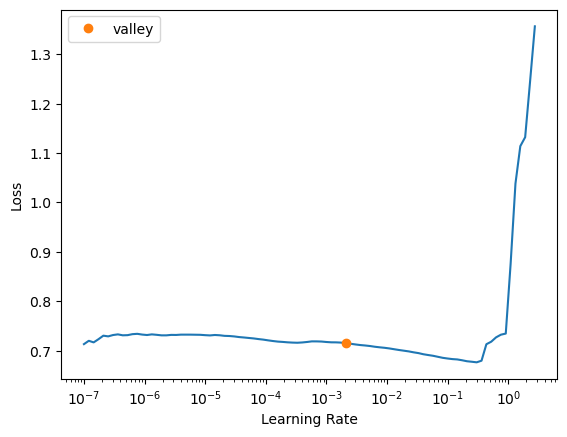

In [129]:
learn.lr_find()

In [130]:
learn.fit_one_cycle(50,0.0587, pct_start=0.6249, div=0.018, div_final=715e3)

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,2.463243,398.694946,0.694016,0.694016,0.528722,0.578235,00:00
1,1.640450,1866.397583,0.297335,0.297335,0.088408,0.136292,00:01
2,1.420224,1.775583,0.702665,0.702665,0.493738,0.579959,00:01
3,1.236937,1.964127,0.700561,0.700561,0.563525,0.580647,00:01
4,1.566780,16.800941,0.461431,0.461431,0.629074,0.465603,00:01
5,2.055541,1.806261,0.702665,0.702665,0.493738,0.579959,00:01
6,2.260141,8.289270,0.701964,0.701964,0.493591,0.579619,00:01
7,4.036866,221.139465,0.471014,0.471014,0.545734,0.493656,00:01
8,5.185486,0.720706,0.464937,0.464937,0.644507,0.465890,00:01
9,4.004058,83.379478,0.702665,0.702665,0.493738,0.579959,00:01


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

In [131]:
learn.save('learner_compu_escritorio')

Path('models/learner_compu_escritorio.pth')

In [144]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [149]:
y_predrn = np.array([0 if i[0]>i[1] else 1 for i in preds])

In [151]:
eval_pred_clas(y_predrn,y_test)

C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


(0.7019867549668874, 0.7019867549668874, 1.0, 0.8249027237354086)

### Con SVM

In [155]:
svm = SVC(C=1.0)

In [157]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

{'fit_time': array([ 8.80491686, 10.00426888,  9.80266738,  8.83009243,  9.27431345,
         9.66598701,  9.40955567,  9.21333838,  9.95006323,  9.6043117 ]),
 'score_time': array([2.00997972, 2.10070395, 2.17971492, 2.14741063, 2.00287557,
        2.45552874, 2.4099102 , 1.91386366, 2.09311104, 2.01905417]),
 'test_accuracy': array([0.69191211, 0.69191211, 0.69191211, 0.69191211, 0.69191211,
        0.69191211, 0.69191211, 0.69191211, 0.69191211, 0.6914446 ]),
 'test_recall_weighted': array([0.69191211, 0.69191211, 0.69191211, 0.69191211, 0.69191211,
        0.69191211, 0.69191211, 0.69191211, 0.69191211, 0.6914446 ]),
 'test_precision_weighted': array([0.47874237, 0.47874237, 0.47874237, 0.47874237, 0.47874237,
        0.47874237, 0.47874237, 0.47874237, 0.47874237, 0.47809564]),
 'test_f1_weighted': array([0.56591872, 0.56591872, 0.56591872, 0.56591872, 0.56591872,
        0.56591872, 0.56591872, 0.56591872, 0.56591872, 0.56531043])}

In [160]:
np.mean(svm_cv["test_accuracy"]), np.mean(svm_cv["test_recall_weighted"]), np.mean(svm_cv["test_precision_weighted"]), np.mean(svm_cv["test_f1_weighted"])

(0.6918653576437588,
 0.6918653576437588,
 0.4786776927782772,
 0.5658578891263459)

In [161]:
svm.fit(X_train,y_train)

SVC()

In [162]:
y_test_pred = svm.predict(X_test)

In [163]:
accuracy_score(y_test, y_test_pred), recall_score(y_test, y_test_pred, average="weighted"), precision_score(y_test, y_test_pred, average="weighted"), f1_score(y_test, y_test_pred, average="weighted")

C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


(0.7019867549668874,
 0.7019867549668874,
 0.49278540414894084,
 0.5790707861983663)

### Con N-vecinos

In [164]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [165]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.00300741, 0.00498462, 0.00398684, 0.00199008, 0.00299001,
        0.00298929, 0.00299048, 0.00498366, 0.00498295, 0.0029881 ]),
 'score_time': array([0.63908792, 0.59715509, 0.58509946, 0.59105206, 0.66374016,
        0.61126018, 0.8015523 , 0.80196428, 0.73506236, 0.63687754]),
 'test_accuracy': array([0.62178588, 0.61664329, 0.63487611, 0.628331  , 0.62131837,
        0.63534362, 0.61757831, 0.62459093, 0.62365591, 0.6287985 ]),
 'test_recall_weighted': array([0.62178588, 0.61664329, 0.63487611, 0.628331  , 0.62131837,
        0.63534362, 0.61757831, 0.62459093, 0.62365591, 0.6287985 ]),
 'test_precision_weighted': array([0.60170448, 0.59062641, 0.60962569, 0.6043973 , 0.59930652,
        0.60526884, 0.59310588, 0.59888616, 0.6013307 , 0.59790766]),
 'test_f1_weighted': array([0.60986596, 0.60076306, 0.61888972, 0.61355084, 0.60808988,
        0.61562988, 0.60274654, 0.60866245, 0.61015137, 0.60879338])}

In [166]:
np.mean(nc_cv["test_accuracy"]), np.mean(nc_cv["test_recall_weighted"]), np.mean(nc_cv["test_precision_weighted"]), np.mean(nc_cv["test_f1_weighted"])

(0.6252921926133708,
 0.6252921926133708,
 0.6002159648644281,
 0.6097143076151299)

In [167]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [168]:
y_test_prednn = nc.predict(X_test)

In [169]:
accuracy_score(y_test, y_test_prednn), recall_score(y_test, y_test_prednn, average="weighted"), precision_score(y_test, y_test_prednn, average="weighted"), f1_score(y_test, y_test_prednn, average="weighted")

(0.632317880794702, 0.632317880794702, 0.6050142818988863, 0.6155635296912155)

### Random Forest

In [154]:
rf = RandomForestClassifier(random_state=18)

In [179]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([1.34843731, 1.44259405, 1.83234119, 1.28411412, 1.26217842,
        1.36130071, 1.32006717, 1.27017784, 1.29941344, 1.30774593]),
 'score_time': array([0.0548172 , 0.08072948, 0.05586743, 0.05282378, 0.05282378,
        0.05282354, 0.05381966, 0.05182672, 0.05282378, 0.05382133]),
 'test_accuracy': array([0.65357644, 0.64796634, 0.66152408, 0.65077139, 0.63394109,
        0.64469378, 0.64188873, 0.64656381, 0.64703132, 0.65778401]),
 'test_recall_weighted': array([0.65357644, 0.64796634, 0.66152408, 0.65077139, 0.63394109,
        0.64469378, 0.64188873, 0.64656381, 0.64703132, 0.65778401]),
 'test_precision_weighted': array([0.61576378, 0.60702772, 0.62610895, 0.61091561, 0.59326168,
        0.60803149, 0.60065125, 0.60996164, 0.60584572, 0.62104668]),
 'test_f1_weighted': array([0.62545789, 0.61781389, 0.63449803, 0.62117577, 0.60582657,
        0.61876551, 0.61234431, 0.62047413, 0.61679878, 0.62994235])}

In [180]:
np.mean(rf_cv["test_accuracy"]), np.mean(rf_cv["test_recall_weighted"]), np.mean(rf_cv["test_precision_weighted"]), np.mean(rf_cv["test_f1_weighted"])

(0.6485741000467509,
 0.6485741000467509,
 0.6098614515935183,
 0.6203097232963701)

In [181]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [182]:
y_test_predrf = rf.predict(X_test)

In [183]:
accuracy_score(y_test, y_test_predrf), recall_score(y_test, y_test_predrf, average="weighted"), precision_score(y_test, y_test_predrf, average="weighted"), f1_score(y_test, y_test_predrf, average="weighted")

(0.6569536423841059,
 0.6569536423841059,
 0.6230582721047476,
 0.6336559283481238)

### Ensamble

#### Votacion

In [186]:
vot = VotingClassifier(
    estimators=[('svr', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [187]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([10.94978046, 11.1654954 , 11.24667835, 10.68248677,  9.89631772,
        10.32737136, 11.05618691, 10.79611778, 11.271878  , 10.48008943]),
 'score_time': array([2.59822607, 2.67003059, 2.66588712, 2.64829659, 3.33447456,
        2.745965  , 2.60031652, 2.91428065, 2.72681403, 2.65894318]),
 'test_accuracy': array([0.67601683, 0.68115942, 0.68957457, 0.67882188, 0.67648434,
        0.67928939, 0.68302945, 0.68723703, 0.68162693, 0.68723703]),
 'test_recall_weighted': array([0.67601683, 0.68115942, 0.68957457, 0.67882188, 0.67648434,
        0.67928939, 0.68302945, 0.68723703, 0.68162693, 0.68723703]),
 'test_precision_weighted': array([0.6013606 , 0.61353679, 0.63538702, 0.60700278, 0.60039029,
        0.60566167, 0.62057668, 0.62935222, 0.61205341, 0.63086299]),
 'test_f1_weighted': array([0.59729061, 0.60225514, 0.61105788, 0.59904898, 0.59583773,
        0.59698668, 0.60740613, 0.60898668, 0.59962796, 0.61038104])}

In [188]:
np.mean(vot_cv["test_accuracy"]), np.mean(vot_cv["test_recall_weighted"]), np.mean(vot_cv["test_precision_weighted"]), np.mean(vot_cv["test_f1_weighted"])

(0.6820476858345021, 0.6820476858345021, 0.6156184456906864, 0.602887881731452)

In [189]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svr', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [190]:
y_test_predvot = vot.predict(X_test)

In [191]:
accuracy_score(y_test, y_test_predvot), recall_score(y_test, y_test_predvot, average="weighted"), precision_score(y_test, y_test_predvot, average="weighted"), f1_score(y_test, y_test_predvot, average="weighted")

(0.6903311258278145,
 0.6903311258278145,
 0.6215336922308893,
 0.6140651624709491)

#### Bagging

In [194]:
bag = BaggingClassifier(
    base_estimator=clone(rf)
)

In [195]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([8.69555449, 9.50809336, 8.63389397, 9.33967757, 9.3891046 ,
        8.62482142, 9.38234639, 8.77732491, 9.4359448 , 9.49076796]),
 'score_time': array([0.46195364, 0.46643996, 0.4614563 , 0.47239661, 0.47645354,
        0.49246812, 0.48459554, 0.4644959 , 0.45647335, 0.45447969]),
 'test_accuracy': array([0.66666667, 0.66666667, 0.67928939, 0.66386162, 0.64609631,
        0.66386162, 0.66573165, 0.6629266 , 0.66432913, 0.67788686]),
 'test_recall_weighted': array([0.66666667, 0.66666667, 0.67928939, 0.66386162, 0.64609631,
        0.66386162, 0.66573165, 0.6629266 , 0.66432913, 0.67788686]),
 'test_precision_weighted': array([0.6151769 , 0.61447078, 0.63382831, 0.61342463, 0.58569106,
        0.61125761, 0.61480901, 0.61167886, 0.61104808, 0.63399265]),
 'test_f1_weighted': array([0.62073334, 0.61993575, 0.63413493, 0.62028915, 0.5989947 ,
        0.61794064, 0.62085307, 0.61884571, 0.61747212, 0.63552509])}

In [196]:
np.mean(bag_cv["test_accuracy"]), np.mean(bag_cv["test_recall_weighted"]), np.mean(bag_cv["test_precision_weighted"]), np.mean(bag_cv["test_f1_weighted"])

(0.6657316503038803,
 0.6657316503038803,
 0.6145377901612432,
 0.6204724500775703)

In [197]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [198]:
y_test_predbag = bag.predict(X_test)

In [199]:
accuracy_score(y_test, y_test_predbag), recall_score(y_test, y_test_predrf, average="weighted"), precision_score(y_test, y_test_predrf, average="weighted"), f1_score(y_test, y_test_predrf, average="weighted")

(0.6744370860927152,
 0.6569536423841059,
 0.6230582721047476,
 0.6336559283481238)

#### Boost

In [155]:
boost = AdaBoostClassifier(clone(rf)
)

In [157]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([90.29406691, 84.11428976, 81.66223764, 80.94794059, 99.62302971,
        87.21302319, 83.80035186, 82.24850869, 81.59970474, 81.8541894 ]),
 'score_time': array([2.79502964, 2.45678186, 2.58561444, 2.51919651, 2.48469067,
        2.50125289, 2.53657889, 2.45026183, 2.85022497, 2.46276164]),
 'test_accuracy': array([0.65544647, 0.65638149, 0.66573165, 0.65684899, 0.63627863,
        0.6517064 , 0.6456288 , 0.66386162, 0.65544647, 0.66713417]),
 'test_recall_weighted': array([0.65544647, 0.65638149, 0.66573165, 0.65684899, 0.63627863,
        0.6517064 , 0.6456288 , 0.66386162, 0.65544647, 0.66713417]),
 'test_precision_weighted': array([0.61180486, 0.61131904, 0.62570081, 0.61072485, 0.58624689,
        0.60722052, 0.59705263, 0.62200546, 0.60935123, 0.62559678]),
 'test_f1_weighted': array([0.62138085, 0.62070171, 0.63300963, 0.61999721, 0.60013945,
        0.61761143, 0.60901065, 0.62963171, 0.61897212, 0.63217613])}

In [160]:
eval_cv_clas(boost_cv)

(0.6554464703132303,
 0.6554464703132303,
 0.6107023076323718,
 0.6202630883942677)

In [161]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [162]:
y_test_predboost = boost.predict(X_test)

In [163]:
eval_pred_clas(y_test_predboost,y_test)

(0.6686092715231788,
 0.6686092715231788,
 0.7457364288391853,
 0.6989548049016016)

# Portátil

### Con RN

In [179]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [180]:
y_names = ["P4_2_2"]

In [181]:
# Filtrado de datos, solo aquellos que tengan al menos un celular
train_df = endutih21[(endutih21.compu==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_2_2
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,1
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,2
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,1
8,101083,1,1,0,1,1,0,1,0,3,...,1,2,1,1,1,1,1,1,6,2
9,101083,1,0,0,1,1,1,1,0,3,...,1,3,1,1,1,1,1,1,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58128,3260730,1,1,1,1,1,0,0,1,1,...,4,2,2,1,1,1,1,1,6,1
58140,3260770,1,1,1,1,1,1,0,1,2,...,4,3,1,1,1,1,0,0,4,1
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,1
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,1


In [182]:
train_df[y_names].value_counts()

P4_2_2
1         18823
2          6342
dtype: int64

In [183]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=18)

In [184]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [185]:
train_df[y_names].value_counts()

P4_2_2
1         14084
2          4789
dtype: int64

In [186]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cpu"
                       )

In [187]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-19 13:32:16,989] A new study created in memory with name: no-name-758f359d-35cf-43b5-87d3-cf81b2f3acc2
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if sys.platform == "win32" and x.dtype==np.int: x = x.astype(np.int64)
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When repla

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.889365,2.424618,0.739534,0.739534,0.671055,0.657828,00:00
1,0.725048,0.648804,0.737944,0.737944,0.658900,0.651034,00:00
2,0.662932,0.633649,0.729995,0.729995,0.644742,0.651778,00:00
3,0.631216,0.584419,0.736089,0.736089,0.654845,0.651553,00:00
4,0.611386,0.571112,0.743508,0.743508,0.655831,0.635343,00:00
5,0.597393,0.561162,0.744038,0.744038,0.687233,0.641832,00:00
6,0.587966,0.560917,0.743243,0.743243,0.669268,0.638597,00:00
7,0.580713,0.564901,0.728935,0.728935,0.634494,0.646637,00:00
8,0.575255,0.559617,0.743773,0.743773,0.682375,0.639818,00:00
9,0.571581,0.559951,0.743773,0.743773,0.682181,0.638867,00:00


[I 2023-02-19 13:32:33,718] Trial 0 finished with value: 0.28510862588882446 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 236, 'n_neuronas_layer1': 62, 'n_neuronas_layer2': 150, 'n_neuronas_layer3': 242, 'n_neuronas_layer4': 80, 'bn_final': False, 'embed_p': 0.715035823053211, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 40, 'lr': 0.05169766759537719, 'pct_start': 0.2162655831551682, 'div_final': 27426, 'div': 0.5157467842292328}. Best is trial 0 with value: 0.28510862588882446.
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://num

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.695346,1.003378,0.743773,0.743773,0.553199,0.634485,00:00
1,0.642279,1.010958,0.743773,0.743773,0.553199,0.634485,00:00
2,0.612773,0.705643,0.743773,0.743773,0.553199,0.634485,00:00
3,0.595918,0.645095,0.743773,0.743773,0.553199,0.634485,00:00
4,0.586009,0.616131,0.743773,0.743773,0.553199,0.634485,00:00
5,0.579803,0.590558,0.743773,0.743773,0.553199,0.634485,00:00
6,0.575142,0.589541,0.743773,0.743773,0.553199,0.634485,00:00
7,0.570599,0.573281,0.743773,0.743773,0.553199,0.634485,00:00
8,0.566205,0.560180,0.743773,0.743773,0.553199,0.634485,00:00
9,0.562493,0.559500,0.743773,0.743773,0.553199,0.634485,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.651026,64.340096,0.743773,0.743773,0.553199,0.634485,00:00
1,0.610940,15.439877,0.260731,0.260731,0.599574,0.118826,00:00
2,0.595043,1.603412,0.432167,0.432167,0.600043,0.460096,00:00
3,0.585851,0.610127,0.722046,0.722046,0.644801,0.656873,00:00
4,0.577829,0.580114,0.731055,0.731055,0.625979,0.641860,00:00
5,0.571780,0.582298,0.739269,0.739269,0.663532,0.651389,00:00
6,0.567673,0.582297,0.737149,0.737149,0.663906,0.656784,00:00
7,0.563982,0.564905,0.741918,0.741918,0.667659,0.645243,00:00
8,0.560533,0.572667,0.738739,0.738739,0.667692,0.656593,00:00
9,0.557361,0.567697,0.737679,0.737679,0.668388,0.660062,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
[I 2023-02-19 13:35:16,833] Trial 2 finished with value: 0.3306836485862732 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 135, 'n_neuronas_layer1': 210, 'n_neuronas_layer2': 106, 'n_neuronas_layer3': 181, 'n_neuronas_layer4': 80, 'n_neuronas_layer5': 195, 'n_neuronas_layer6': 133, 'bn_final': True, 'embed_p': 0.29774635362389734, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 140, 'lr': 0.06375634526950061, 'pct_start': 0.28510871080689243, 'div_final': 463400, 'div': 0.19689114250575415}. Best is trial 0 with value: 0.28510862588882446.
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To si

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.672417,0.620325,0.711712,0.711712,0.647722,0.662674,00:00
1,0.628193,0.892336,0.580816,0.580816,0.662219,0.606068,00:00
2,0.601060,0.932047,0.637785,0.637785,0.666974,0.649960,00:00
3,0.585361,0.937828,0.662427,0.662427,0.674416,0.667949,00:00
4,0.577168,0.869375,0.669846,0.669846,0.663757,0.666677,00:00
5,0.572076,0.612538,0.713037,0.713037,0.666579,0.678807,00:00
6,0.566984,0.579249,0.722311,0.722311,0.672733,0.682336,00:00
7,0.561751,0.613799,0.693164,0.693164,0.668498,0.678340,00:00
8,0.557647,0.586651,0.729200,0.729200,0.659000,0.663650,00:00
9,0.554057,0.577395,0.731055,0.731055,0.666284,0.668919,00:00


[I 2023-02-19 13:37:41,791] Trial 3 finished with value: 0.3309485912322998 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 250, 'n_neuronas_layer1': 185, 'n_neuronas_layer2': 242, 'n_neuronas_layer3': 254, 'n_neuronas_layer4': 87, 'n_neuronas_layer5': 48, 'n_neuronas_layer6': 34, 'n_neuronas_layer7': 91, 'bn_final': True, 'embed_p': 0.03449188494540872, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 219, 'lr': 0.07704687407090414, 'pct_start': 0.4602404283371529, 'div_final': 51682, 'div': 0.28827580508192757}. Best is trial 0 with value: 0.28510862588882446.
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional inf

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.633905,0.590960,0.743773,0.743773,0.553199,0.634485,00:00
1,0.603759,0.628553,0.739269,0.739269,0.662477,0.650574,00:00
2,0.586135,0.727856,0.735559,0.735559,0.636814,0.643083,00:00
3,0.577022,1.204751,0.707207,0.707207,0.653121,0.667787,00:00
4,0.570703,1.044457,0.618972,0.618972,0.654502,0.633510,00:00
5,0.565433,0.578355,0.735294,0.735294,0.675109,0.673228,00:00
6,0.561724,0.569449,0.737414,0.737414,0.672251,0.665204,00:00
7,0.558068,0.604954,0.737149,0.737149,0.652771,0.648555,00:00
8,0.555952,0.570080,0.737414,0.737414,0.671693,0.664515,00:00
9,0.552768,0.594842,0.734234,0.734234,0.668392,0.666867,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
[I 2023-02-19 13:38:17,575] Trial 4 finished with value: 0.3267090916633606 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 61, 'n_neuronas_layer1': 86, 'n_neuronas_layer2': 158, 'n_neuronas_layer3': 87, 'n_neuronas_layer4': 86, 'n_neuronas_layer5': 45, 'n_neuronas_layer6': 72, 'bn_final': False, 'embed_p': 0.7621321632820091, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 94, 'lr': 0.050223144306934565, 'pct_start': 0.7371581287284162, 'div_final': 413147, 'div': 0.16195957746983122}. Best is trial 0 with value: 0.28510862588882446.
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence 

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.759140,0.640071,0.729200,0.729200,0.661647,0.666171,00:00
1,0.713876,0.644355,0.685745,0.685745,0.660426,0.670720,00:00
2,0.692054,0.638206,0.673556,0.673556,0.663698,0.668294,00:00
3,0.676698,0.628798,0.687069,0.687069,0.668386,0.676376,00:00
4,0.664173,0.615536,0.698993,0.698993,0.670010,0.680829,00:00
5,0.652889,0.614134,0.710122,0.710122,0.675203,0.686424,00:00
6,0.642434,0.600687,0.723105,0.723105,0.680761,0.690282,00:00
7,0.632400,0.588787,0.732644,0.732644,0.682659,0.686798,00:00
8,0.622787,0.579032,0.738739,0.738739,0.686404,0.683144,00:00
9,0.613549,0.571546,0.743773,0.743773,0.691458,0.674971,00:00


[I 2023-02-19 13:39:12,069] Trial 5 finished with value: 0.337307870388031 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 119, 'n_neuronas_layer1': 175, 'bn_final': True, 'embed_p': 0.6079418393009264, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 211, 'lr': 0.016082404342971507, 'pct_start': 0.3434140781544383, 'div_final': 768451, 'div': 0.5882674823339742}. Best is trial 0 with value: 0.28510862588882446.
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if sys.platform == 

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.663290,3.330752,0.689189,0.689189,0.634740,0.653031,00:00
1,0.606099,1.124938,0.696343,0.696343,0.643251,0.660010,00:00
2,0.589177,0.739464,0.732114,0.732114,0.676635,0.679710,00:00
3,0.579307,0.662564,0.723105,0.723105,0.671345,0.680559,00:00
4,0.570936,0.601732,0.718336,0.718336,0.663577,0.674814,00:00
5,0.563972,0.565971,0.739534,0.739534,0.680764,0.671574,00:00
6,0.558722,0.560948,0.740594,0.740594,0.673234,0.656531,00:00
7,0.554010,0.569283,0.740329,0.740329,0.656651,0.644383,00:00
8,0.549934,0.578941,0.724430,0.724430,0.649664,0.659339,00:00
9,0.546201,0.573481,0.725225,0.725225,0.658328,0.666312,00:00


[I 2023-02-19 13:41:00,707] Trial 6 finished with value: 0.336777925491333 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 82, 'n_neuronas_layer1': 157, 'n_neuronas_layer2': 97, 'n_neuronas_layer3': 149, 'n_neuronas_layer4': 152, 'n_neuronas_layer5': 147, 'n_neuronas_layer6': 242, 'bn_final': True, 'embed_p': 0.7393609932029226, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 224, 'lr': 0.050644314761879236, 'pct_start': 0.07305987062027447, 'div_final': 909975, 'div': 0.8669006592356712}. Best is trial 0 with value: 0.28510862588882446.
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in 

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.677294,1.285319,0.354531,0.354531,0.643028,0.326372,00:00
1,0.621815,0.784424,0.628246,0.628246,0.634827,0.631432,00:00
2,0.593136,0.576530,0.728670,0.728670,0.638826,0.649139,00:00
3,0.577975,0.594040,0.740594,0.740594,0.669244,0.652146,00:00
4,0.568235,0.602587,0.737679,0.737679,0.667704,0.659331,00:00
5,0.560305,0.608391,0.740064,0.740064,0.669029,0.653857,00:00
6,0.552423,0.595899,0.722840,0.722840,0.647642,0.658649,00:00
7,0.545119,0.606267,0.722311,0.722311,0.637156,0.651409,00:00
8,0.538372,0.614726,0.724695,0.724695,0.643555,0.654572,00:00
9,0.532339,0.609045,0.714361,0.714361,0.656596,0.669606,00:00


[I 2023-02-19 13:42:14,661] Trial 7 finished with value: 0.3301537036895752 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 153, 'n_neuronas_layer1': 206, 'n_neuronas_layer2': 191, 'n_neuronas_layer3': 255, 'n_neuronas_layer4': 253, 'n_neuronas_layer5': 161, 'n_neuronas_layer6': 39, 'n_neuronas_layer7': 151, 'bn_final': True, 'embed_p': 0.4680219671523006, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 119, 'lr': 0.01676486222870222, 'pct_start': 0.7645560022549619, 'div_final': 219342, 'div': 0.49622957031298276}. Best is trial 0 with value: 0.28510862588882446.
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional 

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.692708,0.622952,0.743773,0.743773,0.553199,0.634485,00:00
1,0.660395,0.590260,0.743773,0.743773,0.553199,0.634485,00:00
2,0.633084,0.577782,0.743243,0.743243,0.638699,0.635212,00:00
3,0.609095,0.569572,0.742448,0.742448,0.658397,0.639138,00:00
4,0.591709,0.605851,0.742448,0.742448,0.669470,0.643742,00:00
5,0.579754,0.576620,0.737414,0.737414,0.653070,0.648294,00:00
6,0.569041,0.590859,0.715156,0.715156,0.657724,0.670401,00:00
7,0.559299,0.595148,0.713302,0.713302,0.639489,0.655904,00:00
8,0.551259,0.632706,0.693429,0.693429,0.650146,0.664968,00:00
9,0.543320,0.641494,0.686539,0.686539,0.648431,0.662529,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
[I 2023-02-19 13:44:10,969] Trial 8 finished with value: 0.3365129828453064 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 81, 'n_neuronas_layer1': 122, 'n_neuronas_layer2': 125, 'n_neuronas_layer3': 218, 'n_neuronas_layer4': 136, 'n_neuronas_layer5': 86, 'n_neuronas_layer6': 55, 'n_neuronas_layer7': 190, 'n_neuronas_layer8': 71, 'bn_final': False, 'embed_p': 0.04185989230588688, 'idx_ac

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.715564,0.624940,0.739534,0.739534,0.649676,0.643074,00:00
1,0.679197,0.593735,0.690514,0.690514,0.651592,0.665593,00:00
2,0.655496,0.584925,0.696078,0.696078,0.661659,0.674056,00:00
3,0.635784,0.592458,0.699788,0.699788,0.675381,0.684905,00:00
4,0.618404,0.582330,0.705087,0.705087,0.678006,0.688007,00:00
5,0.603769,0.562329,0.728405,0.728405,0.668387,0.673891,00:00
6,0.592541,0.561617,0.736089,0.736089,0.671414,0.667065,00:00
7,0.583285,0.565600,0.734234,0.734234,0.666589,0.664892,00:00
8,0.576124,0.572518,0.738739,0.738739,0.671112,0.660340,00:00
9,0.570816,0.575315,0.728935,0.728935,0.664549,0.669342,00:00


[I 2023-02-19 13:46:40,613] Trial 9 finished with value: 0.3341282606124878 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 69, 'n_neuronas_layer1': 213, 'n_neuronas_layer2': 118, 'n_neuronas_layer3': 69, 'n_neuronas_layer4': 36, 'n_neuronas_layer5': 43, 'n_neuronas_layer6': 76, 'n_neuronas_layer7': 255, 'n_neuronas_layer8': 233, 'bn_final': True, 'embed_p': 0.5422022535628466, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 224, 'lr': 0.06481447102363921, 'pct_start': 0.8789480456234947, 'div_final': 629692, 'div': 0.7829346062105743}. Best is trial 0 with value: 0.28510862588882446.
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,8.538157,8.489123,0.554319,0.554319,0.650300,0.582241,00:00
1,5.132897,1.620354,0.717806,0.717806,0.614676,0.640205,00:00
2,3.522081,0.644059,0.737414,0.737414,0.655112,0.649520,00:00
3,2.644680,0.581549,0.727610,0.727610,0.650843,0.658062,00:00
4,2.108760,0.577941,0.735029,0.735029,0.628351,0.640650,00:00
5,1.754609,0.571443,0.743243,0.743243,0.678110,0.645066,00:00
6,1.504021,0.562491,0.743508,0.743508,0.670096,0.636808,00:00
7,1.318873,0.561475,0.744568,0.744568,0.700926,0.640699,00:00
8,1.178751,0.559070,0.742448,0.742448,0.665297,0.641465,00:00
9,1.070229,0.561387,0.744568,0.744568,0.705038,0.639749,00:00


[I 2023-02-19 13:46:48,906] Trial 10 finished with value: 0.2556968927383423 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 252, 'n_neuronas_layer1': 33, 'n_neuronas_layer2': 207, 'bn_final': False, 'embed_p': 0.954816995797948, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 27, 'lr': 0.09906045994085422, 'pct_start': 0.028706006159264996, 'div_final': 10412, 'div': 0.3546573746267296}. Best is trial 10 with value: 0.2556968927383423.
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecat

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,4.480702,13.586503,0.741388,0.741388,0.642063,0.638124,00:00
1,2.936504,2.575499,0.744303,0.744303,0.707614,0.637692,00:00
2,2.129425,0.647865,0.743773,0.743773,0.553199,0.634485,00:00
3,1.667365,0.573937,0.743773,0.743773,0.553199,0.634485,00:00
4,1.381696,0.567257,0.743773,0.743773,0.553199,0.634485,00:00
5,1.192380,0.572238,0.743773,0.743773,0.553199,0.634485,00:00
6,1.060256,0.581687,0.743773,0.743773,0.553199,0.634485,00:00
7,0.964619,0.579900,0.742448,0.742448,0.648020,0.637239,00:00
8,0.890500,0.591407,0.743773,0.743773,0.553199,0.634485,00:00
9,0.832911,0.582230,0.743773,0.743773,0.553199,0.634485,00:00


C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,992.356384,1279.305908,0.742448,0.742448,0.660131,0.639607,00:00
1,819.725342,544.268921,0.735294,0.735294,0.639096,0.644205,00:00
2,622.100647,179.259201,0.565448,0.565448,0.671816,0.593000,00:00
3,471.402588,100.513069,0.420509,0.420509,0.659026,0.427392,00:00
4,363.922760,131.698334,0.273715,0.273715,0.581318,0.161543,00:00
5,287.651642,35.732643,0.473503,0.473503,0.647449,0.499463,00:00
6,231.694077,18.462080,0.675146,0.675146,0.642426,0.655542,00:00
7,188.958694,15.712617,0.562268,0.562268,0.627823,0.586118,00:00
8,157.715469,20.993513,0.718336,0.718336,0.651715,0.664085,00:00
9,132.352676,19.322437,0.727610,0.727610,0.638550,0.649627,00:00


[I 2023-02-19 13:47:01,439] Trial 12 finished with value: 0.31081080436706543 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 203, 'bn_final': False, 'embed_p': 0.9954892106880685, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 26, 'lr': 0.09478875690714293, 'pct_start': 0.010520029223858862, 'div_final': 228372, 'div': 0.020950017126109444}. Best is trial 10 with value: 0.2556968927383423.


In [188]:
study.best_value

0.2556968927383423

In [189]:
study.best_params

{'n_layers': 3,
 'n_neuronas_layer0': 252,
 'n_neuronas_layer1': 33,
 'n_neuronas_layer2': 207,
 'bn_final': False,
 'embed_p': 0.954816995797948,
 'idx_act_cls': 1,
 'idx_opt_func': 1,
 'epoch': 27,
 'lr': 0.09906045994085422,
 'pct_start': 0.028706006159264996,
 'div_final': 10412,
 'div': 0.3546573746267296}

In [197]:
learn = ft.tabular_learner(dls,
                           layers = [252,33,207],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.LeakyReLU(inplace=True), bn_final=False, embed_p=0.9548),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.0004786300996784121)

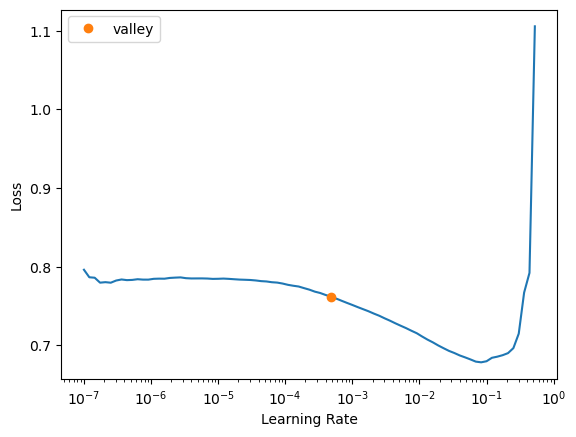

In [195]:
learn.lr_find()

In [198]:
learn.fit_one_cycle(50,7e-3, pct_start=0.0287, div_final=1e4, div=0.3547)

C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if sys.platform == "win32" and x.dtype==np.int: x = x.astype(np.int64)
C:\Users\jazmi\anaconda3\lib\site-packages\fastai\torch_core.py:136: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review y

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,0.755375,0.586398,0.743508,0.500161,0.500161,0.538584,0.427452,00:00
1,0.658618,0.561671,0.744303,0.501034,0.501034,0.872084,0.428725,00:00
2,0.617415,0.567185,0.744303,0.501034,0.501034,0.872084,0.428725,00:00
3,0.595360,0.561207,0.743773,0.501356,0.501356,0.622146,0.430544,00:00
4,0.581543,0.559873,0.743773,0.503389,0.503389,0.622536,0.436439,00:00
5,0.572064,0.560058,0.743773,0.505423,0.505423,0.622929,0.442188,00:00
6,0.564865,0.565224,0.744303,0.507474,0.507474,0.635826,0.447089,00:00
7,0.558872,0.570517,0.737944,0.506249,0.506249,0.556031,0.452510,00:00
8,0.553681,0.568087,0.742713,0.510472,0.510472,0.609634,0.457256,00:00
9,0.549851,0.571468,0.744038,0.514413,0.514413,0.627707,0.465669,00:00


In [199]:
learn.save('learner_compu_portatil')

Path('models/learner_compu_portatil.pth')

In [200]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [201]:
y_predrn = np.array([0 if i[0]>i[1] else 1 for i in preds])

In [202]:
eval_pred_clas(y_predrn,y_test)

C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


(0.09376986649713923,
 0.09376986649713923,
 0.01739263824667343,
 0.029342724332853464)

### Con SVM

In [204]:
svm = SVC(C=1.0)

In [205]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedM

{'fit_time': array([7.24320602, 6.73910689, 6.69453526, 5.77717757, 6.74815941,
        5.58283162, 6.92194557, 5.77866602, 6.57449222, 6.00646639]),
 'score_time': array([1.3486135 , 1.74302745, 1.20076489, 1.20738888, 1.23408771,
        1.22894001, 1.22476625, 1.22780395, 1.29131699, 1.29735756]),
 'test_accuracy': array([0.74629237, 0.74629237, 0.74629237, 0.74615792, 0.74615792,
        0.74615792, 0.74615792, 0.74615792, 0.74615792, 0.74668786]),
 'test_recall_weighted': array([0.74629237, 0.74629237, 0.74629237, 0.74615792, 0.74615792,
        0.74615792, 0.74615792, 0.74615792, 0.74615792, 0.74668786]),
 'test_precision_weighted': array([0.55695231, 0.55695231, 0.55695231, 0.55675165, 0.55675165,
        0.55675165, 0.55675165, 0.55675165, 0.55675165, 0.55754277]),
 'test_f1_weighted': array([0.63786834, 0.63786834, 0.63786834, 0.63768762, 0.63768762,
        0.63768762, 0.63768762, 0.63768762, 0.63768762, 0.6384    ])}

In [206]:
np.mean(svm_cv["test_accuracy"]), np.mean(svm_cv["test_recall_weighted"]), np.mean(svm_cv["test_precision_weighted"]), np.mean(svm_cv["test_f1_weighted"])

(0.7462512518750056,
 0.7462512518750056,
 0.5568909557215471,
 0.6378130735278957)

In [207]:
svm.fit(X_train,y_train)

SVC()

In [208]:
y_test_pred = svm.predict(X_test)

In [209]:
accuracy_score(y_test, y_test_pred), recall_score(y_test, y_test_pred, average="weighted"), precision_score(y_test, y_test_pred, average="weighted"), f1_score(y_test, y_test_pred, average="weighted")

C:\Users\jazmi\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


(0.7531786395422759,
 0.7531786395422759,
 0.5672780630627536,
 0.6471423393692042)

### Con N-vecinos

In [210]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [211]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.00399017, 0.00299001, 0.00199366, 0.00199342, 0.00199437,
        0.00299025, 0.00199389, 0.00299406, 0.00299072, 0.00299454]),
 'score_time': array([0.50719261, 0.48998165, 0.45590019, 0.4914186 , 0.53128195,
        0.50628233, 0.46971035, 0.52745461, 0.50649834, 0.50426722]),
 'test_accuracy': array([0.68379237, 0.66896186, 0.6753178 , 0.66772655, 0.67196608,
        0.68203498, 0.67567568, 0.66507684, 0.6709062 , 0.66560678]),
 'test_recall_weighted': array([0.68379237, 0.66896186, 0.6753178 , 0.66772655, 0.67196608,
        0.68203498, 0.67567568, 0.66507684, 0.6709062 , 0.66560678]),
 'test_precision_weighted': array([0.64260888, 0.62119065, 0.62789176, 0.6260268 , 0.62749981,
        0.63179262, 0.6329709 , 0.61669774, 0.62681556, 0.61676132]),
 'test_f1_weighted': array([0.65809387, 0.63997131, 0.64604566, 0.64275369, 0.64490484,
        0.6501965 , 0.64952444, 0.63596717, 0.64416679, 0.63622026])}

In [212]:
np.mean(nc_cv["test_accuracy"]), np.mean(nc_cv["test_recall_weighted"]), np.mean(nc_cv["test_precision_weighted"]), np.mean(nc_cv["test_f1_weighted"])

(0.6727065144656121, 0.6727065144656121, 0.627025602463772, 0.6447844529931043)

In [213]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [214]:
y_test_prednn = nc.predict(X_test)

In [215]:
accuracy_score(y_test, y_test_prednn), recall_score(y_test, y_test_prednn, average="weighted"), precision_score(y_test, y_test_prednn, average="weighted"), f1_score(y_test, y_test_prednn, average="weighted")

(0.6910362364907819,
 0.6910362364907819,
 0.6461525184303255,
 0.6629980644148833)

### Random Forest

In [216]:
rf = RandomForestClassifier(random_state=18)

In [217]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([1.72351742, 1.2071228 , 1.26516724, 1.16173077, 1.16959453,
        1.12247396, 1.14821792, 1.21680832, 1.22530007, 1.38916063]),
 'score_time': array([0.04385328, 0.0458467 , 0.04418278, 0.04589415, 0.04285693,
        0.04285717, 0.05909085, 0.05841923, 0.0458467 , 0.04337597]),
 'test_accuracy': array([0.71239407, 0.7092161 , 0.72033898, 0.71012189, 0.71118177,
        0.71754107, 0.70959194, 0.70535241, 0.72337043, 0.7217806 ]),
 'test_recall_weighted': array([0.71239407, 0.7092161 , 0.72033898, 0.71012189, 0.71118177,
        0.71754107, 0.70959194, 0.70535241, 0.72337043, 0.7217806 ]),
 'test_precision_weighted': array([0.63626345, 0.6422548 , 0.65701658, 0.64171506, 0.64281072,
        0.65049911, 0.64332813, 0.63847605, 0.6607112 , 0.65688092]),
 'test_f1_weighted': array([0.65522836, 0.65993226, 0.66950067, 0.65937548, 0.66007353,
        0.66482304, 0.66064842, 0.65730522, 0.67146717, 0.66908973])}

In [218]:
np.mean(rf_cv["test_accuracy"]), np.mean(rf_cv["test_recall_weighted"]), np.mean(rf_cv["test_precision_weighted"]), np.mean(rf_cv["test_f1_weighted"])

(0.7140889269129549, 0.7140889269129549, 0.646995601382843, 0.6627443874477205)

In [219]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [220]:
y_test_predrf = rf.predict(X_test)

In [221]:
accuracy_score(y_test, y_test_predrf), recall_score(y_test, y_test_predrf, average="weighted"), precision_score(y_test, y_test_predrf, average="weighted"), f1_score(y_test, y_test_predrf, average="weighted")

(0.7137635092180546,
 0.7137635092180546,
 0.6463823273895999,
 0.6656281599119747)

### Ensamble

#### Votacion

In [222]:
vot = VotingClassifier(
    estimators=[('svr', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [223]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([8.66485763, 7.80301714, 8.03779769, 8.08204818, 8.51803184,
        7.97208786, 7.34186625, 7.0489099 , 7.6849227 , 7.51506901]),
 'score_time': array([1.88016129, 2.74138546, 1.8345077 , 1.79871321, 1.78631997,
        1.86363506, 2.60969257, 1.87598753, 1.83515668, 1.82411075]),
 'test_accuracy': array([0.7404661 , 0.74205508, 0.73940678, 0.74191839, 0.74085851,
        0.7445681 , 0.73661897, 0.72972973, 0.74138845, 0.74350821]),
 'test_recall_weighted': array([0.7404661 , 0.74205508, 0.73940678, 0.74191839, 0.74085851,
        0.7445681 , 0.73661897, 0.72972973, 0.74138845, 0.74350821]),
 'test_precision_weighted': array([0.64968386, 0.65133958, 0.64710958, 0.66456758, 0.66125682,
        0.67718009, 0.63721969, 0.61658669, 0.66343043, 0.67195654]),
 'test_f1_weighted': array([0.64776466, 0.64601099, 0.64803497, 0.65268795, 0.65291098,
        0.65334242, 0.64639795, 0.64177307, 0.65321184, 0.65564678])}

In [224]:
np.mean(vot_cv["test_accuracy"]), np.mean(vot_cv["test_recall_weighted"]), np.mean(vot_cv["test_precision_weighted"]), np.mean(vot_cv["test_f1_weighted"])

(0.7400518321162639,
 0.7400518321162639,
 0.6540330870405205,
 0.6497781589747336)

In [225]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svr', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [226]:
y_test_predvot = vot.predict(X_test)

In [227]:
accuracy_score(y_test, y_test_predvot), recall_score(y_test, y_test_predvot, average="weighted"), precision_score(y_test, y_test_predvot, average="weighted"), f1_score(y_test, y_test_predvot, average="weighted")

(0.7458677685950413,
 0.7458677685950413,
 0.6546793697012755,
 0.6575695340553974)

#### Bagging

In [228]:
bag = BaggingClassifier(
    base_estimator=clone(rf)
)

In [229]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([9.1252656 , 8.15981984, 9.28806543, 9.0982728 , 8.05907655,
        8.73084259, 8.16885352, 9.11505198, 8.06389427, 8.72329831]),
 'score_time': array([0.38841414, 0.3967886 , 0.44024587, 0.38941813, 0.38424444,
        0.38020492, 0.39076614, 0.39622355, 0.3817234 , 0.38179731]),
 'test_accuracy': array([0.7404661 , 0.73252119, 0.7404661 , 0.7318495 , 0.73661897,
        0.73555909, 0.73025967, 0.72708002, 0.73555909, 0.73502915]),
 'test_recall_weighted': array([0.7404661 , 0.73252119, 0.7404661 , 0.7318495 , 0.73661897,
        0.73555909, 0.73025967, 0.72708002, 0.73555909, 0.73502915]),
 'test_precision_weighted': array([0.66907601, 0.65567805, 0.67656729, 0.65359391, 0.66296324,
        0.65878374, 0.64961143, 0.64594646, 0.66290975, 0.65403552]),
 'test_f1_weighted': array([0.66061456, 0.66083309, 0.66921568, 0.6596445 , 0.66186175,
        0.6597826 , 0.65797547, 0.65739946, 0.66331885, 0.65766668])}

In [230]:
np.mean(bag_cv["test_accuracy"]), np.mean(bag_cv["test_recall_weighted"]), np.mean(bag_cv["test_precision_weighted"]), np.mean(bag_cv["test_f1_weighted"])

(0.734540887472717, 0.734540887472717, 0.6589165399541036, 0.66083126264743)

In [231]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [232]:
y_test_predbag = bag.predict(X_test)

In [233]:
accuracy_score(y_test, y_test_predbag), recall_score(y_test, y_test_predrf, average="weighted"), precision_score(y_test, y_test_predrf, average="weighted"), f1_score(y_test, y_test_predrf, average="weighted")

(0.736013986013986, 0.7137635092180546, 0.6463823273895999, 0.6656281599119747)

#### Boost

In [234]:
boost = AdaBoostClassifier(clone(rf)
)

In [235]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([ 91.74991441,  99.17790651,  85.55019236,  92.89715981,
         96.83678794,  94.38547182,  83.76952291,  83.97063756,
         87.02720404, 101.28708458]),
 'score_time': array([3.17037582, 2.50413013, 2.95791054, 2.969733  , 2.30500078,
        2.34071755, 2.19113135, 2.36713576, 2.30353498, 2.34754133]),
 'test_accuracy': array([0.72563559, 0.71663136, 0.72245763, 0.71648119, 0.71754107,
        0.7127716 , 0.71330154, 0.709062  , 0.72231055, 0.72655008]),
 'test_recall_weighted': array([0.72563559, 0.71663136, 0.72245763, 0.71648119, 0.71754107,
        0.7127716 , 0.71330154, 0.709062  , 0.72231055, 0.72655008]),
 'test_precision_weighted': array([0.64637024, 0.63190633, 0.64437781, 0.63926618, 0.63698138,
        0.62518022, 0.63727447, 0.63094008, 0.64148311, 0.65426865]),
 'test_f1_weighted': array([0.65859082, 0.65169959, 0.65854324, 0.65655507, 0.65474194,
        0.64794417, 0.65573283, 0.65184049, 0.65643972, 0.66457271])}

In [236]:
eval_cv_clas(boost_cv)

(0.7182742594289204,
 0.7182742594289204,
 0.6388048472088583,
 0.6556660575313878)

In [237]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [238]:
y_test_predboost = boost.predict(X_test)

In [239]:
eval_pred_clas(y_test_predboost,y_test)

(0.7148760330578512,
 0.7148760330578512,
 0.8521355277542443,
 0.7723609457296284)

# Tablet

### Con RN

In [241]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [242]:
y_names = ["P4_2_3"]

In [243]:
# Filtrado de datos, solo aquellos que tengan al menos un celular
train_df = endutih21[(endutih21.compu==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_2_3
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,2
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,1
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,2
8,101083,1,1,0,1,1,0,1,0,3,...,1,2,1,1,1,1,1,1,6,1
9,101083,1,0,0,1,1,1,1,0,3,...,1,3,1,1,1,1,1,1,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58128,3260730,1,1,1,1,1,0,0,1,1,...,4,2,2,1,1,1,1,1,6,2
58140,3260770,1,1,1,1,1,1,0,1,2,...,4,3,1,1,1,1,0,0,4,2
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,2
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,2


In [244]:
train_df[y_names].value_counts()

P4_2_3
2         15629
1          9536
dtype: int64

In [245]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=18)

In [246]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [247]:
train_df[y_names].value_counts()

P4_2_3
2         11722
1          7151
dtype: int64

In [248]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cpu"
                       )

In [249]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-19 14:28:07,971] A new study created in memory with name: no-name-9bef70b0-f847-4553-981c-a26b05fd5ea0


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.958883,90.570549,0.614997,0.614997,0.378222,0.468387,00:00
1,0.805499,3.444344,0.614997,0.614997,0.571062,0.472664,00:00
2,0.750820,0.904599,0.612878,0.612878,0.534193,0.475313,00:01
3,0.724312,0.687338,0.609168,0.609168,0.563063,0.525058,00:00
4,0.707321,0.683152,0.602279,0.602279,0.576460,0.574997,00:01
5,0.697424,0.666687,0.594330,0.594330,0.577939,0.581451,00:00
6,0.688219,0.663173,0.614732,0.614732,0.571118,0.493050,00:00
7,0.682138,0.667687,0.608108,0.608108,0.567152,0.540672,00:00
8,0.676581,0.675158,0.617117,0.617117,0.597406,0.485485,00:00
9,0.672254,0.663025,0.616852,0.616852,0.584516,0.498244,00:00


[I 2023-02-19 14:29:22,905] Trial 0 finished with value: 0.45495498180389404 and parameters: {'n_layers': 12, 'n_neuronas_layer0': 250, 'n_neuronas_layer1': 58, 'n_neuronas_layer2': 62, 'n_neuronas_layer3': 120, 'n_neuronas_layer4': 189, 'n_neuronas_layer5': 98, 'n_neuronas_layer6': 239, 'n_neuronas_layer7': 90, 'n_neuronas_layer8': 210, 'n_neuronas_layer9': 51, 'n_neuronas_layer10': 78, 'n_neuronas_layer11': 96, 'bn_final': False, 'embed_p': 0.11153194812025076, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 88, 'lr': 0.05043209247948254, 'pct_start': 0.029405340259539343, 'div_final': 333937, 'div': 0.98381436965007}. Best is trial 0 with value: 0.45495498180389404.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.696073,33.876343,0.388712,0.388712,0.582661,0.226499,00:00
1,0.678882,4.740301,0.468733,0.468733,0.606370,0.420337,00:00
2,0.669341,1.345950,0.546370,0.546370,0.578147,0.552227,00:00
3,0.664307,0.908508,0.604134,0.604134,0.585467,0.587571,00:00
4,0.660041,0.787465,0.616587,0.616587,0.589393,0.577363,00:00
5,0.657204,0.702416,0.604663,0.604663,0.579914,0.578476,00:00
6,0.654523,0.670939,0.594595,0.594595,0.576793,0.580093,00:00
7,0.652478,0.661551,0.604928,0.604928,0.575054,0.568730,00:00
8,0.650407,0.663541,0.604928,0.604928,0.576271,0.571227,00:00
9,0.648580,0.664786,0.610758,0.610758,0.575307,0.553588,00:00


[I 2023-02-19 14:32:25,632] Trial 1 finished with value: 0.4414414167404175 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 237, 'n_neuronas_layer1': 234, 'n_neuronas_layer2': 87, 'n_neuronas_layer3': 57, 'n_neuronas_layer4': 190, 'n_neuronas_layer5': 234, 'n_neuronas_layer6': 114, 'n_neuronas_layer7': 187, 'bn_final': True, 'embed_p': 0.4193323229266929, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 237, 'lr': 0.04553269832768025, 'pct_start': 0.22844265276650644, 'div_final': 948817, 'div': 0.606965908290988}. Best is trial 1 with value: 0.4414414167404175.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.473881,93.466782,0.586645,0.586645,0.499923,0.492661,00:00
1,1.209128,15.770980,0.447006,0.447006,0.543831,0.410976,00:00
2,1.059858,2.761109,0.434022,0.434022,0.541300,0.381303,00:00
3,0.961753,2.025414,0.596449,0.596449,0.533684,0.512357,00:00
4,0.897304,0.900400,0.569157,0.569157,0.562458,0.565234,00:00
5,0.848427,0.783840,0.593005,0.593005,0.529983,0.513113,00:00
6,0.812992,0.710278,0.604134,0.604134,0.572094,0.563907,00:00
7,0.784734,0.710646,0.611818,0.611818,0.518068,0.474331,00:00
8,0.762691,0.674645,0.599894,0.599894,0.559782,0.546858,00:00
9,0.744370,0.657939,0.613672,0.613672,0.574230,0.530086,00:00


[I 2023-02-19 14:35:35,518] Trial 2 finished with value: 0.45733970403671265 and parameters: {'n_layers': 10, 'n_neuronas_layer0': 138, 'n_neuronas_layer1': 237, 'n_neuronas_layer2': 149, 'n_neuronas_layer3': 39, 'n_neuronas_layer4': 35, 'n_neuronas_layer5': 76, 'n_neuronas_layer6': 241, 'n_neuronas_layer7': 206, 'n_neuronas_layer8': 54, 'n_neuronas_layer9': 142, 'bn_final': False, 'embed_p': 0.44272528857962257, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 220, 'lr': 0.016007815154604525, 'pct_start': 0.7593315494142246, 'div_final': 754687, 'div': 0.3633941147019082}. Best is trial 1 with value: 0.4414414167404175.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.743387,0.689797,0.615262,0.615262,0.763325,0.468993,00:00
1,0.708493,0.680463,0.612878,0.612878,0.568697,0.515312,00:00
2,0.691391,0.664217,0.607843,0.607843,0.583265,0.580872,00:00
3,0.679756,0.660378,0.599629,0.599629,0.572936,0.571725,00:00
4,0.671294,0.664658,0.600954,0.600954,0.570041,0.564989,00:00
5,0.664979,0.656211,0.609433,0.609433,0.573856,0.554419,00:00
6,0.660269,0.661990,0.609433,0.609433,0.574537,0.556380,00:00
7,0.656221,0.668464,0.611023,0.611023,0.578946,0.563768,00:00
8,0.652470,0.668938,0.611818,0.611818,0.582002,0.570112,00:00
9,0.648737,0.679295,0.604398,0.604399,0.575168,0.569830,00:00


[I 2023-02-19 14:36:19,229] Trial 3 finished with value: 0.4379968047142029 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 152, 'n_neuronas_layer1': 114, 'n_neuronas_layer2': 46, 'n_neuronas_layer3': 196, 'n_neuronas_layer4': 210, 'n_neuronas_layer5': 100, 'bn_final': True, 'embed_p': 0.5901320867711604, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 88, 'lr': 0.05729885988218594, 'pct_start': 0.6499186013980177, 'div_final': 382601, 'div': 0.9288787473851502}. Best is trial 3 with value: 0.4379968047142029.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.704654,22.390545,0.386592,0.386592,0.686562,0.217923,00:00
1,0.681781,1.193828,0.590885,0.590885,0.542015,0.531625,00:00
2,0.670812,0.692756,0.560943,0.560943,0.559420,0.560154,00:00
3,0.664108,0.737869,0.529412,0.529412,0.575592,0.533051,00:00
4,0.659687,0.715267,0.538421,0.538421,0.563434,0.544599,00:00
5,0.655190,0.681638,0.580286,0.580286,0.559766,0.563906,00:00
6,0.651288,0.670646,0.600159,0.600159,0.560037,0.546832,00:01
7,0.647650,0.674258,0.587440,0.587440,0.563553,0.566283,00:01
8,0.643842,0.678059,0.583201,0.583201,0.564195,0.568236,00:01
9,0.640221,0.675331,0.591415,0.591415,0.556989,0.554066,00:01


[I 2023-02-19 14:38:12,117] Trial 4 finished with value: 0.44064652919769287 and parameters: {'n_layers': 11, 'n_neuronas_layer0': 239, 'n_neuronas_layer1': 219, 'n_neuronas_layer2': 224, 'n_neuronas_layer3': 172, 'n_neuronas_layer4': 83, 'n_neuronas_layer5': 78, 'n_neuronas_layer6': 166, 'n_neuronas_layer7': 81, 'n_neuronas_layer8': 184, 'n_neuronas_layer9': 184, 'n_neuronas_layer10': 107, 'bn_final': True, 'embed_p': 0.9698878085433386, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 117, 'lr': 0.04528948415000583, 'pct_start': 0.6795870541435993, 'div_final': 257006, 'div': 0.8740626633933659}. Best is trial 3 with value: 0.4379968047142029.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.692554,0.677934,0.614202,0.614202,0.559620,0.478684,00:00
1,0.677164,0.665066,0.600954,0.600954,0.561471,0.548059,00:00
2,0.667044,0.661495,0.599364,0.599364,0.571312,0.569256,00:00
3,0.661007,0.660049,0.603869,0.603869,0.566833,0.552955,00:00
4,0.656926,0.663674,0.594860,0.594860,0.560712,0.556328,00:00
5,0.653968,0.658382,0.608903,0.608903,0.573679,0.555778,00:00
6,0.651171,0.661282,0.607578,0.607578,0.573917,0.560406,00:00
7,0.648302,0.677797,0.606253,0.606253,0.571626,0.558217,00:00
8,0.646787,0.676884,0.596449,0.596449,0.568446,0.567424,00:00
9,0.644893,0.676821,0.600424,0.600424,0.571407,0.568204,00:00


[I 2023-02-19 14:38:51,689] Trial 5 finished with value: 0.44621092081069946 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 160, 'n_neuronas_layer1': 236, 'n_neuronas_layer2': 50, 'bn_final': False, 'embed_p': 0.19316077799055434, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 131, 'lr': 0.060401398382867996, 'pct_start': 0.7210719775373174, 'div_final': 541895, 'div': 0.6716636330753821}. Best is trial 3 with value: 0.4379968047142029.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.729328,0.678056,0.614997,0.614997,0.378222,0.468387,00:00
1,0.709138,0.674532,0.614997,0.614997,0.378222,0.468387,00:00
2,0.690070,0.666737,0.614997,0.614997,0.378222,0.468387,00:00
3,0.678360,0.665213,0.604398,0.604399,0.566054,0.549895,00:00
4,0.669251,0.683054,0.607578,0.607578,0.569013,0.547630,00:00
5,0.662674,0.664027,0.604134,0.604134,0.563760,0.545414,00:00
6,0.657214,0.668982,0.595654,0.595654,0.562567,0.558519,00:00
7,0.653126,0.674958,0.593800,0.593800,0.568832,0.570064,00:00
8,0.649741,0.695396,0.595389,0.595390,0.558965,0.552681,00:00
9,0.646955,0.722899,0.588765,0.588765,0.571741,0.575553,00:00


[I 2023-02-19 14:39:28,130] Trial 6 finished with value: 0.4414414167404175 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 211, 'n_neuronas_layer1': 182, 'n_neuronas_layer2': 75, 'n_neuronas_layer3': 249, 'n_neuronas_layer4': 247, 'n_neuronas_layer5': 227, 'n_neuronas_layer6': 64, 'n_neuronas_layer7': 70, 'n_neuronas_layer8': 255, 'n_neuronas_layer9': 91, 'n_neuronas_layer10': 74, 'n_neuronas_layer11': 241, 'n_neuronas_layer12': 73, 'bn_final': False, 'embed_p': 0.6469383908441594, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 40, 'lr': 0.036630707620305986, 'pct_start': 0.2085565852111666, 'div_final': 858085, 'div': 0.7405525026487912}. Best is trial 3 with value: 0.4379968047142029.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.688890,423.565918,0.385003,0.385003,0.455442,0.219551,00:00
1,0.671911,16.344484,0.438792,0.438792,0.608651,0.355839,00:00
2,0.665887,2.561293,0.502120,0.502120,0.592644,0.487033,00:00
3,0.661987,1.270281,0.533121,0.533121,0.581437,0.536270,00:00
4,0.659382,0.801150,0.563328,0.563328,0.578252,0.568261,00:00
5,0.657504,0.712583,0.586910,0.586910,0.582883,0.584659,00:00
6,0.655781,0.679824,0.580021,0.580021,0.574124,0.576586,00:00
7,0.654197,0.665729,0.604663,0.604663,0.580958,0.580284,00:00
8,0.652769,0.664782,0.602544,0.602544,0.582505,0.584291,00:00
9,0.651520,0.660595,0.605988,0.605988,0.582352,0.581349,00:00


[I 2023-02-19 14:40:54,712] Trial 7 finished with value: 0.43481719493865967 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 213, 'n_neuronas_layer1': 253, 'n_neuronas_layer2': 147, 'n_neuronas_layer3': 252, 'n_neuronas_layer4': 48, 'n_neuronas_layer5': 55, 'n_neuronas_layer6': 54, 'n_neuronas_layer7': 76, 'bn_final': True, 'embed_p': 0.0813424054345001, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 124, 'lr': 0.049320117913846266, 'pct_start': 0.8339334766234663, 'div_final': 956669, 'div': 0.39470716168664965}. Best is trial 7 with value: 0.43481719493865967.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.724024,0.686515,0.614997,0.614997,0.378222,0.468387,00:00
1,0.702694,0.671742,0.614997,0.614997,0.378222,0.468387,00:00
2,0.686391,0.659079,0.614997,0.614997,0.576129,0.521598,00:00
3,0.675742,0.663234,0.611288,0.611288,0.574322,0.547868,00:00
4,0.666933,0.674428,0.600689,0.600689,0.570455,0.566129,00:00
5,0.659646,0.667737,0.603339,0.603339,0.564826,0.549785,00:00
6,0.653560,0.687961,0.590885,0.590885,0.569630,0.572582,00:00
7,0.650306,0.699498,0.593800,0.593800,0.568450,0.569515,00:00
8,0.648886,0.724617,0.583201,0.583201,0.562438,0.566294,00:00
9,0.647544,0.718339,0.597774,0.597774,0.562399,0.555412,00:00


[I 2023-02-19 14:42:53,544] Trial 8 finished with value: 0.45151031017303467 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 100, 'n_neuronas_layer1': 49, 'n_neuronas_layer2': 155, 'n_neuronas_layer3': 192, 'n_neuronas_layer4': 254, 'n_neuronas_layer5': 176, 'n_neuronas_layer6': 162, 'n_neuronas_layer7': 200, 'bn_final': False, 'embed_p': 0.0808794122876742, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 206, 'lr': 0.032560551135933355, 'pct_start': 0.060020981793917, 'div_final': 956997, 'div': 0.6603725110869056}. Best is trial 7 with value: 0.43481719493865967.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.704971,0.871243,0.492581,0.492581,0.545733,0.493332,00:00
1,0.678508,1.219241,0.489931,0.489931,0.575150,0.475159,00:00
2,0.669164,1.003069,0.546370,0.546370,0.583483,0.551663,00:00
3,0.663562,0.801418,0.560943,0.560943,0.584099,0.566771,00:00
4,0.659398,0.688028,0.583201,0.583201,0.586296,0.584619,00:00
5,0.656723,0.679614,0.584261,0.584261,0.584529,0.584394,00:00
6,0.654491,0.672318,0.596714,0.596714,0.588184,0.591233,00:00
7,0.652554,0.666141,0.590090,0.590090,0.577095,0.580867,00:00
8,0.651020,0.664878,0.596184,0.596184,0.578544,0.581739,00:00
9,0.649668,0.661120,0.604134,0.604134,0.581377,0.581465,00:00


[I 2023-02-19 14:44:48,634] Trial 9 finished with value: 0.45071542263031006 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 152, 'n_neuronas_layer1': 171, 'n_neuronas_layer2': 102, 'n_neuronas_layer3': 97, 'n_neuronas_layer4': 53, 'n_neuronas_layer5': 76, 'n_neuronas_layer6': 160, 'n_neuronas_layer7': 54, 'bn_final': True, 'embed_p': 0.6867943511811173, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 206, 'lr': 0.015659824910945478, 'pct_start': 0.5570620246898366, 'div_final': 930930, 'div': 0.6050547321016773}. Best is trial 7 with value: 0.43481719493865967.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.803910,1.012683,0.462639,0.462639,0.569112,0.427712,00:00
1,0.751495,1.295684,0.390037,0.390037,0.555032,0.233665,00:00
2,0.729592,0.697080,0.563858,0.563858,0.572079,0.567172,00:00
3,0.713173,0.752957,0.481717,0.481717,0.592382,0.451810,00:00
4,0.701420,0.668235,0.595125,0.595125,0.582469,0.586060,00:00
5,0.692396,0.660474,0.613143,0.613143,0.559606,0.489728,00:00
6,0.685468,0.660428,0.606783,0.606783,0.579735,0.575390,00:00
7,0.679746,0.664996,0.614997,0.614997,0.570911,0.470777,00:00
8,0.675290,0.656683,0.612348,0.612348,0.572008,0.532724,00:00
9,0.672088,0.657696,0.608903,0.608903,0.558160,0.515175,00:00


[I 2023-02-19 14:45:23,385] Trial 10 finished with value: 0.4085850715637207 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 48, 'bn_final': True, 'embed_p': 0.2516370258761033, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 162, 'lr': 0.080969810042027, 'pct_start': 0.84148608477213, 'div_final': 54639, 'div': 0.07093160300499557}. Best is trial 10 with value: 0.4085850715637207.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.304527,1.508272,0.546900,0.546900,0.548182,0.547523,00:00
1,1.128744,1.961942,0.445151,0.445151,0.515611,0.429632,00:00
2,1.028435,0.895021,0.587175,0.587175,0.557723,0.558631,00:00
3,0.944558,0.730154,0.610758,0.610758,0.571183,0.540169,00:00
4,0.890264,0.727473,0.553789,0.553789,0.530552,0.536620,00:00
5,0.850140,0.704514,0.586380,0.586380,0.566897,0.570636,00:00
6,0.815770,0.670932,0.614997,0.614997,0.570873,0.470302,00:00
7,0.788238,0.665796,0.605193,0.605193,0.549098,0.513511,00:00
8,0.766333,0.660124,0.614997,0.614997,0.378222,0.468387,00:00
9,0.749111,0.663803,0.614997,0.614997,0.378222,0.468387,00:00


[I 2023-02-19 14:45:59,866] Trial 11 finished with value: 0.38579756021499634 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 37, 'bn_final': True, 'embed_p': 0.2493382233752842, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 167, 'lr': 0.08824278057044738, 'pct_start': 0.888094240406219, 'div_final': 11355, 'div': 0.029845224483360355}. Best is trial 11 with value: 0.38579756021499634.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.514821,1.184963,0.605988,0.605988,0.475736,0.472313,00:00
1,1.142409,0.680205,0.614997,0.614997,0.570761,0.468868,00:00
2,0.992937,0.701514,0.614997,0.614997,0.378222,0.468387,00:00
3,0.912706,0.716052,0.613143,0.613143,0.532309,0.474074,00:00
4,0.864321,0.691328,0.614997,0.614997,0.378222,0.468387,00:00
5,0.828905,0.734604,0.613143,0.613143,0.532309,0.474074,00:00
6,0.805018,0.726452,0.613143,0.613143,0.532309,0.474074,00:00
7,0.783520,0.715182,0.613672,0.613672,0.543474,0.474795,00:00
8,0.765617,0.683172,0.614997,0.614997,0.378222,0.468387,00:00
9,0.749261,0.690317,0.614997,0.614997,0.378222,0.468387,00:00


[I 2023-02-19 14:46:34,253] Trial 12 finished with value: 0.37917327880859375 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 34, 'bn_final': True, 'embed_p': 0.2748375198518278, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 174, 'lr': 0.09078104607524813, 'pct_start': 0.8850150865879364, 'div_final': 3635, 'div': 0.021569485049108026}. Best is trial 12 with value: 0.37917327880859375.


In [250]:
study.best_value

0.37917327880859375

In [251]:
study.best_params

{'n_layers': 1,
 'n_neuronas_layer0': 34,
 'bn_final': True,
 'embed_p': 0.2748375198518278,
 'idx_act_cls': 1,
 'idx_opt_func': 1,
 'epoch': 174,
 'lr': 0.09078104607524813,
 'pct_start': 0.8850150865879364,
 'div_final': 3635,
 'div': 0.021569485049108026}

In [254]:
learn = ft.tabular_learner(dls,
                           layers = [34],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.LeakyReLU(inplace=True), bn_final=True, embed_p=0.2748),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.0063095735386013985)

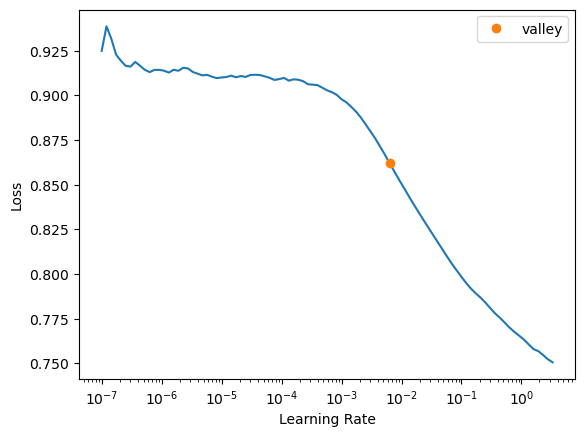

In [255]:
learn.lr_find()

In [256]:
learn.fit_one_cycle(174,0.0908, pct_start=0.8850, div_final=36e2, div=0.0216)

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,1.585493,6.862530,0.614997,0.500000,0.500000,0.307499,0.380804,00:00
1,1.288854,4.714538,0.614997,0.500257,0.500257,0.557560,0.382098,00:00
2,1.127406,3.088155,0.385268,0.499443,0.499443,0.461600,0.280521,00:00
3,1.018648,0.682779,0.608903,0.498134,0.498134,0.476062,0.393238,00:00
4,0.942493,0.807068,0.386857,0.499578,0.499578,0.489698,0.286401,00:00
5,0.887726,0.684673,0.614202,0.513896,0.513896,0.557726,0.443077,00:00
6,0.848234,0.683153,0.613143,0.500422,0.500422,0.510302,0.389565,00:00
7,0.816864,0.685662,0.614997,0.500000,0.500000,0.307499,0.380804,00:00
8,0.792490,0.727256,0.614997,0.500000,0.500000,0.307499,0.380804,00:00
9,0.773692,0.709974,0.615262,0.500344,0.500344,0.807580,0.381554,00:00


In [257]:
learn.save('learner_compu_tablet')

Path('models/learner_compu_tablet.pth')

In [258]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [259]:
y_predrn = np.array([0 if i[0]>i[1] else 1 for i in preds])

In [260]:
eval_pred_clas(y_predrn,y_test)

(0.3148442466624285,
 0.3148442466624285,
 0.7297521993919935,
 0.4398986466700125)

### Con SVM

In [261]:
svm = SVC(C=1.0)

In [262]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

{'fit_time': array([12.72889996, 10.36167359,  9.86701536,  8.94155741, 10.07207131,
        10.22268462, 11.1032989 , 12.69411993,  9.61492968, 10.91546273]),
 'score_time': array([2.02368212, 2.36381125, 1.8636713 , 1.80406785, 1.82130408,
        2.09976745, 2.76842737, 2.04621029, 1.97896075, 1.98266721]),
 'test_accuracy': array([0.62129237, 0.62129237, 0.62076271, 0.62109168, 0.62109168,
        0.62109168, 0.62109168, 0.62109168, 0.62109168, 0.62109168]),
 'test_recall_weighted': array([0.62129237, 0.62129237, 0.62076271, 0.62109168, 0.62109168,
        0.62109168, 0.62109168, 0.62109168, 0.62109168, 0.62109168]),
 'test_precision_weighted': array([0.38600421, 0.38600421, 0.38534634, 0.38575487, 0.38575487,
        0.38575487, 0.38575487, 0.38575487, 0.38575487, 0.38575487]),
 'test_f1_weighted': array([0.47616854, 0.47616854, 0.47551235, 0.47591988, 0.47591988,
        0.47591988, 0.47591988, 0.47591988, 0.47591988, 0.47591988])}

In [263]:
np.mean(svm_cv["test_accuracy"]), np.mean(svm_cv["test_recall_weighted"]), np.mean(svm_cv["test_precision_weighted"]), np.mean(svm_cv["test_f1_weighted"])

(0.6210989217033583,
 0.6210989217033583,
 0.3857638893661622,
 0.4759288560869166)

In [264]:
svm.fit(X_train,y_train)

SVC()

In [265]:
y_test_pred = svm.predict(X_test)

In [266]:
accuracy_score(y_test, y_test_pred), recall_score(y_test, y_test_pred, average="weighted"), precision_score(y_test, y_test_pred, average="weighted"), f1_score(y_test, y_test_pred, average="weighted")

(0.6209472345835982,
 0.6209472345835982,
 0.38557546813701815,
 0.47574092470205276)

### Con N-vecinos

In [267]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [268]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.00498247, 0.00498366, 0.0039866 , 0.00398684, 0.0039835 ,
        0.00398803, 0.00399041, 0.00398636, 0.00398636, 0.00398302]),
 'score_time': array([0.70279026, 0.73901153, 0.52755308, 0.48113894, 0.47733784,
        0.53139043, 0.49704719, 0.52977872, 0.46822596, 0.55077529]),
 'test_accuracy': array([0.58262712, 0.57309322, 0.57309322, 0.56809751, 0.59565448,
        0.57498675, 0.56385798, 0.57445681, 0.56279809, 0.55961844]),
 'test_recall_weighted': array([0.58262712, 0.57309322, 0.57309322, 0.56809751, 0.59565448,
        0.57498675, 0.56385798, 0.57445681, 0.56279809, 0.55961844]),
 'test_precision_weighted': array([0.57567293, 0.5594462 , 0.55882684, 0.56188348, 0.58150026,
        0.56053842, 0.55229773, 0.56286378, 0.55022095, 0.54813395]),
 'test_f1_weighted': array([0.57854226, 0.56411763, 0.56358214, 0.56456055, 0.58558836,
        0.56529355, 0.55665501, 0.56707615, 0.55484744, 0.55252595])}

In [269]:
np.mean(nc_cv["test_accuracy"]), np.mean(nc_cv["test_recall_weighted"]), np.mean(nc_cv["test_precision_weighted"]), np.mean(nc_cv["test_f1_weighted"])

(0.5728283617615622,
 0.5728283617615622,
 0.5611384538870992,
 0.5652789047280082)

In [270]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [271]:
y_test_prednn = nc.predict(X_test)

In [272]:
accuracy_score(y_test, y_test_prednn), recall_score(y_test, y_test_prednn, average="weighted"), precision_score(y_test, y_test_prednn, average="weighted"), f1_score(y_test, y_test_prednn, average="weighted")

(0.5727908455181182,
 0.5727908455181182,
 0.5595013680193247,
 0.5640948735766922)

### Random Forest

In [273]:
rf = RandomForestClassifier(random_state=18)

In [274]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([1.49868727, 1.40961766, 1.44760633, 1.40085912, 1.39781785,
        2.00478816, 1.6974957 , 1.41319966, 1.44402266, 1.43308377]),
 'score_time': array([0.04684329, 0.04684329, 0.04684305, 0.04784012, 0.04784012,
        0.07582259, 0.04890132, 0.04708505, 0.04687381, 0.05182886]),
 'test_accuracy': array([0.60169492, 0.5720339 , 0.58845339, 0.59777424, 0.60307366,
        0.56809751, 0.59035506, 0.58081611, 0.56703763, 0.58081611]),
 'test_recall_weighted': array([0.60169492, 0.5720339 , 0.58845339, 0.59777424, 0.60307366,
        0.56809751, 0.59035506, 0.58081611, 0.56703763, 0.58081611]),
 'test_precision_weighted': array([0.57915513, 0.54582132, 0.56770118, 0.57358656, 0.5808849 ,
        0.54204058, 0.56605174, 0.55530959, 0.53947726, 0.55839638]),
 'test_f1_weighted': array([0.58181187, 0.55147406, 0.57205394, 0.57628856, 0.58339817,
        0.54802753, 0.56979039, 0.56003732, 0.54557584, 0.56333548])}

In [275]:
np.mean(rf_cv["test_accuracy"]), np.mean(rf_cv["test_recall_weighted"]), np.mean(rf_cv["test_precision_weighted"]), np.mean(rf_cv["test_f1_weighted"])

(0.5850152526654272,
 0.5850152526654272,
 0.5608424648089303,
 0.5651793145641903)

In [276]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [277]:
y_test_predrf = rf.predict(X_test)

In [278]:
accuracy_score(y_test, y_test_predrf), recall_score(y_test, y_test_predrf, average="weighted"), precision_score(y_test, y_test_predrf, average="weighted"), f1_score(y_test, y_test_predrf, average="weighted")

(0.5878893833439288,
 0.5878893833439288,
 0.5646596440105897,
 0.5688305261580908)

### Ensamble

#### Votacion

In [279]:
vot = VotingClassifier(
    estimators=[('svr', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [280]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([13.78027391, 11.83404994, 12.16951156, 13.80549431, 12.26462626,
        11.61163473, 11.79728007, 11.02567196, 14.46797037, 11.09424782]),
 'score_time': array([3.18860865, 2.7027626 , 2.61168289, 2.5860424 , 2.6310761 ,
        3.07884502, 3.35657048, 2.7654767 , 3.37114668, 2.74528527]),
 'test_accuracy': array([0.62817797, 0.61440678, 0.62605932, 0.61950185, 0.62851086,
        0.60890302, 0.60890302, 0.60572337, 0.60254372, 0.61314255]),
 'test_recall_weighted': array([0.62817797, 0.61440678, 0.62605932, 0.61950185, 0.62851086,
        0.60890302, 0.60890302, 0.60572337, 0.60254372, 0.61314255]),
 'test_precision_weighted': array([0.59902077, 0.56925357, 0.59516678, 0.58180466, 0.60002983,
        0.55665366, 0.55856854, 0.55149952, 0.54676628, 0.56679424]),
 'test_f1_weighted': array([0.55620874, 0.53977202, 0.55446853, 0.55118226, 0.55636298,
        0.53153216, 0.53489525, 0.53055664, 0.52954885, 0.53828755])}

In [281]:
np.mean(vot_cv["test_accuracy"]), np.mean(vot_cv["test_recall_weighted"]), np.mean(vot_cv["test_precision_weighted"]), np.mean(vot_cv["test_f1_weighted"])

(0.6155872472672074,
 0.6155872472672074,
 0.5725557841526513,
 0.5422814986236038)

In [282]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svr', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [283]:
y_test_predvot = vot.predict(X_test)

In [284]:
accuracy_score(y_test, y_test_predvot), recall_score(y_test, y_test_predvot, average="weighted"), precision_score(y_test, y_test_predvot, average="weighted"), f1_score(y_test, y_test_predvot, average="weighted")

(0.6126827717736809,
 0.6126827717736809,
 0.5670456659496861,
 0.5401300673164771)

#### Bagging

In [285]:
bag = BaggingClassifier(
    base_estimator=clone(rf)
)

In [286]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([10.74018049,  9.95637584, 10.77543736, 10.62350202,  9.92160439,
        10.71840978, 10.79434586,  9.99660635, 10.46145391, 10.80038714]),
 'score_time': array([0.42557645, 0.43295383, 0.46161938, 0.44174981, 0.42272949,
        0.41884804, 0.41912293, 0.55665684, 0.43156028, 0.42806125]),
 'test_accuracy': array([0.62023305, 0.58951271, 0.59851695, 0.60943296, 0.60943296,
        0.58505564, 0.60784314, 0.59671436, 0.590885  , 0.6036036 ]),
 'test_recall_weighted': array([0.62023305, 0.58951271, 0.59851695, 0.60943296, 0.60943296,
        0.58505564, 0.60784314, 0.59671436, 0.590885  , 0.6036036 ]),
 'test_precision_weighted': array([0.5915269 , 0.55493957, 0.5689888 , 0.57867157, 0.57902439,
        0.54766325, 0.57460511, 0.56222469, 0.55616678, 0.57182621]),
 'test_f1_weighted': array([0.58213549, 0.55616033, 0.56933587, 0.57410824, 0.57478096,
        0.54929798, 0.5687021 , 0.56093394, 0.55682369, 0.56927717])}

In [287]:
np.mean(bag_cv["test_accuracy"]), np.mean(bag_cv["test_recall_weighted"]), np.mean(bag_cv["test_precision_weighted"]), np.mean(bag_cv["test_f1_weighted"])

(0.6011230385420315,
 0.6011230385420315,
 0.5685637282911261,
 0.5661555754651071)

In [288]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [289]:
y_test_predbag = bag.predict(X_test)

In [290]:
accuracy_score(y_test, y_test_predbag), recall_score(y_test, y_test_predrf, average="weighted"), precision_score(y_test, y_test_predrf, average="weighted"), f1_score(y_test, y_test_predrf, average="weighted")

(0.601716465352829, 0.5878893833439288, 0.5646596440105897, 0.5688305261580908)

#### Boost

In [291]:
boost = AdaBoostClassifier(clone(rf)
)

In [292]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([104.91014123, 102.1610477 , 104.54989219,  99.64830399,
         94.23202848, 102.79521084, 101.07020879, 106.94555926,
        109.57284474, 103.44058871]),
 'score_time': array([2.49972844, 2.39181566, 2.37891388, 2.70889282, 2.59595418,
        2.32564616, 2.44855714, 2.33085632, 2.42930627, 2.43344712]),
 'test_accuracy': array([0.60963983, 0.59110169, 0.59322034, 0.60042395, 0.61208267,
        0.56756757, 0.59936407, 0.58770535, 0.57922629, 0.59035506]),
 'test_recall_weighted': array([0.60963983, 0.59110169, 0.59322034, 0.60042395, 0.61208267,
        0.56756757, 0.59936407, 0.58770535, 0.57922629, 0.59035506]),
 'test_precision_weighted': array([0.58251711, 0.55927722, 0.56528884, 0.57017489, 0.58604649,
        0.53215113, 0.56713694, 0.55609786, 0.54424296, 0.56065731]),
 'test_f1_weighted': array([0.581013  , 0.56095788, 0.56754956, 0.56973732, 0.58439184,
        0.53799547, 0.56600869, 0.55858606, 0.54789932, 0.56309456])}

In [293]:
eval_cv_clas(boost_cv)

(0.5930686824661152,
 0.5930686824661152,
 0.5623590740208626,
 0.5637233713263492)

In [294]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [295]:
y_test_predboost = boost.predict(X_test)

In [296]:
eval_pred_clas(y_test_predboost,y_test)

(0.5983788938334393, 0.5983788938334393, 0.681092987380993, 0.6276014831473649)

# Razón falta compu

### Con RN

In [297]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [298]:
y_names = ["P4_3"]

In [299]:
# Filtrado de datos, solo aquellos que tengan al menos un celular
train_df = endutih21[(endutih21.compu==0)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_3
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,1.0
4,101080,1,1,0,1,0,0,0,0,2,...,1,1,1,1,1,1,0,0,3,1.0
5,101080,1,0,0,0,0,0,0,1,2,...,1,3,1,1,1,1,1,0,2,1.0
6,101080,1,1,1,1,0,1,1,0,2,...,1,3,1,1,1,1,1,0,9,1.0
7,101083,1,1,1,1,0,0,0,0,3,...,1,2,1,1,1,1,1,1,2,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58146,3260770,1,1,1,1,0,0,0,0,2,...,4,2,1,1,1,1,1,0,5,1.0
58147,3260770,0,0,0,1,0,0,0,0,2,...,4,2,1,5,1,1,0,0,2,1.0
58148,3260770,0,1,0,1,0,1,0,0,2,...,4,3,1,1,1,1,1,1,7,1.0
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,2.0


In [300]:
train_df[y_names].value_counts()

P4_3
1.0     19393
2.0      7409
3.0      3867
4.0      1485
5.0       418
7.0       327
6.0        72
8.0        18
dtype: int64

In [301]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=18)

In [302]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [303]:
train_df[y_names].value_counts()

P4_3
1.0     14545
2.0      5548
3.0      2897
4.0      1135
5.0       316
7.0       238
6.0        51
8.0        11
dtype: int64

In [304]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cpu"
                       )

In [305]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-19 15:24:40,136] A new study created in memory with name: no-name-31ca08e4-a2a4-4606-a2e1-42c026566ef6


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,2.228445,2.070904,0.042643,0.042643,0.001818,0.003488,00:02
1,2.142015,2.062303,0.234236,0.234236,0.054992,0.089072,00:01
2,2.057711,2.006623,0.407842,0.407842,0.482761,0.381194,00:01
3,1.968145,1.823514,0.540825,0.540825,0.516353,0.510883,00:01
4,1.881614,1.729149,0.571544,0.571544,0.519821,0.540032,00:01
5,1.791560,1.741480,0.572352,0.572352,0.518519,0.542117,00:01
6,1.704421,1.725200,0.573565,0.573565,0.512210,0.538274,00:01
7,1.614948,1.740331,0.569321,0.569321,0.510632,0.536418,00:01
8,1.522377,1.752151,0.557599,0.557599,0.498377,0.524519,00:01
9,1.433151,1.791552,0.562045,0.562045,0.503510,0.527657,00:01


[I 2023-02-19 15:29:41,700] Trial 0 finished with value: 0.47675830125808716 and parameters: {'n_layers': 12, 'n_neuronas_layer0': 130, 'n_neuronas_layer1': 103, 'n_neuronas_layer2': 59, 'n_neuronas_layer3': 144, 'n_neuronas_layer4': 125, 'n_neuronas_layer5': 81, 'n_neuronas_layer6': 176, 'n_neuronas_layer7': 183, 'n_neuronas_layer8': 189, 'n_neuronas_layer9': 79, 'n_neuronas_layer10': 239, 'n_neuronas_layer11': 185, 'bn_final': False, 'embed_p': 0.511013865676489, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 227, 'lr': 0.0009676821488795799, 'pct_start': 0.17697006955354933, 'div_final': 311712, 'div': 0.574158226627584}. Best is trial 0 with value: 0.47675830125808716.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.587322,4.406321,0.343371,0.343371,0.532956,0.386677,00:00
1,1.311979,2.591747,0.365602,0.365602,0.575612,0.388690,00:00
2,1.210616,1.523832,0.529709,0.529709,0.572077,0.538835,00:00
3,1.148013,1.337971,0.554163,0.554163,0.558851,0.554517,00:00
4,1.105593,1.130738,0.583064,0.583064,0.559929,0.570939,00:00
5,1.078143,1.094178,0.596403,0.596403,0.558405,0.576716,00:00
6,1.057618,1.054700,0.609943,0.609943,0.551879,0.577421,00:00
7,1.041965,1.033062,0.616613,0.616613,0.544434,0.569163,00:01
8,1.029373,1.035155,0.614794,0.614794,0.549243,0.573281,00:01
9,1.019992,1.035297,0.614390,0.614390,0.548062,0.569476,00:00


[I 2023-02-19 15:30:20,552] Trial 1 finished with value: 0.3993532657623291 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 168, 'n_neuronas_layer1': 84, 'n_neuronas_layer2': 123, 'n_neuronas_layer3': 47, 'n_neuronas_layer4': 59, 'bn_final': False, 'embed_p': 0.43442076145190917, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 51, 'lr': 0.04627878824671215, 'pct_start': 0.889855056307801, 'div_final': 589829, 'div': 0.9983001603150166}. Best is trial 1 with value: 0.3993532657623291.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.450158,149.979050,0.162490,0.162490,0.369851,0.116478,00:00
1,1.254212,12.742582,0.215643,0.215643,0.503368,0.250141,00:00
2,1.172552,8.868086,0.137833,0.137833,0.549410,0.203629,00:00
3,1.122962,4.517012,0.224737,0.224737,0.574218,0.308346,00:00
4,1.090199,3.019006,0.243735,0.243735,0.580339,0.329608,00:00
5,1.067997,1.653656,0.437753,0.437753,0.584107,0.490132,00:00
6,1.049284,1.101896,0.609943,0.609943,0.549821,0.575360,00:00
7,1.034826,1.041864,0.613985,0.613985,0.541143,0.563532,00:00
8,1.022486,1.034336,0.617421,0.617421,0.545499,0.568620,00:00
9,1.013247,1.044969,0.609741,0.609741,0.542739,0.548359,00:00


[I 2023-02-19 15:30:48,618] Trial 2 finished with value: 0.3932902216911316 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 110, 'n_neuronas_layer1': 194, 'n_neuronas_layer2': 98, 'n_neuronas_layer3': 195, 'n_neuronas_layer4': 163, 'n_neuronas_layer5': 180, 'bn_final': True, 'embed_p': 0.34449212661875095, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 37, 'lr': 0.0870787269298097, 'pct_start': 0.8013579314737338, 'div_final': 142578, 'div': 0.27780197738133383}. Best is trial 2 with value: 0.3932902216911316.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,11.825114,1810.374146,0.014753,0.014753,0.000218,0.000429,00:00
1,8.556396,1283.755615,0.003234,0.003234,0.572767,0.001635,00:00
2,7.111066,1197.080566,0.008488,0.008488,0.467260,0.012387,00:00
3,6.533924,370.537384,0.017583,0.017583,0.462612,0.032752,00:01
4,6.489447,170.873199,0.066694,0.066694,0.752120,0.115235,00:00
5,5.939960,85.772743,0.106912,0.106912,0.500080,0.172811,00:00
6,5.095822,17.290562,0.087106,0.087106,0.445082,0.129133,00:00
7,4.479846,4.531814,0.229184,0.229184,0.548674,0.195177,00:00
8,3.903629,8.712748,0.038601,0.038601,0.482813,0.049043,00:00
9,3.429327,6.076801,0.048302,0.048302,0.494822,0.046101,00:00


[I 2023-02-19 15:32:34,625] Trial 3 finished with value: 0.4029911160469055 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 165, 'n_neuronas_layer1': 179, 'n_neuronas_layer2': 95, 'n_neuronas_layer3': 252, 'bn_final': False, 'embed_p': 0.058168899091132355, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 121, 'lr': 0.04562926157786451, 'pct_start': 0.6200067384493105, 'div_final': 337612, 'div': 0.15715855114773086}. Best is trial 2 with value: 0.3932902216911316.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.742284,28.067369,0.431083,0.431083,0.536601,0.423603,00:00
1,1.405158,7.377271,0.359337,0.359337,0.553997,0.390740,00:00
2,1.265876,2.173581,0.431487,0.431487,0.578950,0.462970,00:00
3,1.187052,2.366562,0.461196,0.461196,0.561079,0.475381,00:00
4,1.139187,1.457229,0.523646,0.523646,0.572982,0.529834,00:00
5,1.103737,1.129747,0.594382,0.594382,0.562010,0.576315,00:00
6,1.077783,1.080979,0.605497,0.605497,0.552734,0.576439,00:00
7,1.058664,1.058838,0.608529,0.608529,0.553358,0.576092,00:00
8,1.043279,1.054453,0.602061,0.602061,0.555759,0.575176,00:00
9,1.031683,1.036329,0.614794,0.614794,0.544272,0.561812,00:00


[I 2023-02-19 15:35:53,294] Trial 4 finished with value: 0.47817301750183105 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 128, 'n_neuronas_layer1': 91, 'n_neuronas_layer2': 161, 'n_neuronas_layer3': 161, 'n_neuronas_layer4': 205, 'n_neuronas_layer5': 201, 'n_neuronas_layer6': 81, 'bn_final': False, 'embed_p': 0.7696364807227034, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 250, 'lr': 0.008813988743741683, 'pct_start': 0.5816605498016759, 'div_final': 987447, 'div': 0.13798506138679725}. Best is trial 2 with value: 0.3932902216911316.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.941694,1.702464,0.579022,0.579022,0.542996,0.551233,00:00
1,1.755816,1.543238,0.605901,0.605901,0.547496,0.571217,00:00
2,1.627163,1.561207,0.605295,0.605295,0.552975,0.575459,00:00
3,1.519827,1.339488,0.611762,0.611762,0.551956,0.577593,00:00
4,1.430958,1.230231,0.610954,0.610954,0.547576,0.563279,00:00
5,1.353725,1.146342,0.612975,0.612975,0.543855,0.564987,00:00
6,1.288746,1.115033,0.613985,0.613985,0.541309,0.563955,00:00
7,1.234023,1.080002,0.616209,0.616209,0.541794,0.562275,00:00
8,1.188584,1.071352,0.612773,0.612773,0.539786,0.552802,00:00
9,1.151001,1.051051,0.616209,0.616209,0.541859,0.563747,00:00


[I 2023-02-19 15:37:23,105] Trial 5 finished with value: 0.474737286567688 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 87, 'n_neuronas_layer1': 38, 'n_neuronas_layer2': 176, 'bn_final': True, 'embed_p': 0.6742327076475542, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 211, 'lr': 0.08664291835995988, 'pct_start': 0.3311773019008361, 'div_final': 532462, 'div': 0.5940936263277663}. Best is trial 2 with value: 0.3932902216911316.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.855506,4.572580,0.502829,0.502829,0.546839,0.485656,00:01
1,1.697191,2.988092,0.548504,0.548504,0.551558,0.518703,00:01
2,1.583010,15.204493,0.327203,0.327203,0.502133,0.343574,00:01
3,1.481480,3.153429,0.574980,0.574980,0.554784,0.544158,00:01
4,1.397054,4.180788,0.551940,0.551940,0.564224,0.516899,00:01
5,1.323204,1.589707,0.592563,0.592563,0.561556,0.559609,00:01
6,1.260928,1.448998,0.604082,0.604082,0.549722,0.562985,00:01
7,1.208546,1.154524,0.612167,0.612167,0.545027,0.560205,00:01
8,1.167760,1.236952,0.603476,0.603476,0.539574,0.548591,00:01
9,1.133630,1.106251,0.613581,0.613581,0.542223,0.544712,00:01


[I 2023-02-19 15:43:16,136] Trial 6 finished with value: 0.4704931378364563 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 148, 'n_neuronas_layer1': 182, 'n_neuronas_layer2': 227, 'n_neuronas_layer3': 56, 'n_neuronas_layer4': 200, 'n_neuronas_layer5': 200, 'n_neuronas_layer6': 102, 'n_neuronas_layer7': 124, 'n_neuronas_layer8': 123, 'n_neuronas_layer9': 53, 'n_neuronas_layer10': 183, 'n_neuronas_layer11': 89, 'n_neuronas_layer12': 131, 'bn_final': True, 'embed_p': 0.4592302721676061, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 248, 'lr': 0.03687683507467137, 'pct_start': 0.8338393298747054, 'div_final': 831727, 'div': 0.2351444990697129}. Best is trial 2 with value: 0.3932902216911316.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.385096,133.009552,0.566087,0.566087,0.331465,0.418111,00:00
1,1.224122,3.509374,0.574171,0.574171,0.519983,0.423292,00:00
2,1.149689,6.814805,0.558003,0.558003,0.471484,0.439280,00:00
3,1.106413,1.666779,0.580639,0.580639,0.532158,0.438689,00:00
4,1.081298,4.190542,0.598424,0.598424,0.500037,0.510355,00:00
5,1.062647,1.152167,0.601455,0.601455,0.513696,0.499208,00:00
6,1.049366,1.104796,0.612773,0.612773,0.544027,0.568478,00:00
7,1.037065,1.052992,0.612571,0.612571,0.481586,0.535283,00:00
8,1.026920,1.092180,0.590340,0.590340,0.570010,0.577151,00:00
9,1.019518,1.041731,0.611560,0.611560,0.526743,0.538388,00:00


[I 2023-02-19 15:45:54,275] Trial 7 finished with value: 0.4900969862937927 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 114, 'n_neuronas_layer1': 240, 'n_neuronas_layer2': 170, 'bn_final': True, 'embed_p': 0.11925325703642416, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 243, 'lr': 0.07940851408241935, 'pct_start': 0.1822856982353909, 'div_final': 475619, 'div': 0.014747311485688057}. Best is trial 2 with value: 0.3932902216911316.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.485398,1271.319214,0.104285,0.104285,0.527953,0.084156,00:01
1,1.322529,343.072327,0.158044,0.158044,0.354753,0.138606,00:01
2,1.243491,125.670891,0.160873,0.160873,0.425486,0.124040,00:01
3,1.197422,31.800545,0.463824,0.463824,0.500003,0.452990,00:01
4,1.162645,9.547804,0.514551,0.514551,0.524653,0.492425,00:01
5,1.134482,1.347078,0.572959,0.572959,0.515886,0.538534,00:02
6,1.112482,1.348378,0.592361,0.592361,0.517673,0.539750,00:01
7,1.095270,1.115557,0.597009,0.597009,0.524736,0.536460,00:01
8,1.080970,1.119895,0.593169,0.593169,0.505182,0.519927,00:01
9,1.069381,1.071924,0.594988,0.594988,0.519163,0.533653,00:01


[I 2023-02-19 15:52:42,700] Trial 8 finished with value: 0.46928054094314575 and parameters: {'n_layers': 10, 'n_neuronas_layer0': 243, 'n_neuronas_layer1': 78, 'n_neuronas_layer2': 239, 'n_neuronas_layer3': 175, 'n_neuronas_layer4': 100, 'n_neuronas_layer5': 167, 'n_neuronas_layer6': 231, 'n_neuronas_layer7': 256, 'n_neuronas_layer8': 124, 'n_neuronas_layer9': 50, 'bn_final': True, 'embed_p': 0.7598913850114655, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 242, 'lr': 0.09794300537322449, 'pct_start': 0.7548566416343347, 'div_final': 646316, 'div': 0.3495512589400386}. Best is trial 2 with value: 0.3932902216911316.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.850676,97.238503,0.081649,0.081649,0.453482,0.044452,00:01
1,1.547924,11.129826,0.405821,0.405821,0.505351,0.400845,00:01
2,1.372742,4.935309,0.501415,0.501415,0.539589,0.487821,00:01
3,1.268249,2.127080,0.544665,0.544665,0.553427,0.530348,00:01
4,1.198087,1.401929,0.571948,0.571948,0.556710,0.555094,00:01
5,1.147599,1.212574,0.586298,0.586297,0.564450,0.570625,00:00
6,1.109888,1.094876,0.602061,0.602061,0.560872,0.571892,00:01
7,1.081265,1.080394,0.608731,0.608731,0.561398,0.579117,00:01
8,1.058837,1.044821,0.616006,0.616006,0.549598,0.575320,00:01
9,1.040027,1.053844,0.614794,0.614794,0.539688,0.549001,00:01


[I 2023-02-19 15:53:34,584] Trial 9 finished with value: 0.42724335193634033 and parameters: {'n_layers': 10, 'n_neuronas_layer0': 214, 'n_neuronas_layer1': 172, 'n_neuronas_layer2': 203, 'n_neuronas_layer3': 241, 'n_neuronas_layer4': 46, 'n_neuronas_layer5': 140, 'n_neuronas_layer6': 225, 'n_neuronas_layer7': 61, 'n_neuronas_layer8': 217, 'n_neuronas_layer9': 194, 'bn_final': True, 'embed_p': 0.6439580628641004, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 48, 'lr': 0.050193241937119853, 'pct_start': 0.8641329016293995, 'div_final': 517337, 'div': 0.8359920209578638}. Best is trial 2 with value: 0.3932902216911316.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.490800,1.355624,0.609539,0.609539,0.553783,0.579196,00:00
1,1.254480,1.462440,0.551334,0.551334,0.569412,0.550660,00:00
2,1.172264,1.235246,0.549919,0.549919,0.569958,0.543686,00:00
3,1.124959,1.079226,0.597413,0.597413,0.553329,0.572476,00:00
4,1.091699,1.084203,0.602668,0.602668,0.548233,0.568642,00:00
5,1.069533,1.053064,0.613783,0.613783,0.553201,0.577712,00:00
6,1.052398,1.048798,0.613985,0.613985,0.545548,0.571032,00:00
7,1.038344,1.038302,0.617219,0.617219,0.542433,0.565602,00:00
8,1.026626,1.039853,0.612167,0.612167,0.547377,0.571464,00:00
9,1.017146,1.030127,0.618230,0.618230,0.543569,0.563891,00:00


[I 2023-02-19 15:54:04,258] Trial 10 finished with value: 0.3872271776199341 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 35, 'bn_final': True, 'embed_p': 0.9557733487386364, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 102, 'lr': 0.07224984404144903, 'pct_start': 0.4445650600045727, 'div_final': 29226, 'div': 0.40374507109454427}. Best is trial 10 with value: 0.3872271776199341.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.486224,1.491072,0.614188,0.614188,0.535096,0.551178,00:00
1,1.256930,1.335424,0.580032,0.580032,0.559885,0.555956,00:00
2,1.172018,1.186429,0.581447,0.581447,0.559261,0.568288,00:00
3,1.125262,1.127255,0.604487,0.604487,0.550624,0.568889,00:00
4,1.095002,1.084258,0.606508,0.606508,0.547074,0.571738,00:00
5,1.072962,1.056417,0.610954,0.610954,0.542720,0.565184,00:00
6,1.054982,1.058984,0.612773,0.612773,0.543078,0.562524,00:00
7,1.041524,1.042945,0.612167,0.612167,0.540294,0.564962,00:00
8,1.029720,1.036392,0.614592,0.614592,0.541604,0.566003,00:00
9,1.020499,1.036264,0.615400,0.615400,0.543259,0.556119,00:00


[I 2023-02-19 15:54:34,062] Trial 11 finished with value: 0.3809620141983032 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 51, 'bn_final': True, 'embed_p': 0.9798567565272528, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 103, 'lr': 0.07301865354834478, 'pct_start': 0.4379462838283517, 'div_final': 558, 'div': 0.4035701672760412}. Best is trial 11 with value: 0.3809620141983032.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.513779,2.075682,0.594988,0.594988,0.525811,0.475147,00:00
1,1.270845,1.307124,0.586702,0.586702,0.565904,0.570966,00:00
2,1.178766,1.205256,0.570331,0.570331,0.567096,0.564031,00:00
3,1.129730,1.130412,0.579022,0.579022,0.554718,0.563928,00:00
4,1.097000,1.102820,0.606508,0.606508,0.557993,0.578397,00:00
5,1.074563,1.054084,0.612167,0.612167,0.549577,0.573767,00:00
6,1.056804,1.045141,0.611358,0.611358,0.544000,0.570352,00:00
7,1.041497,1.044123,0.612571,0.612571,0.535881,0.558193,00:00
8,1.029665,1.037615,0.616006,0.616006,0.549264,0.574600,00:00
9,1.020381,1.029597,0.615602,0.615602,0.544924,0.570235,00:00


[I 2023-02-19 15:55:04,071] Trial 12 finished with value: 0.3819724917411804 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 33, 'bn_final': True, 'embed_p': 0.9612193199235907, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 105, 'lr': 0.06909232924249993, 'pct_start': 0.4292070717575784, 'div_final': 29707, 'div': 0.4364483263595161}. Best is trial 11 with value: 0.3809620141983032.


In [306]:
study.best_value

0.3809620141983032

In [307]:
study.best_params

{'n_layers': 1,
 'n_neuronas_layer0': 51,
 'bn_final': True,
 'embed_p': 0.9798567565272528,
 'idx_act_cls': 0,
 'idx_opt_func': 1,
 'epoch': 103,
 'lr': 0.07301865354834478,
 'pct_start': 0.4379462838283517,
 'div_final': 558,
 'div': 0.4035701672760412}

In [311]:
learn = ft.tabular_learner(dls,
                           layers = [51],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.ReLU(inplace=True), bn_final=True, embed_p=0.9548),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.004365158267319202)

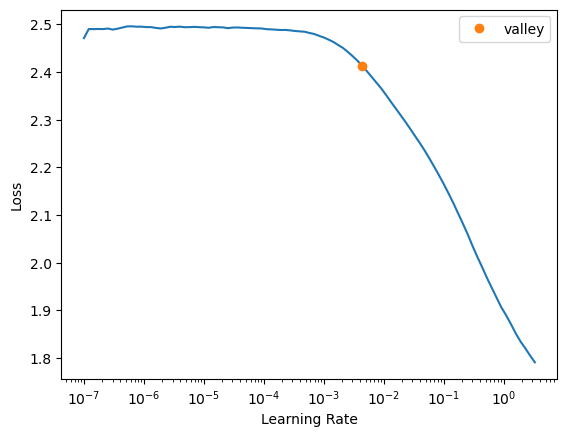

In [312]:
learn.lr_find()

In [313]:
learn.fit_one_cycle(103,0.073, pct_start= 0.4379, div_final=1e3, div=0.4036)

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,1.477949,1.960482,0.593169,0.158390,0.158390,0.194554,0.156021,00:00
1,1.254347,1.329043,0.606306,0.190537,0.190537,0.186270,0.186751,00:00
2,1.176428,1.156579,0.595594,0.193432,0.193432,0.182667,0.187721,00:00
3,1.129177,1.137954,0.592563,0.200074,0.200074,0.184987,0.187545,00:00
4,1.099200,1.106162,0.605901,0.198273,0.198273,0.191682,0.188585,00:00
5,1.077531,1.056895,0.613177,0.182965,0.182965,0.190502,0.181348,00:00
6,1.059567,1.052412,0.609337,0.188574,0.188574,0.187524,0.185797,00:00
7,1.045082,1.038964,0.617219,0.183706,0.183706,0.194279,0.182915,00:00
8,1.031989,1.032046,0.616613,0.183533,0.183533,0.194137,0.182797,00:00
9,1.022243,1.027233,0.617017,0.183376,0.183376,0.194012,0.182588,00:00


In [314]:
learn.save('learner_compu_falta')

Path('models/learner_compu_falta.pth')

In [315]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [320]:
y_predrn = np.array([list(probs).index(max(probs))+1 for probs in preds])

In [323]:
eval_pred_clas(y_predrn,y_test)

(0.6199078564500485,
 0.6199078564500485,
 0.7409569551115706,
 0.6684469002945981)

### Con SVM

In [324]:
svm = SVC(C=1.0)

In [325]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

{'fit_time': array([19.30154514, 17.68865347, 17.52344418, 17.28398299, 17.55020881,
        18.02078414, 18.04210091, 17.3387816 , 18.00907683, 17.10967255]),
 'score_time': array([3.55667424, 3.86561346, 3.53919888, 3.78017116, 3.63780284,
        3.52961659, 3.46869683, 3.7595582 , 3.60570168, 3.59065843]),
 'test_accuracy': array([0.58787879, 0.58811641, 0.58811641, 0.58811641, 0.58811641,
        0.58771221, 0.58771221, 0.58771221, 0.58771221, 0.58771221]),
 'test_recall_weighted': array([0.58787879, 0.58811641, 0.58811641, 0.58811641, 0.58811641,
        0.58771221, 0.58771221, 0.58771221, 0.58771221, 0.58771221]),
 'test_precision_weighted': array([0.34560147, 0.34588091, 0.34588091, 0.34588091, 0.34588091,
        0.34540564, 0.34540564, 0.34540564, 0.34540564, 0.34540564]),
 'test_f1_weighted': array([0.43529956, 0.43558635, 0.43558635, 0.43558635, 0.43558635,
        0.43509855, 0.43509855, 0.43509855, 0.43509855, 0.43509855])}

In [326]:
np.mean(svm_cv["test_accuracy"]), np.mean(svm_cv["test_recall_weighted"]), np.mean(svm_cv["test_precision_weighted"]), np.mean(svm_cv["test_f1_weighted"])

(0.587890546532422, 0.587890546532422, 0.34561533102436304, 0.4353137687758995)

In [327]:
svm.fit(X_train,y_train)

SVC()

In [328]:
y_test_pred = svm.predict(X_test)

In [329]:
accuracy_score(y_test, y_test_pred), recall_score(y_test, y_test_pred, average="weighted"), precision_score(y_test, y_test_pred, average="weighted"), f1_score(y_test, y_test_pred, average="weighted")

(0.5877788554801164,
 0.5877788554801164,
 0.3454839829495156,
 0.4351789693597441)

### Con N-vecinos

In [330]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [331]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.01196861, 0.01307392, 0.00598025, 0.00797343, 0.00996518,
        0.00598025, 0.00697613, 0.00797153, 0.00697708, 0.00697684]),
 'score_time': array([0.89047003, 0.9501853 , 1.29555964, 1.17562151, 0.82326889,
        0.81579781, 0.78625417, 0.80749416, 0.83770514, 0.77253723]),
 'test_accuracy': array([0.55757576, 0.55375909, 0.53839935, 0.54567502, 0.54486661,
        0.543654  , 0.54607922, 0.5541633 , 0.54284559, 0.54971706]),
 'test_recall_weighted': array([0.55757576, 0.55375909, 0.53839935, 0.54567502, 0.54486661,
        0.543654  , 0.54607922, 0.5541633 , 0.54284559, 0.54971706]),
 'test_precision_weighted': array([0.50410345, 0.4931025 , 0.48556484, 0.48990076, 0.49884533,
        0.48547838, 0.49275623, 0.50524991, 0.49647246, 0.50163814]),
 'test_f1_weighted': array([0.52269877, 0.51452516, 0.50617055, 0.50969515, 0.51578812,
        0.5057409 , 0.51165977, 0.52131511, 0.51321244, 0.51775983])}

In [332]:
np.mean(nc_cv["test_accuracy"]), np.mean(nc_cv["test_recall_weighted"]), np.mean(nc_cv["test_precision_weighted"]), np.mean(nc_cv["test_f1_weighted"])

(0.5476735013840914,
 0.5476735013840914,
 0.49531120111455296,
 0.5138565804482551)

In [333]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [334]:
y_test_prednn = nc.predict(X_test)

In [335]:
accuracy_score(y_test, y_test_prednn), recall_score(y_test, y_test_prednn, average="weighted"), precision_score(y_test, y_test_prednn, average="weighted"), f1_score(y_test, y_test_prednn, average="weighted")

(0.5574684772065955,
 0.5574684772065955,
 0.5085350190542474,
 0.5246973682715836)

### Random Forest

In [336]:
rf = RandomForestClassifier(random_state=18)

In [337]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([2.34982443, 2.35367227, 3.09752488, 2.320997  , 2.22378159,
        2.19964623, 2.26162338, 2.31319332, 2.74021316, 2.64262891]),
 'score_time': array([0.08370805, 0.08571315, 0.08978462, 0.0847168 , 0.08272314,
        0.08371997, 0.08584404, 0.10370398, 0.12655139, 0.08471584]),
 'test_accuracy': array([0.60161616, 0.60307195, 0.62287793, 0.61600647, 0.6083266 ,
        0.59862571, 0.59983832, 0.60347615, 0.60226354, 0.61438965]),
 'test_recall_weighted': array([0.60161616, 0.60307195, 0.62287793, 0.61600647, 0.6083266 ,
        0.59862571, 0.59983832, 0.60347615, 0.60226354, 0.61438965]),
 'test_precision_weighted': array([0.54576742, 0.55349116, 0.5664413 , 0.55882201, 0.55125557,
        0.53632483, 0.54315696, 0.54195516, 0.54105683, 0.5550368 ]),
 'test_f1_weighted': array([0.56494859, 0.56472531, 0.58428526, 0.57481983, 0.56748973,
        0.55655715, 0.55983687, 0.56294748, 0.56319161, 0.57433284])}

In [338]:
np.mean(rf_cv["test_accuracy"]), np.mean(rf_cv["test_recall_weighted"]), np.mean(rf_cv["test_precision_weighted"]), np.mean(rf_cv["test_f1_weighted"])

(0.6070492475278247,
 0.6070492475278247,
 0.5493308039262929,
 0.5673134658205365)

In [339]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [340]:
y_test_predrf = rf.predict(X_test)

In [341]:
accuracy_score(y_test, y_test_predrf), recall_score(y_test, y_test_predrf, average="weighted"), precision_score(y_test, y_test_predrf, average="weighted"), f1_score(y_test, y_test_predrf, average="weighted")

(0.600266731328807, 0.600266731328807, 0.5405246646321181, 0.5619020076985144)

### Ensamble

#### Votacion

In [342]:
vot = VotingClassifier(
    estimators=[('svr', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [343]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([28.52004123, 25.48802733, 25.32219028, 25.68574619, 25.63168693,
        25.33891964, 26.56369472, 25.29471302, 25.29289627, 24.92283893]),
 'score_time': array([6.03037143, 5.72166848, 5.88596725, 7.99324489, 5.79318762,
        6.52036214, 5.51015496, 5.71414661, 5.73267174, 5.79004121]),
 'test_accuracy': array([0.60444444, 0.60226354, 0.60226354, 0.60509297, 0.60266774,
        0.59094584, 0.59902991, 0.60307195, 0.60388036, 0.60509297]),
 'test_recall_weighted': array([0.60444444, 0.60226354, 0.60226354, 0.60509297, 0.60266774,
        0.59094584, 0.59902991, 0.60307195, 0.60388036, 0.60509297]),
 'test_precision_weighted': array([0.53238415, 0.51902206, 0.52318972, 0.51841977, 0.52892468,
        0.51076827, 0.52890857, 0.53515249, 0.54393413, 0.54496912]),
 'test_f1_weighted': array([0.5000937 , 0.50024786, 0.49846057, 0.50003906, 0.49965871,
        0.48260318, 0.49809444, 0.50171489, 0.50287003, 0.50041113])}

In [344]:
np.mean(vot_cv["test_accuracy"]), np.mean(vot_cv["test_recall_weighted"]), np.mean(vot_cv["test_precision_weighted"]), np.mean(vot_cv["test_f1_weighted"])

(0.6018753256085512,
 0.6018753256085512,
 0.528567296043721,
 0.49841935817450606)

In [345]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svr', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [346]:
y_test_predvot = vot.predict(X_test)

In [347]:
accuracy_score(y_test, y_test_predvot), recall_score(y_test, y_test_predvot, average="weighted"), precision_score(y_test, y_test_predvot, average="weighted"), f1_score(y_test, y_test_predvot, average="weighted")

(0.6048739088263821,
 0.6048739088263821,
 0.5429587064912693,
 0.5033741034391109)

#### Bagging

In [348]:
bag = BaggingClassifier(
    base_estimator=clone(rf)
)

In [349]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([24.25565934, 23.80217481, 25.82513523, 24.07200861, 23.7979548 ,
        24.00694275, 24.36524439, 23.80133462, 23.79383159, 24.03784561]),
 'score_time': array([1.06730938, 1.00878525, 1.1166656 , 1.14342284, 1.01327229,
        1.04723096, 1.1279397 , 0.99529457, 1.08489251, 1.00516152]),
 'test_accuracy': array([0.61494949, 0.62045271, 0.62894099, 0.62166532, 0.6192401 ,
        0.61398545, 0.61156023, 0.61883589, 0.60994341, 0.62570736]),
 'test_recall_weighted': array([0.61494949, 0.62045271, 0.62894099, 0.62166532, 0.6192401 ,
        0.61398545, 0.61156023, 0.61883589, 0.60994341, 0.62570736]),
 'test_precision_weighted': array([0.54541934, 0.57462368, 0.56647706, 0.54760465, 0.54874595,
        0.55742328, 0.54511552, 0.55298437, 0.54301517, 0.5595047 ]),
 'test_f1_weighted': array([0.57023974, 0.57483957, 0.58090951, 0.570055  , 0.56851233,
        0.56620768, 0.56427438, 0.56943768, 0.5609685 , 0.57901659])}

In [350]:
np.mean(bag_cv["test_accuracy"]), np.mean(bag_cv["test_recall_weighted"]), np.mean(bag_cv["test_precision_weighted"]), np.mean(bag_cv["test_f1_weighted"])

(0.6185280941998808,
 0.6185280941998808,
 0.5540913721603239,
 0.5704460984077141)

In [351]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [352]:
y_test_predbag = bag.predict(X_test)

In [361]:
eval_pred_clas(y_test_predbag, y_test)

(0.6140882638215325,
 0.6140882638215325,
 0.7275548175385085,
 0.6593806836950074)

#### Boost

In [354]:
boost = AdaBoostClassifier(clone(rf)
)

In [355]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([170.33751988, 168.49872065, 169.2360332 , 163.7263267 ,
        164.28422189, 166.38961601, 138.36553955, 134.80754781,
        158.08397055, 145.15590549]),
 'score_time': array([5.61136699, 5.15046334, 6.04853201, 5.12200928, 5.58528781,
        4.73281503, 4.91717291, 4.20116949, 5.45355749, 4.43205333]),
 'test_accuracy': array([0.61858586, 0.61398545, 0.61560226, 0.6196443 , 0.61156023,
        0.60347615, 0.60307195, 0.61519806, 0.61156023, 0.61438965]),
 'test_recall_weighted': array([0.61858586, 0.61398545, 0.61560226, 0.6196443 , 0.61156023,
        0.60347615, 0.60307195, 0.61519806, 0.61156023, 0.61438965]),
 'test_precision_weighted': array([0.54989898, 0.54904235, 0.54164733, 0.54394481, 0.54028687,
        0.53499646, 0.53570438, 0.55355801, 0.54008287, 0.55117283]),
 'test_f1_weighted': array([0.56598653, 0.56232454, 0.55567462, 0.56014743, 0.55869114,
        0.54403466, 0.54737101, 0.56160353, 0.55339482, 0.5702793 ])}

In [356]:
eval_cv_clas(boost_cv)

(0.6127074136678018, 0.6127074136678018, 0.5440334894406321, 0.557950758457119)

In [357]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [358]:
y_test_predboost = boost.predict(X_test)

In [359]:
eval_pred_clas(y_test_predboost,y_test)

(0.6069350145489816, 0.6069350145489816, 0.7494684021258327, 0.661739916426734)


# Internet, detalles

# Tipo de conexión



### Con RN

In [362]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [363]:
y_names = ["P4_5"]

In [371]:
# Filtrado de datos, solo aquellos que tengan internet
train_df = endutih21[(endutih21.internet==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_5
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,1.0
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,1.0
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,1.0
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,2.0
6,101080,1,1,1,1,0,1,1,0,2,...,1,3,1,1,1,1,1,0,9,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58148,3260770,0,1,0,1,0,1,0,0,2,...,4,3,1,1,1,1,1,1,7,1.0
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,1.0
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,2.0
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,1.0


In [372]:
train_df[y_names].value_counts()

P4_5
1.0     23651
3.0      8244
2.0      2015
9.0        94
dtype: int64

In [373]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=18)

In [374]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [375]:
train_df[y_names].value_counts()

P4_5
1.0     20573
3.0      7179
2.0      1756
9.0        75
dtype: int64

In [376]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cpu"
                       )

In [377]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-19 17:00:17,337] A new study created in memory with name: no-name-c5866bb1-49b8-4e84-be3d-8d5fe9d9b72e


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.297554,1.421711,0.403989,0.403989,0.571540,0.452342,00:01
1,1.220519,1.162490,0.563725,0.563725,0.622791,0.583287,00:00
2,1.146925,1.002928,0.576572,0.576572,0.631209,0.594647,00:01
3,1.076872,0.929588,0.623394,0.623394,0.621356,0.617015,00:01
4,1.015510,0.875169,0.657539,0.657539,0.622423,0.588015,00:01
5,0.964300,0.826316,0.677654,0.677654,0.629888,0.608589,00:01
6,0.921452,0.781042,0.684753,0.684753,0.628588,0.621235,00:00
7,0.884203,0.771959,0.682556,0.682556,0.620631,0.584699,00:00
8,0.852768,0.771347,0.672414,0.672414,0.502554,0.575199,00:01
9,0.826402,0.749799,0.676809,0.676809,0.499803,0.574439,00:01


[I 2023-02-19 17:04:11,850] Trial 0 finished with value: 0.3514198660850525 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 161, 'n_neuronas_layer1': 215, 'n_neuronas_layer2': 148, 'n_neuronas_layer3': 186, 'n_neuronas_layer4': 181, 'n_neuronas_layer5': 108, 'bn_final': True, 'embed_p': 0.574653619286769, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 237, 'lr': 0.06752045126680484, 'pct_start': 0.030728209809240396, 'div_final': 728964, 'div': 0.5625580887222266}. Best is trial 0 with value: 0.3514198660850525.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.422396,1.350608,0.248986,0.248986,0.061994,0.099271,00:01
1,1.335614,1.142029,0.635057,0.635057,0.606225,0.616023,00:01
2,1.244820,1.011375,0.602434,0.602434,0.625001,0.611165,00:01
3,1.123697,0.853842,0.648918,0.648918,0.612772,0.607709,00:01
4,1.009144,0.761391,0.683570,0.683570,0.620214,0.605782,00:01
5,0.922055,0.731958,0.686444,0.686444,0.630414,0.585552,00:00
6,0.857322,0.748723,0.664131,0.664131,0.624237,0.622367,00:01
7,0.807331,0.720617,0.671738,0.671738,0.604423,0.607158,00:01
8,0.768091,0.735922,0.670723,0.670723,0.601536,0.601052,00:01
9,0.737404,0.740992,0.670554,0.670554,0.614662,0.615043,00:01


[I 2023-02-19 17:08:08,043] Trial 1 finished with value: 0.36561864614486694 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 162, 'n_neuronas_layer1': 59, 'n_neuronas_layer2': 161, 'n_neuronas_layer3': 145, 'n_neuronas_layer4': 86, 'n_neuronas_layer5': 199, 'n_neuronas_layer6': 71, 'bn_final': False, 'embed_p': 0.18905730101173293, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 223, 'lr': 0.00983151189594582, 'pct_start': 0.8378905131331578, 'div_final': 130097, 'div': 0.46154562013403816}. Best is trial 0 with value: 0.3514198660850525.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.309806,1.156719,0.680527,0.680527,0.563488,0.572864,00:01
1,1.170114,0.906730,0.650947,0.650947,0.618062,0.567472,00:01
2,1.006972,0.815194,0.664807,0.664807,0.628886,0.586788,00:01
3,0.907680,0.722927,0.671231,0.671231,0.602959,0.573828,00:01
4,0.849699,0.848933,0.596180,0.596180,0.574723,0.542554,00:01
5,0.811652,0.758326,0.634043,0.634043,0.623735,0.605797,00:01
6,0.783485,0.708675,0.677992,0.677992,0.653547,0.582983,00:01
7,0.762292,0.705740,0.691007,0.691007,0.497585,0.567100,00:01
8,0.745263,0.703363,0.685091,0.685091,0.503727,0.578859,00:01
9,0.732701,0.714847,0.681711,0.681711,0.623094,0.615824,00:01


[I 2023-02-19 17:10:13,168] Trial 2 finished with value: 0.3747464418411255 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 97, 'n_neuronas_layer1': 206, 'n_neuronas_layer2': 38, 'n_neuronas_layer3': 157, 'n_neuronas_layer4': 87, 'n_neuronas_layer5': 104, 'n_neuronas_layer6': 187, 'bn_final': False, 'embed_p': 0.8601896846233463, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 107, 'lr': 0.03950437080293642, 'pct_start': 0.7268234506104995, 'div_final': 634008, 'div': 0.8904707297957716}. Best is trial 0 with value: 0.3514198660850525.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.395820,1.317069,0.455713,0.455713,0.614116,0.462975,00:00
1,1.341874,1.262385,0.493070,0.493070,0.642608,0.516667,00:00
2,1.308365,1.236029,0.515382,0.515382,0.639245,0.543475,00:00
3,1.280084,1.217882,0.540737,0.540737,0.634457,0.565328,00:00
4,1.254192,1.190070,0.562542,0.562542,0.640082,0.585294,00:00
5,1.229486,1.161517,0.573360,0.573360,0.623691,0.590113,00:00
6,1.205143,1.139835,0.586883,0.586883,0.624813,0.600664,00:00
7,1.181280,1.121925,0.597532,0.597532,0.623225,0.606867,00:00
8,1.157545,1.101278,0.609533,0.609533,0.627611,0.616683,00:00
9,1.133608,1.089218,0.598377,0.598377,0.621212,0.607514,00:00


[I 2023-02-19 17:12:48,874] Trial 3 finished with value: 0.38556456565856934 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 152, 'n_neuronas_layer1': 127, 'n_neuronas_layer2': 94, 'n_neuronas_layer3': 136, 'bn_final': True, 'embed_p': 0.71248899849984, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 240, 'lr': 0.002623358770060315, 'pct_start': 0.82861661243542, 'div_final': 34476, 'div': 0.9173073614092437}. Best is trial 0 with value: 0.3514198660850525.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.332795,1.214337,0.637593,0.637593,0.481996,0.548960,00:01
1,1.031216,0.977943,0.526031,0.526031,0.604520,0.549841,00:01
2,0.923771,1.184154,0.532961,0.532961,0.612226,0.550872,00:01
3,0.863167,0.892774,0.549865,0.549865,0.614775,0.566663,00:01
4,0.821248,0.815497,0.620352,0.620352,0.611416,0.571280,00:01
5,0.789442,0.726942,0.670385,0.670385,0.612618,0.605166,00:01
6,0.765376,0.702420,0.691346,0.691346,0.755469,0.579388,00:01
7,0.747677,0.705286,0.689824,0.689824,0.501921,0.574023,00:02
8,0.732540,0.692022,0.692529,0.692529,0.756054,0.574577,00:01
9,0.720337,0.693245,0.693205,0.693205,0.672428,0.578060,00:01


[I 2023-02-19 17:16:48,805] Trial 4 finished with value: 0.3752535581588745 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 146, 'n_neuronas_layer1': 208, 'n_neuronas_layer2': 48, 'n_neuronas_layer3': 59, 'n_neuronas_layer4': 64, 'n_neuronas_layer5': 83, 'n_neuronas_layer6': 244, 'n_neuronas_layer7': 203, 'bn_final': False, 'embed_p': 0.016986914281011574, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 191, 'lr': 0.01396876397926168, 'pct_start': 0.6195376443859683, 'div_final': 76185, 'div': 0.8062469083810103}. Best is trial 0 with value: 0.3514198660850525.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.271058,5.127752,0.457066,0.457066,0.590311,0.465799,00:01
1,1.004620,1.667671,0.461629,0.461629,0.598263,0.498302,00:01
2,0.894357,1.371369,0.524003,0.524003,0.584882,0.509020,00:01
3,0.838145,0.986289,0.568120,0.568120,0.494119,0.521891,00:01
4,0.800440,0.831186,0.602096,0.602096,0.624790,0.597755,00:01
5,0.775079,0.732076,0.663962,0.663962,0.622050,0.623338,00:01
6,0.755581,0.706932,0.680865,0.680865,0.616850,0.609823,00:01
7,0.739588,0.695406,0.686951,0.686951,0.617971,0.592735,00:01
8,0.727647,0.691982,0.689317,0.689317,0.503458,0.575525,00:01
9,0.718762,0.699206,0.691515,0.691515,0.506270,0.570776,00:01


[I 2023-02-19 17:18:38,107] Trial 5 finished with value: 0.37762004137039185 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 160, 'n_neuronas_layer1': 67, 'n_neuronas_layer2': 239, 'n_neuronas_layer3': 244, 'n_neuronas_layer4': 182, 'n_neuronas_layer5': 97, 'n_neuronas_layer6': 156, 'n_neuronas_layer7': 185, 'n_neuronas_layer8': 185, 'bn_final': False, 'embed_p': 0.2511726710855337, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 81, 'lr': 0.020123376369249, 'pct_start': 0.8306430102553364, 'div_final': 327435, 'div': 0.8597402457341976}. Best is trial 0 with value: 0.3514198660850525.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.176114,6.174101,0.125423,0.125423,0.525279,0.154125,00:01
1,0.986357,1.608533,0.529750,0.529750,0.594508,0.545489,00:01
2,0.881537,1.192620,0.561697,0.561697,0.620526,0.577877,00:01
3,0.820873,0.849321,0.619675,0.619675,0.604677,0.580205,00:01
4,0.780557,0.721534,0.682556,0.682556,0.637771,0.601803,00:01
5,0.752888,0.712423,0.683232,0.683232,0.626633,0.591979,00:01
6,0.732162,0.705158,0.696416,0.696416,0.659755,0.596219,00:01
7,0.717033,0.702058,0.685598,0.685598,0.614112,0.594439,00:01
8,0.705003,0.712100,0.686613,0.686613,0.645431,0.583986,00:01
9,0.694293,0.700376,0.689824,0.689824,0.630034,0.604472,00:01


[I 2023-02-19 17:19:18,955] Trial 6 finished with value: 0.343475341796875 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 150, 'n_neuronas_layer1': 156, 'n_neuronas_layer2': 215, 'n_neuronas_layer3': 189, 'n_neuronas_layer4': 210, 'n_neuronas_layer5': 82, 'n_neuronas_layer6': 223, 'n_neuronas_layer7': 243, 'n_neuronas_layer8': 38, 'bn_final': True, 'embed_p': 0.6663176583034062, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 29, 'lr': 0.03765676238948035, 'pct_start': 0.4406492316758967, 'div_final': 31027, 'div': 0.6129468557565088}. Best is trial 6 with value: 0.343475341796875.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.213694,1.992902,0.687965,0.687965,0.528411,0.567204,00:01
1,0.995747,32.521217,0.248141,0.248141,0.542203,0.124387,00:02
2,0.903596,16.734190,0.260480,0.260480,0.612311,0.156141,00:02
3,0.856032,0.975482,0.614097,0.614097,0.580876,0.592194,00:01
4,0.816439,0.960821,0.621535,0.621535,0.497305,0.550353,00:01
5,0.791364,0.747065,0.665991,0.665991,0.500421,0.571419,00:01
6,0.773125,0.835286,0.570825,0.570825,0.633085,0.590648,00:01
7,0.754417,0.760918,0.616464,0.616464,0.634850,0.621728,00:01
8,0.738662,0.699665,0.689486,0.689486,0.628154,0.603503,00:01
9,0.724504,0.697435,0.688472,0.688472,0.504822,0.578960,00:01


[I 2023-02-19 17:27:34,595] Trial 7 finished with value: 0.35885733366012573 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 102, 'n_neuronas_layer1': 163, 'n_neuronas_layer2': 227, 'n_neuronas_layer3': 186, 'n_neuronas_layer4': 144, 'n_neuronas_layer5': 203, 'n_neuronas_layer6': 204, 'n_neuronas_layer7': 87, 'n_neuronas_layer8': 190, 'n_neuronas_layer9': 212, 'n_neuronas_layer10': 250, 'n_neuronas_layer11': 46, 'n_neuronas_layer12': 223, 'bn_final': False, 'embed_p': 0.8047773225462085, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 247, 'lr': 0.04321939449618838, 'pct_start': 0.69657363189087, 'div_final': 92229, 'div': 0.26521170406592787}. Best is trial 6 with value: 0.343475341796875.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,2.661240,5.007227,0.246788,0.246788,0.542775,0.288368,00:00
1,2.014281,1.216011,0.684077,0.684077,0.486607,0.564488,00:00
2,1.603672,0.995724,0.635903,0.635903,0.496776,0.556624,00:00
3,1.350872,0.804014,0.647059,0.647059,0.497992,0.561962,00:00
4,1.181822,0.953594,0.574206,0.574206,0.497462,0.525484,00:00
5,1.064915,0.727869,0.685260,0.685260,0.495005,0.569495,00:00
6,0.982950,0.729680,0.684584,0.684584,0.502150,0.576852,00:00
7,0.924918,0.714160,0.683739,0.683739,0.593562,0.581553,00:00
8,0.879350,0.706123,0.689993,0.689993,0.503528,0.571931,00:00
9,0.842711,0.709681,0.691515,0.691515,0.535336,0.566637,00:00


[I 2023-02-19 17:28:20,352] Trial 8 finished with value: 0.2750169038772583 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 137, 'bn_final': False, 'embed_p': 0.28404509400499983, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 156, 'lr': 0.08896074526818916, 'pct_start': 0.45156726603968883, 'div_final': 670564, 'div': 0.45392035310100687}. Best is trial 8 with value: 0.2750169038772583.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.361431,1.105837,0.681035,0.681034,0.492989,0.568590,00:00
1,1.171744,0.790443,0.687289,0.687289,0.498625,0.571571,00:00
2,0.990614,0.725448,0.663117,0.663117,0.598764,0.597641,00:00
3,0.893625,0.707367,0.681204,0.681204,0.618827,0.604328,00:00
4,0.836489,0.699115,0.688303,0.688303,0.612694,0.582715,00:00
5,0.798035,0.698273,0.684922,0.684922,0.632635,0.607059,00:00
6,0.770277,0.697280,0.686782,0.686782,0.618160,0.597203,00:00
7,0.747744,0.725323,0.679851,0.679851,0.617683,0.581897,00:00
8,0.730828,0.706863,0.683063,0.683063,0.601731,0.591022,00:00
9,0.717750,0.705016,0.683908,0.683908,0.606164,0.596184,00:00


[I 2023-02-19 17:29:56,172] Trial 9 finished with value: 0.36612576246261597 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 212, 'n_neuronas_layer1': 219, 'bn_final': False, 'embed_p': 0.7624830346243292, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 216, 'lr': 0.04541534198539062, 'pct_start': 0.6559913806193577, 'div_final': 167891, 'div': 0.7076632701283035}. Best is trial 8 with value: 0.2750169038772583.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.861960,5.116331,0.687458,0.687458,0.498441,0.570458,00:00
1,1.383690,1.276947,0.513016,0.513016,0.549514,0.488973,00:00
2,1.179090,0.896314,0.691515,0.691515,0.478192,0.565401,00:00
3,1.075468,0.829303,0.690162,0.690162,0.487487,0.565349,00:00
4,1.003383,0.864205,0.691515,0.691515,0.478192,0.565401,00:00
5,0.951145,0.789193,0.691515,0.691515,0.478192,0.565401,00:00
6,0.909434,0.806944,0.691007,0.691007,0.489522,0.565464,00:00
7,0.877741,0.750964,0.691515,0.691515,0.478192,0.565401,00:00
8,0.850419,0.761413,0.688303,0.688303,0.478886,0.564807,00:00
9,0.826877,0.747883,0.692022,0.692022,0.508588,0.571559,00:00


[I 2023-02-19 17:30:49,571] Trial 10 finished with value: 0.28076404333114624 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 41, 'bn_final': True, 'embed_p': 0.4222990184389298, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 148, 'lr': 0.09865813626262974, 'pct_start': 0.3834673452782572, 'div_final': 956892, 'div': 0.01729701167748543}. Best is trial 8 with value: 0.2750169038772583.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.973200,2.250063,0.618154,0.618154,0.500817,0.549166,00:00
1,0.869015,1.279250,0.458080,0.458080,0.610060,0.497970,00:00
2,0.827152,0.780626,0.634212,0.634212,0.615966,0.594112,00:00
3,0.798922,0.729365,0.678837,0.678837,0.615723,0.601409,00:00
4,0.777046,0.720887,0.689824,0.689824,0.477993,0.564697,00:00
5,0.760428,0.713276,0.691346,0.691346,0.512469,0.566243,00:00
6,0.747511,0.724119,0.691007,0.691007,0.478165,0.565213,00:00
7,0.737530,0.716535,0.691515,0.691515,0.478192,0.565401,00:00
8,0.729170,0.719255,0.689317,0.689317,0.477998,0.564507,00:00
9,0.722318,0.711512,0.690838,0.690838,0.478048,0.565074,00:00


[I 2023-02-19 17:31:46,312] Trial 11 finished with value: 0.2900608777999878 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 47, 'bn_final': True, 'embed_p': 0.4504182090411729, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 155, 'lr': 0.0983826570290947, 'pct_start': 0.39978466844669575, 'div_final': 994361, 'div': 0.05320607758793156}. Best is trial 8 with value: 0.2750169038772583.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.952868,20.212984,0.307133,0.307133,0.577041,0.375589,00:00
1,0.844427,2.932692,0.339588,0.339588,0.631545,0.400975,00:00
2,0.801527,0.949633,0.552400,0.552400,0.607183,0.564265,00:00
3,0.778088,0.748070,0.671062,0.671062,0.607062,0.602181,00:00
4,0.762991,0.743545,0.684922,0.684922,0.500064,0.574013,00:00
5,0.751085,0.730277,0.691515,0.691515,0.478192,0.565401,00:00
6,0.740715,0.726669,0.691515,0.691515,0.478192,0.565401,00:00
7,0.730469,0.727444,0.691515,0.691515,0.478192,0.565401,00:00
8,0.723462,0.745813,0.691515,0.691515,0.478192,0.565401,00:00
9,0.716345,0.715977,0.691515,0.691515,0.478192,0.565401,00:00


[I 2023-02-19 17:33:18,192] Trial 12 finished with value: 0.3510817885398865 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 45, 'n_neuronas_layer1': 104, 'n_neuronas_layer2': 102, 'bn_final': True, 'embed_p': 0.9959846663840417, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 157, 'lr': 0.09980428308065234, 'pct_start': 0.3139168214910619, 'div_final': 992822, 'div': 0.058525283103744385}. Best is trial 8 with value: 0.2750169038772583.


In [378]:
study.best_value

0.2750169038772583

In [379]:
study.best_params

{'n_layers': 1,
 'n_neuronas_layer0': 137,
 'bn_final': False,
 'embed_p': 0.28404509400499983,
 'idx_act_cls': 0,
 'idx_opt_func': 1,
 'epoch': 156,
 'lr': 0.08896074526818916,
 'pct_start': 0.45156726603968883,
 'div_final': 670564,
 'div': 0.45392035310100687}

In [386]:
learn = ft.tabular_learner(dls,
                           layers = [137],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.ReLU(inplace=True), bn_final=False, embed_p=0.284),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.0010000000474974513)

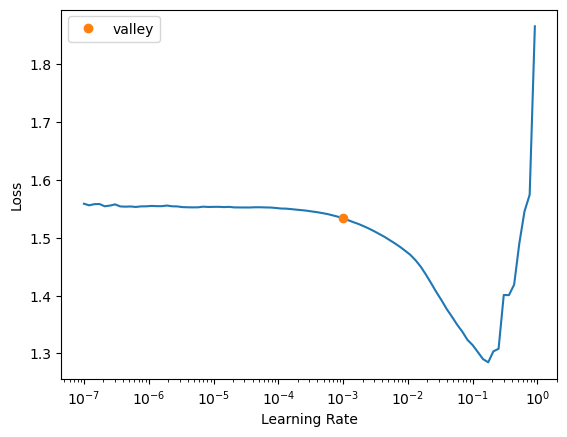

In [384]:
learn.lr_find()

In [387]:
learn.fit_one_cycle(156,0.09)

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,1.313174,1.092324,0.689148,0.262563,0.262563,0.374796,0.232003,00:00
1,1.183838,0.903039,0.682218,0.284157,0.284157,0.373690,0.275558,00:00
2,1.038572,0.760537,0.692191,0.259775,0.259775,0.290031,0.223614,00:00
3,0.934011,0.717420,0.690838,0.276630,0.276630,0.359609,0.251001,00:00
4,0.865167,0.697858,0.685598,0.270998,0.270998,0.345374,0.246799,00:00
5,0.819322,0.698430,0.685260,0.312401,0.312401,0.370646,0.291255,00:00
6,0.786256,0.692148,0.689655,0.282755,0.282755,0.404031,0.262564,00:00
7,0.761960,0.695419,0.687458,0.275864,0.275864,0.360153,0.253663,00:00
8,0.745253,0.702295,0.680358,0.290554,0.290554,0.351120,0.273385,00:00
9,0.731335,0.702328,0.683570,0.309451,0.309451,0.390339,0.282816,00:00


In [389]:
learn.save('learner_internet_tipo')

Path('models/learner_internet_tipo.pth')

In [390]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [391]:
y_predrn = np.array([list(probs).index(max(probs))+1 for probs in preds])

In [392]:
eval_pred_clas(y_predrn,y_test)

(0.6896629721782402,
 0.6896629721782402,
 0.8346813414119156,
 0.7445132468383543)

### Con SVM

In [393]:
svm = SVC(C=1.0)

In [394]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

{'fit_time': array([30.84666443, 27.5750668 , 27.62117219, 26.5351727 , 26.75253606,
        27.27158403, 27.04815483, 26.79692674, 25.91760659, 26.6283915 ]),
 'score_time': array([4.15281868, 4.33044791, 4.17813969, 4.03980136, 4.21340823,
        4.27795124, 4.03773117, 4.20955467, 4.20429564, 4.46695709]),
 'test_accuracy': array([0.69516729, 0.69516729, 0.69516729, 0.6954023 , 0.6954023 ,
        0.6954023 , 0.69574037, 0.69574037, 0.69574037, 0.6954023 ]),
 'test_recall_weighted': array([0.69516729, 0.69516729, 0.69516729, 0.6954023 , 0.6954023 ,
        0.6954023 , 0.69574037, 0.69574037, 0.69574037, 0.6954023 ]),
 'test_precision_weighted': array([0.48325756, 0.48325756, 0.48325756, 0.48358436, 0.48358436,
        0.48358436, 0.48405466, 0.48405466, 0.48405466, 0.48358436]),
 'test_f1_weighted': array([0.57015913, 0.57015913, 0.57015913, 0.57046561, 0.57046561,
        0.57046561, 0.57090657, 0.57090657, 0.57090657, 0.57046561])}

In [395]:
np.mean(svm_cv["test_accuracy"]), np.mean(svm_cv["test_recall_weighted"]), np.mean(svm_cv["test_precision_weighted"]), np.mean(svm_cv["test_f1_weighted"])

(0.6954332149473045,
 0.6954332149473045,
 0.48362740635205503,
 0.5705059562914947)

In [396]:
svm.fit(X_train,y_train)

SVC()

In [397]:
y_test_pred = svm.predict(X_test)

In [398]:
accuracy_score(y_test, y_test_pred), recall_score(y_test, y_test_pred, average="weighted"), precision_score(y_test, y_test_pred, average="weighted"), f1_score(y_test, y_test_pred, average="weighted")

(0.6962225740782628,
 0.6962225740782628,
 0.4847258726561621,
 0.5715356935625798)

### Con N-vecinos

In [399]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [400]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.0304718 , 0.0099225 , 0.01096416, 0.00811458, 0.00897002,
        0.00896645, 0.00897002, 0.01947188, 0.00896978, 0.00793529]),
 'score_time': array([1.23974133, 1.50219035, 1.4175694 , 1.12049818, 1.16558075,
        1.10874271, 1.3362565 , 1.42016554, 1.20151687, 1.10810494]),
 'test_accuracy': array([0.79587699, 0.7894559 , 0.7979047 , 0.78262339, 0.79344151,
        0.80020284, 0.80628803, 0.78363759, 0.78127113, 0.78668019]),
 'test_recall_weighted': array([0.79587699, 0.7894559 , 0.7979047 , 0.78262339, 0.79344151,
        0.80020284, 0.80628803, 0.78363759, 0.78127113, 0.78668019]),
 'test_precision_weighted': array([0.7820214 , 0.77771322, 0.78494329, 0.76733088, 0.77959608,
        0.78587931, 0.79528136, 0.77165817, 0.76505212, 0.77216769]),
 'test_f1_weighted': array([0.78716926, 0.78231334, 0.78977425, 0.77361363, 0.78428601,
        0.79050679, 0.79798355, 0.77611903, 0.77122674, 0.7775423 ])}

In [401]:
np.mean(nc_cv["test_accuracy"]), np.mean(nc_cv["test_recall_weighted"]), np.mean(nc_cv["test_precision_weighted"]), np.mean(nc_cv["test_f1_weighted"])

(0.7917382272623306,
 0.7917382272623306,
 0.7781643532631525,
 0.7830534892245884)

In [402]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [403]:
y_test_prednn = nc.predict(X_test)

In [404]:
accuracy_score(y_test, y_test_prednn), recall_score(y_test, y_test_prednn, average="weighted"), precision_score(y_test, y_test_prednn, average="weighted"), f1_score(y_test, y_test_prednn, average="weighted")

(0.7984618864510292,
 0.7984618864510292,
 0.7821574955641679,
 0.7876776807587007)

### Random Forest

In [405]:
rf = RandomForestClassifier(random_state=18)

In [406]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([3.65599942, 3.54564643, 2.94570255, 3.07820463, 3.06256127,
        4.3322041 , 3.09803462, 2.88701773, 2.82089233, 2.83015847]),
 'score_time': array([0.14750528, 0.09194708, 0.08888435, 0.09957266, 0.0887413 ,
        0.08904505, 0.08597016, 0.09487319, 0.08870363, 0.08770657]),
 'test_accuracy': array([0.74146671, 0.74890166, 0.74180466, 0.74306964, 0.73766058,
        0.73597025, 0.75726842, 0.74543611, 0.73766058, 0.73394185]),
 'test_recall_weighted': array([0.74146671, 0.74890166, 0.74180466, 0.74306964, 0.73766058,
        0.73597025, 0.75726842, 0.74543611, 0.73766058, 0.73394185]),
 'test_precision_weighted': array([0.71748679, 0.72673993, 0.71835084, 0.71886227, 0.71383072,
        0.71114587, 0.73694757, 0.72199207, 0.70971706, 0.71024171]),
 'test_f1_weighted': array([0.71757033, 0.7256173 , 0.71715502, 0.71751811, 0.71681727,
        0.71099771, 0.73709013, 0.72040094, 0.71045999, 0.71020356])}

In [407]:
np.mean(rf_cv["test_accuracy"]), np.mean(rf_cv["test_recall_weighted"]), np.mean(rf_cv["test_precision_weighted"]), np.mean(rf_cv["test_f1_weighted"])

(0.7423180468887278, 0.7423180468887278, 0.718531484016478, 0.7183830361624292)

In [408]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [409]:
y_test_predrf = rf.predict(X_test)

In [410]:
accuracy_score(y_test, y_test_predrf), recall_score(y_test, y_test_predrf, average="weighted"), precision_score(y_test, y_test_predrf, average="weighted"), f1_score(y_test, y_test_predrf, average="weighted")

(0.7529970594888035,
 0.7529970594888035,
 0.7310530741921288,
 0.7289872259803941)

### Ensamble

#### Votacion

In [411]:
vot = VotingClassifier(
    estimators=[('svr', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [412]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([32.21090603, 30.61140323, 29.9260354 , 29.66651297, 29.91744614,
        29.76934385, 29.46805835, 28.93502641, 26.23354363, 27.85255122]),
 'score_time': array([5.57140565, 5.49132252, 5.41795349, 6.0325799 , 5.83392119,
        5.6768508 , 5.84424782, 5.32047939, 5.17577314, 5.70571852]),
 'test_accuracy': array([0.76884082, 0.76782697, 0.76512335, 0.75659229, 0.76402975,
        0.75997295, 0.77518594, 0.76233942, 0.75862069, 0.75625423]),
 'test_recall_weighted': array([0.76884082, 0.76782697, 0.76512335, 0.75659229, 0.76402975,
        0.75997295, 0.77518594, 0.76233942, 0.75862069, 0.75625423]),
 'test_precision_weighted': array([0.76900921, 0.76498909, 0.76871102, 0.75744625, 0.76390694,
        0.75991068, 0.77913024, 0.76261781, 0.75861778, 0.75555345]),
 'test_f1_weighted': array([0.72742587, 0.72663479, 0.72159795, 0.70738847, 0.7211921 ,
        0.71506512, 0.73650819, 0.71684174, 0.70984279, 0.70961687])}

In [413]:
np.mean(vot_cv["test_accuracy"]), np.mean(vot_cv["test_recall_weighted"]), np.mean(vot_cv["test_precision_weighted"]), np.mean(vot_cv["test_f1_weighted"])

(0.7634786412729663, 0.7634786412729663, 0.76398924589101, 0.7192113887030345)

In [414]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svr', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [415]:
y_test_predvot = vot.predict(X_test)

In [416]:
accuracy_score(y_test, y_test_predvot), recall_score(y_test, y_test_predvot, average="weighted"), precision_score(y_test, y_test_predvot, average="weighted"), f1_score(y_test, y_test_predvot, average="weighted")

(0.7710925130061073, 0.7710925130061073, 0.774225073050609, 0.7299793978379213)

#### Bagging

In [430]:
bag = BaggingClassifier(
    base_estimator=clone(nc)
)

In [431]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([0.16713214, 0.15946221, 0.14252663, 0.13953257, 0.23249793,
        0.19094539, 0.16500401, 0.14312363, 0.17614698, 0.35254002]),
 'score_time': array([12.9062078 , 13.16583061, 12.65131807, 12.36863542, 11.88423729,
        12.60960603, 12.64758635, 12.92820072, 12.67232442, 12.69097233]),
 'test_accuracy': array([0.79689084, 0.79621494, 0.78911795, 0.78228533, 0.78701826,
        0.79039892, 0.80290737, 0.78262339, 0.78465179, 0.78668019]),
 'test_recall_weighted': array([0.79689084, 0.79621494, 0.78911795, 0.78228533, 0.78701826,
        0.79039892, 0.80290737, 0.78262339, 0.78465179, 0.78668019]),
 'test_precision_weighted': array([0.78032   , 0.78369743, 0.77495273, 0.76578746, 0.77273163,
        0.77468811, 0.79173055, 0.76873936, 0.76874618, 0.77095967]),
 'test_f1_weighted': array([0.78585919, 0.78773509, 0.77955051, 0.77215049, 0.77752519,
        0.7797913 , 0.79399879, 0.77330094, 0.77424483, 0.77630038])}

In [432]:
np.mean(bag_cv["test_accuracy"]), np.mean(bag_cv["test_recall_weighted"]), np.mean(bag_cv["test_precision_weighted"]), np.mean(bag_cv["test_f1_weighted"])

(0.789878897101953, 0.789878897101953, 0.7752353111352829, 0.7800456701510358)

In [433]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6,
                                                      weights='distance'))

In [434]:
y_test_predbag = bag.predict(X_test)

In [435]:
eval_pred_clas(y_test_predbag, y_test)

(0.7932594435648044,
 0.7932594435648044,
 0.8226262258279406,
 0.8058451604932476)

#### Boost

In [436]:
boost = AdaBoostClassifier(clone(rf)
)

In [437]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([201.86154294, 200.37285113, 188.8997705 , 205.63156891,
        202.84614849, 203.14335823, 202.57677746, 201.54495645,
        198.63633037, 189.15613413]),
 'score_time': array([5.69390392, 5.79208374, 5.11571169, 5.63378167, 5.97304153,
        4.96057677, 5.16311622, 4.9531064 , 4.9958539 , 5.55415559]),
 'test_accuracy': array([0.74180466, 0.74045286, 0.73436972, 0.73664638, 0.73191346,
        0.73597025, 0.7484787 , 0.73597025, 0.73833671, 0.73664638]),
 'test_recall_weighted': array([0.74180466, 0.74045286, 0.73436972, 0.73664638, 0.73191346,
        0.73597025, 0.7484787 , 0.73597025, 0.73833671, 0.73664638]),
 'test_precision_weighted': array([0.71733285, 0.71530345, 0.7061165 , 0.70996428, 0.70359603,
        0.7126515 , 0.72784891, 0.70967665, 0.70970833, 0.7128608 ]),
 'test_f1_weighted': array([0.71104839, 0.70608284, 0.69981633, 0.69557141, 0.69758964,
        0.69918443, 0.71945102, 0.70173149, 0.69948947, 0.69903191])}

In [438]:
eval_cv_clas(boost_cv)

(0.7380589375510842,
 0.7380589375510842,
 0.7125059292193153,
 0.7028996940509875)

In [439]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [440]:
y_test_predboost = boost.predict(X_test)

In [441]:
eval_pred_clas(y_test_predboost,y_test)

(0.7529970594888035,
 0.7529970594888035,
 0.8576350990765828,
 0.7888773137937325)

# Internet por línea dedicada



### Con RN

In [442]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [443]:
y_names = ["P4_6_1"]

In [444]:
# Filtrado de datos, solo aquellos que tengan internet
train_df = endutih21[(endutih21.internet==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_6_1
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,1.0
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,2.0
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,2.0
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,0.0
6,101080,1,1,1,1,0,1,1,0,2,...,1,3,1,1,1,1,1,0,9,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58148,3260770,0,1,0,1,0,1,0,0,2,...,4,3,1,1,1,1,1,1,7,2.0
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,2.0
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,0.0
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,2.0


In [445]:
train_df[y_names].value_counts()

P4_6_1
2.0       17475
1.0       14420
0.0        2109
dtype: int64

In [446]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=18)

In [447]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [448]:
train_df[y_names].value_counts()

P4_6_1
2.0       15231
1.0       12521
0.0        1831
dtype: int64

In [449]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cpu"
                       )

In [450]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-19 19:00:29,572] A new study created in memory with name: no-name-1ff29c77-4f0c-4ad0-a8cb-c16ea53a7265


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,120.335312,1671.420044,0.417512,0.417512,0.567370,0.272272,00:01
1,77.379295,65.424164,0.349053,0.349053,0.456372,0.363474,00:01
2,54.367779,49.832806,0.445402,0.445402,0.479748,0.318007,00:01
3,42.573139,16.391890,0.441853,0.441853,0.494817,0.450806,00:01
4,31.920586,9.524651,0.329784,0.329784,0.604272,0.253702,00:01
5,24.062366,3.713086,0.354970,0.354970,0.487131,0.291196,00:01
6,18.516813,2.205498,0.426471,0.426471,0.505882,0.439318,00:01
7,14.536300,2.315751,0.435091,0.435091,0.501156,0.453907,00:01
8,11.589732,2.333527,0.444388,0.444388,0.515966,0.453758,00:01
9,9.365957,2.223226,0.450473,0.450473,0.517574,0.458504,00:01


[I 2023-02-19 19:04:43,525] Trial 0 finished with value: 0.343644380569458 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 220, 'n_neuronas_layer1': 101, 'n_neuronas_layer2': 73, 'n_neuronas_layer3': 103, 'bn_final': False, 'embed_p': 0.22624686173911984, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 215, 'lr': 0.04471955987466919, 'pct_start': 0.02849569618490755, 'div_final': 800893, 'div': 0.027847794426261965}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.311384,9.899084,0.441684,0.441684,0.482977,0.389303,00:01
1,1.051563,1.706396,0.629648,0.629648,0.634160,0.584885,00:01
2,0.949147,0.942937,0.634719,0.634719,0.637113,0.592099,00:01
3,0.887171,0.814174,0.614604,0.614604,0.657376,0.603379,00:01
4,0.844636,0.738959,0.647904,0.647904,0.656646,0.613394,00:01
5,0.816379,0.762727,0.614435,0.614435,0.608338,0.591934,00:01
6,0.794680,0.734061,0.652468,0.652468,0.644700,0.642818,00:01
7,0.779754,0.752428,0.608519,0.608519,0.619287,0.587746,00:01
8,0.767660,0.729635,0.653989,0.653989,0.697571,0.622314,00:01
9,0.757316,0.723655,0.659060,0.659060,0.621043,0.637223,00:01


[I 2023-02-19 19:07:53,288] Trial 1 finished with value: 0.40094655752182007 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 73, 'n_neuronas_layer1': 171, 'n_neuronas_layer2': 227, 'n_neuronas_layer3': 120, 'n_neuronas_layer4': 203, 'n_neuronas_layer5': 78, 'bn_final': False, 'embed_p': 0.5284618780462552, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 170, 'lr': 0.02743932908169824, 'pct_start': 0.08851639974888852, 'div_final': 127344, 'div': 0.23800894701035222}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.965161,1.593666,0.541751,0.541751,0.611506,0.554392,00:01
1,0.893661,5.583117,0.419878,0.419878,0.593513,0.396774,00:01
2,0.844032,2.790250,0.475659,0.475659,0.617046,0.488799,00:01
3,0.806214,1.495830,0.554598,0.554598,0.635290,0.575533,00:01
4,0.779321,0.921540,0.609703,0.609703,0.649773,0.622574,00:01
5,0.760550,0.784492,0.631846,0.631846,0.652092,0.637878,00:01
6,0.746614,0.808778,0.628127,0.628127,0.640748,0.632114,00:01
7,0.734649,0.770989,0.628127,0.628127,0.646186,0.634812,00:01
8,0.724788,0.745786,0.651285,0.651285,0.647491,0.643881,00:01
9,0.717009,0.754376,0.635565,0.635565,0.637044,0.635445,00:01


[I 2023-02-19 19:09:53,339] Trial 2 finished with value: 0.41446924209594727 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 193, 'n_neuronas_layer1': 144, 'n_neuronas_layer2': 173, 'n_neuronas_layer3': 112, 'n_neuronas_layer4': 211, 'n_neuronas_layer5': 90, 'n_neuronas_layer6': 100, 'n_neuronas_layer7': 118, 'bn_final': True, 'embed_p': 0.9375752092019751, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 97, 'lr': 0.07468091375888629, 'pct_start': 0.7309922405111755, 'div_final': 575750, 'div': 0.4091856968602852}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.001981,67.240723,0.289047,0.289047,0.529201,0.262038,00:01
1,0.906740,22.142263,0.645537,0.645538,0.641792,0.610864,00:01
2,0.864918,5.603255,0.509973,0.509973,0.649156,0.547366,00:01
3,0.828846,2.257009,0.501521,0.501521,0.647061,0.542534,00:01
4,0.804567,1.102097,0.606660,0.606660,0.657872,0.616045,00:01
5,0.793876,0.950715,0.588066,0.588066,0.656715,0.609442,00:01
6,0.777661,0.908480,0.613590,0.613590,0.649913,0.626082,00:01
7,0.765671,0.765385,0.634719,0.634719,0.643760,0.638318,00:02
8,0.754415,0.742126,0.646721,0.646721,0.654536,0.646633,00:01
9,0.746052,0.728075,0.647397,0.647397,0.651435,0.638887,00:01


[I 2023-02-19 19:15:30,764] Trial 3 finished with value: 0.4117646813392639 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 76, 'n_neuronas_layer1': 179, 'n_neuronas_layer2': 198, 'n_neuronas_layer3': 211, 'n_neuronas_layer4': 34, 'n_neuronas_layer5': 153, 'n_neuronas_layer6': 40, 'n_neuronas_layer7': 104, 'n_neuronas_layer8': 186, 'bn_final': False, 'embed_p': 0.3130879357302082, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 232, 'lr': 0.06625765114643208, 'pct_start': 0.2975979379679748, 'div_final': 472429, 'div': 0.15425649613812784}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.884743,361.289032,0.552400,0.552400,0.593540,0.514345,00:02
1,0.814279,24.079945,0.402975,0.402975,0.541236,0.325250,00:02
2,0.784224,6.227208,0.430865,0.430865,0.607489,0.390469,00:02
3,0.766800,2.166027,0.604293,0.604293,0.600626,0.591077,00:02
4,0.756188,0.993261,0.615450,0.615450,0.626011,0.613033,00:02
5,0.748788,0.872880,0.632353,0.632353,0.643572,0.635960,00:02
6,0.742227,0.805093,0.627789,0.627789,0.629275,0.623222,00:02
7,0.737418,0.728704,0.660920,0.660920,0.655424,0.651896,00:02
8,0.733122,0.733089,0.660751,0.660751,0.659475,0.650142,00:02
9,0.729523,0.736192,0.659567,0.659567,0.664616,0.646962,00:02


[I 2023-02-19 19:23:08,904] Trial 4 finished with value: 0.413116991519928 and parameters: {'n_layers': 12, 'n_neuronas_layer0': 111, 'n_neuronas_layer1': 212, 'n_neuronas_layer2': 152, 'n_neuronas_layer3': 42, 'n_neuronas_layer4': 252, 'n_neuronas_layer5': 83, 'n_neuronas_layer6': 223, 'n_neuronas_layer7': 34, 'n_neuronas_layer8': 56, 'n_neuronas_layer9': 93, 'n_neuronas_layer10': 249, 'n_neuronas_layer11': 116, 'bn_final': True, 'embed_p': 0.17572232246659542, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 202, 'lr': 0.08281994833201088, 'pct_start': 0.8753586209405748, 'div_final': 412071, 'div': 0.570187356689626}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.009633,0.950169,0.587390,0.587390,0.576627,0.561364,00:02
1,0.933466,0.886749,0.627282,0.627282,0.636766,0.630923,00:02
2,0.881189,0.843746,0.632015,0.632015,0.644235,0.636565,00:02
3,0.839534,0.760819,0.643847,0.643847,0.652261,0.643968,00:02
4,0.808218,0.732380,0.652130,0.652130,0.645314,0.639180,00:02
5,0.785891,0.726379,0.653989,0.653989,0.651946,0.648478,00:02
6,0.768890,0.721673,0.645369,0.645368,0.649987,0.643577,00:02
7,0.756010,0.718150,0.654834,0.654834,0.655233,0.643205,00:02
8,0.746687,0.722016,0.654327,0.654327,0.654323,0.644656,00:02
9,0.738926,0.714149,0.659567,0.659567,0.654113,0.650606,00:02


[I 2023-02-19 19:30:39,413] Trial 5 finished with value: 0.4212305545806885 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 41, 'n_neuronas_layer1': 178, 'n_neuronas_layer2': 243, 'n_neuronas_layer3': 38, 'n_neuronas_layer4': 223, 'n_neuronas_layer5': 253, 'n_neuronas_layer6': 38, 'n_neuronas_layer7': 124, 'n_neuronas_layer8': 93, 'n_neuronas_layer9': 90, 'n_neuronas_layer10': 92, 'n_neuronas_layer11': 172, 'n_neuronas_layer12': 48, 'bn_final': False, 'embed_p': 0.6348110704603703, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 202, 'lr': 0.003690093903219706, 'pct_start': 0.31036948831634836, 'div_final': 668612, 'div': 0.8305732344550031}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.994995,13998.949219,0.513523,0.513523,0.405759,0.348920,00:01
1,0.875173,21.978191,0.436613,0.436613,0.489984,0.300692,00:01
2,0.823218,1.108548,0.618154,0.618154,0.611656,0.614521,00:01
3,0.795004,0.788441,0.649087,0.649087,0.637214,0.628479,00:01
4,0.776293,0.754724,0.649932,0.649932,0.639554,0.623553,00:01
5,0.763548,0.775715,0.633029,0.633029,0.596491,0.612773,00:01
6,0.753362,0.787188,0.631508,0.631508,0.636508,0.587230,00:01
7,0.745530,0.790479,0.634888,0.634888,0.638027,0.591801,00:01
8,0.739219,0.805239,0.629479,0.629479,0.632065,0.585718,00:01
9,0.733700,0.789293,0.639452,0.639452,0.631728,0.601885,00:01


[I 2023-02-19 19:33:29,623] Trial 6 finished with value: 0.39553749561309814 and parameters: {'n_layers': 11, 'n_neuronas_layer0': 239, 'n_neuronas_layer1': 188, 'n_neuronas_layer2': 89, 'n_neuronas_layer3': 201, 'n_neuronas_layer4': 175, 'n_neuronas_layer5': 204, 'n_neuronas_layer6': 161, 'n_neuronas_layer7': 147, 'n_neuronas_layer8': 40, 'n_neuronas_layer9': 109, 'n_neuronas_layer10': 96, 'bn_final': True, 'embed_p': 0.9163211508459838, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 102, 'lr': 0.020224026087724705, 'pct_start': 0.1872432129455463, 'div_final': 697417, 'div': 0.011166053072459872}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.101547,1.000354,0.529581,0.529581,0.582468,0.486771,00:00
1,1.025773,0.941385,0.566092,0.566092,0.624546,0.565417,00:00
2,0.985438,0.926336,0.576910,0.576910,0.633210,0.584405,00:00
3,0.958929,0.900898,0.603617,0.603617,0.635131,0.611018,00:00
4,0.937292,0.878548,0.624239,0.624239,0.637039,0.627593,00:00
5,0.917736,0.859518,0.637255,0.637255,0.639414,0.637473,00:00
6,0.900244,0.832109,0.645369,0.645368,0.640743,0.642478,00:00
7,0.883243,0.817006,0.650947,0.650947,0.642811,0.644417,00:00
8,0.867605,0.801669,0.657201,0.657201,0.649371,0.647411,00:00
9,0.852758,0.789620,0.656356,0.656356,0.649394,0.645380,00:00


[I 2023-02-19 19:35:38,019] Trial 7 finished with value: 0.3478701710700989 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 62, 'bn_final': True, 'embed_p': 0.9106092185860657, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 242, 'lr': 0.016751079120106725, 'pct_start': 0.4678568806070881, 'div_final': 639061, 'div': 0.806993652107831}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.937860,40.342899,0.602772,0.602772,0.617381,0.593189,00:02
1,0.837417,5.061974,0.614774,0.614773,0.647752,0.623875,00:02
2,0.797046,2.168362,0.602772,0.602772,0.659495,0.614531,00:02
3,0.771728,1.256803,0.573022,0.573022,0.643465,0.582425,00:02
4,0.756033,0.831603,0.615788,0.615788,0.646446,0.622433,00:02
5,0.745304,0.777444,0.639959,0.639959,0.653093,0.644458,00:02
6,0.737457,0.743423,0.643171,0.643171,0.655530,0.647434,00:02
7,0.732096,0.740573,0.630832,0.630832,0.639477,0.629401,00:02
8,0.727852,0.724502,0.650101,0.650101,0.643510,0.635215,00:02
9,0.724812,0.722108,0.661765,0.661765,0.659524,0.649066,00:02


[I 2023-02-19 19:39:27,792] Trial 8 finished with value: 0.4164976477622986 and parameters: {'n_layers': 11, 'n_neuronas_layer0': 77, 'n_neuronas_layer1': 180, 'n_neuronas_layer2': 144, 'n_neuronas_layer3': 184, 'n_neuronas_layer4': 254, 'n_neuronas_layer5': 94, 'n_neuronas_layer6': 219, 'n_neuronas_layer7': 232, 'n_neuronas_layer8': 234, 'n_neuronas_layer9': 43, 'n_neuronas_layer10': 68, 'bn_final': True, 'embed_p': 0.17185040149601383, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 105, 'lr': 0.042199405611326284, 'pct_start': 0.21838960262972376, 'div_final': 283190, 'div': 0.483912325035979}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.908973,208.310532,0.297329,0.297329,0.509623,0.371897,00:01
1,0.836168,50.444698,0.248141,0.248141,0.524759,0.242220,00:01
2,0.800783,5.696146,0.328431,0.328431,0.556531,0.363384,00:01
3,0.781415,1.194819,0.516903,0.516903,0.638798,0.544246,00:01
4,0.768087,0.887150,0.560852,0.560852,0.633716,0.578895,00:01
5,0.758916,0.736351,0.636748,0.636748,0.629663,0.631274,00:01
6,0.752149,0.728685,0.642664,0.642664,0.646966,0.615550,00:01
7,0.745960,0.740669,0.643002,0.643002,0.622091,0.612222,00:01
8,0.741339,0.732537,0.638945,0.638945,0.629197,0.602397,00:01
9,0.737642,0.738106,0.643171,0.643171,0.630358,0.608559,00:01


[I 2023-02-19 19:44:35,646] Trial 9 finished with value: 0.41244083642959595 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 63, 'n_neuronas_layer1': 157, 'n_neuronas_layer2': 202, 'n_neuronas_layer3': 163, 'n_neuronas_layer4': 80, 'n_neuronas_layer5': 36, 'bn_final': True, 'embed_p': 0.2809943853471071, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 206, 'lr': 0.06320078586066527, 'pct_start': 0.44075606378998855, 'div_final': 742101, 'div': 0.10564762216585616}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.885425,0.792425,0.618492,0.618492,0.601320,0.597594,00:00
1,0.807182,0.738873,0.640128,0.640128,0.662649,0.620491,00:00
2,0.772546,0.728225,0.656694,0.656694,0.656367,0.631421,00:00
3,0.754989,0.724419,0.657539,0.657539,0.656338,0.644610,00:00
4,0.743927,0.730318,0.645030,0.645030,0.648747,0.635393,00:00
5,0.736213,0.714498,0.656694,0.656694,0.653674,0.646028,00:00
6,0.730184,0.725672,0.648749,0.648749,0.641241,0.641851,00:00
7,0.724718,0.740789,0.649256,0.649256,0.641481,0.633969,00:00
8,0.721933,0.720579,0.660581,0.660581,0.658200,0.649871,00:00
9,0.718355,0.717199,0.659060,0.659060,0.650649,0.650659,00:00


[I 2023-02-19 19:45:03,052] Trial 10 finished with value: 0.3803245425224304 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 172, 'n_neuronas_layer1': 65, 'bn_final': False, 'embed_p': 0.031154979099198565, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 50, 'lr': 0.09556908457062649, 'pct_start': 0.04229932103260703, 'div_final': 996263, 'div': 0.26422981717980204}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.970691,0.934463,0.568120,0.568120,0.596121,0.540720,00:00
1,0.899325,0.766608,0.635565,0.635565,0.633206,0.614337,00:00
2,0.836517,0.732015,0.641481,0.641481,0.632222,0.629638,00:00
3,0.801643,0.747378,0.636917,0.636917,0.641466,0.628315,00:00
4,0.782582,0.743938,0.638100,0.638100,0.649844,0.634201,00:00
5,0.768902,0.718851,0.660412,0.660412,0.655705,0.648772,00:00
6,0.758387,0.723321,0.652806,0.652806,0.647088,0.642168,00:00
7,0.749845,0.724186,0.647397,0.647397,0.642666,0.629813,00:00
8,0.744236,0.725167,0.649087,0.649087,0.647399,0.635560,00:00
9,0.738878,0.723929,0.648749,0.648749,0.642537,0.631918,00:00


[I 2023-02-19 19:46:49,109] Trial 11 finished with value: 0.35429346561431885 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 256, 'bn_final': False, 'embed_p': 0.7076791309191133, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 250, 'lr': 0.04576981310515697, 'pct_start': 0.5265598222367851, 'div_final': 881767, 'div': 0.9503904187440155}. Best is trial 0 with value: 0.343644380569458.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.033512,0.997696,0.510142,0.510142,0.628213,0.478755,00:00
1,0.975611,0.898006,0.609195,0.609195,0.629891,0.608497,00:00
2,0.944894,0.875571,0.638100,0.638100,0.643591,0.636615,00:00
3,0.922611,0.860457,0.640467,0.640467,0.647025,0.642031,00:00
4,0.902682,0.841772,0.646890,0.646890,0.648522,0.643919,00:00
5,0.884292,0.821613,0.654496,0.654496,0.651191,0.648814,00:00
6,0.867931,0.814253,0.631339,0.631339,0.643196,0.630665,00:00
7,0.852215,0.795807,0.649594,0.649594,0.648479,0.648414,00:00
8,0.837425,0.776957,0.655003,0.655003,0.651708,0.651552,00:00
9,0.823459,0.768851,0.656694,0.656694,0.655223,0.641808,00:00


[I 2023-02-19 19:48:45,402] Trial 12 finished with value: 0.4100743532180786 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 135, 'n_neuronas_layer1': 72, 'n_neuronas_layer2': 45, 'bn_final': True, 'embed_p': 0.42689893698815917, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 157, 'lr': 0.02899866177181795, 'pct_start': 0.017360310613742165, 'div_final': 842212, 'div': 0.6741851693778567}. Best is trial 0 with value: 0.343644380569458.


In [451]:
study.best_value

0.343644380569458

In [452]:
study.best_params

{'n_layers': 4,
 'n_neuronas_layer0': 220,
 'n_neuronas_layer1': 101,
 'n_neuronas_layer2': 73,
 'n_neuronas_layer3': 103,
 'bn_final': False,
 'embed_p': 0.22624686173911984,
 'idx_act_cls': 2,
 'idx_opt_func': 1,
 'epoch': 215,
 'lr': 0.04471955987466919,
 'pct_start': 0.02849569618490755,
 'div_final': 800893,
 'div': 0.027847794426261965}

In [453]:
learn = ft.tabular_learner(dls,
                           layers = [220, 101,73,103],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.CELU(inplace=True), bn_final=False, embed_p=0.2262),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.0004786300996784121)

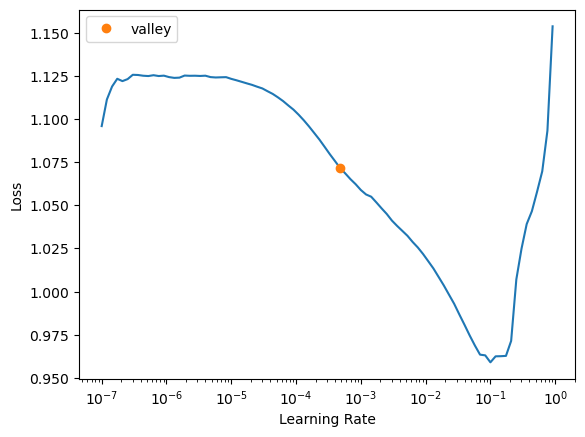

In [454]:
learn.lr_find()

In [455]:
learn.fit_one_cycle(215,0.04472, pct_start= 0.0285, div_final=80e4, div=0.0278)

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,70.711586,2053.427734,0.418357,0.368470,0.368470,0.297768,0.302000,00:01
1,48.892731,19.821243,0.526031,0.510294,0.510294,0.459027,0.458170,00:01
2,33.786636,14.894240,0.431542,0.374452,0.374452,0.475063,0.266452,00:01
3,25.991371,7.113486,0.425625,0.484826,0.484826,0.411061,0.306247,00:01
4,19.166815,1.940416,0.423597,0.520003,0.520003,0.484548,0.345091,00:01
5,14.356754,0.959046,0.587559,0.504757,0.504757,0.506341,0.503615,00:01
6,10.993535,0.919058,0.635396,0.451042,0.451042,0.615610,0.447340,00:01
7,8.573580,0.861905,0.613928,0.536265,0.536265,0.535531,0.524856,00:01
8,6.808440,0.843842,0.619168,0.486004,0.486004,0.546923,0.497316,00:01
9,5.478762,0.824882,0.615450,0.452858,0.452858,0.584535,0.446872,00:01


In [456]:
learn.save('learner_internet_linea')

Path('models/learner_internet_linea.pth')

In [457]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [458]:
y_predrn = np.array([list(probs).index(max(probs))+1 for probs in preds])

In [459]:
eval_pred_clas(y_predrn,y_test)

(0.09658448314860892,
 0.0965844831486089,
 0.06427559990297885,
 0.07651387816916082)

### Con SVM

In [460]:
svm = SVC(C=1.0)

In [461]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

{'fit_time': array([44.63228273, 43.2774415 , 43.81749296, 43.46114159, 43.56124902,
        43.33063388, 42.94144988, 43.17961764, 43.23117781, 42.55656385]),
 'score_time': array([6.30889368, 6.74912643, 7.24333835, 7.18063092, 6.29671478,
        6.28891873, 6.28396606, 6.27114701, 6.27104044, 6.19900632]),
 'test_accuracy': array([0.51470091, 0.51470091, 0.51503886, 0.51487492, 0.51487492,
        0.51487492, 0.51487492, 0.51487492, 0.51487492, 0.51487492]),
 'test_recall_weighted': array([0.51470091, 0.51470091, 0.51503886, 0.51487492, 0.51487492,
        0.51487492, 0.51487492, 0.51487492, 0.51487492, 0.51487492]),
 'test_precision_weighted': array([0.26491703, 0.26491703, 0.26526503, 0.26509618, 0.26509618,
        0.26509618, 0.26509618, 0.26509618, 0.26509618, 0.26509618]),
 'test_f1_weighted': array([0.34979451, 0.34979451, 0.35017588, 0.34999085, 0.34999085,
        0.34999085, 0.34999085, 0.34999085, 0.34999085, 0.34999085])}

In [462]:
np.mean(svm_cv["test_accuracy"]), np.mean(svm_cv["test_recall_weighted"]), np.mean(svm_cv["test_precision_weighted"]), np.mean(svm_cv["test_f1_weighted"])

(0.5148565097806145,
 0.5148565097806145,
 0.26507723406804323,
 0.34997008312604055)

In [463]:
svm.fit(X_train,y_train)

SVC()

In [464]:
y_test_pred = svm.predict(X_test)

In [465]:
accuracy_score(y_test, y_test_pred), recall_score(y_test, y_test_pred, average="weighted"), precision_score(y_test, y_test_pred, average="weighted"), f1_score(y_test, y_test_pred, average="weighted")

(0.507577471160371, 0.507577471160371, 0.25763488922955724, 0.3417866002352205)

### Con N-vecinos

In [466]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [467]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.00996685, 0.01196003, 0.01101041, 0.01196003, 0.01196027,
        0.01096487, 0.01096344, 0.01096368, 0.01096344, 0.0109632 ]),
 'score_time': array([1.21999192, 1.03574204, 1.11593747, 1.11909819, 1.13516068,
        1.085356  , 1.14560008, 1.10966492, 1.14786863, 1.11349654]),
 'test_accuracy': array([0.61879013, 0.64177087, 0.64008111, 0.62609872, 0.64570656,
        0.65280595, 0.64672076, 0.64536849, 0.62745098, 0.64164976]),
 'test_recall_weighted': array([0.61879013, 0.64177087, 0.64008111, 0.62609872, 0.64570656,
        0.65280595, 0.64672076, 0.64536849, 0.62745098, 0.64164976]),
 'test_precision_weighted': array([0.61299885, 0.63627008, 0.63393229, 0.61851665, 0.63970316,
        0.64722783, 0.64289187, 0.63971216, 0.62101624, 0.63434032]),
 'test_f1_weighted': array([0.6144953 , 0.63791591, 0.63576349, 0.62124334, 0.64116704,
        0.64874737, 0.64284968, 0.64044473, 0.62325409, 0.63611614])}

In [468]:
np.mean(nc_cv["test_accuracy"]), np.mean(nc_cv["test_recall_weighted"]), np.mean(nc_cv["test_precision_weighted"]), np.mean(nc_cv["test_f1_weighted"])

(0.6386443325859087,
 0.6386443325859087,
 0.6326609430040638,
 0.6341997090613385)

In [469]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [470]:
y_test_prednn = nc.predict(X_test)

In [471]:
accuracy_score(y_test, y_test_prednn), recall_score(y_test, y_test_prednn, average="weighted"), precision_score(y_test, y_test_prednn, average="weighted"), f1_score(y_test, y_test_prednn, average="weighted")

(0.6437457588780818,
 0.6437457588780818,
 0.6363930755998705,
 0.6379238794811805)

### Random Forest

In [472]:
rf = RandomForestClassifier(random_state=18)

In [473]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([3.83113742, 3.15954328, 3.08055449, 3.10913301, 3.8183639 ,
        3.13988662, 3.1519928 , 3.07010293, 3.09088683, 3.86506653]),
 'score_time': array([0.08671165, 0.09070063, 0.08770633, 0.08870363, 0.1106298 ,
        0.08571315, 0.0864706 , 0.08670974, 0.08571315, 0.08770657]),
 'test_accuracy': array([0.64616424, 0.66813113, 0.65461304, 0.65449628, 0.66125761,
        0.65956728, 0.65787694, 0.66024341, 0.64164976, 0.65990534]),
 'test_recall_weighted': array([0.64616424, 0.66813113, 0.65461304, 0.65449628, 0.66125761,
        0.65956728, 0.65787694, 0.66024341, 0.64164976, 0.65990534]),
 'test_precision_weighted': array([0.64115971, 0.66330323, 0.64867486, 0.64903123, 0.65508588,
        0.65488328, 0.65424539, 0.65493027, 0.63565112, 0.65645848]),
 'test_f1_weighted': array([0.64097735, 0.66241497, 0.64836686, 0.64806228, 0.65452613,
        0.65450174, 0.65330829, 0.6531213 , 0.63587505, 0.65378603])}

In [474]:
np.mean(rf_cv["test_accuracy"]), np.mean(rf_cv["test_recall_weighted"]), np.mean(rf_cv["test_precision_weighted"]), np.mean(rf_cv["test_f1_weighted"])

(0.6563905034342459,
 0.6563905034342459,
 0.6513423460981038,
 0.6504939993487218)

In [475]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [476]:
y_test_predrf = rf.predict(X_test)

In [477]:
accuracy_score(y_test, y_test_predrf), recall_score(y_test, y_test_predrf, average="weighted"), precision_score(y_test, y_test_predrf, average="weighted"), f1_score(y_test, y_test_predrf, average="weighted")

(0.6593530875367564, 0.6593530875367564, 0.653400108465681, 0.6517833665087936)

### Ensamble

#### Votacion

In [478]:
vot = VotingClassifier(
    estimators=[('svr', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [479]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([51.12983656, 52.42554784, 53.29258323, 51.47362852, 52.68346405,
        53.0888927 , 51.70485115, 51.58739328, 50.71426606, 51.60218096]),
 'score_time': array([9.12226272, 8.99017811, 9.01887012, 8.20552468, 8.1845305 ,
        8.48438883, 9.05742431, 9.14708042, 8.42479062, 8.19345665]),
 'test_accuracy': array([0.63636364, 0.65900642, 0.64413653, 0.64773496, 0.65246788,
        0.65584855, 0.65551048, 0.64266396, 0.63962137, 0.65010142]),
 'test_recall_weighted': array([0.63636364, 0.65900642, 0.64413653, 0.64773496, 0.65246788,
        0.65584855, 0.65551048, 0.64266396, 0.63962137, 0.65010142]),
 'test_precision_weighted': array([0.65562323, 0.68328724, 0.66401666, 0.66943156, 0.6743814 ,
        0.67544308, 0.68439545, 0.65758044, 0.6576007 , 0.67483526]),
 'test_f1_weighted': array([0.60975518, 0.63367087, 0.61711194, 0.62227005, 0.62877979,
        0.63209292, 0.63143447, 0.61759951, 0.61344568, 0.62251581])}

In [480]:
np.mean(vot_cv["test_accuracy"]), np.mean(vot_cv["test_recall_weighted"]), np.mean(vot_cv["test_precision_weighted"]), np.mean(vot_cv["test_f1_weighted"])

(0.6483455203992541,
 0.6483455203992541,
 0.6696595019602506,
 0.6228676236411356)

In [481]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svr', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [482]:
y_test_predvot = vot.predict(X_test)

In [483]:
accuracy_score(y_test, y_test_predvot), recall_score(y_test, y_test_predvot, average="weighted"), precision_score(y_test, y_test_predvot, average="weighted"), f1_score(y_test, y_test_predvot, average="weighted")

(0.6512101334539697, 0.6512101334539697, 0.6740152677475177, 0.627059248095496)

#### Bagging

In [484]:
bag = BaggingClassifier(
    base_estimator=clone(rf)
)

In [485]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([31.10258722, 29.62715483, 29.50040865, 29.79351377, 29.50379634,
        29.47343969, 29.79373264, 29.72108817, 29.56550264, 30.08372378]),
 'score_time': array([0.82321382, 0.82987785, 0.87066889, 0.89548445, 0.83912301,
        0.82138109, 0.85531688, 0.9141109 , 0.9205308 , 0.82840085]),
 'test_accuracy': array([0.65866847, 0.67049679, 0.67117269, 0.67545639, 0.67579446,
        0.67173766, 0.66869506, 0.67613252, 0.65348208, 0.67004733]),
 'test_recall_weighted': array([0.65866847, 0.67049679, 0.67117269, 0.67545639, 0.67579446,
        0.67173766, 0.66869506, 0.67613252, 0.65348208, 0.67004733]),
 'test_precision_weighted': array([0.65411424, 0.66675212, 0.66630742, 0.67146385, 0.6691686 ,
        0.66947149, 0.66676952, 0.67465585, 0.64669084, 0.66780241]),
 'test_f1_weighted': array([0.6515947 , 0.66322594, 0.66211701, 0.66642111, 0.66569211,
        0.66478442, 0.66196687, 0.66623209, 0.64494364, 0.66290958])}

In [486]:
np.mean(bag_cv["test_accuracy"]), np.mean(bag_cv["test_recall_weighted"]), np.mean(bag_cv["test_precision_weighted"]), np.mean(bag_cv["test_f1_weighted"])

(0.6691683455729543, 0.6691683455729543, 0.665319634776943, 0.6609887492400321)

In [487]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [488]:
y_test_predbag = bag.predict(X_test)

In [489]:
eval_pred_clas(y_test_predbag, y_test)

(0.672019904998869, 0.672019904998869, 0.6993850379222029, 0.6812108345086324)

#### Boost

In [490]:
boost = AdaBoostClassifier(clone(rf)
)

In [491]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([234.62806392, 223.16333032, 202.49458122, 223.10908914,
        232.88191104, 233.24339509, 228.19362664, 234.51880002,
        233.67340899, 231.93426609]),
 'score_time': array([5.45413685, 4.96116519, 5.51629114, 5.4117403 , 5.12636781,
        5.24090886, 5.02763915, 5.28988242, 6.19337034, 5.84487605]),
 'test_accuracy': array([0.64278472, 0.66035823, 0.64886786, 0.65212982, 0.65821501,
        0.65956728, 0.65686275, 0.65652468, 0.63962137, 0.65348208]),
 'test_recall_weighted': array([0.64278472, 0.66035823, 0.64886786, 0.65212982, 0.65821501,
        0.65956728, 0.65686275, 0.65652468, 0.63962137, 0.65348208]),
 'test_precision_weighted': array([0.63762876, 0.65578127, 0.64123277, 0.64580915, 0.65013096,
        0.65517029, 0.65319472, 0.65140201, 0.63358935, 0.64903003]),
 'test_f1_weighted': array([0.63518378, 0.65235741, 0.64022403, 0.64300496, 0.64853306,
        0.65176958, 0.6507393 , 0.64568549, 0.63095775, 0.64503416])}

In [492]:
eval_cv_clas(boost_cv)

(0.6528413789447443,
 0.6528413789447443,
 0.6472969305600286,
 0.6443489526607287)

In [493]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [494]:
y_test_predboost = boost.predict(X_test)

In [495]:
eval_pred_clas(y_test_predboost,y_test)

(0.6555078036643294,
 0.6555078036643294,
 0.6831405800039901,
 0.6651592132099747)

# Internet por cable



### Con RN

In [11]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [12]:
y_names = ["P4_6_2"]

In [13]:
# Filtrado de datos, solo aquellos que tengan internet
train_df = endutih21[(endutih21.internet==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_6_2
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,2.0
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,2.0
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,1.0
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,0.0
6,101080,1,1,1,1,0,1,1,0,2,...,1,3,1,1,1,1,1,0,9,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58148,3260770,0,1,0,1,0,1,0,0,2,...,4,3,1,1,1,1,1,1,7,2.0
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,1.0
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,0.0
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,2.0


In [14]:
train_df[y_names].value_counts()

P4_6_2
2.0       17594
1.0       14301
0.0        2109
dtype: int64

In [15]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=18)

In [16]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [17]:
train_df[y_names].value_counts()

P4_6_2
2.0       15295
1.0       12457
0.0        1831
dtype: int64

In [18]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cpu"
                       )

In [19]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-20 08:35:58,995] A new study created in memory with name: no-name-730a5e39-f3f7-422c-a731-5800c40fdf19


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.951692,0.955085,0.589588,0.589588,0.584862,0.533631,00:00
1,0.903623,0.859577,0.631170,0.631170,0.622803,0.622519,00:00
2,0.871166,0.820968,0.632015,0.632015,0.628558,0.629398,00:00
3,0.841065,0.787196,0.634888,0.634888,0.628491,0.626840,00:00
4,0.812965,0.759133,0.638100,0.638100,0.632551,0.633867,00:00
5,0.787510,0.746188,0.635565,0.635565,0.627496,0.626353,00:00
6,0.765959,0.739531,0.633198,0.633198,0.625455,0.624236,00:00
7,0.748555,0.739028,0.631170,0.631170,0.623730,0.625486,00:00
8,0.733936,0.742548,0.630832,0.630832,0.626146,0.627384,00:00
9,0.722184,0.749349,0.626606,0.626606,0.616371,0.618706,00:00


[I 2023-02-20 08:37:12,974] Trial 0 finished with value: 0.4264705777168274 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 129, 'n_neuronas_layer1': 225, 'n_neuronas_layer2': 51, 'bn_final': False, 'embed_p': 0.9236757751600134, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 188, 'lr': 0.001603284198185446, 'pct_start': 0.3081732228719945, 'div_final': 327559, 'div': 0.5533581407996193}. Best is trial 0 with value: 0.4264705777168274.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.696857,59.262196,0.536173,0.536173,0.513737,0.520521,00:00
1,1.236340,10.436275,0.524003,0.524003,0.594181,0.542763,00:00
2,1.048378,3.376179,0.562035,0.562035,0.637659,0.554727,00:00
3,0.961428,1.611268,0.556457,0.556457,0.646437,0.544308,00:00
4,0.900675,1.070927,0.559331,0.559331,0.648614,0.575801,00:00
5,0.859173,0.790833,0.614097,0.614097,0.645348,0.614324,00:00
6,0.826389,0.771317,0.625085,0.625085,0.635495,0.628853,00:00
7,0.804545,0.784672,0.597532,0.597532,0.625537,0.585971,00:00
8,0.786560,0.746549,0.617647,0.617647,0.616463,0.591367,00:00
9,0.772826,0.735265,0.637593,0.637593,0.630535,0.631874,00:00


[I 2023-02-20 08:39:10,690] Trial 1 finished with value: 0.4286680221557617 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 256, 'n_neuronas_layer1': 149, 'n_neuronas_layer2': 45, 'n_neuronas_layer3': 181, 'n_neuronas_layer4': 147, 'n_neuronas_layer5': 156, 'n_neuronas_layer6': 88, 'n_neuronas_layer7': 111, 'bn_final': False, 'embed_p': 0.06451623763101919, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 145, 'lr': 0.06611837334509534, 'pct_start': 0.29620167814673737, 'div_final': 877090, 'div': 0.09185019128769877}. Best is trial 0 with value: 0.4264705777168274.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.006927,0.940769,0.612407,0.612407,0.580272,0.583384,00:00
1,0.923038,0.958218,0.624239,0.624239,0.614410,0.611269,00:00
2,0.854514,0.963195,0.600237,0.600237,0.621736,0.606479,00:00
3,0.816522,0.905984,0.596011,0.596011,0.628053,0.608104,00:00
4,0.794792,0.827846,0.609533,0.609533,0.638261,0.619828,00:00
5,0.777026,0.752162,0.635396,0.635396,0.634741,0.633887,00:00
6,0.764417,0.742219,0.634888,0.634888,0.628155,0.629550,00:00
7,0.753681,0.756563,0.624070,0.624070,0.627445,0.625492,00:00
8,0.745386,0.738728,0.636072,0.636072,0.628405,0.629117,00:00
9,0.740421,0.759456,0.604463,0.604462,0.615115,0.596410,00:00


[I 2023-02-20 08:41:59,673] Trial 2 finished with value: 0.4317106008529663 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 113, 'n_neuronas_layer1': 225, 'n_neuronas_layer2': 237, 'n_neuronas_layer3': 43, 'n_neuronas_layer4': 143, 'n_neuronas_layer5': 83, 'n_neuronas_layer6': 33, 'n_neuronas_layer7': 116, 'bn_final': False, 'embed_p': 0.6350438041404052, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 244, 'lr': 0.029390547150605465, 'pct_start': 0.12057885410421537, 'div_final': 963668, 'div': 0.5337326490015556}. Best is trial 0 with value: 0.4264705777168274.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.943180,24.079863,0.307809,0.307809,0.487959,0.313100,00:00
1,0.868235,9.574513,0.194388,0.194388,0.512623,0.212751,00:00
2,0.824655,3.168999,0.356153,0.356153,0.613323,0.408068,00:00
3,0.795899,1.192615,0.485970,0.485970,0.637758,0.523687,00:00
4,0.777840,0.786131,0.611731,0.611731,0.626424,0.617238,00:00
5,0.765695,0.755207,0.633198,0.633198,0.628255,0.622603,00:00
6,0.757191,0.742732,0.635057,0.635057,0.635714,0.613937,00:00
7,0.751055,0.742398,0.629817,0.629817,0.641400,0.599417,00:00
8,0.745989,0.739786,0.629817,0.629817,0.593742,0.610988,00:00
9,0.741529,0.744528,0.628296,0.628296,0.594553,0.609614,00:00


[I 2023-02-20 08:43:08,885] Trial 3 finished with value: 0.4197092652320862 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 167, 'n_neuronas_layer1': 62, 'n_neuronas_layer2': 167, 'bn_final': True, 'embed_p': 0.18986608537814767, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 141, 'lr': 0.09314427138459327, 'pct_start': 0.32582399663035516, 'div_final': 774699, 'div': 0.15616070925396747}. Best is trial 3 with value: 0.4197092652320862.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.021750,0.905243,0.618999,0.618999,0.610814,0.611131,00:00
1,0.951398,0.848414,0.637762,0.637762,0.634140,0.633317,00:00
2,0.905160,0.822282,0.635565,0.635565,0.630607,0.628611,00:00
3,0.867316,0.791809,0.633705,0.633705,0.628144,0.628995,00:00
4,0.835834,0.766982,0.637255,0.637255,0.631263,0.630954,00:00
5,0.810755,0.750678,0.640636,0.640636,0.633527,0.632702,00:00
6,0.790321,0.741027,0.636072,0.636072,0.631854,0.625338,00:00
7,0.774540,0.739223,0.629648,0.629648,0.625156,0.621263,00:00
8,0.761279,0.734791,0.636410,0.636410,0.628448,0.623551,00:00
9,0.750984,0.735347,0.631508,0.631508,0.623738,0.619379,00:00


[I 2023-02-20 08:43:34,828] Trial 4 finished with value: 0.38911426067352295 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 201, 'bn_final': True, 'embed_p': 0.1078451181260461, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 104, 'lr': 0.04960500141861808, 'pct_start': 0.6127858158428914, 'div_final': 348052, 'div': 0.5220330727027842}. Best is trial 4 with value: 0.38911426067352295.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.010756,4.482001,0.515889,0.515889,0.571612,0.526262,00:00
1,0.883465,1.360602,0.615112,0.615112,0.596309,0.597005,00:00
2,0.828828,0.942496,0.613759,0.613759,0.629367,0.615775,00:00
3,0.798859,0.772595,0.620521,0.620521,0.629398,0.623546,00:00
4,0.779284,0.752728,0.629479,0.629479,0.637624,0.628612,00:00
5,0.764566,0.735695,0.636748,0.636748,0.629111,0.629858,00:00
6,0.754077,0.728674,0.636410,0.636410,0.631788,0.632443,00:00
7,0.746211,0.728111,0.637593,0.637593,0.631987,0.628135,00:00
8,0.740438,0.725710,0.637931,0.637931,0.629495,0.624268,00:00
9,0.735304,0.725590,0.634719,0.634719,0.629765,0.628625,00:00


[I 2023-02-20 08:44:22,972] Trial 5 finished with value: 0.39604461193084717 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 214, 'n_neuronas_layer1': 128, 'n_neuronas_layer2': 68, 'n_neuronas_layer3': 60, 'n_neuronas_layer4': 52, 'bn_final': False, 'embed_p': 0.9231441209247216, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 129, 'lr': 0.007356448613373244, 'pct_start': 0.1941464957686359, 'div_final': 423208, 'div': 0.11099487169803274}. Best is trial 4 with value: 0.38911426067352295.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.057307,1.006725,0.481575,0.481575,0.551482,0.393519,00:00
1,0.974184,1.454493,0.618999,0.618999,0.632750,0.619325,00:00
2,0.923757,1.371556,0.604801,0.604801,0.628466,0.612494,00:00
3,0.885383,0.971037,0.621366,0.621366,0.633293,0.625622,00:00
4,0.853543,0.860775,0.618830,0.618830,0.637142,0.622130,00:00
5,0.826546,0.785225,0.631846,0.631846,0.635081,0.631710,00:00
6,0.804266,0.811715,0.619844,0.619844,0.633042,0.624565,00:00
7,0.787074,0.840017,0.617985,0.617985,0.627745,0.618436,00:00
8,0.772293,0.784983,0.618999,0.618999,0.630476,0.621436,00:00
9,0.759859,0.788670,0.628972,0.628972,0.632249,0.628589,00:00


[I 2023-02-20 08:45:10,083] Trial 6 finished with value: 0.41734278202056885 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 78, 'n_neuronas_layer1': 122, 'n_neuronas_layer2': 104, 'n_neuronas_layer3': 112, 'n_neuronas_layer4': 230, 'n_neuronas_layer5': 85, 'n_neuronas_layer6': 123, 'n_neuronas_layer7': 70, 'n_neuronas_layer8': 183, 'bn_final': True, 'embed_p': 0.8983448690674166, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 80, 'lr': 0.07051144739334161, 'pct_start': 0.14924508554364607, 'div_final': 181107, 'div': 0.8856253883633048}. Best is trial 4 with value: 0.38911426067352295.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,13.565780,26105.195312,0.515213,0.515213,0.265708,0.350602,00:00
1,13.080496,291.499451,0.324037,0.324037,0.470290,0.367321,00:00
2,9.780166,698.444031,0.383874,0.383874,0.521834,0.426680,00:00
3,7.454879,2623.907715,0.565923,0.565923,0.553545,0.558009,00:00
4,6.234089,2294.243164,0.445064,0.445064,0.515731,0.329147,00:00
5,5.004622,14.809767,0.441515,0.441515,0.552865,0.376536,00:00
6,4.043496,1289.207520,0.504057,0.504057,0.590645,0.435013,00:00
7,3.321566,0.865311,0.573867,0.573867,0.579640,0.504951,00:00
8,2.759196,0.899300,0.617647,0.617647,0.625954,0.596170,00:00
9,2.340548,4470.214355,0.592461,0.592461,0.586328,0.539934,00:00


[I 2023-02-20 08:47:13,514] Trial 7 finished with value: 0.3762677311897278 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 159, 'n_neuronas_layer1': 109, 'n_neuronas_layer2': 132, 'n_neuronas_layer3': 214, 'n_neuronas_layer4': 254, 'n_neuronas_layer5': 176, 'n_neuronas_layer6': 227, 'n_neuronas_layer7': 211, 'n_neuronas_layer8': 158, 'bn_final': False, 'embed_p': 0.3434447648015965, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 157, 'lr': 0.04364869669675615, 'pct_start': 0.268706666520621, 'div_final': 706168, 'div': 0.07976344914046547}. Best is trial 7 with value: 0.3762677311897278.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.750912,5.014954,0.514368,0.514368,0.473056,0.462928,00:00
1,1.321640,2.341264,0.617140,0.617140,0.598364,0.604997,00:00
2,1.132972,1.440897,0.556119,0.556119,0.599388,0.567034,00:00
3,1.023517,1.017816,0.628634,0.628634,0.616404,0.608796,00:00
4,0.954521,0.919023,0.619844,0.619844,0.582685,0.599519,00:00
5,0.906605,0.793006,0.601420,0.601420,0.592791,0.568422,00:00
6,0.871888,0.793923,0.604293,0.604293,0.606140,0.577325,00:00
7,0.844686,0.763337,0.613252,0.613252,0.615075,0.595978,00:00
8,0.822544,0.764322,0.632184,0.632184,0.635652,0.625036,00:00
9,0.805219,0.738705,0.633874,0.633874,0.635810,0.623566,00:00


[I 2023-02-20 08:48:46,291] Trial 8 finished with value: 0.43272483348846436 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 105, 'n_neuronas_layer1': 255, 'n_neuronas_layer2': 112, 'n_neuronas_layer3': 192, 'n_neuronas_layer4': 248, 'bn_final': False, 'embed_p': 0.7396009776987007, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 191, 'lr': 0.031831985297912084, 'pct_start': 0.33792856438621033, 'div_final': 143186, 'div': 0.5888314515570715}. Best is trial 7 with value: 0.3762677311897278.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.948089,1.081238,0.612576,0.612576,0.588305,0.593371,00:00
1,0.871336,0.883535,0.635396,0.635396,0.630206,0.623310,00:00
2,0.821116,0.784560,0.633536,0.633536,0.638683,0.634399,00:00
3,0.791105,0.772662,0.616464,0.616464,0.639464,0.621886,00:00
4,0.771451,0.748375,0.622549,0.622549,0.634216,0.626253,00:00
5,0.758553,0.746897,0.618999,0.618999,0.632971,0.623510,00:00
6,0.749424,0.761278,0.611055,0.611055,0.630007,0.606016,00:00
7,0.742794,0.733879,0.635396,0.635396,0.636767,0.635544,00:00
8,0.737535,0.731992,0.637086,0.637086,0.630345,0.631314,00:00
9,0.733651,0.738332,0.635057,0.635057,0.633210,0.633962,00:00


[I 2023-02-20 08:49:16,603] Trial 9 finished with value: 0.406355619430542 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 65, 'n_neuronas_layer1': 196, 'bn_final': True, 'embed_p': 0.7102313948237433, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 96, 'lr': 0.08726053192760493, 'pct_start': 0.895639878846981, 'div_final': 634274, 'div': 0.27876601744763146}. Best is trial 7 with value: 0.3762677311897278.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,50.682110,2413.469971,0.059331,0.059331,0.428789,0.006949,00:01
1,32.409145,14.033571,0.445740,0.445740,0.459612,0.377298,00:01
2,23.624262,6.538458,0.512339,0.512339,0.500799,0.497095,00:01
3,17.533997,10.117916,0.355139,0.355139,0.512540,0.276435,00:01
4,13.264273,19.412617,0.280595,0.280595,0.466073,0.257735,00:01
5,10.443165,9.055441,0.274679,0.274679,0.388669,0.225717,00:01
6,8.455824,4.329539,0.333164,0.333164,0.503032,0.320978,00:01
7,6.933264,11.664945,0.371028,0.371028,0.493173,0.384633,00:01
8,5.838677,2.394643,0.409736,0.409736,0.522069,0.391696,00:01
9,4.918054,1.513815,0.386579,0.386579,0.484770,0.370542,00:01


[I 2023-02-20 08:49:57,323] Trial 10 finished with value: 0.4619675278663635 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 170, 'n_neuronas_layer1': 32, 'n_neuronas_layer2': 181, 'n_neuronas_layer3': 252, 'n_neuronas_layer4': 176, 'n_neuronas_layer5': 244, 'n_neuronas_layer6': 240, 'n_neuronas_layer7': 255, 'n_neuronas_layer8': 57, 'n_neuronas_layer9': 241, 'n_neuronas_layer10': 163, 'n_neuronas_layer11': 151, 'n_neuronas_layer12': 34, 'bn_final': False, 'embed_p': 0.3830288976569456, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 38, 'lr': 0.04560309483963653, 'pct_start': 0.01800186440632401, 'div_final': 637159, 'div': 0.01737769279332558}. Best is trial 7 with value: 0.3762677311897278.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.033531,1.500580,0.407201,0.407201,0.548630,0.462575,00:00
1,0.945997,6.258281,0.510649,0.510649,0.617566,0.537799,00:00
2,0.886888,2.939758,0.554260,0.554260,0.638442,0.579715,00:00
3,0.843788,1.492401,0.574375,0.574375,0.638076,0.593620,00:00
4,0.811364,0.914787,0.615788,0.615788,0.645106,0.625521,00:00
5,0.787280,0.797754,0.625254,0.625254,0.637732,0.629801,00:00
6,0.768394,0.830810,0.609703,0.609703,0.638423,0.618872,00:00
7,0.753300,0.776791,0.629310,0.629310,0.634371,0.630729,00:00
8,0.741611,0.775264,0.631170,0.631170,0.633537,0.630708,00:00
9,0.731342,0.757828,0.627958,0.627958,0.626661,0.626671,00:00


[I 2023-02-20 08:51:20,940] Trial 11 finished with value: 0.4202163815498352 and parameters: {'n_layers': 11, 'n_neuronas_layer0': 207, 'n_neuronas_layer1': 89, 'n_neuronas_layer2': 219, 'n_neuronas_layer3': 256, 'n_neuronas_layer4': 67, 'n_neuronas_layer5': 195, 'n_neuronas_layer6': 241, 'n_neuronas_layer7': 227, 'n_neuronas_layer8': 256, 'n_neuronas_layer9': 42, 'n_neuronas_layer10': 50, 'bn_final': True, 'embed_p': 0.31543217153977066, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 86, 'lr': 0.05022727439336675, 'pct_start': 0.5805226104511305, 'div_final': 559620, 'div': 0.3493005337888525}. Best is trial 7 with value: 0.3762677311897278.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.888765,23.126436,0.310852,0.310852,0.601857,0.277457,00:00
1,0.812069,3.067731,0.540906,0.540906,0.620198,0.499565,00:00
2,0.782277,1.461455,0.529919,0.529919,0.627118,0.504030,00:00
3,0.765228,1.038366,0.577417,0.577417,0.635238,0.569584,00:00
4,0.754168,0.824909,0.616971,0.616971,0.632155,0.613283,00:00
5,0.746150,0.759080,0.633367,0.633367,0.629024,0.630371,00:00
6,0.739320,0.745614,0.631508,0.631508,0.627707,0.627822,00:00
7,0.734175,0.734791,0.634550,0.634550,0.624660,0.621002,00:00
8,0.729880,0.729105,0.630832,0.630832,0.627627,0.619575,00:00
9,0.725992,0.733884,0.628296,0.628296,0.622312,0.611142,00:00


[I 2023-02-20 08:53:09,560] Trial 12 finished with value: 0.4237660765647888 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 203, 'n_neuronas_layer1': 173, 'n_neuronas_layer2': 124, 'n_neuronas_layer3': 192, 'n_neuronas_layer4': 203, 'n_neuronas_layer5': 33, 'bn_final': True, 'embed_p': 0.043299108036501915, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 185, 'lr': 0.05088969783164138, 'pct_start': 0.5523694988880687, 'div_final': 7506, 'div': 0.38012486653553035}. Best is trial 7 with value: 0.3762677311897278.


In [20]:
study.best_value

0.3762677311897278

In [21]:
study.best_params

{'n_layers': 9,
 'n_neuronas_layer0': 159,
 'n_neuronas_layer1': 109,
 'n_neuronas_layer2': 132,
 'n_neuronas_layer3': 214,
 'n_neuronas_layer4': 254,
 'n_neuronas_layer5': 176,
 'n_neuronas_layer6': 227,
 'n_neuronas_layer7': 211,
 'n_neuronas_layer8': 158,
 'bn_final': False,
 'embed_p': 0.3434447648015965,
 'idx_act_cls': 0,
 'idx_opt_func': 1,
 'epoch': 157,
 'lr': 0.04364869669675615,
 'pct_start': 0.268706666520621,
 'div_final': 706168,
 'div': 0.07976344914046547}

In [22]:
learn = ft.tabular_learner(dls,
                           layers = [159, 109, 132, 214, 254, 176, 227, 211, 158],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.ReLU(inplace=True), bn_final=False, embed_p=0.3434),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.0003311311302240938)

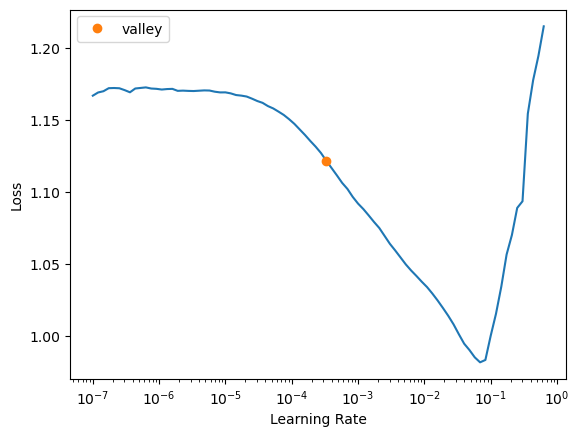

In [23]:
learn.lr_find()

In [24]:
learn.fit_one_cycle(157,0.0436, pct_start= 0.2687, div_final=7e5, div=0.0798)

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,18.818285,121311.937500,0.288709,0.403383,0.403383,0.174891,0.218376,00:00
1,14.218970,430566.718750,0.145030,0.339465,0.339465,0.323934,0.140684,00:00
2,10.685977,158.563171,0.466700,0.319760,0.319760,0.336520,0.282459,00:00
3,10.417540,84.642769,0.426302,0.359724,0.359724,0.374054,0.268072,00:00
4,8.141259,3.472870,0.513861,0.332403,0.332403,0.255038,0.228059,00:00
5,6.510303,2.833884,0.357336,0.418645,0.418645,0.357871,0.248649,00:00
6,5.210073,0.992268,0.515382,0.333363,0.333363,0.371892,0.228225,00:00
7,4.204709,0.963821,0.487323,0.358791,0.358791,0.354796,0.330184,00:00
8,3.454559,1415477.625000,0.472617,0.385658,0.385658,0.388549,0.326276,00:00
9,2.880800,54130452.000000,0.516734,0.335560,0.335560,0.345771,0.241591,00:00


In [25]:
learn.save('learner_internet_cable')

Path('models/learner_internet_cable.pth')

In [26]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [27]:
y_predrn = np.array([list(probs).index(max(probs))+1 for probs in preds])

In [28]:
eval_pred_clas(y_predrn,y_test)

(0.16308527482470028,
 0.16308527482470028,
 0.12916936849476482,
 0.141215015065452)

### Con SVM

In [29]:
svm = SVC(C=1.0)

In [30]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

{'fit_time': array([31.72422957, 31.51701689, 30.989079  , 31.55426002, 32.72968841,
        27.48756313, 27.79545999, 28.28715897, 28.27992582, 28.07220554]),
 'score_time': array([5.63184071, 6.79017949, 6.28306556, 5.88388395, 6.58204865,
        5.89131403, 5.69024301, 5.20781851, 5.20291781, 5.23963189]),
 'test_accuracy': array([0.51672862, 0.51706658, 0.51706658, 0.51724138, 0.51724138,
        0.51724138, 0.51690331, 0.51690331, 0.51690331, 0.51690331]),
 'test_recall_weighted': array([0.51672862, 0.51706658, 0.51706658, 0.51724138, 0.51724138,
        0.51724138, 0.51690331, 0.51690331, 0.51690331, 0.51690331]),
 'test_precision_weighted': array([0.26700847, 0.26735784, 0.26735784, 0.26753864, 0.26753864,
        0.26753864, 0.26718904, 0.26718904, 0.26718904, 0.26718904]),
 'test_f1_weighted': array([0.3520847 , 0.35246686, 0.35246686, 0.35266458, 0.35266458,
        0.35266458, 0.35228222, 0.35228222, 0.35228222, 0.35228222])}

In [32]:
eval_cv_clas(svm_cv)

(0.5170199167756042,
 0.5170199167756042,
 0.2673096234154643,
 0.35241410349272895)

In [33]:
svm.fit(X_train,y_train)

SVC()

In [34]:
y_test_pred = svm.predict(X_test)

In [35]:
eval_pred_clas(y_test,y_test_pred)

(0.5200180954535173,
 0.5200180954535173,
 0.2704188195991034,
 0.35581000043084404)

### Con N-vecinos

In [36]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [37]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.00598049, 0.00498343, 0.00593472, 0.00498343, 0.00398684,
        0.00810909, 0.00697303, 0.00400496, 0.00597978, 0.00598001]),
 'score_time': array([1.67325497, 1.04477382, 1.18605828, 1.19992375, 1.20394588,
        1.29681993, 1.65730453, 1.55924511, 1.4799695 , 1.53320241]),
 'test_accuracy': array([0.62757688, 0.65630281, 0.654951  , 0.64334009, 0.64807302,
        0.65990534, 0.65179175, 0.6402975 , 0.65584855, 0.65415822]),
 'test_recall_weighted': array([0.62757688, 0.65630281, 0.654951  , 0.64334009, 0.64807302,
        0.65990534, 0.65179175, 0.6402975 , 0.65584855, 0.65415822]),
 'test_precision_weighted': array([0.62231907, 0.65186145, 0.64897796, 0.63574533, 0.64137032,
        0.65492603, 0.64906176, 0.63305372, 0.6487553 , 0.64815819]),
 'test_f1_weighted': array([0.62362617, 0.65324283, 0.65053728, 0.63807623, 0.64332481,
        0.65596846, 0.64757784, 0.63447811, 0.65095884, 0.64996874])}

In [39]:
eval_cv_clas(nc_cv)

(0.6492245155278551,
 0.6492245155278551,
 0.6434229127008224,
 0.6447759306618346)

In [40]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [41]:
y_test_prednn = nc.predict(X_test)

In [43]:
eval_pred_clas(y_test,y_test_prednn)

(0.6469124632436101,
 0.6469124632436101,
 0.6389728854344154,
 0.6409708751469317)

### Random Forest

In [44]:
rf = RandomForestClassifier(random_state=18)

In [45]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([1.8728857 , 1.88140488, 1.97583342, 1.71078324, 1.98259974,
        2.49986506, 2.10593414, 1.93209696, 1.82033825, 1.83640552]),
 'score_time': array([0.07428384, 0.07590175, 0.06920576, 0.07398868, 0.13099623,
        0.08607626, 0.09191585, 0.0738287 , 0.06978464, 0.08639359]),
 'test_accuracy': array([0.64075701, 0.66002028, 0.65528895, 0.65584855, 0.65280595,
        0.65618661, 0.65179175, 0.65010142, 0.63116971, 0.64841109]),
 'test_recall_weighted': array([0.64075701, 0.66002028, 0.65528895, 0.65584855, 0.65280595,
        0.65618661, 0.65179175, 0.65010142, 0.63116971, 0.64841109]),
 'test_precision_weighted': array([0.63434089, 0.65461301, 0.648073  , 0.64908437, 0.64626558,
        0.65335291, 0.64850471, 0.64393958, 0.62479199, 0.64396562]),
 'test_f1_weighted': array([0.63558895, 0.65454203, 0.64864978, 0.64969429, 0.64659509,
        0.65223783, 0.64803843, 0.64406785, 0.62505104, 0.6422988 ])}

In [46]:
eval_cv_clas(rf_cv)

(0.6502381316349359,
 0.6502381316349359,
 0.6446931673245246,
 0.6446764093222919)

In [47]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [48]:
y_test_predrf = rf.predict(X_test)

In [49]:
eval_pred_clas(y_test, y_test_predrf)

(0.6480434290884415, 0.6480434290884415, 0.6419995384785459, 0.640947912914242)

### Ensamble

#### Votacion

In [51]:
vot = VotingClassifier(
    estimators=[('svm', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [52]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([33.16150594, 33.63334394, 32.28777933, 31.94766593, 34.26839614,
        33.35459471, 32.47359729, 35.98515129, 35.65888286, 36.35718775]),
 'score_time': array([7.78128886, 6.90349245, 7.37067008, 6.7861464 , 8.12308264,
        6.72851706, 8.02098799, 6.92395091, 7.47202444, 7.72866559]),
 'test_accuracy': array([0.64346063, 0.66373775, 0.65934437, 0.64841109, 0.65348208,
        0.66294794, 0.65415822, 0.65077755, 0.64604462, 0.65077755]),
 'test_recall_weighted': array([0.64346063, 0.66373775, 0.65934437, 0.64841109, 0.65348208,
        0.66294794, 0.65415822, 0.65077755, 0.64604462, 0.65077755]),
 'test_precision_weighted': array([0.650068  , 0.67358504, 0.67209534, 0.65687641, 0.66674032,
        0.67928362, 0.6649043 , 0.66374546, 0.66060244, 0.66700504]),
 'test_f1_weighted': array([0.62130496, 0.64354168, 0.63629749, 0.6250867 , 0.63043928,
        0.64221585, 0.63303482, 0.6270171 , 0.62025359, 0.62689793])}

In [53]:
eval_cv_clas(vot_cv)

(0.6533141804343836,
 0.6533141804343836,
 0.6654905962772688,
 0.6306089396498319)

In [54]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svm', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [55]:
y_test_predvot = vot.predict(X_test)

In [56]:
eval_pred_clas(y_test, y_test_predvot)

(0.6584483148608912,
 0.6584483148608912,
 0.6688990007939364,
 0.6340153807623086)

#### Bagging

In [57]:
bag = BaggingClassifier(
    base_estimator=clone(nc)
)

In [58]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([0.12641525, 0.07777762, 0.06783819, 0.07726097, 0.07278728,
        0.10365343, 0.06719303, 0.08573651, 0.07991791, 0.13544393]),
 'score_time': array([13.25580382, 12.21453977, 13.36983204, 12.76091766, 12.49743176,
        12.80221677, 12.76291013, 13.17987967, 12.7550962 , 12.25584769]),
 'test_accuracy': array([0.62791484, 0.64954376, 0.64751605, 0.64976335, 0.65043949,
        0.66058147, 0.65280595, 0.6372549 , 0.64976335, 0.65348208]),
 'test_recall_weighted': array([0.62791484, 0.64954376, 0.64751605, 0.64976335, 0.65043949,
        0.66058147, 0.65280595, 0.6372549 , 0.64976335, 0.65348208]),
 'test_precision_weighted': array([0.62155219, 0.64505031, 0.64112385, 0.6416888 , 0.64333854,
        0.65547621, 0.65146794, 0.62794242, 0.64163699, 0.64677504]),
 'test_f1_weighted': array([0.62339585, 0.64632856, 0.64312834, 0.64387666, 0.64496957,
        0.65674117, 0.6480836 , 0.6300804 , 0.64360295, 0.64896594])}

In [59]:
eval_cv_clas(bag_cv)

(0.6479065255357133,
 0.6479065255357133,
 0.6416052291724275,
 0.6429173030772424)

In [60]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6,
                                                      weights='distance'))

In [61]:
y_test_predbag = bag.predict(X_test)

In [62]:
eval_pred_clas(y_test_predbag, y_test)

(0.6460076905677449,
 0.6460076905677449,
 0.6600229796500918,
 0.6518313743635101)

#### Boost

In [63]:
boost = AdaBoostClassifier(clone(rf)
)

In [64]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([118.93135786, 118.15870261, 110.62339449, 112.78181529,
        113.77061319, 113.36988735, 110.97217202, 106.56580544,
        107.75466943, 103.67400193]),
 'score_time': array([4.15437269, 3.54642701, 3.43080449, 4.27566361, 3.29282832,
        3.33829522, 4.02620792, 3.99398255, 4.16103435, 3.24729228]),
 'test_accuracy': array([0.63602568, 0.65630281, 0.64582629, 0.65652468, 0.63691684,
        0.65652468, 0.64401623, 0.64198783, 0.62914131, 0.63319811]),
 'test_recall_weighted': array([0.63602568, 0.65630281, 0.64582629, 0.65652468, 0.63691684,
        0.65652468, 0.64401623, 0.64198783, 0.62914131, 0.63319811]),
 'test_precision_weighted': array([0.63006029, 0.6527037 , 0.63855885, 0.64808693, 0.62721021,
        0.65454515, 0.64030689, 0.63557409, 0.62042423, 0.62703112]),
 'test_f1_weighted': array([0.62791445, 0.64911666, 0.63786903, 0.64707935, 0.62688082,
        0.65076195, 0.63822922, 0.63364171, 0.61958644, 0.62426064])}

In [65]:
eval_cv_clas(boost_cv)

(0.6436464450716017,
 0.6436464450716017,
 0.6374501437945483,
 0.6355340276305302)

In [66]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [67]:
y_test_predboost = boost.predict(X_test)

In [68]:
eval_pred_clas(y_test_predboost,y_test)

(0.6480434290884415, 0.6480434290884415, 0.668402448899094, 0.6561845261981701)

# Internet por conexión satelital



### Con RN

In [69]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [70]:
y_names = ["P4_6_3"]

In [71]:
# Filtrado de datos, solo aquellos que tengan internet
train_df = endutih21[(endutih21.internet==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_6_3
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,2.0
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,1.0
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,2.0
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,0.0
6,101080,1,1,1,1,0,1,1,0,2,...,1,3,1,1,1,1,1,0,9,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58148,3260770,0,1,0,1,0,1,0,0,2,...,4,3,1,1,1,1,1,1,7,1.0
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,2.0
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,0.0
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,1.0


In [72]:
train_df[y_names].value_counts()

P4_6_3
2.0       29523
1.0        2372
0.0        2109
dtype: int64

In [73]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=18)

In [74]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [75]:
train_df[y_names].value_counts()

P4_6_3
2.0       25690
1.0        2062
0.0        1831
dtype: int64

In [106]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cpu"
                       )

In [77]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-20 09:48:15,650] A new study created in memory with name: no-name-228fa036-d1af-4e62-bb3b-6e0c7e24eb0d


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.916961,6.236660,0.832826,0.832826,0.828843,0.816245,00:00
1,0.687842,0.964165,0.836038,0.836038,0.835751,0.830823,00:00
2,0.584793,0.673474,0.728871,0.728871,0.871424,0.778544,00:00
3,0.521334,0.509928,0.782454,0.782454,0.841950,0.799269,00:00
4,0.479362,0.420530,0.854124,0.854124,0.863575,0.856782,00:00
5,0.449588,0.370225,0.868154,0.868154,0.834701,0.843447,00:00
6,0.426393,0.353249,0.871873,0.871873,0.840934,0.849031,00:00
7,0.410140,0.350085,0.871704,0.871704,0.829403,0.835729,00:00
8,0.397582,0.366740,0.866802,0.866802,0.860830,0.860455,00:00
9,0.389052,0.372902,0.866802,0.866802,0.860557,0.856857,00:00


[I 2023-02-20 09:50:09,410] Trial 0 finished with value: 0.16362404823303223 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 150, 'n_neuronas_layer1': 223, 'n_neuronas_layer2': 207, 'n_neuronas_layer3': 133, 'n_neuronas_layer4': 104, 'bn_final': False, 'embed_p': 0.43541177189645835, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 209, 'lr': 0.05428406857196246, 'pct_start': 0.1975033512359751, 'div_final': 543106, 'div': 0.5807267837675504}. Best is trial 0 with value: 0.16362404823303223.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,3.970099,254983.859375,0.150101,0.150101,0.669470,0.176565,00:01
1,5.253628,6249.172363,0.870014,0.870014,0.756924,0.809538,00:01
2,5.345372,176.655548,0.868661,0.868661,0.756770,0.808865,00:01
3,5.315916,14.919016,0.377789,0.377789,0.738583,0.479787,00:01
4,5.234769,33.625175,0.146890,0.146890,0.660617,0.185441,00:02
5,6.737994,9.754219,0.510818,0.510818,0.829120,0.606158,00:01
6,8.212019,207.868668,0.073698,0.073698,0.875458,0.021095,00:01
7,8.488193,14422.193359,0.134888,0.134888,0.552679,0.173217,00:02
8,8.679016,1568.303101,0.393002,0.393002,0.698039,0.494391,00:02
9,9.801986,221.225189,0.568289,0.568289,0.844603,0.657952,00:02


[I 2023-02-20 09:57:00,684] Trial 1 finished with value: 0.12931036949157715 and parameters: {'n_layers': 12, 'n_neuronas_layer0': 89, 'n_neuronas_layer1': 219, 'n_neuronas_layer2': 214, 'n_neuronas_layer3': 51, 'n_neuronas_layer4': 172, 'n_neuronas_layer5': 197, 'n_neuronas_layer6': 34, 'n_neuronas_layer7': 150, 'n_neuronas_layer8': 244, 'n_neuronas_layer9': 227, 'n_neuronas_layer10': 244, 'n_neuronas_layer11': 131, 'bn_final': False, 'embed_p': 0.09853895315978, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 190, 'lr': 0.0829655533546765, 'pct_start': 0.4032260410030566, 'div_final': 464860, 'div': 0.023728022183438294}. Best is trial 1 with value: 0.12931036949157715.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.956900,0.512981,0.852434,0.852434,0.855347,0.852383,00:00
1,0.809967,0.495980,0.861900,0.861900,0.850880,0.848972,00:00
2,0.705774,0.475713,0.863759,0.863759,0.855348,0.858980,00:00
3,0.626407,0.443471,0.864774,0.864773,0.862239,0.860659,00:00
4,0.565606,0.405700,0.861562,0.861562,0.857363,0.857350,00:00
5,0.519581,0.375840,0.870521,0.870521,0.851677,0.853146,00:00
6,0.484723,0.367390,0.873901,0.873901,0.843979,0.851272,00:00
7,0.458194,0.362930,0.870690,0.870690,0.843185,0.850501,00:00
8,0.437072,0.354921,0.872042,0.872042,0.837239,0.845444,00:00
9,0.420401,0.352215,0.870183,0.870183,0.836477,0.843454,00:00


[I 2023-02-20 09:57:15,371] Trial 2 finished with value: 0.1284651756286621 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 114, 'n_neuronas_layer1': 256, 'n_neuronas_layer2': 123, 'bn_final': True, 'embed_p': 0.39426065854249115, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 34, 'lr': 0.013522818385369374, 'pct_start': 0.32572406540013393, 'div_final': 250993, 'div': 0.5416129409758632}. Best is trial 2 with value: 0.1284651756286621.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.938791,0.725699,0.864774,0.864773,0.845355,0.843159,00:00
1,0.754621,0.388372,0.861393,0.861393,0.835818,0.843930,00:00
2,0.607810,0.976624,0.809500,0.809500,0.865636,0.831746,00:00
3,0.530842,0.520554,0.831812,0.831812,0.870733,0.847938,00:00
4,0.481329,0.471495,0.830460,0.830460,0.871716,0.847429,00:00
5,0.445977,0.373531,0.866971,0.866971,0.860953,0.863763,00:00
6,0.420021,0.398853,0.856153,0.856153,0.846323,0.841064,00:00
7,0.400710,0.394762,0.849899,0.849899,0.838754,0.833323,00:00
8,0.385077,0.366712,0.871028,0.871028,0.816224,0.822087,00:00
9,0.372230,0.364095,0.870183,0.870183,0.823985,0.834064,00:00


[I 2023-02-20 09:58:45,484] Trial 3 finished with value: 0.1546652913093567 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 113, 'n_neuronas_layer1': 249, 'n_neuronas_layer2': 233, 'n_neuronas_layer3': 100, 'n_neuronas_layer4': 199, 'bn_final': False, 'embed_p': 0.9012047287987058, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 155, 'lr': 0.05110511984986911, 'pct_start': 0.6770318802928899, 'div_final': 174537, 'div': 0.7933355125330567}. Best is trial 2 with value: 0.1284651756286621.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.068119,30.204308,0.406525,0.406525,0.768340,0.514444,00:00
1,0.747239,1.440324,0.832826,0.832826,0.771395,0.800854,00:00
2,0.633590,0.967936,0.816430,0.816430,0.860790,0.820940,00:00
3,0.557865,0.536157,0.827079,0.827079,0.848292,0.836807,00:00
4,0.505798,0.390009,0.863083,0.863083,0.833097,0.843639,00:00
5,0.472083,0.365342,0.867647,0.867647,0.802392,0.832519,00:00
6,0.447438,0.387950,0.870014,0.870014,0.784518,0.810257,00:00
7,0.427654,0.372519,0.869844,0.869844,0.769643,0.809923,00:00
8,0.412203,0.365822,0.869675,0.869675,0.767561,0.809838,00:00
9,0.399791,0.354594,0.869506,0.869506,0.766069,0.809753,00:00


[I 2023-02-20 09:59:53,006] Trial 4 finished with value: 0.15432727336883545 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 155, 'n_neuronas_layer1': 184, 'n_neuronas_layer2': 127, 'n_neuronas_layer3': 51, 'n_neuronas_layer4': 228, 'n_neuronas_layer5': 158, 'n_neuronas_layer6': 93, 'bn_final': False, 'embed_p': 0.17089852476566575, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 109, 'lr': 0.07102333436433185, 'pct_start': 0.8026582740540514, 'div_final': 578420, 'div': 0.7177666139765521}. Best is trial 2 with value: 0.1284651756286621.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,10.671549,198289.390625,0.868999,0.868999,0.782379,0.813147,00:00
1,11.949127,2355.204102,0.732252,0.732252,0.803578,0.756287,00:00
2,9.820782,20.055166,0.523665,0.523665,0.861512,0.612657,00:00
3,7.783040,1.642142,0.689655,0.689655,0.851638,0.741360,00:00
4,6.132913,3.745452,0.375254,0.375254,0.861566,0.467320,00:00
5,4.758796,0.914235,0.603110,0.603110,0.879541,0.678877,00:00
6,3.703005,0.536213,0.786849,0.786849,0.839682,0.800361,00:00
7,2.924522,0.412058,0.869337,0.869337,0.766050,0.809669,00:00
8,2.362144,2319.667480,0.866971,0.866971,0.771216,0.810608,00:00
9,1.940879,6390613.000000,0.869168,0.869168,0.776835,0.810755,00:00


[I 2023-02-20 10:01:27,800] Trial 5 finished with value: 0.1267748475074768 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 34, 'n_neuronas_layer1': 126, 'n_neuronas_layer2': 49, 'n_neuronas_layer3': 104, 'n_neuronas_layer4': 36, 'n_neuronas_layer5': 204, 'n_neuronas_layer6': 138, 'n_neuronas_layer7': 133, 'bn_final': False, 'embed_p': 0.7061514683833815, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 204, 'lr': 0.06829722773586475, 'pct_start': 0.027166124734989805, 'div_final': 968349, 'div': 0.12313096497464704}. Best is trial 5 with value: 0.1267748475074768.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.739339,117.250778,0.310345,0.310345,0.848202,0.391918,00:01
1,0.549387,15.195348,0.197431,0.197431,0.829290,0.229724,00:01
2,0.475095,5.157578,0.618661,0.618661,0.879986,0.699239,00:01
3,0.437980,1.838112,0.610379,0.610379,0.880578,0.693328,00:01
4,0.416050,0.991480,0.641143,0.641143,0.871829,0.713556,00:01
5,0.400371,0.576766,0.787018,0.787018,0.873735,0.818880,00:01
6,0.388988,0.427623,0.829108,0.829108,0.869599,0.845742,00:01
7,0.379426,0.443081,0.820656,0.820656,0.869973,0.837936,00:01
8,0.372586,0.375683,0.851589,0.851589,0.863185,0.856993,00:01
9,0.366808,0.358336,0.870690,0.870690,0.852120,0.857299,00:01


[I 2023-02-20 10:07:20,900] Trial 6 finished with value: 0.1583840250968933 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 122, 'n_neuronas_layer1': 132, 'n_neuronas_layer2': 241, 'n_neuronas_layer3': 230, 'n_neuronas_layer4': 170, 'n_neuronas_layer5': 148, 'n_neuronas_layer6': 126, 'n_neuronas_layer7': 51, 'n_neuronas_layer8': 241, 'n_neuronas_layer9': 172, 'n_neuronas_layer10': 245, 'n_neuronas_layer11': 227, 'n_neuronas_layer12': 245, 'bn_final': True, 'embed_p': 0.5640420385082062, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 216, 'lr': 0.07681414098965245, 'pct_start': 0.44250618007249365, 'div_final': 328424, 'div': 0.7907765185954596}. Best is trial 5 with value: 0.1267748475074768.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.023752,0.757175,0.827417,0.827417,0.851136,0.826514,00:00
1,0.902798,1.201433,0.798682,0.798682,0.864655,0.823829,00:00
2,0.726787,1.107187,0.777214,0.777214,0.871299,0.811435,00:00
3,0.609570,1.158431,0.698952,0.698952,0.877944,0.758167,00:00
4,0.541218,0.842986,0.755409,0.755409,0.871192,0.797044,00:00
5,0.494782,0.503534,0.818120,0.818120,0.872684,0.839376,00:00
6,0.461761,0.720513,0.765213,0.765213,0.872273,0.804618,00:00
7,0.437431,0.555400,0.797329,0.797329,0.873382,0.826516,00:00
8,0.417757,0.421482,0.837221,0.837221,0.865746,0.848412,00:00
9,0.402028,0.405199,0.841447,0.841447,0.869369,0.852351,00:00


[I 2023-02-20 10:09:13,163] Trial 7 finished with value: 0.1599053144454956 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 85, 'n_neuronas_layer1': 56, 'n_neuronas_layer2': 131, 'n_neuronas_layer3': 49, 'n_neuronas_layer4': 137, 'n_neuronas_layer5': 47, 'n_neuronas_layer6': 40, 'n_neuronas_layer7': 73, 'n_neuronas_layer8': 188, 'n_neuronas_layer9': 137, 'n_neuronas_layer10': 148, 'n_neuronas_layer11': 43, 'n_neuronas_layer12': 39, 'bn_final': False, 'embed_p': 0.3211977349912876, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 137, 'lr': 0.024922388820883802, 'pct_start': 0.8558513187751611, 'div_final': 336928, 'div': 0.427986151401058}. Best is trial 5 with value: 0.1267748475074768.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.915635,0.705879,0.867478,0.867478,0.798174,0.830149,00:00
1,0.737071,0.496831,0.856322,0.856322,0.858102,0.845136,00:00
2,0.593101,0.723734,0.800710,0.800710,0.867581,0.826433,00:00
3,0.523416,0.475528,0.836376,0.836376,0.870517,0.850761,00:00
4,0.476916,0.406874,0.855646,0.855646,0.860941,0.857356,00:00
5,0.444440,0.379648,0.860548,0.860548,0.864328,0.861860,00:00
6,0.421194,0.373067,0.870352,0.870352,0.793901,0.825905,00:00
7,0.403962,0.359369,0.869675,0.869675,0.841751,0.850122,00:00
8,0.389746,0.376652,0.872042,0.872042,0.796620,0.825749,00:00
9,0.378820,0.357429,0.870352,0.870352,0.843830,0.852338,00:00


[I 2023-02-20 10:11:05,939] Trial 8 finished with value: 0.15720081329345703 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 48, 'n_neuronas_layer1': 195, 'n_neuronas_layer2': 211, 'n_neuronas_layer3': 250, 'n_neuronas_layer4': 147, 'bn_final': False, 'embed_p': 0.2628093761786414, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 197, 'lr': 0.06767387051676443, 'pct_start': 0.09046010661806354, 'div_final': 867342, 'div': 0.8660823856093868}. Best is trial 5 with value: 0.1267748475074768.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.891134,0.599288,0.848039,0.848039,0.836410,0.833400,00:00
1,0.777308,0.683469,0.843813,0.843813,0.856962,0.847100,00:00
2,0.670265,0.594605,0.823529,0.823529,0.871506,0.842997,00:00
3,0.582539,0.458161,0.841278,0.841278,0.869006,0.852866,00:00
4,0.518816,0.389406,0.853448,0.853448,0.865138,0.858609,00:00
5,0.473628,0.357802,0.863928,0.863928,0.862148,0.862029,00:00
6,0.441847,0.367534,0.864097,0.864097,0.859883,0.861906,00:00
7,0.418862,0.355099,0.862238,0.862238,0.855376,0.857929,00:00
8,0.402014,0.371070,0.855815,0.855815,0.857762,0.856445,00:00
9,0.388707,0.347340,0.869675,0.869675,0.851877,0.858609,00:00


[I 2023-02-20 10:11:32,013] Trial 9 finished with value: 0.15196079015731812 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 85, 'n_neuronas_layer1': 64, 'n_neuronas_layer2': 81, 'n_neuronas_layer3': 43, 'n_neuronas_layer4': 77, 'bn_final': True, 'embed_p': 0.24092771648338857, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 69, 'lr': 0.0645402991721293, 'pct_start': 0.7268024440105616, 'div_final': 345726, 'div': 0.3316966008722551}. Best is trial 5 with value: 0.1267748475074768.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.861137,956.502686,0.841447,0.841447,0.791196,0.812759,00:00
1,0.685298,21.846869,0.332150,0.332150,0.859234,0.422404,00:00
2,0.589369,5.951117,0.185429,0.185429,0.862672,0.225389,00:00
3,0.532924,0.504772,0.870014,0.870014,0.782260,0.812010,00:00
4,0.490888,0.543887,0.870014,0.870014,0.756924,0.809538,00:00
5,0.458955,0.615363,0.870014,0.870014,0.756924,0.809538,00:00
6,0.435019,0.579039,0.870014,0.870014,0.756924,0.809538,00:00
7,0.418458,0.595446,0.870014,0.870014,0.756924,0.809538,00:00
8,0.404980,0.609840,0.870014,0.870014,0.756924,0.809538,00:00
9,0.403365,0.468356,0.870014,0.870014,0.756924,0.809538,00:00


[I 2023-02-20 10:14:45,781] Trial 10 finished with value: 0.1502704620361328 and parameters: {'n_layers': 10, 'n_neuronas_layer0': 218, 'n_neuronas_layer1': 121, 'n_neuronas_layer2': 34, 'n_neuronas_layer3': 198, 'n_neuronas_layer4': 34, 'n_neuronas_layer5': 253, 'n_neuronas_layer6': 236, 'n_neuronas_layer7': 255, 'n_neuronas_layer8': 57, 'n_neuronas_layer9': 37, 'bn_final': True, 'embed_p': 0.7093359566858144, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 250, 'lr': 0.09878778553568106, 'pct_start': 0.09458380215965723, 'div_final': 999449, 'div': 0.031332763813494174}. Best is trial 5 with value: 0.1267748475074768.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.091420,0.921836,0.766565,0.766565,0.858281,0.800294,00:00
1,1.013112,0.886624,0.784821,0.784821,0.867340,0.816612,00:00
2,0.964897,0.842549,0.801217,0.801217,0.868521,0.827586,00:00
3,0.927304,0.810324,0.805950,0.805950,0.868524,0.830425,00:00
4,0.895093,0.783302,0.813556,0.813556,0.868956,0.835582,00:00
5,0.867415,0.762193,0.819473,0.819473,0.869667,0.839706,00:00
6,0.843877,0.746596,0.824713,0.824713,0.869353,0.842999,00:00
7,0.823563,0.734934,0.829446,0.829446,0.867949,0.845526,00:00
8,0.806032,0.726551,0.831305,0.831305,0.867249,0.846450,00:00
9,0.790782,0.718867,0.834855,0.834855,0.866986,0.848516,00:00


[I 2023-02-20 10:14:52,757] Trial 11 finished with value: 0.14553749561309814 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 36, 'bn_final': True, 'embed_p': 0.611128717730047, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 35, 'lr': 0.0011146685310986296, 'pct_start': 0.26874099118862815, 'div_final': 31426, 'div': 0.21336992970773627}. Best is trial 5 with value: 0.1267748475074768.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.840590,0.636640,0.818796,0.818796,0.863040,0.829246,00:00
1,0.664685,0.454190,0.862745,0.862745,0.858410,0.852733,00:00
2,0.567948,0.403187,0.867309,0.867309,0.858598,0.856359,00:00
3,0.508140,0.373581,0.871197,0.871197,0.850980,0.852651,00:00
4,0.468511,0.359476,0.871535,0.871535,0.838978,0.848236,00:00
5,0.439639,0.351821,0.871197,0.871197,0.828764,0.832648,00:00
6,0.418438,0.348976,0.871366,0.871366,0.824568,0.825701,00:00
7,0.402396,0.348401,0.870352,0.870352,0.838891,0.845848,00:00
8,0.389553,0.349298,0.866971,0.866971,0.827448,0.833045,00:00
9,0.379428,0.343923,0.869844,0.869844,0.815337,0.825946,00:00


[I 2023-02-20 10:15:20,061] Trial 12 finished with value: 0.15398919582366943 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 217, 'n_neuronas_layer1': 99, 'bn_final': True, 'embed_p': 0.42389693152339364, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 89, 'lr': 0.02946609142907508, 'pct_start': 0.03521831736415022, 'div_final': 748443, 'div': 0.5635181469570245}. Best is trial 5 with value: 0.1267748475074768.


In [78]:
study.best_value

0.1267748475074768

In [79]:
study.best_params

{'n_layers': 8,
 'n_neuronas_layer0': 34,
 'n_neuronas_layer1': 126,
 'n_neuronas_layer2': 49,
 'n_neuronas_layer3': 104,
 'n_neuronas_layer4': 36,
 'n_neuronas_layer5': 204,
 'n_neuronas_layer6': 138,
 'n_neuronas_layer7': 133,
 'bn_final': False,
 'embed_p': 0.7061514683833815,
 'idx_act_cls': 0,
 'idx_opt_func': 1,
 'epoch': 204,
 'lr': 0.06829722773586475,
 'pct_start': 0.027166124734989805,
 'div_final': 968349,
 'div': 0.12313096497464704}

In [107]:
learn = ft.tabular_learner(dls,
                           layers = [34, 126, 49, 104, 36, 204, 138, 133],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.ReLU(inplace=True), bn_final=False, embed_p=0.706151),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.0005754399462603033)

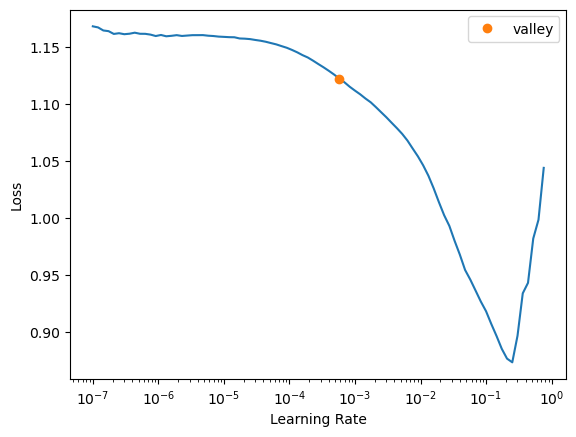

In [81]:
learn.lr_find()

In [108]:
learn.fit_one_cycle(205,0.0683, pct_start= 0.027, div_final=9e5, div=0.1231)

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,11.757877,1105.938599,0.118492,0.339203,0.339203,0.300633,0.080987,00:00
1,10.685613,1271.962158,0.192529,0.361516,0.361516,0.338654,0.130623,00:00
2,9.186514,13.925466,0.304429,0.379706,0.379706,0.333946,0.189422,00:00
3,7.636270,12.715753,0.525862,0.464946,0.464946,0.361930,0.297430,00:00
4,5.954160,2.666386,0.540399,0.483785,0.483785,0.368087,0.306196,00:00
5,4.587873,0.880347,0.745774,0.513317,0.513317,0.381455,0.390717,00:00
6,3.584260,0.518915,0.875254,0.341043,0.341043,0.443790,0.326571,00:00
7,2.853005,0.478396,0.874915,0.345347,0.345347,0.440665,0.334879,00:00
8,2.308174,0.455119,0.874408,0.333333,0.333333,0.291519,0.311027,00:00
9,1.895148,0.435704,0.874239,0.333269,0.333269,0.291512,0.310995,00:00


In [109]:
learn.save('learner_internet_satelite')

Path('models/learner_internet_satelite.pth')

In [110]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [111]:
y_predrn = np.array([list(probs).index(max(probs))+1 for probs in preds])

In [112]:
eval_pred_clas(y_predrn,y_test)

(0.018095453517303777,
 0.018095453517303777,
 0.002301579217722738,
 0.0036106874854560747)

### Con SVM

In [113]:
svm = SVC(C=1.0)

In [114]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

{'fit_time': array([ 8.79180026, 10.32360029,  9.61281419,  8.6548264 ,  9.84390688,
         9.77186275,  9.26548958,  8.67804885,  9.96730018,  9.74960566]),
 'score_time': array([1.58427739, 1.56788063, 1.62818575, 2.25224018, 1.52610278,
        1.58009982, 1.91547465, 1.542418  , 1.62306786, 1.63015723]),
 'test_accuracy': array([0.86819872, 0.86819872, 0.86819872, 0.86849222, 0.86849222,
        0.86849222, 0.86849222, 0.86849222, 0.86849222, 0.86849222]),
 'test_recall_weighted': array([0.86819872, 0.86819872, 0.86819872, 0.86849222, 0.86849222,
        0.86849222, 0.86849222, 0.86849222, 0.86849222, 0.86849222]),
 'test_precision_weighted': array([0.75376901, 0.75376901, 0.75376901, 0.75427874, 0.75427874,
        0.75427874, 0.75427874, 0.75427874, 0.75427874, 0.75427874]),
 'test_f1_weighted': array([0.80694736, 0.80694736, 0.80694736, 0.80736621, 0.80736621,
        0.80736621, 0.80736621, 0.80736621, 0.80736621, 0.80736621])}

In [115]:
np.mean(svm_cv["test_accuracy"]), np.mean(svm_cv["test_recall_weighted"]), np.mean(svm_cv["test_precision_weighted"]), np.mean(svm_cv["test_f1_weighted"])

(0.8684041718679059,
 0.8684041718679059,
 0.7541258238085272,
 0.8072405556087459)

In [116]:
svm.fit(X_train,y_train)

SVC()

In [117]:
y_test_pred = svm.predict(X_test)

In [118]:
accuracy_score(y_test, y_test_pred), recall_score(y_test, y_test_pred, average="weighted"), precision_score(y_test, y_test_pred, average="weighted"), f1_score(y_test, y_test_pred, average="weighted")

(0.8669984166478172,
 0.8669984166478172,
 0.7516862544698221,
 0.8052350208410668)

### Con N-vecinos

In [119]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [120]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.00398612, 0.00299001, 0.00399041, 0.00299096, 0.00299168,
        0.00498796, 0.00398779, 0.00398755, 0.00308943, 0.00500131]),
 'score_time': array([1.19683218, 1.22122884, 1.17381501, 1.10892248, 1.23725271,
        1.12626791, 1.19697475, 1.53993511, 1.1767292 , 1.42269349]),
 'test_accuracy': array([0.8817168 , 0.87630956, 0.88002704, 0.87762001, 0.87390128,
        0.88302907, 0.8887762 , 0.87390128, 0.87559162, 0.87694388]),
 'test_recall_weighted': array([0.8817168 , 0.87630956, 0.88002704, 0.87762001, 0.87390128,
        0.88302907, 0.8887762 , 0.87390128, 0.87559162, 0.87694388]),
 'test_precision_weighted': array([0.85976056, 0.85744455, 0.86119242, 0.85549535, 0.85829343,
        0.86590039, 0.87061066, 0.85412988, 0.85430599, 0.85800489]),
 'test_f1_weighted': array([0.86638272, 0.86402224, 0.86732479, 0.86360703, 0.86381199,
        0.87156844, 0.87405604, 0.86053205, 0.86185906, 0.86427002])}

In [121]:
np.mean(nc_cv["test_accuracy"]), np.mean(nc_cv["test_recall_weighted"]), np.mean(nc_cv["test_precision_weighted"]), np.mean(nc_cv["test_f1_weighted"])

(0.8787816750035017,
 0.8787816750035017,
 0.8595138116014287,
 0.8657434384170021)

In [122]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [123]:
y_test_prednn = nc.predict(X_test)

In [124]:
accuracy_score(y_test, y_test_prednn), recall_score(y_test, y_test_prednn, average="weighted"), precision_score(y_test, y_test_prednn, average="weighted"), f1_score(y_test, y_test_prednn, average="weighted")

(0.8755937570685365,
 0.8755937570685365,
 0.8524005107639511,
 0.8597479231961949)

### Random Forest

In [125]:
rf = RandomForestClassifier(random_state=18)

In [126]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([1.65309858, 1.42931199, 1.45153809, 1.4251771 , 1.37382555,
        1.39589572, 1.52641749, 1.53225517, 2.23332334, 1.80739045]),
 'score_time': array([0.05481744, 0.05534101, 0.05577397, 0.05393982, 0.05293941,
        0.05382037, 0.05381966, 0.08767867, 0.08621073, 0.07175589]),
 'test_accuracy': array([0.87698547, 0.8823927 , 0.87191619, 0.87728195, 0.87119675,
        0.88336714, 0.87795808, 0.87660581, 0.86713996, 0.88201487]),
 'test_recall_weighted': array([0.87698547, 0.8823927 , 0.87191619, 0.87728195, 0.87119675,
        0.88336714, 0.87795808, 0.87660581, 0.86713996, 0.88201487]),
 'test_precision_weighted': array([0.84879556, 0.8606761 , 0.84443863, 0.85047194, 0.84539219,
        0.86331149, 0.85283091, 0.85266813, 0.83812039, 0.85886954]),
 'test_f1_weighted': array([0.85499176, 0.86528096, 0.85138865, 0.85714645, 0.8519129 ,
        0.86790844, 0.85735249, 0.85756936, 0.84686347, 0.86333631])}

In [127]:
np.mean(rf_cv["test_accuracy"]), np.mean(rf_cv["test_recall_weighted"]), np.mean(rf_cv["test_precision_weighted"]), np.mean(rf_cv["test_f1_weighted"])

(0.8766858926857267, 0.8766858926857267, 0.851557488013462, 0.8573750782897864)

In [128]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [129]:
y_test_predrf = rf.predict(X_test)

In [130]:
accuracy_score(y_test, y_test_predrf), recall_score(y_test, y_test_predrf, average="weighted"), precision_score(y_test, y_test_predrf, average="weighted"), f1_score(y_test, y_test_predrf, average="weighted")

(0.8778556887581995,
 0.8778556887581995,
 0.8541444669756357,
 0.8586131818751481)

### Ensamble

#### Votacion

In [131]:
vot = VotingClassifier(
    estimators=[('svm', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [132]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([10.72386742, 11.15857744, 11.25292063, 11.47512317, 11.6697917 ,
        11.80400014, 11.29426503, 12.93620157, 11.1987257 , 10.30098057]),
 'score_time': array([3.25870204, 2.7310822 , 2.7640872 , 2.80565262, 2.94901872,
        2.72955251, 2.77710938, 3.61654067, 3.04169559, 3.62278986]),
 'test_accuracy': array([0.88070294, 0.88408246, 0.88137884, 0.88539554, 0.88235294,
        0.88607167, 0.88167681, 0.88269101, 0.87795808, 0.88269101]),
 'test_recall_weighted': array([0.88070294, 0.88408246, 0.88137884, 0.88539554, 0.88235294,
        0.88607167, 0.88167681, 0.88269101, 0.87795808, 0.88269101]),
 'test_precision_weighted': array([0.85250718, 0.86274826, 0.85639879, 0.86140003, 0.8598086 ,
        0.86491816, 0.85799009, 0.85948348, 0.84805602, 0.85869986]),
 'test_f1_weighted': array([0.84739601, 0.85542017, 0.84793849, 0.85510252, 0.85227597,
        0.85776558, 0.84777868, 0.85088424, 0.84533392, 0.84979483])}

In [133]:
np.mean(vot_cv["test_accuracy"]), np.mean(vot_cv["test_recall_weighted"]), np.mean(vot_cv["test_precision_weighted"]), np.mean(vot_cv["test_f1_weighted"])

(0.882500129673946, 0.882500129673946, 0.8582010477474485, 0.8509690408331256)

In [134]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svm', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [135]:
y_test_predvot = vot.predict(X_test)

In [136]:
accuracy_score(y_test, y_test_predvot), recall_score(y_test, y_test_predvot, average="weighted"), precision_score(y_test, y_test_predvot, average="weighted"), f1_score(y_test, y_test_predvot, average="weighted")

(0.8823795521375254,
 0.8823795521375254,
 0.8571161783946596,
 0.8515182157004096)

#### Bagging

In [137]:
bag = BaggingClassifier(
    base_estimator=clone(nc)
)

In [138]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([0.09866762, 0.09068418, 0.06079698, 0.07375383, 0.06677723,
        0.06871653, 0.05980015, 0.10176945, 0.06578159, 0.06577516]),
 'score_time': array([12.57150245, 13.10671282, 12.80718899, 13.74902916, 13.28686714,
        12.48645186, 12.47649217, 12.99620891, 12.86592126, 13.66204858]),
 'test_accuracy': array([0.8823927 , 0.87935113, 0.88374451, 0.88032454, 0.88032454,
        0.88167681, 0.88843813, 0.87187289, 0.87660581, 0.87762001]),
 'test_recall_weighted': array([0.8823927 , 0.87935113, 0.88374451, 0.88032454, 0.88032454,
        0.88167681, 0.88843813, 0.87187289, 0.87660581, 0.87762001]),
 'test_precision_weighted': array([0.85956676, 0.85887106, 0.86222139, 0.85657636, 0.86317026,
        0.86475214, 0.86939539, 0.85155626, 0.85535403, 0.85639963]),
 'test_f1_weighted': array([0.86621864, 0.86517066, 0.86787517, 0.86417915, 0.86775637,
        0.87031874, 0.87244116, 0.85872943, 0.86303867, 0.86267036])}

In [139]:
np.mean(bag_cv["test_accuracy"]), np.mean(bag_cv["test_recall_weighted"]), np.mean(bag_cv["test_precision_weighted"]), np.mean(bag_cv["test_f1_weighted"])

(0.8802351085753666,
 0.8802351085753666,
 0.8597863272645258,
 0.8658398342877053)

In [140]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6,
                                                      weights='distance'))

In [141]:
y_test_predbag = bag.predict(X_test)

In [142]:
eval_pred_clas(y_test_predbag, y_test)

(0.8787604614340647,
 0.8787604614340647,
 0.9203693082394059,
 0.8963147122671529)

#### Boost

In [143]:
boost = AdaBoostClassifier(clone(rf)
)

In [144]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([101.45460606,  97.66612267, 102.12802839,  97.81715369,
         98.2328918 ,  98.99684262,  98.86265969,  97.79991913,
         98.35548067,  97.22676206]),
 'score_time': array([3.25586343, 3.06963348, 3.18247771, 3.00060558, 3.83474851,
        2.97843885, 3.20587802, 3.52014279, 2.99927068, 3.029742  ]),
 'test_accuracy': array([0.8739439 , 0.88070294, 0.87090233, 0.87525355, 0.86781609,
        0.88302907, 0.87390128, 0.87221095, 0.87018256, 0.88167681]),
 'test_recall_weighted': array([0.8739439 , 0.88070294, 0.87090233, 0.87525355, 0.86781609,
        0.88302907, 0.87390128, 0.87221095, 0.87018256, 0.88167681]),
 'test_precision_weighted': array([0.84088645, 0.85563208, 0.83947131, 0.84282588, 0.8363705 ,
        0.86102545, 0.84247804, 0.83928627, 0.83707194, 0.85766605]),
 'test_f1_weighted': array([0.84401742, 0.85745049, 0.84590896, 0.84783436, 0.84184793,
        0.86252035, 0.84692887, 0.84495648, 0.84428993, 0.85604459])}

In [145]:
eval_cv_clas(boost_cv)

(0.8749619489799858,
 0.8749619489799858,
 0.8452713983035425,
 0.8491799386630913)

In [146]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [147]:
y_test_predboost = boost.predict(X_test)

In [148]:
eval_pred_clas(y_test_predboost,y_test)

(0.8762723365754355,
 0.8762723365754355,
 0.9361116398013869,
 0.9011324620957047)


# WiFi abierto


### Con RN

In [149]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [150]:
y_names = ["P4_6_4"]

In [151]:
# Filtrado de datos, solo aquellos que tengan internet
train_df = endutih21[(endutih21.internet==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_6_4
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,2.0
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,2.0
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,2.0
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,0.0
6,101080,1,1,1,1,0,1,1,0,2,...,1,3,1,1,1,1,1,0,9,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58148,3260770,0,1,0,1,0,1,0,0,2,...,4,3,1,1,1,1,1,1,7,2.0
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,2.0
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,0.0
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,2.0


In [152]:
train_df[y_names].value_counts()

P4_6_4
2.0       30841
0.0        2109
1.0        1054
dtype: int64

In [153]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=18)

In [154]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [155]:
train_df[y_names].value_counts()

P4_6_4
2.0       26818
0.0        1831
1.0         934
dtype: int64

In [156]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cpu"
                       )

In [157]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-20 11:00:59,514] A new study created in memory with name: no-name-2b2708ce-f144-4b87-9f68-3344927e197d


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.532802,0.350138,0.885396,0.885396,0.880502,0.882351,00:00
1,0.417077,0.433018,0.855646,0.855646,0.891613,0.870540,00:00
2,0.371220,1.133102,0.606998,0.606998,0.913721,0.700299,00:00
3,0.349526,0.534822,0.755578,0.755578,0.904642,0.808226,00:00
4,0.334828,0.338656,0.876268,0.876268,0.888991,0.879360,00:00
5,0.324339,0.290076,0.903313,0.903313,0.873691,0.884220,00:00
6,0.316959,0.280667,0.909905,0.909905,0.875009,0.884664,00:00
7,0.310420,0.273203,0.911258,0.911258,0.870755,0.876171,00:00
8,0.305398,0.270157,0.911596,0.911596,0.872460,0.875019,00:00
9,0.301036,0.269352,0.911258,0.911258,0.866379,0.874856,00:00


[I 2023-02-20 11:01:32,980] Trial 0 finished with value: 0.09144693613052368 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 197, 'bn_final': True, 'embed_p': 0.031467588162571544, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 111, 'lr': 0.07221587851160553, 'pct_start': 0.5454282651548871, 'div_final': 306991, 'div': 0.35170534826548505}. Best is trial 0 with value: 0.09144693613052368.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.706308,1.922798,0.900440,0.900439,0.868072,0.876269,00:00
1,1.069049,0.874561,0.890974,0.890974,0.853973,0.870431,00:00
2,0.797294,0.408844,0.903820,0.903820,0.862920,0.881941,00:00
3,0.642344,0.405559,0.839419,0.839419,0.880836,0.854627,00:00
4,0.545304,0.309955,0.900947,0.900947,0.868892,0.881933,00:00
5,0.479860,0.285456,0.910412,0.910412,0.857744,0.871831,00:00
6,0.439183,0.402859,0.910074,0.910074,0.869039,0.868122,00:00
7,0.425078,0.328579,0.910581,0.910581,0.888999,0.868300,00:00
8,0.399465,0.307439,0.910243,0.910243,0.855934,0.868839,00:00
9,0.377235,0.280704,0.910920,0.910920,0.863257,0.881445,00:00


[I 2023-02-20 11:01:42,831] Trial 1 finished with value: 0.08891141414642334 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 88, 'n_neuronas_layer1': 236, 'n_neuronas_layer2': 118, 'bn_final': False, 'embed_p': 0.32084299851798864, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 23, 'lr': 0.06283836868264342, 'pct_start': 0.3417433146180425, 'div_final': 749783, 'div': 0.47756277261580704}. Best is trial 1 with value: 0.08891141414642334.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.466346,259613.312500,0.029581,0.029581,0.000875,0.001700,00:01
1,0.373677,688.221069,0.029919,0.029919,0.006111,0.002341,00:01
2,0.339928,8.574861,0.162610,0.162610,0.889537,0.217824,00:01
3,0.324338,2.000423,0.533638,0.533638,0.904737,0.644817,00:01
4,0.314276,1.087565,0.726504,0.726504,0.903946,0.793336,00:01
5,0.306339,0.508995,0.780426,0.780426,0.898543,0.821024,00:01
6,0.300390,0.480481,0.823698,0.823698,0.892658,0.847837,00:01
7,0.295173,0.313356,0.888438,0.888438,0.880404,0.883384,00:01
8,0.291434,0.282818,0.911596,0.911596,0.863008,0.879221,00:01
9,0.288065,0.275281,0.909905,0.909905,0.849393,0.869942,00:01


[I 2023-02-20 11:06:19,747] Trial 2 finished with value: 0.12237995862960815 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 253, 'n_neuronas_layer1': 150, 'n_neuronas_layer2': 185, 'n_neuronas_layer3': 80, 'n_neuronas_layer4': 212, 'n_neuronas_layer5': 87, 'n_neuronas_layer6': 247, 'n_neuronas_layer7': 148, 'n_neuronas_layer8': 115, 'n_neuronas_layer9': 92, 'n_neuronas_layer10': 37, 'n_neuronas_layer11': 138, 'n_neuronas_layer12': 173, 'bn_final': True, 'embed_p': 0.17808921893891508, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 237, 'lr': 0.09756167255760292, 'pct_start': 0.1758519002728222, 'div_final': 25797, 'div': 0.055763095955041676}. Best is trial 1 with value: 0.08891141414642334.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.667061,1.266247,0.766227,0.766227,0.893187,0.811586,00:00
1,0.473484,1.220665,0.733773,0.733773,0.898851,0.789978,00:00
2,0.399579,2.327051,0.604970,0.604970,0.907003,0.695284,00:00
3,0.362597,0.960979,0.684077,0.684077,0.903275,0.755551,00:00
4,0.340790,0.491603,0.791920,0.791920,0.902866,0.833980,00:00
5,0.326514,0.321830,0.881170,0.881170,0.883428,0.880356,00:00
6,0.315913,0.275839,0.909229,0.909229,0.876606,0.885375,00:00
7,0.307468,0.270907,0.911258,0.911258,0.875541,0.883092,00:00
8,0.300623,0.270135,0.909905,0.909905,0.861272,0.871468,00:00
9,0.295253,0.271811,0.911089,0.911089,0.864587,0.874282,00:00


[I 2023-02-20 11:06:51,338] Trial 3 finished with value: 0.1064908504486084 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 72, 'n_neuronas_layer1': 216, 'n_neuronas_layer2': 38, 'n_neuronas_layer3': 205, 'bn_final': True, 'embed_p': 0.2932618400436237, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 61, 'lr': 0.09464314111003136, 'pct_start': 0.46895358619566013, 'div_final': 930928, 'div': 0.8851525889030983}. Best is trial 1 with value: 0.08891141414642334.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.007676,0.750956,0.815247,0.815247,0.885915,0.847325,00:00
1,0.937949,0.803445,0.827079,0.827079,0.891033,0.849611,00:00
2,0.867451,0.660389,0.868661,0.868661,0.892244,0.874352,00:00
3,0.795161,0.625203,0.848377,0.848377,0.884687,0.861018,00:00
4,0.724822,0.546984,0.870014,0.870014,0.885122,0.874232,00:00
5,0.658104,0.458357,0.892833,0.892833,0.909372,0.885911,00:00
6,0.598846,0.380556,0.900778,0.900778,0.904284,0.888051,00:00
7,0.547285,0.357187,0.908046,0.908046,0.878662,0.888884,00:00
8,0.503117,0.339076,0.910920,0.910920,0.869612,0.887170,00:00
9,0.465748,0.323141,0.906863,0.906863,0.870928,0.882688,00:00


[I 2023-02-20 11:08:47,188] Trial 4 finished with value: 0.11984449625015259 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 221, 'n_neuronas_layer1': 212, 'n_neuronas_layer2': 121, 'n_neuronas_layer3': 138, 'n_neuronas_layer4': 32, 'bn_final': True, 'embed_p': 0.6580376119781454, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 186, 'lr': 0.024375905730590383, 'pct_start': 0.10313553227818731, 'div_final': 576966, 'div': 0.3196580979567443}. Best is trial 1 with value: 0.08891141414642334.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,5.330572,294.652130,0.393002,0.393002,0.763769,0.515726,00:00
1,5.722229,20.150414,0.500507,0.500507,0.832671,0.607031,00:00
2,4.671472,29.577265,0.243070,0.243070,0.904331,0.349282,00:00
3,3.707850,28.123505,0.444050,0.444050,0.907265,0.572528,00:00
4,3.048556,14.734661,0.195740,0.195740,0.906254,0.266756,00:00
5,2.418217,5.947794,0.259635,0.259635,0.904516,0.340418,00:00
6,1.949620,2.313163,0.456220,0.456220,0.905701,0.563868,00:00
7,1.587594,0.708822,0.561866,0.561866,0.913778,0.659901,00:00
8,1.317945,0.753110,0.717884,0.717884,0.887584,0.783402,00:00
9,1.101007,0.351444,0.904834,0.904834,0.850975,0.871393,00:00


[I 2023-02-20 11:11:45,859] Trial 5 finished with value: 0.12052065134048462 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 181, 'n_neuronas_layer1': 117, 'n_neuronas_layer2': 173, 'n_neuronas_layer3': 114, 'n_neuronas_layer4': 100, 'n_neuronas_layer5': 246, 'n_neuronas_layer6': 246, 'n_neuronas_layer7': 226, 'bn_final': False, 'embed_p': 0.013040433353211266, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 220, 'lr': 0.024691768138077323, 'pct_start': 0.23643064185679097, 'div_final': 177275, 'div': 0.10152102595988086}. Best is trial 1 with value: 0.08891141414642334.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.088139,0.980150,0.620690,0.620690,0.887363,0.718555,00:00
1,0.997951,0.821497,0.816937,0.816937,0.896242,0.849235,00:00
2,0.928121,0.743573,0.840771,0.840771,0.897719,0.863302,00:00
3,0.860115,0.660677,0.865619,0.865619,0.892533,0.875016,00:00
4,0.792844,0.582181,0.887931,0.887931,0.891783,0.886603,00:00
5,0.727852,0.514499,0.897735,0.897735,0.887555,0.889590,00:00
6,0.668046,0.429114,0.908553,0.908553,0.874537,0.886357,00:00
7,0.613784,0.398823,0.908553,0.908553,0.873411,0.885886,00:00
8,0.565450,0.373433,0.907539,0.907539,0.873657,0.886139,00:00
9,0.522950,0.354780,0.910412,0.910412,0.870956,0.884097,00:00


[I 2023-02-20 11:12:28,104] Trial 6 finished with value: 0.10023665428161621 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 107, 'bn_final': True, 'embed_p': 0.04521907528099932, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 170, 'lr': 0.023245893634090235, 'pct_start': 0.12002573620379133, 'div_final': 616926, 'div': 0.39671990380476896}. Best is trial 1 with value: 0.08891141414642334.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.914656,34.495358,0.059669,0.059669,0.914291,0.014174,00:01
1,0.728298,5.605479,0.216870,0.216870,0.865830,0.283861,00:00
2,0.599569,1.113505,0.791920,0.791920,0.895784,0.828285,00:00
3,0.510050,0.625056,0.820318,0.820318,0.893756,0.846098,00:00
4,0.447896,0.356182,0.876099,0.876099,0.878709,0.875632,00:00
5,0.403789,0.328786,0.883705,0.883705,0.879738,0.880412,00:01
6,0.371714,0.285877,0.905003,0.905003,0.868148,0.885542,00:01
7,0.348176,0.297101,0.898073,0.898073,0.865152,0.881114,00:01
8,0.329464,0.284908,0.907201,0.907201,0.860258,0.879531,00:01
9,0.314276,0.285707,0.907877,0.907877,0.885886,0.885131,00:01


[I 2023-02-20 11:14:32,430] Trial 7 finished with value: 0.12068963050842285 and parameters: {'n_layers': 12, 'n_neuronas_layer0': 88, 'n_neuronas_layer1': 142, 'n_neuronas_layer2': 96, 'n_neuronas_layer3': 146, 'n_neuronas_layer4': 146, 'n_neuronas_layer5': 188, 'n_neuronas_layer6': 34, 'n_neuronas_layer7': 246, 'n_neuronas_layer8': 211, 'n_neuronas_layer9': 133, 'n_neuronas_layer10': 115, 'n_neuronas_layer11': 114, 'bn_final': True, 'embed_p': 0.4628637351740651, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 119, 'lr': 0.02505327922871649, 'pct_start': 0.8609576181690272, 'div_final': 935886, 'div': 0.7226174915881234}. Best is trial 1 with value: 0.08891141414642334.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.921138,0.433226,0.910243,0.910243,0.828543,0.867474,00:00
1,0.631136,0.408967,0.871197,0.871197,0.885529,0.875869,00:00
2,0.507083,0.324331,0.899763,0.899763,0.866233,0.882436,00:00
3,0.441032,0.325263,0.887762,0.887762,0.877747,0.880905,00:00
4,0.398199,0.299942,0.897059,0.897059,0.869539,0.883081,00:00
5,0.369767,0.278836,0.909905,0.909905,0.864686,0.883219,00:00
6,0.347951,0.273296,0.910920,0.910920,0.860409,0.875638,00:00
7,0.332161,0.271291,0.910581,0.910581,0.858604,0.870548,00:00
8,0.321331,0.275166,0.910074,0.910074,0.877603,0.887353,00:00
9,0.312772,0.279532,0.910412,0.910412,0.889279,0.868118,00:00


[I 2023-02-20 11:15:49,833] Trial 8 finished with value: 0.12356323003768921 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 178, 'n_neuronas_layer1': 153, 'bn_final': False, 'embed_p': 0.49424343216042527, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 243, 'lr': 0.011442266969876705, 'pct_start': 0.20107649251894205, 'div_final': 76103, 'div': 0.2501766297631605}. Best is trial 1 with value: 0.08891141414642334.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.160823,0.816591,0.760142,0.760142,0.896312,0.811501,00:00
1,1.090023,0.983835,0.641650,0.641650,0.899633,0.733337,00:00
2,1.050366,0.959472,0.683908,0.683908,0.901682,0.761207,00:00
3,1.016721,0.916119,0.721941,0.721941,0.901325,0.786377,00:00
4,0.983786,0.873544,0.751521,0.751521,0.901640,0.806357,00:00
5,0.950293,0.832669,0.783130,0.783130,0.899578,0.826941,00:00
6,0.916046,0.759044,0.832826,0.832826,0.894932,0.856949,00:00
7,0.880656,0.718858,0.857167,0.857167,0.891461,0.870085,00:00
8,0.844187,0.680153,0.878465,0.878465,0.889435,0.881483,00:00
9,0.807028,0.641123,0.886917,0.886917,0.889154,0.885383,00:00


[I 2023-02-20 11:16:46,511] Trial 9 finished with value: 0.09770113229751587 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 134, 'bn_final': True, 'embed_p': 0.900086788200948, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 214, 'lr': 0.01589495340485738, 'pct_start': 0.2839030830987587, 'div_final': 615396, 'div': 0.9096934866345808}. Best is trial 1 with value: 0.08891141414642334.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.606764,0.836871,0.852603,0.852603,0.879241,0.861944,00:00
1,0.441863,0.437957,0.822684,0.822684,0.901343,0.847738,00:00
2,0.379497,0.313941,0.891481,0.891481,0.873620,0.882243,00:00
3,0.349985,0.283193,0.909229,0.909229,0.864140,0.883331,00:00
4,0.330216,0.271817,0.912779,0.912779,0.869926,0.876074,00:00
5,0.316802,0.272757,0.910243,0.910243,0.848868,0.867878,00:00
6,0.307490,0.276975,0.911258,0.911258,0.867795,0.885315,00:00
7,0.299773,0.275536,0.911089,0.911089,0.866363,0.882866,00:00
8,0.293749,0.271953,0.911089,0.911089,0.866936,0.870598,00:00
9,0.288958,0.276769,0.910412,0.910412,0.863864,0.872552,00:00


[I 2023-02-20 11:17:04,944] Trial 10 finished with value: 0.08823531866073608 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 38, 'n_neuronas_layer1': 42, 'n_neuronas_layer2': 225, 'n_neuronas_layer3': 253, 'n_neuronas_layer4': 256, 'n_neuronas_layer5': 35, 'n_neuronas_layer6': 101, 'n_neuronas_layer7': 37, 'n_neuronas_layer8': 34, 'bn_final': False, 'embed_p': 0.29480087090272933, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 25, 'lr': 0.050252588947820705, 'pct_start': 0.01695651062295178, 'div_final': 781832, 'div': 0.5708923081407282}. Best is trial 10 with value: 0.08823531866073608.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.545772,1.097250,0.820149,0.820149,0.887845,0.849167,00:00
1,0.409430,0.763233,0.766058,0.766058,0.897098,0.811548,00:00
2,0.360615,0.526013,0.786342,0.786342,0.894250,0.824051,00:00
3,0.334481,0.307098,0.893678,0.893678,0.879834,0.886134,00:00
4,0.318324,0.279450,0.907539,0.907539,0.900990,0.888656,00:00
5,0.307584,0.274168,0.909905,0.909905,0.852433,0.868975,00:00
6,0.299977,0.272791,0.910751,0.910751,0.861283,0.878406,00:00
7,0.294356,0.275325,0.910751,0.910751,0.870890,0.888326,00:00
8,0.289966,0.285666,0.902975,0.902975,0.873346,0.887864,00:00
9,0.286398,0.275517,0.910920,0.910920,0.865884,0.869969,00:00


[I 2023-02-20 11:17:21,384] Trial 11 finished with value: 0.08857333660125732 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 32, 'n_neuronas_layer1': 39, 'n_neuronas_layer2': 214, 'n_neuronas_layer3': 247, 'n_neuronas_layer4': 255, 'n_neuronas_layer5': 34, 'n_neuronas_layer6': 97, 'n_neuronas_layer7': 35, 'n_neuronas_layer8': 32, 'bn_final': False, 'embed_p': 0.312715054602308, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 23, 'lr': 0.05288178176330822, 'pct_start': 0.019676001494058234, 'div_final': 787552, 'div': 0.563916305031567}. Best is trial 10 with value: 0.08823531866073608.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.571428,0.996838,0.826741,0.826741,0.882454,0.850045,00:00
1,0.429882,0.412889,0.880156,0.880156,0.838073,0.858464,00:00
2,0.374120,0.329921,0.878803,0.878803,0.881886,0.878433,00:00
3,0.344897,0.277644,0.910243,0.910243,0.861494,0.880978,00:00
4,0.326085,0.274973,0.910920,0.910920,0.862049,0.872618,00:00
5,0.314124,0.275363,0.912610,0.912610,0.871457,0.875320,00:00
6,0.306168,0.277993,0.908722,0.908722,0.873470,0.881670,00:00
7,0.299084,0.286854,0.903820,0.903820,0.885193,0.886772,00:00
8,0.293167,0.277309,0.907877,0.907877,0.867727,0.885771,00:00
9,0.288557,0.277954,0.910074,0.910074,0.877472,0.873919,00:00


[I 2023-02-20 11:17:44,773] Trial 12 finished with value: 0.09144693613052368 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 36, 'n_neuronas_layer1': 33, 'n_neuronas_layer2': 252, 'n_neuronas_layer3': 255, 'n_neuronas_layer4': 248, 'n_neuronas_layer5': 38, 'n_neuronas_layer6': 96, 'n_neuronas_layer7': 33, 'n_neuronas_layer8': 37, 'bn_final': False, 'embed_p': 0.31094293843435894, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 31, 'lr': 0.04609697778643261, 'pct_start': 0.015937141347719445, 'div_final': 772137, 'div': 0.6379293432741968}. Best is trial 10 with value: 0.08823531866073608.


In [158]:
study.best_value

0.08823531866073608

In [159]:
study.best_params

{'n_layers': 9,
 'n_neuronas_layer0': 38,
 'n_neuronas_layer1': 42,
 'n_neuronas_layer2': 225,
 'n_neuronas_layer3': 253,
 'n_neuronas_layer4': 256,
 'n_neuronas_layer5': 35,
 'n_neuronas_layer6': 101,
 'n_neuronas_layer7': 37,
 'n_neuronas_layer8': 34,
 'bn_final': False,
 'embed_p': 0.29480087090272933,
 'idx_act_cls': 0,
 'idx_opt_func': 1,
 'epoch': 25,
 'lr': 0.050252588947820705,
 'pct_start': 0.01695651062295178,
 'div_final': 781832,
 'div': 0.5708923081407282}

In [160]:
learn = ft.tabular_learner(dls,
                           layers = [38, 42, 225, 253, 256, 35, 101, 37, 34],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.ReLU(inplace=True), bn_final=False, embed_p=0.29480),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.0008317637839354575)

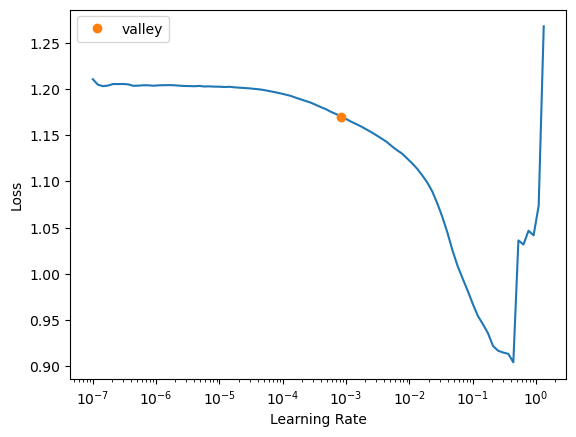

In [161]:
learn.lr_find()

In [162]:
learn.fit_one_cycle(25,0.05)

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,1.073818,0.938761,0.910412,0.335144,0.335144,0.525734,0.321410,00:00
1,0.961867,0.674272,0.897397,0.454547,0.454547,0.426694,0.439647,00:00
2,0.738793,0.456086,0.876944,0.462797,0.462797,0.405149,0.426088,00:00
3,0.598554,1.622302,0.727350,0.484945,0.484945,0.395372,0.395738,00:00
4,0.515630,1.388938,0.684077,0.516337,0.516337,0.374836,0.353747,00:00
5,0.458482,0.960735,0.684922,0.552385,0.552385,0.459175,0.425336,00:00
6,0.414960,0.359368,0.863083,0.515997,0.515997,0.504867,0.455819,00:00
7,0.383284,0.314308,0.901623,0.445695,0.445695,0.475079,0.444412,00:00
8,0.358793,0.307819,0.891481,0.459376,0.459376,0.418835,0.436197,00:00
9,0.340288,0.279315,0.907370,0.417101,0.417101,0.447399,0.427125,00:00


In [163]:
learn.save('learner_internet_wifi')

Path('models/learner_internet_wifi.pth')

In [164]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [165]:
y_predrn = np.array([list(probs).index(max(probs))+1 for probs in preds])

In [166]:
eval_pred_clas(y_predrn,y_test)

(0.005202442886224836,
 0.005202442886224836,
 0.0017110138531087054,
 0.002041566638133362)

### Con SVM

In [167]:
svm = SVC(C=1.0)

In [168]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

{'fit_time': array([6.78022981, 4.93204546, 4.68871212, 5.96605754, 4.73022127,
        5.1999228 , 5.23233223, 4.87414813, 5.91359782, 4.69083071]),
 'score_time': array([1.28257179, 0.99379182, 0.98969316, 1.06053138, 1.00972342,
        1.75079155, 1.00676155, 1.01778507, 1.00872326, 1.01265788]),
 'test_accuracy': array([0.90604934, 0.90638729, 0.90638729, 0.90669371, 0.90669371,
        0.90669371, 0.90669371, 0.90669371, 0.90669371, 0.90635565]),
 'test_recall_weighted': array([0.90604934, 0.90638729, 0.90638729, 0.90669371, 0.90669371,
        0.90669371, 0.90669371, 0.90669371, 0.90669371, 0.90635565]),
 'test_precision_weighted': array([0.82092541, 0.82153792, 0.82153792, 0.82209349, 0.82209349,
        0.82209349, 0.82209349, 0.82209349, 0.82209349, 0.82148056]),
 'test_f1_weighted': array([0.86138946, 0.86187935, 0.86187935, 0.86232359, 0.86232359,
        0.86232359, 0.86232359, 0.86232359, 0.86232359, 0.86183348])}

In [169]:
eval_cv_clas(svm_cv)

(0.9065341844514198,
 0.9065341844514198,
 0.8218042738587636,
 0.8620923212547451)

In [170]:
svm.fit(X_train,y_train)

SVC()

In [171]:
y_test_pred = svm.predict(X_test)

In [172]:
eval_pred_clas(y_test,y_test_pred)

(0.9099751187514137,
 0.9099751187514137,
 0.8280547167466494,
 0.8670842971901793)

### Con N-vecinos

In [173]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [174]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.00603294, 0.00797415, 0.00498319, 0.00498438, 0.00398684,
        0.00398684, 0.00598121, 0.00498343, 0.00498343, 0.0039866 ]),
 'score_time': array([1.24590397, 1.1413877 , 1.09852338, 1.11395621, 1.06923866,
        1.01561785, 1.07785726, 1.1109159 , 1.09136748, 1.08148766]),
 'test_accuracy': array([0.90469753, 0.90503548, 0.90942886, 0.90365112, 0.90466531,
        0.91108857, 0.91446924, 0.90703178, 0.90534145, 0.90838404]),
 'test_recall_weighted': array([0.90469753, 0.90503548, 0.90942886, 0.90365112, 0.90466531,
        0.91108857, 0.91446924, 0.90703178, 0.90534145, 0.90838404]),
 'test_precision_weighted': array([0.88765524, 0.88576739, 0.89163356, 0.8823227 , 0.88304279,
        0.89295786, 0.89693978, 0.88733787, 0.88713511, 0.88780361]),
 'test_f1_weighted': array([0.89392915, 0.89271634, 0.89731954, 0.88985118, 0.89016041,
        0.89828725, 0.90069629, 0.89369143, 0.89370973, 0.89411167])}

In [175]:
eval_cv_clas(nc_cv)

(0.9073793386788704,
 0.9073793386788704,
 0.8882595921824619,
 0.8944472976924441)

In [176]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [177]:
y_test_prednn = nc.predict(X_test)

In [178]:
eval_pred_clas(y_test,y_test_prednn)

(0.9104275050893463,
 0.9104275050893463,
 0.8897921803896388,
 0.8958027991548527)

### Random Forest

In [179]:
rf = RandomForestClassifier(random_state=18)

In [180]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([1.63459539, 1.22992826, 1.24097562, 1.27384949, 1.23427057,
        1.28389239, 1.23391867, 1.24181962, 1.20098233, 1.23488998]),
 'score_time': array([0.04883623, 0.04883671, 0.04783988, 0.0478406 , 0.04883695,
        0.04883671, 0.04783964, 0.04883695, 0.04784012, 0.04784012]),
 'test_accuracy': array([0.90807705, 0.91213248, 0.91280838, 0.90736984, 0.91007437,
        0.9168357 , 0.9158215 , 0.90838404, 0.90736984, 0.91210277]),
 'test_recall_weighted': array([0.90807705, 0.91213248, 0.91280838, 0.90736984, 0.91007437,
        0.9168357 , 0.9158215 , 0.90838404, 0.90736984, 0.91210277]),
 'test_precision_weighted': array([0.88176278, 0.88835084, 0.88930714, 0.88017434, 0.88320394,
        0.89283834, 0.89099046, 0.8797929 , 0.8810339 , 0.88796392]),
 'test_f1_weighted': array([0.88725263, 0.89446101, 0.89205753, 0.88779472, 0.88765352,
        0.89617318, 0.89586283, 0.88579813, 0.88752205, 0.89255647])}

In [181]:
eval_cv_clas(rf_cv)

(0.911097599124021, 0.911097599124021, 0.8855418552819728, 0.8907132090391429)

In [182]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [183]:
y_test_predrf = rf.predict(X_test)

In [184]:
eval_pred_clas(y_test, y_test_predrf)

(0.9144989821307397,
 0.9144989821307397,
 0.8899020874869089,
 0.8951303326740526)

### Ensamble

#### Votacion

In [185]:
vot = VotingClassifier(
    estimators=[('svm', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [186]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([8.24744511, 6.09790993, 6.9057703 , 6.02443814, 6.91954184,
        5.83785534, 6.9839263 , 6.1163516 , 6.78124881, 5.76592779]),
 'score_time': array([2.43188381, 2.14108658, 2.1665833 , 2.16796637, 2.12234521,
        2.04466367, 2.26020503, 2.32330298, 2.18581223, 2.72664022]),
 'test_accuracy': array([0.91111862, 0.91449814, 0.91517405, 0.91244084, 0.9127789 ,
        0.91649763, 0.9158215 , 0.90973631, 0.9127789 , 0.9148073 ]),
 'test_recall_weighted': array([0.91111862, 0.91449814, 0.91517405, 0.91244084, 0.9127789 ,
        0.91649763, 0.9158215 , 0.90973631, 0.9127789 , 0.9148073 ]),
 'test_precision_weighted': array([0.88535445, 0.89569163, 0.89835866, 0.88883261, 0.89217867,
        0.91114262, 0.90015657, 0.8810029 , 0.89371377, 0.90469838]),
 'test_f1_weighted': array([0.88091658, 0.8859033 , 0.88592208, 0.8820827 , 0.88081871,
        0.88703118, 0.88590445, 0.87727608, 0.88326129, 0.88543277])}

In [187]:
eval_cv_clas(vot_cv)

(0.9135652200538301,
 0.9135652200538301,
 0.8951130273310705,
 0.8834549148130739)

In [188]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svm', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [189]:
y_test_predvot = vot.predict(X_test)

In [190]:
eval_pred_clas(y_test, y_test_predvot)

(0.9199276181859308,
 0.9199276181859308,
 0.9052607851242892,
 0.8926904888222352)

#### Bagging

In [191]:
bag = BaggingClassifier(
    base_estimator=clone(nc)
)

In [192]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([0.0728147 , 0.06677675, 0.06876969, 0.08870459, 0.06876969,
        0.07973337, 0.07873654, 0.12558126, 0.06781578, 0.07973504]),
 'score_time': array([12.13628149, 12.35058784, 12.15055013, 11.35447073, 11.9055047 ,
        12.04548359, 11.62193251, 11.58086205, 11.98789978, 11.93188453]),
 'test_accuracy': array([0.90571139, 0.90604934, 0.90909091, 0.90534145, 0.90703178,
        0.91244084, 0.9148073 , 0.90838404, 0.90601758, 0.90973631]),
 'test_recall_weighted': array([0.90571139, 0.90604934, 0.90909091, 0.90534145, 0.90703178,
        0.91244084, 0.9148073 , 0.90838404, 0.90601758, 0.90973631]),
 'test_precision_weighted': array([0.88835032, 0.8866244 , 0.89052354, 0.88304635, 0.88366886,
        0.89398231, 0.89725089, 0.88718189, 0.88700047, 0.88886965]),
 'test_f1_weighted': array([0.89455972, 0.89338347, 0.89648263, 0.89006058, 0.88986003,
        0.8993373 , 0.90018244, 0.89330438, 0.89351193, 0.89468877])}

In [193]:
eval_cv_clas(bag_cv)

(0.908461093588943, 0.908461093588943, 0.888649866109748, 0.8945371246452136)

In [194]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6,
                                                      weights='distance'))

In [195]:
y_test_predbag = bag.predict(X_test)

In [196]:
eval_pred_clas(y_test_predbag, y_test)

(0.9095227324134811, 0.9095227324134811, 0.946620468310576, 0.9256616121398271)

#### Boost

In [63]:
boost = AdaBoostClassifier(clone(rf)
)

In [64]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([118.93135786, 118.15870261, 110.62339449, 112.78181529,
        113.77061319, 113.36988735, 110.97217202, 106.56580544,
        107.75466943, 103.67400193]),
 'score_time': array([4.15437269, 3.54642701, 3.43080449, 4.27566361, 3.29282832,
        3.33829522, 4.02620792, 3.99398255, 4.16103435, 3.24729228]),
 'test_accuracy': array([0.63602568, 0.65630281, 0.64582629, 0.65652468, 0.63691684,
        0.65652468, 0.64401623, 0.64198783, 0.62914131, 0.63319811]),
 'test_recall_weighted': array([0.63602568, 0.65630281, 0.64582629, 0.65652468, 0.63691684,
        0.65652468, 0.64401623, 0.64198783, 0.62914131, 0.63319811]),
 'test_precision_weighted': array([0.63006029, 0.6527037 , 0.63855885, 0.64808693, 0.62721021,
        0.65454515, 0.64030689, 0.63557409, 0.62042423, 0.62703112]),
 'test_f1_weighted': array([0.62791445, 0.64911666, 0.63786903, 0.64707935, 0.62688082,
        0.65076195, 0.63822922, 0.63364171, 0.61958644, 0.62426064])}

In [65]:
eval_cv_clas(boost_cv)

(0.6436464450716017,
 0.6436464450716017,
 0.6374501437945483,
 0.6355340276305302)

In [66]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [67]:
y_test_predboost = boost.predict(X_test)

In [68]:
eval_pred_clas(y_test_predboost,y_test)

(0.6480434290884415, 0.6480434290884415, 0.668402448899094, 0.6561845261981701)

# Internet por línea de marcación



### Con RN

In [18]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [19]:
y_names = ["P4_6_5"]

In [20]:
# Filtrado de datos, solo aquellos que tengan internet
train_df = endutih21[(endutih21.internet==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_6_5
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,2.0
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,2.0
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,2.0
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,0.0
6,101080,1,1,1,1,0,1,1,0,2,...,1,3,1,1,1,1,1,0,9,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58148,3260770,0,1,0,1,0,1,0,0,2,...,4,3,1,1,1,1,1,1,7,2.0
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,2.0
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,0.0
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,2.0


In [21]:
train_df[y_names].value_counts()

P4_6_5
2.0       31853
0.0        2109
1.0          42
dtype: int64

In [22]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=18)

In [23]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [24]:
train_df[y_names].value_counts()

P4_6_5
2.0       27712
0.0        1831
1.0          40
dtype: int64

In [27]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cuda"
                       )

In [28]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-27 10:50:21,345] A new study created in memory with name: no-name-d78690ca-ef09-4f75-b659-3da5e7e74081


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.824013,0.678998,0.808993,0.808993,0.866072,0.836475,00:03
1,0.524069,3.211974,0.755916,0.755916,0.924754,0.815302,00:00
2,0.396545,1.858757,0.633874,0.633874,0.931658,0.724375,00:00
3,0.329489,0.911302,0.685091,0.685091,0.929643,0.764179,00:00
4,0.289853,0.450022,0.796991,0.796991,0.924592,0.843309,00:00
5,0.262629,0.259835,0.885057,0.885057,0.916386,0.898339,00:00
6,0.242922,0.292060,0.866126,0.866126,0.921519,0.888012,00:00
7,0.227299,0.207455,0.927654,0.927654,0.906770,0.914053,00:00
8,0.216191,0.206303,0.932218,0.932218,0.900711,0.906181,00:00
9,0.209403,0.214847,0.930020,0.930020,0.907786,0.914412,00:00


[I 2023-02-27 10:51:12,630] Trial 0 finished with value: 0.08789724111557007 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 184, 'n_neuronas_layer1': 88, 'n_neuronas_layer2': 187, 'n_neuronas_layer3': 146, 'n_neuronas_layer4': 108, 'n_neuronas_layer5': 201, 'bn_final': False, 'embed_p': 0.949608057670391, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 193, 'lr': 0.054127974568926866, 'pct_start': 0.69701481928015, 'div_final': 432701, 'div': 0.22291975586627955}. Best is trial 0 with value: 0.08789724111557007.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.033858,0.625157,0.874915,0.874915,0.918041,0.893297,00:00
1,0.917246,0.798211,0.843644,0.843644,0.920508,0.873372,00:00
2,0.823761,0.670123,0.867816,0.867816,0.920743,0.888886,00:00
3,0.743198,0.578159,0.860210,0.860210,0.918744,0.883552,00:00
4,0.672240,0.500953,0.885226,0.885227,0.914414,0.897766,00:00
5,0.610367,0.424872,0.923597,0.923597,0.907290,0.913980,00:00
6,0.557111,0.400296,0.912441,0.912441,0.910641,0.911537,00:00
7,0.511121,0.365067,0.925794,0.925794,0.908230,0.915042,00:00
8,0.471509,0.339948,0.929851,0.929851,0.905350,0.912387,00:00
9,0.437297,0.332134,0.918695,0.918695,0.910533,0.914346,00:00


[I 2023-02-27 10:51:39,278] Trial 1 finished with value: 0.08434754610061646 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 121, 'n_neuronas_layer1': 176, 'n_neuronas_layer2': 141, 'n_neuronas_layer3': 77, 'n_neuronas_layer4': 146, 'n_neuronas_layer5': 59, 'n_neuronas_layer6': 46, 'n_neuronas_layer7': 228, 'n_neuronas_layer8': 245, 'bn_final': True, 'embed_p': 0.9721381649987202, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 108, 'lr': 0.009402511289624061, 'pct_start': 0.09635791407282988, 'div_final': 942358, 'div': 0.6474554711927013}. Best is trial 1 with value: 0.08434754610061646.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.889823,1.647093,0.201149,0.201149,0.904245,0.270615,00:00
1,0.773077,0.808855,0.807978,0.807978,0.922261,0.850338,00:00
2,0.652940,0.567762,0.840433,0.840433,0.920752,0.871349,00:00
3,0.545404,0.436449,0.848715,0.848715,0.922213,0.877010,00:00
4,0.459429,0.320557,0.871197,0.871197,0.916716,0.889901,00:00
5,0.393732,0.252194,0.906525,0.906525,0.912084,0.909161,00:00
6,0.344483,0.266132,0.890805,0.890805,0.913901,0.900930,00:00
7,0.307177,0.237624,0.905510,0.905510,0.914147,0.909519,00:00
8,0.278614,0.227742,0.914976,0.914976,0.914009,0.914492,00:00
9,0.256730,0.218973,0.917005,0.917005,0.911310,0.914046,00:00


[I 2023-02-27 10:52:11,599] Trial 2 finished with value: 0.08536171913146973 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 152, 'n_neuronas_layer1': 149, 'n_neuronas_layer2': 238, 'n_neuronas_layer3': 189, 'n_neuronas_layer4': 141, 'bn_final': True, 'embed_p': 0.15566858410847087, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 140, 'lr': 0.09308178342669872, 'pct_start': 0.699871634533894, 'div_final': 640597, 'div': 0.5301631351288412}. Best is trial 1 with value: 0.08434754610061646.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,11.695376,5748.058594,0.933570,0.933570,0.871553,0.901496,00:00
1,10.240513,557.616699,0.933570,0.933570,0.871553,0.901496,00:00
2,10.291164,25.009575,0.577417,0.577417,0.931217,0.677796,00:00
3,13.588827,27.479996,0.927316,0.927316,0.871163,0.898363,00:00
4,12.715739,1.949111,0.931204,0.931204,0.871406,0.900313,00:00
5,11.473009,25.973988,0.933570,0.933570,0.904398,0.901827,00:00
6,9.962896,2.647401,0.589757,0.589757,0.888466,0.691506,00:00
7,7.962658,3.711045,0.929006,0.929006,0.871269,0.899211,00:00
8,6.986702,3.170413,0.933570,0.933570,0.871553,0.901496,00:00
9,5.771233,1.610609,0.933570,0.933570,0.871553,0.901496,00:00


[I 2023-02-27 10:52:38,340] Trial 3 finished with value: 0.06828939914703369 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 198, 'n_neuronas_layer1': 152, 'n_neuronas_layer2': 250, 'n_neuronas_layer3': 114, 'n_neuronas_layer4': 134, 'n_neuronas_layer5': 233, 'n_neuronas_layer6': 184, 'n_neuronas_layer7': 176, 'n_neuronas_layer8': 129, 'bn_final': False, 'embed_p': 0.42136120503452573, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 108, 'lr': 0.058013473031052296, 'pct_start': 0.36228052946114603, 'div_final': 865288, 'div': 0.0846957382319007}. Best is trial 3 with value: 0.06828939914703369.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.239516,21.739180,0.814909,0.814909,0.910149,0.859449,00:00
1,0.723142,3.050128,0.912103,0.912103,0.877070,0.893482,00:00
2,0.560891,2.076548,0.557978,0.557978,0.935061,0.660397,00:00
3,0.468414,0.678262,0.795808,0.795808,0.924265,0.842470,00:00
4,0.407615,0.310347,0.891143,0.891143,0.912730,0.900694,00:00
5,0.360697,0.302959,0.894692,0.894692,0.912118,0.902529,00:00
6,0.321468,0.239652,0.933570,0.933570,0.871553,0.901496,00:00
7,0.293449,0.240382,0.933570,0.933570,0.871553,0.901496,00:00
8,0.271094,0.226843,0.933739,0.933739,0.915448,0.902240,00:00
9,0.252083,0.238298,0.921400,0.921400,0.913130,0.916948,00:00


[I 2023-02-27 10:53:13,659] Trial 4 finished with value: 0.09144693613052368 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 48, 'n_neuronas_layer1': 113, 'n_neuronas_layer2': 220, 'n_neuronas_layer3': 58, 'n_neuronas_layer4': 205, 'n_neuronas_layer5': 162, 'n_neuronas_layer6': 150, 'bn_final': False, 'embed_p': 0.3331099676002198, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 149, 'lr': 0.05846719957498276, 'pct_start': 0.3268340325679079, 'div_final': 872752, 'div': 0.566841024749517}. Best is trial 3 with value: 0.06828939914703369.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.515825,2.751641,0.859026,0.859026,0.919619,0.883020,00:00
1,0.367047,8.810363,0.585362,0.585362,0.934117,0.687225,00:00
2,0.310689,2.293899,0.655172,0.655172,0.929261,0.741284,00:00
3,0.271093,0.721423,0.778567,0.778567,0.925076,0.830910,00:00
4,0.245643,0.318318,0.858012,0.858012,0.921783,0.882895,00:00
5,0.228164,0.211552,0.922414,0.922414,0.907453,0.913797,00:00
6,0.217915,0.201157,0.933063,0.933063,0.902990,0.905545,00:00
7,0.210632,0.226332,0.926640,0.926640,0.899882,0.909105,00:00
8,0.204118,0.201848,0.932725,0.932725,0.905398,0.909091,00:00
9,0.198605,0.203386,0.933570,0.933570,0.871553,0.901496,00:00


[I 2023-02-27 10:54:11,506] Trial 5 finished with value: 0.09263014793395996 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 178, 'n_neuronas_layer1': 56, 'n_neuronas_layer2': 41, 'n_neuronas_layer3': 212, 'n_neuronas_layer4': 114, 'n_neuronas_layer5': 80, 'bn_final': False, 'embed_p': 0.21677553426314425, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 235, 'lr': 0.08576366193773495, 'pct_start': 0.16266785818968219, 'div_final': 436365, 'div': 0.14260410871244472}. Best is trial 3 with value: 0.06828939914703369.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.625571,304.438904,0.933570,0.933570,0.871553,0.901496,00:00
1,0.414949,30.025740,0.470588,0.470588,0.935199,0.578708,00:00
2,0.645785,7.809851,0.751859,0.751859,0.925703,0.812420,00:00
3,0.686632,1.853044,0.933570,0.933570,0.871553,0.901496,00:00
4,0.619738,0.235984,0.933570,0.933570,0.871553,0.901496,00:00
5,0.534510,0.736824,0.622042,0.622042,0.930597,0.714914,00:00
6,0.450314,2.239006,0.445740,0.445740,0.934148,0.553797,00:00
7,0.388583,0.604766,0.755071,0.755071,0.925925,0.814684,00:00
8,0.341870,0.354506,0.845504,0.845504,0.921592,0.874803,00:00
9,0.305936,0.218884,0.933739,0.933739,0.909492,0.902886,00:00


[I 2023-02-27 10:55:16,432] Trial 6 finished with value: 0.07200813293457031 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 124, 'n_neuronas_layer1': 235, 'n_neuronas_layer2': 183, 'n_neuronas_layer3': 135, 'n_neuronas_layer4': 44, 'n_neuronas_layer5': 115, 'n_neuronas_layer6': 52, 'n_neuronas_layer7': 251, 'n_neuronas_layer8': 206, 'bn_final': False, 'embed_p': 0.1932536590141017, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 245, 'lr': 0.05296196525897506, 'pct_start': 0.5483126030427485, 'div_final': 724360, 'div': 0.07712359610864428}. Best is trial 3 with value: 0.06828939914703369.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.661830,6.035726,0.252535,0.252535,0.881006,0.338647,00:00
1,0.507360,3.958801,0.669540,0.669540,0.926751,0.752426,00:00
2,0.396105,2.460290,0.709770,0.709770,0.929398,0.782522,00:00
3,0.327297,0.699382,0.808993,0.808993,0.924563,0.851350,00:00
4,0.284535,0.451635,0.827417,0.827417,0.923565,0.863395,00:00
5,0.255719,0.275687,0.884550,0.884550,0.917932,0.898532,00:00
6,0.236631,0.506688,0.803922,0.803922,0.923873,0.847865,00:00
7,0.221652,0.241797,0.912103,0.912103,0.912071,0.912084,00:00
8,0.210692,0.238883,0.900270,0.900270,0.911659,0.905520,00:00
9,0.202151,0.211675,0.931204,0.931204,0.906641,0.912667,00:00


[I 2023-02-27 10:56:03,431] Trial 7 finished with value: 0.09330630302429199 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 44, 'n_neuronas_layer1': 95, 'n_neuronas_layer2': 134, 'n_neuronas_layer3': 89, 'n_neuronas_layer4': 179, 'n_neuronas_layer5': 46, 'n_neuronas_layer6': 54, 'bn_final': True, 'embed_p': 0.05979540361463368, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 186, 'lr': 0.06375426814380772, 'pct_start': 0.1465629119664097, 'div_final': 448916, 'div': 0.1495817860582007}. Best is trial 3 with value: 0.06828939914703369.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.114619,0.914607,0.858012,0.858012,0.911728,0.881913,00:00
1,1.054057,0.897284,0.770622,0.770622,0.924243,0.826362,00:00
2,1.013238,0.892955,0.793442,0.793442,0.924333,0.840936,00:00
3,0.974159,0.849271,0.828600,0.828600,0.922192,0.863940,00:00
4,0.934505,0.806554,0.859026,0.859026,0.918990,0.882864,00:00
5,0.893335,0.752328,0.875085,0.875085,0.918219,0.892759,00:00
6,0.851565,0.671085,0.907877,0.907877,0.916107,0.911685,00:00
7,0.808459,0.622212,0.887762,0.887762,0.916538,0.900034,00:00
8,0.764797,0.585374,0.896890,0.896890,0.916590,0.905531,00:00
9,0.721740,0.550763,0.904158,0.904158,0.911666,0.907686,00:00


[I 2023-02-27 10:56:13,840] Trial 8 finished with value: 0.07082486152648926 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 183, 'n_neuronas_layer1': 47, 'n_neuronas_layer2': 209, 'n_neuronas_layer3': 83, 'bn_final': True, 'embed_p': 0.5855201301962842, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 46, 'lr': 0.023543399426106303, 'pct_start': 0.10431176090197151, 'div_final': 42906, 'div': 0.7961655454265137}. Best is trial 3 with value: 0.06828939914703369.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.531673,11.467877,0.317782,0.317782,0.899997,0.416151,00:00
1,0.363300,17.386705,0.623732,0.623732,0.929807,0.716331,00:00
2,0.291805,4.224924,0.611900,0.611900,0.933118,0.706463,00:00
3,0.254218,1.820443,0.658215,0.658215,0.931307,0.743581,00:00
4,0.232434,0.714735,0.738844,0.738844,0.927538,0.803524,00:00
5,0.217428,0.336044,0.853955,0.853955,0.919533,0.879769,00:00
6,0.207033,0.247107,0.904158,0.904158,0.914269,0.908816,00:00
7,0.199391,4.095707,0.932556,0.932556,0.899653,0.904403,00:00
8,0.194226,0.213221,0.933570,0.933570,0.905910,0.905249,00:00
9,0.190261,0.207740,0.933401,0.933401,0.904339,0.904860,00:00


[I 2023-02-27 10:57:14,935] Trial 9 finished with value: 0.09093981981277466 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 197, 'n_neuronas_layer1': 172, 'n_neuronas_layer2': 51, 'n_neuronas_layer3': 221, 'n_neuronas_layer4': 117, 'n_neuronas_layer5': 137, 'n_neuronas_layer6': 136, 'n_neuronas_layer7': 127, 'bn_final': True, 'embed_p': 0.37063215196253013, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 234, 'lr': 0.08180306714849131, 'pct_start': 0.5032959004687858, 'div_final': 98319, 'div': 0.48731021930249524}. Best is trial 3 with value: 0.06828939914703369.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.854529,928.379822,0.933401,0.933401,0.871542,0.901412,00:00
1,0.999060,1.645579,0.909905,0.909905,0.871955,0.890322,00:00
2,0.918135,1.411725,0.933570,0.933570,0.871553,0.901496,00:00
3,0.908944,0.817878,0.933570,0.933570,0.871553,0.901496,00:00
4,0.799691,0.420918,0.859703,0.859703,0.900127,0.877645,00:00
5,0.698612,0.620365,0.933570,0.933570,0.871553,0.901496,00:00
6,0.633969,0.363539,0.933570,0.933570,0.871553,0.901496,00:00
7,0.554539,0.359142,0.770284,0.770284,0.925362,0.825253,00:00
8,0.483945,0.262861,0.933570,0.933570,0.871553,0.901496,00:00
9,0.424264,0.212882,0.918526,0.918526,0.912104,0.915158,00:00


[I 2023-02-27 10:57:32,921] Trial 10 finished with value: 0.07285326719284058 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 256, 'n_neuronas_layer1': 235, 'n_neuronas_layer2': 256, 'n_neuronas_layer3': 137, 'n_neuronas_layer4': 240, 'n_neuronas_layer5': 253, 'n_neuronas_layer6': 244, 'n_neuronas_layer7': 32, 'n_neuronas_layer8': 65, 'n_neuronas_layer9': 195, 'n_neuronas_layer10': 250, 'n_neuronas_layer11': 34, 'n_neuronas_layer12': 214, 'bn_final': False, 'embed_p': 0.544642471078887, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 66, 'lr': 0.03428395548402876, 'pct_start': 0.857631752087409, 'div_final': 748214, 'div': 0.32646370770154776}. Best is trial 3 with value: 0.06828939914703369.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.903527,0.666073,0.931542,0.931542,0.901338,0.907936,00:00
1,0.700316,0.412212,0.923428,0.923428,0.904235,0.911920,00:00
2,0.560534,0.312607,0.932218,0.932218,0.901841,0.906987,00:00
3,0.464267,0.260534,0.933401,0.933401,0.899989,0.902391,00:00
4,0.396449,0.240672,0.932894,0.932894,0.896865,0.903072,00:00
5,0.348275,0.231338,0.932387,0.932387,0.903339,0.907871,00:00
6,0.312534,0.222021,0.933570,0.933570,0.905772,0.904953,00:00
7,0.285691,0.217844,0.932387,0.932387,0.903043,0.907612,00:00
8,0.265057,0.214614,0.931880,0.931880,0.901136,0.907051,00:00
9,0.248386,0.211081,0.930696,0.930696,0.901018,0.908341,00:00


[I 2023-02-27 10:57:38,605] Trial 11 finished with value: 0.0716700553894043 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 244, 'bn_final': True, 'embed_p': 0.5782221050281728, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 31, 'lr': 0.03376079036349937, 'pct_start': 0.26982562602916976, 'div_final': 106962, 'div': 0.8913143972467559}. Best is trial 3 with value: 0.06828939914703369.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.852333,0.433437,0.933570,0.933570,0.871553,0.901496,00:00
1,0.521582,0.244847,0.932049,0.932049,0.897545,0.904691,00:00
2,0.387617,0.255161,0.928668,0.928668,0.900212,0.908915,00:00
3,0.324719,0.269712,0.917005,0.917005,0.903170,0.909374,00:00
4,0.285851,0.261198,0.921907,0.921907,0.906917,0.913308,00:00
5,0.259054,0.248436,0.923259,0.923259,0.906840,0.913601,00:00
6,0.239569,0.244368,0.934584,0.934584,0.912113,0.910230,00:00
7,0.225654,0.263939,0.915314,0.915314,0.900368,0.907099,00:00
8,0.213409,0.247197,0.924780,0.924780,0.902779,0.911092,00:00
9,0.202797,0.232112,0.927485,0.927485,0.899622,0.908815,00:00


[I 2023-02-27 10:57:57,684] Trial 12 finished with value: 0.08603787422180176 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 221, 'n_neuronas_layer1': 32, 'n_neuronas_layer2': 202, 'bn_final': False, 'embed_p': 0.6292448992246152, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 83, 'lr': 0.008537831480952772, 'pct_start': 0.35240707126080834, 'div_final': 262830, 'div': 0.9846307994993261}. Best is trial 3 with value: 0.06828939914703369.


In [29]:
study.best_value

0.06828939914703369

In [30]:
study.best_params

{'n_layers': 9,
 'n_neuronas_layer0': 198,
 'n_neuronas_layer1': 152,
 'n_neuronas_layer2': 250,
 'n_neuronas_layer3': 114,
 'n_neuronas_layer4': 134,
 'n_neuronas_layer5': 233,
 'n_neuronas_layer6': 184,
 'n_neuronas_layer7': 176,
 'n_neuronas_layer8': 129,
 'bn_final': False,
 'embed_p': 0.42136120503452573,
 'idx_act_cls': 0,
 'idx_opt_func': 1,
 'epoch': 108,
 'lr': 0.058013473031052296,
 'pct_start': 0.36228052946114603,
 'div_final': 865288,
 'div': 0.0846957382319007}

In [31]:
gc.collect()

10320

In [32]:
learn = ft.tabular_learner(dls,
                           layers = [198, 152, 250, 114, 134, 233, 184, 176, 129],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.ReLU(inplace=True), bn_final=False, embed_p=0.3434),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.0010000000474974513)

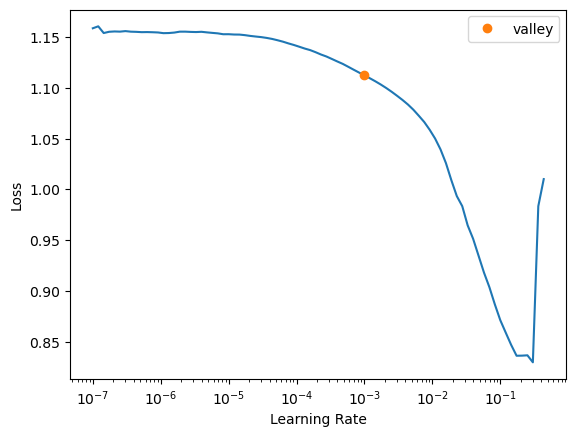

In [33]:
learn.lr_find()

In [42]:
learn.fit_one_cycle(108,0.05, pct_start= 0.3623, div_final=8e5, div=0.0847)

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,4.523571,12491061985280.000000,0.270284,0.207268,0.207268,0.297865,0.152882,00:00
1,11.909345,4603315200.000000,0.690669,0.413091,0.413091,0.326640,0.281850,00:00
2,12.762240,3719.050049,0.933570,0.333333,0.333333,0.311190,0.321881,00:00
3,11.092612,7510.073242,0.460277,0.315727,0.315727,0.332018,0.241498,00:00
4,11.542875,1453.469238,0.734956,0.509117,0.509117,0.383930,0.373393,00:00
5,9.638967,6.181155,0.933401,0.333273,0.333273,0.311186,0.321851,00:00
6,8.528115,10.053452,0.370859,0.271785,0.271785,0.316894,0.202084,00:00
7,7.276918,9363.884766,0.783469,0.459958,0.459958,0.385049,0.387022,00:00
8,5.991868,12.940764,0.299189,0.217816,0.217816,0.306155,0.158565,00:00
9,5.307625,5.270133,0.591954,0.489296,0.489296,0.371526,0.315735,00:00


In [43]:
learn.save('learner_internet_marcacion')

Path('models/learner_internet_marcacion.pth')

In [44]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [45]:
y_predrn = np.array([list(probs).index(max(probs))+1 for probs in preds])

In [46]:
eval_pred_clas(y_predrn,y_test)

(0.0, 0.0, 0.0, 0.0)

### Con SVM

In [47]:
svm = SVC(C=1.0)

In [48]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

{'fit_time': array([4.21377087, 3.49723411, 4.0200808 , 3.64595342, 3.5960238 ,
        3.31994939, 3.15942049, 3.99453807, 3.5668366 , 3.21259236]),
 'score_time': array([0.82429099, 0.8009088 , 0.78438354, 1.24701953, 0.79822755,
        0.75510883, 0.78725719, 0.83082175, 0.79371572, 0.78940463]),
 'test_accuracy': array([0.93646502, 0.93680297, 0.93680297, 0.93678161, 0.93678161,
        0.93678161, 0.93678161, 0.93678161, 0.93678161, 0.93678161]),
 'test_recall_weighted': array([0.93646502, 0.93680297, 0.93680297, 0.93678161, 0.93678161,
        0.93678161, 0.93678161, 0.93678161, 0.93678161, 0.93678161]),
 'test_precision_weighted': array([0.87696674, 0.87759981, 0.87759981, 0.87755978, 0.87755978,
        0.87755978, 0.87755978, 0.87755978, 0.87755978, 0.87755978]),
 'test_f1_weighted': array([0.90573982, 0.90623551, 0.90623551, 0.90620417, 0.90620417,
        0.90620417, 0.90620417, 0.90620417, 0.90620417, 0.90620417])}

In [49]:
eval_cv_clas(svm_cv)

(0.9367542234290086, 0.9367542234290086, 0.8775084844761432, 0.906164000567089)

In [50]:
svm.fit(X_train,y_train)

SVC()

In [51]:
y_test_pred = svm.predict(X_test)

In [52]:
eval_pred_clas(y_test,y_test_pred)

(0.9366659126894368,
 0.9366659126894368,
 0.8773430319943356,
 0.9060344649490674)

### Con N-vecinos

In [53]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [54]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.0059793 , 0.0039866 , 0.00398421, 0.00298977, 0.00299025,
        0.00299072, 0.0039835 , 0.00398731, 0.00497937, 0.00299001]),
 'score_time': array([1.38002586, 1.15655899, 1.12133455, 1.08879542, 1.16079617,
        1.09499574, 1.1221776 , 1.08855534, 1.1547389 , 1.07297921]),
 'test_accuracy': array([0.93274755, 0.93477526, 0.93578912, 0.93002028, 0.93576741,
        0.93711968, 0.9418526 , 0.93441515, 0.93069642, 0.93340095]),
 'test_recall_weighted': array([0.93274755, 0.93477526, 0.93578912, 0.93002028, 0.93576741,
        0.93711968, 0.9418526 , 0.93441515, 0.93069642, 0.93340095]),
 'test_precision_weighted': array([0.91548571, 0.92099032, 0.91999666, 0.91212001, 0.92094067,
        0.92227087, 0.9285061 , 0.91584073, 0.91332405, 0.91546792]),
 'test_f1_weighted': array([0.92160157, 0.92605995, 0.92510671, 0.91840107, 0.92552113,
        0.92693617, 0.93054494, 0.92161739, 0.91973731, 0.92130055])}

In [55]:
eval_cv_clas(nc_cv)

(0.9346584411112338,
 0.9346584411112338,
 0.9184943033153891,
 0.9236826791431338)

In [56]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [57]:
y_test_prednn = nc.predict(X_test)

In [58]:
eval_pred_clas(y_test,y_test_prednn)

(0.9359873331825379,
 0.9359873331825379,
 0.9187724737734199,
 0.9232014742644186)

### Random Forest

In [59]:
rf = RandomForestClassifier(random_state=18)

In [60]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([1.20476365, 1.85969138, 1.29870605, 1.16366196, 1.10990906,
        1.15888643, 1.30593419, 1.25410628, 1.21580148, 1.17173195]),
 'score_time': array([0.04684353, 0.07175994, 0.04485035, 0.05083132, 0.04599571,
        0.04749131, 0.07279634, 0.05008411, 0.04513025, 0.04590511]),
 'test_accuracy': array([0.93950659, 0.94322406, 0.93747888, 0.93711968, 0.93711968,
        0.94320487, 0.943881  , 0.94151454, 0.93407708, 0.9428668 ]),
 'test_recall_weighted': array([0.93950659, 0.94322406, 0.93747888, 0.93711968, 0.93711968,
        0.94320487, 0.943881  , 0.94151454, 0.93407708, 0.9428668 ]),
 'test_precision_weighted': array([0.92256987, 0.92984889, 0.91759662, 0.91833402, 0.91804608,
        0.92991599, 0.93107983, 0.92639918, 0.91196742, 0.9298945 ]),
 'test_f1_weighted': array([0.9243074 , 0.9302912 , 0.920888  , 0.92148106, 0.92109878,
        0.93088732, 0.93078007, 0.92560944, 0.918183  , 0.92845576])}

In [61]:
eval_cv_clas(rf_cv)

(0.9399993167839673,
 0.9399993167839673,
 0.9235652406336842,
 0.9251982023685297)

In [62]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [63]:
y_test_predrf = rf.predict(X_test)

In [64]:
eval_pred_clas(y_test, y_test_predrf)

(0.9393802307170324,
 0.9393802307170324,
 0.9224930580587029,
 0.9237325621701642)

### Ensamble

#### Votacion

In [65]:
vot = VotingClassifier(
    estimators=[('svm', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [66]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([4.93881011, 4.50814438, 4.76080203, 5.30944252, 4.86008763,
        5.24673939, 4.40547085, 4.77162671, 4.37778068, 4.31726623]),
 'score_time': array([2.43551421, 1.97375321, 2.30556059, 1.89698625, 1.97336245,
        1.87921429, 1.90360498, 2.25604367, 1.89959359, 1.91851807]),
 'test_accuracy': array([0.94119635, 0.94119635, 0.94187225, 0.9408384 , 0.94151454,
        0.94354293, 0.9418526 , 0.93914807, 0.93948614, 0.9418526 ]),
 'test_recall_weighted': array([0.94119635, 0.94119635, 0.94187225, 0.9408384 , 0.94151454,
        0.94354293, 0.9418526 , 0.93914807, 0.93948614, 0.9418526 ]),
 'test_precision_weighted': array([0.93065823, 0.9285126 , 0.93592626, 0.93102853, 0.9317952 ,
        0.93465031, 0.9359057 , 0.92470997, 0.92492683, 0.93658987]),
 'test_f1_weighted': array([0.91974266, 0.92046822, 0.9194979 , 0.91830144, 0.92020779,
        0.92470671, 0.91947098, 0.91468512, 0.91594302, 0.9200114 ])}

In [67]:
eval_cv_clas(vot_cv)

(0.9412500248494127,
 0.9412500248494127,
 0.9314703497419791,
 0.9193035240662748)

In [68]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svm', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [69]:
y_test_predvot = vot.predict(X_test)

In [70]:
eval_pred_clas(y_test, y_test_predvot)

(0.9432255145894594,
 0.9432255145894594,
 0.9389026041555032,
 0.9225701789585675)

#### Bagging

In [71]:
bag = BaggingClassifier(
    base_estimator=clone(rf)
)

In [72]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([8.98440385, 8.20672512, 9.1044786 , 7.7623632 , 8.62555408,
        8.02739763, 8.86224842, 7.99488831, 8.70994043, 8.61471796]),
 'score_time': array([0.4385941 , 0.4207449 , 0.42860436, 0.43448973, 0.43163061,
        0.42650366, 0.45022225, 0.58275509, 0.41910815, 0.43891168]),
 'test_accuracy': array([0.94187225, 0.94254816, 0.93781683, 0.93982421, 0.93813387,
        0.94219067, 0.94354293, 0.94219067, 0.93610548, 0.9418526 ]),
 'test_recall_weighted': array([0.94187225, 0.94254816, 0.93781683, 0.93982421, 0.93813387,
        0.94219067, 0.94354293, 0.94219067, 0.93610548, 0.9418526 ]),
 'test_precision_weighted': array([0.92947385, 0.92925603, 0.91632721, 0.92244912, 0.9181788 ,
        0.92812839, 0.93712393, 0.9317423 , 0.91396861, 0.92826392]),
 'test_f1_weighted': array([0.92287484, 0.925612  , 0.91638819, 0.92169038, 0.91799392,
        0.92572457, 0.92435399, 0.92203399, 0.91835   , 0.92351265])}

In [73]:
eval_cv_clas(bag_cv)

(0.9406077675036405, 0.9406077675036405, 0.925491216402466, 0.9218534530107363)

In [74]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [75]:
y_test_predbag = bag.predict(X_test)

In [76]:
eval_pred_clas(y_test_predbag, y_test)

(0.9400588102239312,
 0.9400588102239312,
 0.9826106665097502,
 0.9585528374290501)

#### Boost

In [77]:
boost = AdaBoostClassifier(clone(rf)
)

In [78]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([90.13322711, 89.29102015, 86.38802004, 81.1594727 , 86.65841675,
        85.16756201, 87.05361652, 88.42381859, 93.38865399, 81.93062901]),
 'score_time': array([3.48911428, 3.80004787, 3.64705324, 3.47307372, 5.91443253,
        3.56959128, 3.39988804, 3.34925723, 3.53526855, 3.62736654]),
 'test_accuracy': array([0.93883069, 0.93916864, 0.93612707, 0.93711968, 0.93847194,
        0.94252874, 0.9408384 , 0.93644354, 0.93542934, 0.93982421]),
 'test_recall_weighted': array([0.93883069, 0.93916864, 0.93612707, 0.93711968, 0.93847194,
        0.94252874, 0.9408384 , 0.93644354, 0.93542934, 0.93982421]),
 'test_precision_weighted': array([0.92038347, 0.92081736, 0.91226273, 0.91547237, 0.91917229,
        0.931141  , 0.92609044, 0.91267937, 0.91162314, 0.92393238]),
 'test_f1_weighted': array([0.91817483, 0.91866216, 0.91623008, 0.91733774, 0.91630204,
        0.92357013, 0.92111   , 0.91596437, 0.91664393, 0.92004118])}

In [79]:
eval_cv_clas(boost_cv)

(0.9384782242598361, 0.9384782242598361, 0.9193574545607645, 0.918403646281028)

In [80]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [81]:
y_test_predboost = boost.predict(X_test)

In [82]:
eval_pred_clas(y_test_predboost,y_test)

(0.9402850033928976,
 0.9402850033928976,
 0.9865706351551254,
 0.9606031245552205)

# Conexión por smartphone




### Con RN

In [83]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [84]:
y_names = ["P4_7_1"]

In [85]:
# Filtrado de datos, solo aquellos que tengan internet
train_df = endutih21[(endutih21.internet==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_7_1
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,0.0
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,0.0
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,0.0
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,2.0
6,101080,1,1,1,1,0,1,1,0,2,...,1,3,1,1,1,1,1,0,9,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58148,3260770,0,1,0,1,0,1,0,0,2,...,4,3,1,1,1,1,1,1,7,0.0
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,0.0
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,1.0
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,0.0


In [86]:
train_df[y_names].value_counts()

P4_7_1
0.0       23745
1.0       10059
2.0         200
dtype: int64

In [87]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=18)

In [88]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [89]:
train_df[y_names].value_counts()

P4_7_1
0.0       20648
1.0        8759
2.0         176
dtype: int64

In [90]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cpu"
                       )

In [91]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-27 11:26:33,068] A new study created in memory with name: no-name-d3be668b-94ab-4e1c-812e-16f7044752b0


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.858276,0.702348,0.689148,0.689148,0.601213,0.591916,00:00
1,0.743765,0.633645,0.698107,0.698107,0.487353,0.573996,00:00
2,0.699128,0.628836,0.695909,0.695909,0.602552,0.579583,00:00
3,0.675756,0.632748,0.692529,0.692529,0.625373,0.607628,00:00
4,0.661371,0.623161,0.698952,0.698952,0.651907,0.582911,00:00
5,0.651608,0.619438,0.698276,0.698276,0.641427,0.578997,00:00
6,0.644367,0.619264,0.695064,0.695064,0.628255,0.600770,00:00
7,0.638752,0.619441,0.697600,0.697600,0.636685,0.595969,00:00
8,0.633454,0.620336,0.698445,0.698445,0.642742,0.582648,00:00
9,0.628988,0.612873,0.697938,0.697938,0.637310,0.590847,00:00


[I 2023-02-27 11:27:08,364] Trial 0 finished with value: 0.27112913131713867 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 114, 'bn_final': True, 'embed_p': 0.5311607501745746, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 140, 'lr': 0.07806145077643356, 'pct_start': 0.20311057561744408, 'div_final': 526641, 'div': 0.670127384155826}. Best is trial 0 with value: 0.27112913131713867.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.132561,1.112225,0.219405,0.219405,0.636720,0.282662,00:01
1,1.092853,1.045110,0.540906,0.540906,0.637573,0.562544,00:01
2,1.056026,1.000346,0.580798,0.580798,0.638334,0.597445,00:01
3,1.013660,0.917512,0.627958,0.627958,0.619766,0.623725,00:01
4,0.961946,0.817092,0.636748,0.636748,0.630186,0.633394,00:01
5,0.901639,0.715801,0.685260,0.685260,0.628712,0.628204,00:01
6,0.843173,0.661352,0.691346,0.691346,0.621192,0.606049,00:01
7,0.792785,0.641144,0.695909,0.695909,0.631155,0.600536,00:01
8,0.751843,0.634547,0.699121,0.699121,0.666609,0.580025,00:01
9,0.719757,0.630078,0.696247,0.696247,0.623836,0.589425,00:01


[I 2023-02-27 11:32:18,164] Trial 1 finished with value: 0.36291414499282837 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 58, 'n_neuronas_layer1': 93, 'n_neuronas_layer2': 191, 'n_neuronas_layer3': 87, 'n_neuronas_layer4': 204, 'n_neuronas_layer5': 113, 'n_neuronas_layer6': 58, 'n_neuronas_layer7': 144, 'n_neuronas_layer8': 159, 'n_neuronas_layer9': 199, 'n_neuronas_layer10': 229, 'n_neuronas_layer11': 115, 'n_neuronas_layer12': 133, 'bn_final': False, 'embed_p': 0.4828980009894179, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 233, 'lr': 0.0072651347414467585, 'pct_start': 0.510284429828508, 'div_final': 41424, 'div': 0.8968578815905899}. Best is trial 0 with value: 0.27112913131713867.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,3.124421,5.410012,0.319980,0.319980,0.622130,0.382301,00:00
1,2.287815,1.095163,0.697938,0.697938,0.487318,0.573914,00:00
2,1.732445,1.605893,0.462475,0.462475,0.493427,0.475713,00:00
3,1.399624,0.844129,0.698107,0.698107,0.487353,0.573996,00:00
4,1.200897,0.673965,0.690669,0.690669,0.601130,0.589776,00:00
5,1.066141,0.719245,0.689993,0.689993,0.487898,0.571570,00:00
6,0.976964,0.688157,0.689317,0.689317,0.603154,0.593592,00:00
7,0.909496,0.655410,0.697769,0.697769,0.487282,0.573832,00:00
8,0.851902,0.639686,0.698952,0.698952,0.718852,0.576587,00:00
9,0.804884,0.637832,0.698445,0.698445,0.645502,0.579684,00:00


[I 2023-02-27 11:33:04,763] Trial 2 finished with value: 0.30933064222335815 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 215, 'n_neuronas_layer1': 195, 'bn_final': False, 'embed_p': 0.592393276976275, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 119, 'lr': 0.03812446978740745, 'pct_start': 0.2181790300892521, 'div_final': 486389, 'div': 0.2665046499898302}. Best is trial 0 with value: 0.27112913131713867.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.336173,129.105347,0.698107,0.698107,0.487353,0.573996,00:00
1,1.008784,2.507655,0.529581,0.529581,0.555633,0.540459,00:00
2,0.879828,1.170404,0.650270,0.650270,0.555385,0.581008,00:00
3,0.810328,0.720695,0.698107,0.698107,0.487353,0.573996,00:00
4,0.762741,0.645978,0.696247,0.696247,0.613865,0.582091,00:00
5,0.730306,0.628171,0.698107,0.698107,0.487353,0.573996,00:00
6,0.707380,0.628537,0.698107,0.698107,0.487353,0.573996,00:00
7,0.688954,0.651225,0.693374,0.693374,0.616278,0.593823,00:00
8,0.675217,0.626550,0.698107,0.698107,0.487353,0.573996,00:00
9,0.662747,0.621661,0.697431,0.697431,0.576448,0.574602,00:00


[I 2023-02-27 11:35:45,258] Trial 3 finished with value: 0.2919202446937561 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 253, 'n_neuronas_layer1': 78, 'n_neuronas_layer2': 159, 'n_neuronas_layer3': 97, 'n_neuronas_layer4': 218, 'n_neuronas_layer5': 44, 'n_neuronas_layer6': 165, 'n_neuronas_layer7': 103, 'bn_final': False, 'embed_p': 0.11894429904811499, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 239, 'lr': 0.058516828347335334, 'pct_start': 0.24322552508847387, 'div_final': 808348, 'div': 0.5260611248767747}. Best is trial 0 with value: 0.27112913131713867.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,2.711881,54.091660,0.344828,0.344828,0.584173,0.307190,00:01
1,1.910080,20.844820,0.364773,0.364773,0.604813,0.319627,00:01
2,1.546464,2.323854,0.686782,0.686782,0.488278,0.570763,00:01
3,1.301401,1.193866,0.690500,0.690500,0.486567,0.570867,00:01
4,1.140566,0.738640,0.571501,0.571501,0.591904,0.579932,00:01
5,1.019155,0.668125,0.652975,0.652975,0.592338,0.607401,00:01
6,0.928320,0.639931,0.697938,0.697938,0.487318,0.573914,00:00
7,0.862974,0.656172,0.686105,0.686105,0.603533,0.598309,00:00
8,0.817229,0.653699,0.697093,0.697093,0.487139,0.573504,00:00
9,0.809604,0.915713,0.330798,0.330798,0.643846,0.220753,00:00


[I 2023-02-27 11:39:09,288] Trial 4 finished with value: 0.3149087429046631 and parameters: {'n_layers': 8, 'n_neuronas_layer0': 39, 'n_neuronas_layer1': 197, 'n_neuronas_layer2': 212, 'n_neuronas_layer3': 140, 'n_neuronas_layer4': 95, 'n_neuronas_layer5': 144, 'n_neuronas_layer6': 213, 'n_neuronas_layer7': 192, 'bn_final': False, 'embed_p': 0.6047104742951145, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 194, 'lr': 0.09606891206721607, 'pct_start': 0.8788405148783837, 'div_final': 67302, 'div': 0.7948668730090285}. Best is trial 0 with value: 0.27112913131713867.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.889624,512.958008,0.697093,0.697093,0.487222,0.573562,00:01
1,1.299058,4.809731,0.412779,0.412779,0.602411,0.397884,00:01
2,1.072574,1.268794,0.636748,0.636748,0.591687,0.606840,00:01
3,0.941384,0.683307,0.694895,0.694895,0.571299,0.576451,00:01
4,0.866453,0.665306,0.652806,0.652806,0.597256,0.611691,00:01
5,0.814984,0.638536,0.695233,0.695233,0.630202,0.603031,00:01
6,0.773543,0.627952,0.698445,0.698445,0.784509,0.574786,00:01
7,0.742275,0.635101,0.696586,0.696586,0.626108,0.579359,00:01
8,0.721200,0.668133,0.620352,0.620352,0.638210,0.627361,00:01
9,0.702218,0.624218,0.699121,0.699121,0.645814,0.596310,00:01


[I 2023-02-27 11:43:52,503] Trial 5 finished with value: 0.3010479807853699 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 157, 'n_neuronas_layer1': 230, 'n_neuronas_layer2': 121, 'n_neuronas_layer3': 217, 'n_neuronas_layer4': 256, 'n_neuronas_layer5': 125, 'n_neuronas_layer6': 203, 'n_neuronas_layer7': 247, 'n_neuronas_layer8': 201, 'bn_final': False, 'embed_p': 0.9929732350575066, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 248, 'lr': 0.03658263562481707, 'pct_start': 0.4006446029852989, 'div_final': 477546, 'div': 0.4467553601624663}. Best is trial 0 with value: 0.27112913131713867.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.793014,0.698358,0.693374,0.693374,0.585756,0.580413,00:00
1,0.699900,0.764884,0.672921,0.672921,0.617594,0.625629,00:00
2,0.667410,0.683312,0.622380,0.622380,0.632294,0.626597,00:00
3,0.651369,0.653944,0.669709,0.669709,0.629492,0.639567,00:00
4,0.641893,0.648495,0.685767,0.685767,0.623657,0.620478,00:00
5,0.634314,0.617624,0.694219,0.694219,0.632516,0.612354,00:00
6,0.629370,0.626061,0.694388,0.694388,0.633937,0.614376,00:00
7,0.625321,0.623253,0.678161,0.678161,0.606975,0.610297,00:00
8,0.621655,0.628357,0.678668,0.678668,0.627315,0.632944,00:00
9,0.617969,0.604839,0.695740,0.695740,0.636571,0.613096,00:00


[I 2023-02-27 11:44:20,950] Trial 6 finished with value: 0.2647058963775635 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 143, 'n_neuronas_layer1': 201, 'n_neuronas_layer2': 127, 'bn_final': True, 'embed_p': 0.6120838034478813, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 65, 'lr': 0.026577066694039166, 'pct_start': 0.6914789671895352, 'div_final': 610951, 'div': 0.13552272461959933}. Best is trial 6 with value: 0.2647058963775635.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.055950,1.099452,0.333671,0.333671,0.577986,0.420397,00:00
1,0.976409,1.067505,0.652130,0.652130,0.603790,0.616902,00:00
2,0.907716,1.153450,0.651623,0.651623,0.611482,0.624009,00:00
3,0.845580,0.982836,0.640128,0.640128,0.618351,0.627412,00:00
4,0.792879,0.778333,0.642495,0.642495,0.635222,0.638754,00:00
5,0.750068,0.680488,0.674442,0.674442,0.633625,0.642627,00:00
6,0.716628,0.734625,0.668357,0.668357,0.631225,0.641453,00:00
7,0.690027,0.653992,0.682218,0.682218,0.638571,0.644905,00:00
8,0.668376,0.642785,0.691515,0.691515,0.632839,0.623072,00:00
9,0.651828,0.631878,0.675456,0.675456,0.637987,0.647083,00:00


[I 2023-02-27 11:45:59,685] Trial 7 finished with value: 0.3287694454193115 and parameters: {'n_layers': 13, 'n_neuronas_layer0': 154, 'n_neuronas_layer1': 61, 'n_neuronas_layer2': 169, 'n_neuronas_layer3': 153, 'n_neuronas_layer4': 212, 'n_neuronas_layer5': 56, 'n_neuronas_layer6': 214, 'n_neuronas_layer7': 107, 'n_neuronas_layer8': 178, 'n_neuronas_layer9': 215, 'n_neuronas_layer10': 65, 'n_neuronas_layer11': 120, 'n_neuronas_layer12': 97, 'bn_final': True, 'embed_p': 0.209326642060999, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 104, 'lr': 0.07723752663323107, 'pct_start': 0.2939658842484602, 'div_final': 553366, 'div': 0.5195498395474707}. Best is trial 6 with value: 0.2647058963775635.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.866122,443724.906250,0.296991,0.296991,0.088204,0.136013,00:01
1,0.944225,468.441864,0.643002,0.643002,0.484101,0.552253,00:01
2,0.837103,5.225910,0.385227,0.385227,0.568892,0.363949,00:01
3,0.780770,3.206511,0.698107,0.698107,0.487353,0.573996,00:01
4,0.771440,1.104974,0.445740,0.445740,0.636217,0.438693,00:01
5,0.749557,0.631418,0.698107,0.698107,0.487353,0.573996,00:01
6,0.722387,0.715010,0.698107,0.698107,0.635896,0.574309,00:01
7,0.704000,9.684958,0.689655,0.689655,0.544636,0.575093,00:01
8,0.692519,0.644193,0.698107,0.698107,0.487353,0.573996,00:01
9,0.694080,0.799430,0.694726,0.694726,0.567849,0.576421,00:01


[I 2023-02-27 11:49:16,504] Trial 8 finished with value: 0.30409061908721924 and parameters: {'n_layers': 12, 'n_neuronas_layer0': 247, 'n_neuronas_layer1': 110, 'n_neuronas_layer2': 247, 'n_neuronas_layer3': 126, 'n_neuronas_layer4': 114, 'n_neuronas_layer5': 235, 'n_neuronas_layer6': 175, 'n_neuronas_layer7': 177, 'n_neuronas_layer8': 190, 'n_neuronas_layer9': 110, 'n_neuronas_layer10': 51, 'n_neuronas_layer11': 90, 'bn_final': False, 'embed_p': 0.3954390596418332, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 192, 'lr': 0.08935225365150101, 'pct_start': 0.5809619671871515, 'div_final': 440719, 'div': 0.047426708896988044}. Best is trial 6 with value: 0.2647058963775635.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.978383,1.025977,0.698276,0.698276,0.784427,0.574391,00:00
1,0.853668,0.777893,0.635734,0.635734,0.609544,0.620062,00:00
2,0.776981,0.678510,0.664976,0.664976,0.629115,0.639625,00:00
3,0.726193,0.651426,0.669371,0.669371,0.631512,0.641531,00:00
4,0.691812,0.628633,0.689655,0.689655,0.629671,0.621983,00:00
5,0.667562,0.624803,0.696755,0.696755,0.635050,0.603262,00:00
6,0.648873,0.624142,0.690162,0.690162,0.624911,0.614022,00:00
7,0.635005,0.619596,0.697938,0.697938,0.645450,0.625638,00:00
8,0.623846,0.633571,0.692867,0.692867,0.633412,0.619730,00:00
9,0.614678,0.631038,0.687458,0.687458,0.627138,0.622513,00:00


[I 2023-02-27 11:51:06,362] Trial 9 finished with value: 0.32589584589004517 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 86, 'n_neuronas_layer1': 238, 'n_neuronas_layer2': 33, 'n_neuronas_layer3': 247, 'n_neuronas_layer4': 88, 'n_neuronas_layer5': 193, 'n_neuronas_layer6': 195, 'bn_final': True, 'embed_p': 0.7603197339057741, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 186, 'lr': 0.017912633687140894, 'pct_start': 0.6911413452364066, 'div_final': 308049, 'div': 0.41124414258159886}. Best is trial 6 with value: 0.2647058963775635.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.342800,1.059632,0.660243,0.660243,0.729381,0.564801,00:00
1,1.273742,1.067886,0.455375,0.455375,0.600386,0.504911,00:00
2,1.227064,1.088077,0.409736,0.409736,0.610084,0.488667,00:00
3,1.190769,1.102425,0.410581,0.410581,0.625893,0.487010,00:00
4,1.162333,1.107759,0.414300,0.414300,0.634264,0.486075,00:00
5,1.139515,1.101343,0.431711,0.431711,0.646102,0.499271,00:00
6,1.120567,1.086727,0.454023,0.454023,0.653024,0.514632,00:00
7,1.104423,1.080634,0.465348,0.465348,0.651124,0.524740,00:00
8,1.090978,1.078339,0.477181,0.477181,0.657638,0.533155,00:00
9,1.078972,1.065631,0.492732,0.492732,0.655310,0.546999,00:00


[I 2023-02-27 11:51:20,686] Trial 10 finished with value: 0.47565925121307373 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 178, 'n_neuronas_layer1': 151, 'n_neuronas_layer2': 92, 'n_neuronas_layer3': 33, 'bn_final': True, 'embed_p': 0.30687575067237455, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 33, 'lr': 0.0007203729584286389, 'pct_start': 0.0404175560568486, 'div_final': 992233, 'div': 0.12260147390957392}. Best is trial 6 with value: 0.2647058963775635.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.881999,0.706447,0.698107,0.698107,0.487353,0.573996,00:00
1,0.760248,0.639413,0.698107,0.698107,0.487353,0.573996,00:00
2,0.709251,0.627559,0.698107,0.698107,0.487353,0.573996,00:00
3,0.681620,0.627237,0.698783,0.698783,0.659542,0.578950,00:00
4,0.665255,0.621945,0.698445,0.698445,0.685606,0.575408,00:00
5,0.653611,0.619076,0.697769,0.697769,0.631748,0.582006,00:00
6,0.644631,0.617775,0.699290,0.699290,0.646370,0.601275,00:00
7,0.637925,0.613288,0.698445,0.698445,0.648905,0.578174,00:00
8,0.632641,0.613677,0.692529,0.692529,0.621027,0.601416,00:00
9,0.628549,0.614381,0.686613,0.686613,0.609639,0.602621,00:00


[I 2023-02-27 11:51:35,691] Trial 11 finished with value: 0.30240029096603394 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 114, 'bn_final': True, 'embed_p': 0.70020772435221, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 62, 'lr': 0.06806757404118578, 'pct_start': 0.6806329618553189, 'div_final': 672292, 'div': 0.6904068676722865}. Best is trial 6 with value: 0.2647058963775635.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.814997,1.740717,0.691515,0.691515,0.600368,0.587582,00:00
1,0.724898,0.710016,0.698107,0.698107,0.635942,0.574621,00:00
2,0.687906,0.638999,0.698107,0.698107,0.635942,0.574621,00:00
3,0.666952,0.640970,0.698276,0.698276,0.665724,0.575015,00:00
4,0.653272,0.619408,0.698445,0.698445,0.665900,0.576028,00:00
5,0.642717,0.619217,0.697600,0.697600,0.628868,0.581626,00:00
6,0.634528,0.616943,0.696924,0.696924,0.633217,0.596101,00:00
7,0.628331,0.636625,0.697769,0.697769,0.632601,0.583172,00:00
8,0.623226,0.611968,0.696247,0.696247,0.636797,0.610334,00:00
9,0.618093,0.613802,0.692191,0.692191,0.621892,0.604041,00:00


[I 2023-02-27 11:52:50,277] Trial 12 finished with value: 0.29394859075546265 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 117, 'n_neuronas_layer1': 162, 'n_neuronas_layer2': 79, 'n_neuronas_layer3': 195, 'bn_final': True, 'embed_p': 0.45987189688161817, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 146, 'lr': 0.04679482640083897, 'pct_start': 0.011290868761889478, 'div_final': 721650, 'div': 0.27186290118340606}. Best is trial 6 with value: 0.2647058963775635.


In [92]:
study.best_value

0.2647058963775635

In [93]:
study.best_params

{'n_layers': 3,
 'n_neuronas_layer0': 143,
 'n_neuronas_layer1': 201,
 'n_neuronas_layer2': 127,
 'bn_final': True,
 'embed_p': 0.6120838034478813,
 'idx_act_cls': 1,
 'idx_opt_func': 1,
 'epoch': 65,
 'lr': 0.026577066694039166,
 'pct_start': 0.6914789671895352,
 'div_final': 610951,
 'div': 0.13552272461959933}

In [94]:
learn = ft.tabular_learner(dls,
                           layers = [143, 201, 127],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.LeakyReLU(inplace=True), bn_final=False, embed_p=0.3434),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.0003981071640737355)

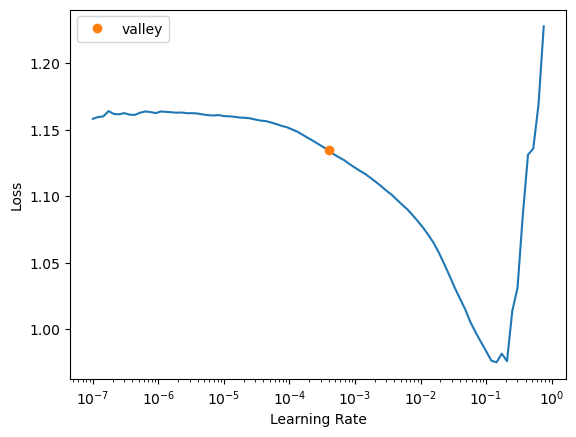

In [95]:
learn.lr_find()

In [96]:
learn.fit_one_cycle(65,0.0266, pct_start= 0.69, div_final=6e5, div=0.1356)

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,2.046809,5.253893,0.531609,0.333729,0.333729,0.235721,0.246472,00:00
1,1.511253,4.226535,0.261325,0.405699,0.405699,0.310815,0.216723,00:00
2,1.254591,1.140764,0.517072,0.326904,0.326904,0.326503,0.320403,00:00
3,1.086143,0.647405,0.697093,0.332849,0.332849,0.232600,0.273838,00:00
4,0.973972,0.669859,0.693374,0.332600,0.332600,0.314448,0.277979,00:00
5,0.892737,0.632685,0.698107,0.333333,0.333333,0.232702,0.274073,00:00
6,0.834636,0.630765,0.698107,0.333333,0.333333,0.232702,0.274073,00:00
7,0.790047,0.655808,0.697093,0.332849,0.332849,0.232600,0.273838,00:00
8,0.759082,0.637910,0.697093,0.332849,0.332849,0.232600,0.273838,00:00
9,0.732811,0.626304,0.698107,0.333878,0.333878,0.399481,0.275900,00:00


In [97]:
learn.save('learner_internet_smartphone')

Path('models/learner_internet_smartphone.pth')

In [98]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [99]:
y_predrn = np.array([list(probs).index(max(probs))+1 for probs in preds])

In [100]:
eval_pred_clas(y_predrn,y_test)

(0.22958606650079166,
 0.2295860665007917,
 0.7006721707004449,
 0.34547601911532777)

### Con SVM

In [101]:
svm = SVC(C=1.0)

In [102]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

{'fit_time': array([22.74428535, 20.38556385, 20.74436736, 23.15278029, 21.17681551,
        22.58856606, 23.12471318, 21.33658886, 21.95827913, 21.18561888]),
 'score_time': array([3.85100245, 4.56074786, 3.80162811, 4.03086638, 3.98509169,
        4.3824203 , 4.09804511, 3.94022059, 3.94405222, 4.75878882]),
 'test_accuracy': array([0.6978709 , 0.6978709 , 0.6978709 , 0.69810683, 0.69810683,
        0.69810683, 0.69810683, 0.69776876, 0.69776876, 0.69810683]),
 'test_recall_weighted': array([0.6978709 , 0.6978709 , 0.6978709 , 0.69810683, 0.69810683,
        0.69810683, 0.69810683, 0.69776876, 0.69776876, 0.69810683]),
 'test_precision_weighted': array([0.4870238 , 0.4870238 , 0.4870238 , 0.48735314, 0.48735314,
        0.48735314, 0.48735314, 0.48688125, 0.48688125, 0.48735314]),
 'test_f1_weighted': array([0.57368766, 0.57368766, 0.57368766, 0.57399586, 0.57399586,
        0.57399586, 0.57399586, 0.57355425, 0.57355425, 0.57399586])}

In [103]:
eval_cv_clas(svm_cv)

(0.6979684377042936,
 0.6979684377042936,
 0.48715996043540705,
 0.5738150795868312)

In [104]:
svm.fit(X_train,y_train)

SVC()

In [105]:
y_test_pred = svm.predict(X_test)

In [106]:
eval_pred_clas(y_test,y_test_pred)

(0.7005202442886225,
 0.7005202442886225,
 0.49072861265819134,
 0.5771511563080244)

### Con N-vecinos

In [107]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [108]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.00398684, 0.00597692, 0.00598335, 0.00498366, 0.00498319,
        0.00597978, 0.00797582, 0.00498748, 0.00498319, 0.00797319]),
 'score_time': array([1.11423445, 1.14980268, 1.14232564, 1.04657817, 1.1754179 ,
        1.05531788, 1.08892846, 1.07153106, 1.18286252, 1.5809927 ]),
 'test_accuracy': array([0.81716796, 0.80804326, 0.81615411, 0.8086545 , 0.81541582,
        0.82285328, 0.82386748, 0.80223124, 0.80493577, 0.81203516]),
 'test_recall_weighted': array([0.81716796, 0.80804326, 0.81615411, 0.8086545 , 0.81541582,
        0.82285328, 0.82386748, 0.80223124, 0.80493577, 0.81203516]),
 'test_precision_weighted': array([0.81068628, 0.80235651, 0.80967563, 0.80123015, 0.81053851,
        0.81416097, 0.81865377, 0.79616866, 0.7982573 , 0.8047776 ]),
 'test_f1_weighted': array([0.81352591, 0.80477096, 0.81263085, 0.80414338, 0.81148488,
        0.81742521, 0.82066316, 0.79910024, 0.80053974, 0.80787759])}

In [109]:
eval_cv_clas(nc_cv)

(0.813135856479847, 0.813135856479847, 0.8066505374821544, 0.8092161904527087)

In [110]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [111]:
y_test_prednn = nc.predict(X_test)

In [112]:
eval_pred_clas(y_test,y_test_prednn)

(0.8224383623614567,
 0.8224383623614567,
 0.8155097565121856,
 0.8183865150462261)

### Random Forest

In [113]:
rf = RandomForestClassifier(random_state=18)

In [114]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([1.90941024, 1.87380934, 1.85791135, 1.90375829, 1.96565652,
        1.91764188, 2.88332033, 1.89055324, 1.97159219, 1.90861249]),
 'score_time': array([0.08172679, 0.0847652 , 0.08970356, 0.08371997, 0.08372045,
        0.08073258, 0.08372021, 0.08272338, 0.07873678, 0.0847168 ]),
 'test_accuracy': array([0.76106793, 0.7556607 , 0.75228118, 0.75625423, 0.75118323,
        0.75625423, 0.77112914, 0.75524003, 0.75422583, 0.74983097]),
 'test_recall_weighted': array([0.76106793, 0.7556607 , 0.75228118, 0.75625423, 0.75118323,
        0.75625423, 0.77112914, 0.75524003, 0.75422583, 0.74983097]),
 'test_precision_weighted': array([0.74454508, 0.73830491, 0.73433299, 0.73803308, 0.73298998,
        0.73838991, 0.7566215 , 0.73704578, 0.73554762, 0.73149128]),
 'test_f1_weighted': array([0.74463939, 0.73864726, 0.73449713, 0.73694227, 0.73476356,
        0.73885169, 0.75628244, 0.73710552, 0.73460121, 0.7319007 ])}

In [115]:
eval_cv_clas(rf_cv)

(0.7563127447667137,
 0.7563127447667137,
 0.7387302134670838,
 0.7388231178670219)

In [116]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [117]:
y_test_predrf = rf.predict(X_test)

In [118]:
eval_pred_clas(y_test, y_test_predrf)

(0.7715448993440398,
 0.7715448993440398,
 0.7571409462119463,
 0.7541088750732374)

### Ensamble

#### Votacion

In [119]:
vot = VotingClassifier(
    estimators=[('svm', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [120]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

{'fit_time': array([23.16762161, 22.14144778, 28.41963983, 25.43216109, 24.59266758,
        23.85330868, 22.39449358, 22.87255859, 22.6471405 , 23.29884577]),
 'score_time': array([5.59461808, 5.09410477, 5.09786248, 4.84292579, 5.67246914,
        4.77897739, 5.73800445, 5.33894038, 4.88767982, 4.9055903 ]),
 'test_accuracy': array([0.79215951, 0.78303481, 0.77897938, 0.775524  , 0.78668019,
        0.78634212, 0.79648411, 0.77924273, 0.7795808 , 0.77721433]),
 'test_recall_weighted': array([0.79215951, 0.78303481, 0.77897938, 0.775524  , 0.78668019,
        0.78634212, 0.79648411, 0.77924273, 0.7795808 , 0.77721433]),
 'test_precision_weighted': array([0.79663187, 0.78238979, 0.77808354, 0.77816992, 0.78972349,
        0.79184521, 0.80092361, 0.78047294, 0.78346378, 0.77819483]),
 'test_f1_weighted': array([0.76303615, 0.75413325, 0.74747815, 0.74035499, 0.75629192,
        0.75451339, 0.76994626, 0.74635376, 0.74558577, 0.74388658])}

In [121]:
eval_cv_clas(vot_cv)

(0.7835241996718278,
 0.7835241996718278,
 0.7859898977311784,
 0.7521580215581567)

In [122]:
vot.fit(X_train, y_train)

VotingClassifier(estimators=[('svm', SVC()),
                             ('rf', RandomForestClassifier(random_state=18)),
                             ('nc',
                              KNeighborsClassifier(n_neighbors=6,
                                                   weights='distance'))])

In [123]:
y_test_predvot = vot.predict(X_test)

In [124]:
eval_pred_clas(y_test, y_test_predvot)

(0.7923546708889392,
 0.7923546708889392,
 0.7967042197374585,
 0.7630231159020969)

#### Bagging

In [125]:
bag = BaggingClassifier(
    base_estimator=clone(nc)
)

In [126]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([0.11062598, 0.11762595, 0.07873702, 0.07574701, 0.08970118,
        0.08671045, 0.08073044, 0.0837636 , 0.10663891, 0.09472942]),
 'score_time': array([12.54819655, 13.36595416, 12.57128429, 12.42628813, 13.19915485,
        13.03078866, 11.86098313, 11.6938796 , 11.91712928, 12.00802612]),
 'test_accuracy': array([0.81412639, 0.80804326, 0.81108483, 0.80730223, 0.81102096,
        0.81643002, 0.81845842, 0.80223124, 0.80527383, 0.81203516]),
 'test_recall_weighted': array([0.81412639, 0.80804326, 0.81108483, 0.80730223, 0.81102096,
        0.81643002, 0.81845842, 0.80223124, 0.80527383, 0.81203516]),
 'test_precision_weighted': array([0.80612855, 0.8001966 , 0.80458139, 0.79884169, 0.80368988,
        0.807557  , 0.8111251 , 0.79465407, 0.79862986, 0.80426509]),
 'test_f1_weighted': array([0.80971827, 0.80340079, 0.80756231, 0.80182622, 0.80692339,
        0.81070138, 0.81385953, 0.79819027, 0.79965425, 0.80720008])}

In [127]:
eval_cv_clas(bag_cv)

(0.8106006337228578, 0.8106006337228578, 0.8029669248484967, 0.805903649518133)

In [128]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6,
                                                      weights='distance'))

In [129]:
y_test_predbag = bag.predict(X_test)

In [130]:
eval_pred_clas(y_test_predbag, y_test)

(0.8240217145442208,
 0.8240217145442208,
 0.8344404551187914,
 0.8286096418779437)

#### Boost

In [131]:
boost = AdaBoostClassifier(clone(rf)
)

In [132]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([122.30063343, 122.26055932, 120.30655694, 121.570503  ,
        122.20681477, 130.64160156, 115.95378613, 120.41714263,
        123.64132357, 619.72118258]),
 'score_time': array([4.49764752, 4.36585426, 4.20062971, 3.71772146, 3.75959921,
        3.61004019, 3.68341923, 3.79651022, 3.8563168 , 4.90717912]),
 'test_accuracy': array([0.74991551, 0.74349442, 0.73741129, 0.7464503 , 0.73529412,
        0.74543611, 0.75828262, 0.74137931, 0.74475997, 0.73495605]),
 'test_recall_weighted': array([0.74991551, 0.74349442, 0.73741129, 0.7464503 , 0.73529412,
        0.74543611, 0.75828262, 0.74137931, 0.74475997, 0.73495605]),
 'test_precision_weighted': array([0.73079698, 0.72294459, 0.71454371, 0.7263336 , 0.71275265,
        0.72505513, 0.74172428, 0.71978722, 0.72382315, 0.71247792]),
 'test_f1_weighted': array([0.72917418, 0.7205001 , 0.71153622, 0.72026447, 0.71366643,
        0.72116384, 0.73926366, 0.71674144, 0.71889198, 0.71104317])}

In [133]:
eval_cv_clas(boost_cv)

(0.7437379708849431, 0.7437379708849431, 0.723023922910484, 0.7202245476588981)

In [134]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [135]:
y_test_predboost = boost.predict(X_test)

In [137]:
eval_pred_clas(y_test_predboost,y_test)

(0.7563899570232979,
 0.7563899570232979,
 0.8261505272757101,
 0.7800823940992555)

# Conexión por BAM


### Con RN

In [138]:
# Definicion de variables
cat_names = [col for col in columnas if columnas[col]=='O']
cont_names = [col for col in columnas if columnas[col]!='O']

In [139]:
y_names = ["P4_7_3"]

In [140]:
# Filtrado de datos, solo aquellos que tengan internet
train_df = endutih21[(endutih21.internet==1)][cat_names+cont_names+y_names]
train_df

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,loc,piso,agua,drenaje,electricidad,refri,lavadora,auto,res,P4_7_3
0,101072,1,0,0,1,1,1,0,1,2,...,1,3,1,1,1,1,1,1,3,0.0
1,101072,1,0,0,1,0,1,1,0,2,...,1,2,1,1,1,1,1,0,3,0.0
2,101080,1,1,1,1,1,1,1,1,2,...,1,2,1,1,1,1,1,0,4,0.0
3,101080,1,1,0,1,1,1,0,0,2,...,1,3,1,1,1,1,1,1,6,2.0
6,101080,1,1,1,1,0,1,1,0,2,...,1,3,1,1,1,1,1,0,9,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58148,3260770,0,1,0,1,0,1,0,0,2,...,4,3,1,1,1,1,1,1,7,0.0
58149,3260770,0,0,0,1,1,1,1,0,2,...,4,3,1,1,1,1,1,0,3,0.0
58150,3260770,0,0,0,1,0,1,0,0,2,...,4,2,1,1,1,1,1,0,3,2.0
58151,3260770,1,1,0,1,1,1,0,0,2,...,4,2,1,1,1,1,1,1,4,0.0


In [141]:
train_df[y_names].value_counts()

P4_7_3
0.0       23745
2.0        9952
1.0         307
dtype: int64

In [142]:
y = np.array(train_df[y_names]).ravel()
X = np.array(train_df.drop(y_names,axis=1)).astype('float')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.13, random_state=18)

In [143]:
train_df = pd.DataFrame(data=X_train, columns=train_df.drop(y_names, axis=1).columns)
train_df[y_names[0]] = y_train
train_df[y_names[0]] = train_df[y_names[0]].astype("category")

In [144]:
train_df[y_names].value_counts()

P4_7_3
0.0       20648
2.0        8672
1.0         263
dtype: int64

In [145]:
dls = ft.TabularDataLoaders.from_df(train_df,
                       procs=[ft.Categorify, ft.FillMissing],
                       cat_names = cat_names,
                       cont_names = cont_names,
                       y_names = y_names,
                       val_shuffle =True,
                       shuffle=True,
                       bs=2048,
                       device="cpu"
                       )

In [146]:
study = optuna.create_study()
study.optimize(objective_clas, 13)

[I 2023-02-27 12:55:26,155] A new study created in memory with name: no-name-b9042ee0-f61b-4096-a223-d1b2904f2f9d


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.931836,0.963879,0.677823,0.677823,0.586662,0.594544,00:00
1,0.801600,0.745312,0.674442,0.674442,0.604702,0.613833,00:00
2,0.734938,0.678037,0.684753,0.684753,0.624839,0.626999,00:00
3,0.697242,0.651285,0.684584,0.684584,0.622815,0.625398,00:00
4,0.672934,0.643138,0.692867,0.692867,0.632315,0.620836,00:00
5,0.656776,0.635436,0.697600,0.697600,0.636388,0.598995,00:00
6,0.645188,0.641257,0.697938,0.697938,0.638193,0.603419,00:00
7,0.635726,0.638690,0.694726,0.694726,0.623587,0.598358,00:00
8,0.628152,0.632977,0.697769,0.697769,0.639926,0.613409,00:00
9,0.621741,0.637012,0.692698,0.692698,0.627963,0.615783,00:00


[I 2023-02-27 12:57:44,574] Trial 0 finished with value: 0.3549695611000061 and parameters: {'n_layers': 5, 'n_neuronas_layer0': 90, 'n_neuronas_layer1': 117, 'n_neuronas_layer2': 181, 'n_neuronas_layer3': 255, 'n_neuronas_layer4': 32, 'bn_final': True, 'embed_p': 0.7411419992209861, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 191, 'lr': 0.026336872342645545, 'pct_start': 0.49663996693555634, 'div_final': 408700, 'div': 0.3898021271518772}. Best is trial 0 with value: 0.3549695611000061.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.213275,1.089465,0.341278,0.341278,0.611048,0.430062,00:00
1,1.136119,1.069446,0.465348,0.465348,0.630967,0.526752,00:00
2,1.100455,1.049387,0.529074,0.529074,0.641405,0.567752,00:00
3,1.076721,1.030656,0.566261,0.566261,0.643157,0.591426,00:00
4,1.057078,1.012493,0.587728,0.587728,0.642097,0.604219,00:00
5,1.038798,0.994517,0.597363,0.597363,0.637462,0.609755,00:00
6,1.021253,0.966102,0.622211,0.622211,0.641583,0.629106,00:00
7,1.003983,0.950998,0.625761,0.625761,0.639940,0.631047,00:00
8,0.986684,0.934339,0.643678,0.643678,0.642357,0.642883,00:00
9,0.969191,0.919337,0.648918,0.648918,0.639506,0.644140,00:00


[I 2023-02-27 12:59:31,010] Trial 1 finished with value: 0.3630831837654114 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 177, 'n_neuronas_layer1': 240, 'bn_final': True, 'embed_p': 0.047606642498013926, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 222, 'lr': 0.010187548896533607, 'pct_start': 0.0799050548963695, 'div_final': 839366, 'div': 0.9989526475283365}. Best is trial 0 with value: 0.3549695611000061.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.820554,0.877540,0.599222,0.599222,0.599737,0.599334,00:00
1,0.740349,0.689568,0.660581,0.660581,0.605118,0.619579,00:00
2,0.703046,0.659863,0.671569,0.671569,0.589081,0.600417,00:00
3,0.682849,0.640105,0.697769,0.697769,0.486881,0.573554,00:00
4,0.667864,0.640191,0.697431,0.697431,0.618595,0.576175,00:00
5,0.658339,0.644074,0.697431,0.697431,0.559837,0.573703,00:00
6,0.650139,0.634087,0.697938,0.697938,0.636649,0.586981,00:00
7,0.643364,0.627717,0.697769,0.697769,0.633828,0.579963,00:00
8,0.637581,0.628123,0.697431,0.697431,0.631363,0.585867,00:00
9,0.632461,0.627364,0.697093,0.697093,0.627196,0.584555,00:00


[I 2023-02-27 13:00:10,279] Trial 2 finished with value: 0.2814401388168335 and parameters: {'n_layers': 3, 'n_neuronas_layer0': 165, 'n_neuronas_layer1': 150, 'n_neuronas_layer2': 46, 'bn_final': False, 'embed_p': 0.2703467126911622, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 77, 'lr': 0.08755973329783011, 'pct_start': 0.8436574224049322, 'div_final': 680106, 'div': 0.9615282346955762}. Best is trial 2 with value: 0.2814401388168335.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.298907,0.784434,0.697600,0.697600,0.584199,0.573785,00:00
1,1.008501,0.718751,0.697600,0.697600,0.624594,0.575952,00:00
2,0.874652,0.658324,0.692191,0.692191,0.602084,0.587407,00:00
3,0.799625,0.655823,0.697938,0.697938,0.637202,0.580643,00:00
4,0.754466,0.666219,0.679682,0.679682,0.605804,0.609398,00:00
5,0.724667,0.640662,0.699966,0.699966,0.655136,0.591135,00:00
6,0.701349,0.637679,0.697600,0.697600,0.636764,0.600300,00:00
7,0.683781,0.642743,0.698276,0.698276,0.639921,0.600886,00:00
8,0.671387,0.636733,0.692698,0.692698,0.621024,0.602602,00:00
9,0.661445,0.653140,0.697600,0.697600,0.486846,0.573472,00:00


[I 2023-02-27 13:00:51,802] Trial 3 finished with value: 0.28262341022491455 and parameters: {'n_layers': 1, 'n_neuronas_layer0': 193, 'bn_final': False, 'embed_p': 0.37827021634608243, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 134, 'lr': 0.0399026405380732, 'pct_start': 0.756477630973092, 'div_final': 946230, 'div': 0.6200997522621174}. Best is trial 2 with value: 0.2814401388168335.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.030210,0.900842,0.697769,0.697769,0.486881,0.573554,00:00
1,0.887453,0.734363,0.696924,0.696924,0.584243,0.574696,00:00
2,0.786505,0.714844,0.679851,0.679851,0.612362,0.615633,00:00
3,0.734856,0.691303,0.697600,0.697600,0.683229,0.575166,00:00
4,0.702649,0.674570,0.656356,0.656356,0.608427,0.621734,00:00
5,0.680190,0.655527,0.682556,0.682556,0.621505,0.624149,00:00
6,0.663009,0.671050,0.684584,0.684584,0.636073,0.640392,00:00
7,0.649570,0.658407,0.693881,0.693881,0.635370,0.623874,00:00
8,0.638362,0.650032,0.690500,0.690500,0.621902,0.610948,00:00
9,0.630122,0.648425,0.689148,0.689148,0.628454,0.623759,00:00


[I 2023-02-27 13:01:29,245] Trial 4 finished with value: 0.33722108602523804 and parameters: {'n_layers': 7, 'n_neuronas_layer0': 47, 'n_neuronas_layer1': 226, 'n_neuronas_layer2': 39, 'n_neuronas_layer3': 36, 'n_neuronas_layer4': 163, 'n_neuronas_layer5': 139, 'n_neuronas_layer6': 105, 'bn_final': False, 'embed_p': 0.04260661809747038, 'idx_act_cls': 0, 'idx_opt_func': 0, 'epoch': 52, 'lr': 0.0821518030890349, 'pct_start': 0.6796524450769368, 'div_final': 705486, 'div': 0.8536726157814705}. Best is trial 2 with value: 0.2814401388168335.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.072497,0.903622,0.697262,0.697262,0.617079,0.577005,00:00
1,0.925787,0.681549,0.697431,0.697431,0.622953,0.577392,00:00
2,0.809728,0.655727,0.667343,0.667343,0.608537,0.621168,00:00
3,0.749518,0.651021,0.691346,0.691346,0.621977,0.605989,00:00
4,0.714897,0.662406,0.688472,0.688472,0.597836,0.592517,00:00
5,0.691671,0.632380,0.698614,0.698614,0.665406,0.578288,00:00
6,0.674353,0.653519,0.665991,0.665991,0.620270,0.632303,00:00
7,0.662186,0.644187,0.697600,0.697600,0.638566,0.607947,00:00
8,0.653274,0.654228,0.685260,0.685260,0.623876,0.623282,00:00
9,0.647171,0.637897,0.691684,0.691684,0.630089,0.619755,00:00


[I 2023-02-27 13:03:16,228] Trial 5 finished with value: 0.33062881231307983 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 70, 'n_neuronas_layer1': 192, 'bn_final': False, 'embed_p': 0.23777524521066828, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 233, 'lr': 0.024707632006436855, 'pct_start': 0.27352423306833124, 'div_final': 729609, 'div': 0.33715551199166105}. Best is trial 2 with value: 0.2814401388168335.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.103386,0.937512,0.690162,0.690162,0.605747,0.587032,00:00
1,0.988862,0.808022,0.694557,0.694557,0.622054,0.593363,00:00
2,0.885041,0.702018,0.695402,0.695402,0.606139,0.581378,00:00
3,0.806682,0.655230,0.696755,0.696755,0.633110,0.600486,00:00
4,0.749497,0.638311,0.686105,0.686105,0.628068,0.630653,00:00
5,0.711631,0.631878,0.695402,0.695402,0.623784,0.596850,00:00
6,0.684349,0.637061,0.694557,0.694557,0.627647,0.605612,00:00
7,0.663120,0.634715,0.694050,0.694050,0.628336,0.611027,00:00
8,0.647367,0.636449,0.697093,0.697093,0.632549,0.601647,00:00
9,0.634289,0.634889,0.695402,0.695402,0.628421,0.604920,00:00


[I 2023-02-27 13:04:18,796] Trial 6 finished with value: 0.3495604991912842 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 181, 'n_neuronas_layer1': 236, 'bn_final': False, 'embed_p': 0.3122838272490536, 'idx_act_cls': 0, 'idx_opt_func': 1, 'epoch': 138, 'lr': 0.0016560440589550032, 'pct_start': 0.8238713123803169, 'div_final': 491209, 'div': 0.42584642099729264}. Best is trial 2 with value: 0.2814401388168335.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.075940,1.140905,0.368830,0.368830,0.603366,0.320575,00:01
1,1.036361,0.992748,0.556626,0.556626,0.638148,0.573019,00:01
2,1.008014,0.958963,0.595504,0.595504,0.631506,0.606966,00:01
3,0.987501,0.950647,0.602434,0.602434,0.633931,0.612794,00:01
4,0.972425,0.943929,0.626437,0.626437,0.636358,0.630245,00:01
5,0.960330,0.935168,0.633198,0.633198,0.643994,0.637248,00:01
6,0.950193,0.928593,0.629141,0.629141,0.629687,0.629208,00:01
7,0.940748,0.923133,0.635226,0.635227,0.631287,0.633221,00:01
8,0.931624,0.914405,0.648242,0.648242,0.637538,0.642761,00:01
9,0.922786,0.904127,0.642326,0.642326,0.634254,0.638254,00:01


[I 2023-02-27 13:05:48,320] Trial 7 finished with value: 0.33096688985824585 and parameters: {'n_layers': 11, 'n_neuronas_layer0': 192, 'n_neuronas_layer1': 76, 'n_neuronas_layer2': 180, 'n_neuronas_layer3': 102, 'n_neuronas_layer4': 116, 'n_neuronas_layer5': 170, 'n_neuronas_layer6': 44, 'n_neuronas_layer7': 221, 'n_neuronas_layer8': 238, 'n_neuronas_layer9': 249, 'n_neuronas_layer10': 178, 'bn_final': True, 'embed_p': 0.8132563124131111, 'idx_act_cls': 2, 'idx_opt_func': 0, 'epoch': 62, 'lr': 0.005310970073569377, 'pct_start': 0.06878118312258048, 'div_final': 412001, 'div': 0.08755506880486669}. Best is trial 2 with value: 0.2814401388168335.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.972181,16.244762,0.697769,0.697769,0.486881,0.573554,00:00
1,0.825665,7.439055,0.683908,0.683908,0.601436,0.571431,00:00
2,0.818912,1.524842,0.517918,0.517918,0.622801,0.563207,00:00
3,0.794099,0.727956,0.674611,0.674611,0.615458,0.623786,00:00
4,0.743958,0.649009,0.676640,0.676640,0.620772,0.629004,00:00
5,0.711150,0.643210,0.674442,0.674442,0.635543,0.646726,00:00
6,0.687681,0.637673,0.680696,0.680696,0.631182,0.639064,00:00
7,0.668360,0.643894,0.700135,0.700135,0.675719,0.584424,00:00
8,0.655077,0.639460,0.693374,0.693374,0.627625,0.610178,00:00
9,0.643910,0.632091,0.701657,0.701657,0.652344,0.630568,00:00


[I 2023-02-27 13:08:53,135] Trial 8 finished with value: 0.3336713910102844 and parameters: {'n_layers': 6, 'n_neuronas_layer0': 252, 'n_neuronas_layer1': 193, 'n_neuronas_layer2': 129, 'n_neuronas_layer3': 215, 'n_neuronas_layer4': 56, 'n_neuronas_layer5': 219, 'bn_final': False, 'embed_p': 0.43083449117880973, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 205, 'lr': 0.08391343107469863, 'pct_start': 0.6203083428060713, 'div_final': 892942, 'div': 0.2552296222919296}. Best is trial 2 with value: 0.2814401388168335.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.053143,0.933778,0.668864,0.668864,0.588158,0.591876,00:00
1,0.979073,0.846422,0.685598,0.685598,0.620629,0.619924,00:00
2,0.914113,0.784900,0.681204,0.681204,0.628376,0.635884,00:00
3,0.856427,0.727951,0.685936,0.685936,0.626774,0.628144,00:00
4,0.806533,0.688770,0.695571,0.695571,0.635269,0.616262,00:00
5,0.766032,0.664534,0.696586,0.696586,0.635342,0.608409,00:00
6,0.733160,0.647801,0.687796,0.687796,0.626090,0.624587,00:00
7,0.707411,0.641769,0.691346,0.691346,0.628229,0.618098,00:00
8,0.686271,0.639638,0.695064,0.695064,0.638146,0.625135,00:00
9,0.669378,0.637711,0.695909,0.695909,0.636675,0.619405,00:00


[I 2023-02-27 13:10:06,670] Trial 9 finished with value: 0.3270791172981262 and parameters: {'n_layers': 2, 'n_neuronas_layer0': 215, 'n_neuronas_layer1': 219, 'bn_final': True, 'embed_p': 0.9372226037941429, 'idx_act_cls': 1, 'idx_opt_func': 0, 'epoch': 129, 'lr': 0.0399605093731965, 'pct_start': 0.3369834046823443, 'div_final': 883247, 'div': 0.30784953982707675}. Best is trial 2 with value: 0.2814401388168335.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,1.257211,99.106003,0.287187,0.287187,0.596970,0.197829,00:01
1,1.021844,6.333167,0.510311,0.510311,0.595933,0.528517,00:01
2,0.903620,1.288340,0.538371,0.538371,0.577852,0.552212,00:01
3,0.834737,0.908968,0.662948,0.662948,0.576611,0.594278,00:01
4,0.787702,0.794074,0.678499,0.678499,0.580737,0.588534,00:01
5,0.755272,0.667744,0.692022,0.692022,0.568787,0.577713,00:01
6,0.730530,0.668144,0.697262,0.697262,0.607304,0.575478,00:01
7,0.712219,0.661565,0.694557,0.694557,0.580633,0.577144,00:01
8,0.698921,0.667439,0.698276,0.698276,0.695736,0.575360,00:01
9,0.688264,0.658145,0.697600,0.697600,0.630781,0.580470,00:01


[I 2023-02-27 13:10:46,562] Trial 10 finished with value: 0.3032454252243042 and parameters: {'n_layers': 12, 'n_neuronas_layer0': 128, 'n_neuronas_layer1': 32, 'n_neuronas_layer2': 35, 'n_neuronas_layer3': 154, 'n_neuronas_layer4': 255, 'n_neuronas_layer5': 33, 'n_neuronas_layer6': 252, 'n_neuronas_layer7': 32, 'n_neuronas_layer8': 34, 'n_neuronas_layer9': 32, 'n_neuronas_layer10': 53, 'n_neuronas_layer11': 63, 'bn_final': False, 'embed_p': 0.5821282189400573, 'idx_act_cls': 2, 'idx_opt_func': 1, 'epoch': 27, 'lr': 0.09735030425889858, 'pct_start': 0.8893873489924102, 'div_final': 136594, 'div': 0.6592586574985215}. Best is trial 2 with value: 0.2814401388168335.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.814752,1.081011,0.639452,0.639452,0.598423,0.613564,00:00
1,0.749109,0.771573,0.670216,0.670216,0.606298,0.618074,00:00
2,0.709454,0.671083,0.696078,0.696078,0.624226,0.588859,00:00
3,0.685211,0.657474,0.696586,0.696586,0.607144,0.577871,00:00
4,0.667237,0.639295,0.695909,0.695909,0.624966,0.592382,00:00
5,0.654711,0.649170,0.675118,0.675118,0.629032,0.639471,00:00
6,0.646417,0.637298,0.696924,0.696924,0.634866,0.606632,00:00
7,0.639288,0.631311,0.695571,0.695571,0.626719,0.597317,00:00
8,0.633442,0.636374,0.697262,0.697262,0.634285,0.597284,00:00
9,0.628921,0.630294,0.695064,0.695064,0.630030,0.606567,00:00


[I 2023-02-27 13:11:50,040] Trial 11 finished with value: 0.32065582275390625 and parameters: {'n_layers': 4, 'n_neuronas_layer0': 136, 'n_neuronas_layer1': 142, 'n_neuronas_layer2': 108, 'n_neuronas_layer3': 32, 'bn_final': False, 'embed_p': 0.4865729519930746, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 111, 'lr': 0.061388611318171485, 'pct_start': 0.7476777119027803, 'div_final': 639057, 'div': 0.6405625974290052}. Best is trial 2 with value: 0.2814401388168335.


epoch,train_loss,valid_loss,accuracy,recall_score,precision_score,f1_score,time
0,0.998024,22.386209,0.697431,0.697431,0.559837,0.573703,00:01
1,0.833278,1.388447,0.655172,0.655172,0.572508,0.569738,00:01
2,0.764735,0.892825,0.693543,0.693543,0.487393,0.572475,00:01
3,0.723272,0.708381,0.680696,0.680696,0.610185,0.612614,00:01
4,0.694909,0.658858,0.697769,0.697769,0.632888,0.573867,00:01
5,0.676249,0.634058,0.698276,0.698276,0.640600,0.611557,00:01
6,0.661858,0.634661,0.689148,0.689148,0.631688,0.629399,00:01
7,0.650504,0.643533,0.698276,0.698276,0.641636,0.583454,00:01
8,0.641511,0.626278,0.701318,0.701318,0.651756,0.629743,00:01
9,0.634274,0.628442,0.698952,0.698952,0.641788,0.597576,00:01


[I 2023-02-27 13:13:46,546] Trial 12 finished with value: 0.2898918390274048 and parameters: {'n_layers': 9, 'n_neuronas_layer0': 221, 'n_neuronas_layer1': 97, 'n_neuronas_layer2': 253, 'n_neuronas_layer3': 144, 'n_neuronas_layer4': 251, 'n_neuronas_layer5': 34, 'n_neuronas_layer6': 249, 'n_neuronas_layer7': 91, 'n_neuronas_layer8': 106, 'bn_final': False, 'embed_p': 0.3024460003518825, 'idx_act_cls': 1, 'idx_opt_func': 1, 'epoch': 94, 'lr': 0.05526674424551923, 'pct_start': 0.8940943941715624, 'div_final': 993648, 'div': 0.7492510784627661}. Best is trial 2 with value: 0.2814401388168335.


In [149]:
study.best_value

0.2814401388168335

In [150]:
study.best_params

{'n_layers': 3,
 'n_neuronas_layer0': 165,
 'n_neuronas_layer1': 150,
 'n_neuronas_layer2': 46,
 'bn_final': False,
 'embed_p': 0.2703467126911622,
 'idx_act_cls': 1,
 'idx_opt_func': 1,
 'epoch': 77,
 'lr': 0.08755973329783011,
 'pct_start': 0.8436574224049322,
 'div_final': 680106,
 'div': 0.9615282346955762}

In [151]:
learn = ft.tabular_learner(dls,
                           layers = [165, 150, 46],
                           loss_func = ft.CrossEntropyLossFlat(),
                           config = ft.tabular_config(act_cls=nn.ReLU(inplace=True), bn_final=False, embed_p=0.3434),
                           opt_func=ft.Adam,
                           metrics=[ft.accuracy, ft.Recall(average="macro"), ft.Recall(average="macro"), ft.Precision(average="macro"), ft.F1Score(average="macro")])

SuggestedLRs(valley=0.0014454397605732083)

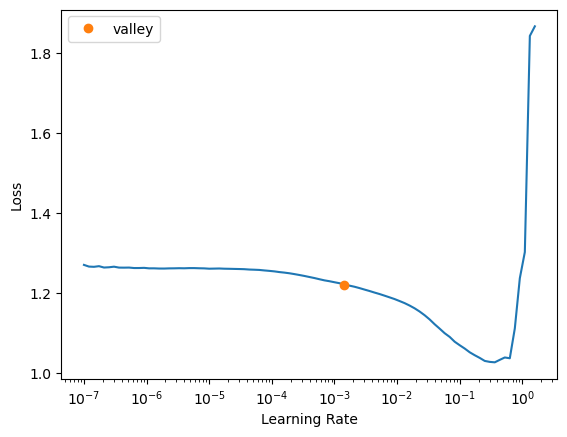

In [152]:
learn.lr_find()

In [153]:
learn.fit_one_cycle(77,0.0875, pct_start= 0.2687, div_final=68e4, div=0.9615)

epoch,train_loss,valid_loss,accuracy,recall_score,recall_score,precision_score,f1_score,time
0,0.906975,1.443601,0.689148,0.335839,0.335839,0.348140,0.292036,00:00
1,0.784194,0.874682,0.662610,0.341460,0.341460,0.346522,0.324721,00:00
2,0.732044,0.699557,0.691007,0.334594,0.334594,0.342174,0.286410,00:00
3,0.703283,0.663705,0.685260,0.338697,0.338697,0.354422,0.303441,00:00
4,0.685514,0.646301,0.686444,0.347232,0.347232,0.372659,0.322801,00:00
5,0.673088,0.643190,0.694557,0.335392,0.335392,0.361499,0.284651,00:00
6,0.663749,0.636322,0.696247,0.335413,0.335413,0.374240,0.282675,00:00
7,0.655479,0.639922,0.695571,0.340591,0.340591,0.386361,0.298733,00:00
8,0.648888,0.637144,0.689824,0.349858,0.349858,0.383577,0.326341,00:00
9,0.643639,0.639012,0.695571,0.339244,0.339244,0.383576,0.294927,00:00


In [155]:
learn.save('learner_internet_bam')

Path('models/learner_internet_bam.pth')

In [156]:
dl = learn.dls.test_dl(pd.DataFrame(data=X_test, columns=train_df.drop(y_names,axis=1).columns), bs=2048) # apply transforms
preds,  y = learn.get_preds(dl=dl) # get prediction

In [157]:
y_predrn = np.array([list(probs).index(max(probs))+1 for probs in preds])

In [158]:
eval_pred_clas(y_predrn,y_test)

(0.0081429540827867,
 0.0081429540827867,
 0.5504385705619873,
 0.014303887298735817)

### Con SVM

In [159]:
svm = SVC(C=1.0)

In [160]:
svm_cv = cross_validate(svm, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
svm_cv

{'fit_time': array([30.87051725, 29.22743225, 29.88687086, 27.80464053, 27.48563814,
        27.26087928, 28.15597606, 28.07838535, 29.32059097, 65.65391493]),
 'score_time': array([5.31329346, 5.15864396, 4.8627584 , 4.61561823, 4.39153314,
        4.44211364, 4.47888398, 4.51433945, 6.58575606, 4.26936412]),
 'test_accuracy': array([0.69753295, 0.69753295, 0.6978709 , 0.69810683, 0.69810683,
        0.69810683, 0.69810683, 0.69810683, 0.69810683, 0.69810683]),
 'test_recall_weighted': array([0.69753295, 0.69753295, 0.6978709 , 0.69810683, 0.69810683,
        0.69810683, 0.69810683, 0.69810683, 0.69810683, 0.69810683]),
 'test_precision_weighted': array([0.48655222, 0.48655222, 0.4870238 , 0.48735314, 0.48735314,
        0.48735314, 0.48735314, 0.48735314, 0.48735314, 0.48735314]),
 'test_f1_weighted': array([0.57324627, 0.57324627, 0.57368766, 0.57399586, 0.57399586,
        0.57399586, 0.57399586, 0.57399586, 0.57399586, 0.57399586])}

In [ ]:
eval_cv_clas(svm_cv)

In [ ]:
svm.fit(X_train,y_train)

In [ ]:
y_test_pred = svm.predict(X_test)

In [ ]:
eval_pred_clas(y_test,y_test_pred)

### Con N-vecinos

In [ ]:
nc = KNeighborsClassifier(n_neighbors=6, weights='distance')

In [ ]:
nc_cv = cross_validate(nc, X_train, y_train, cv=10,  scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
nc_cv

{'fit_time': array([0.01097059, 0.00797319, 0.00996637, 0.01091933, 0.00897026,
        0.00997925, 0.00797224, 0.00697017, 0.00697565, 0.00897884]),
 'score_time': array([1.36548877, 1.19010472, 1.30469966, 1.35345268, 1.13455367,
        1.11262989, 1.1793685 , 1.13845015, 1.11426067, 1.23792553]),
 'test_accuracy': array([0.81108483, 0.80770531, 0.81040892, 0.80594997, 0.80831643,
        0.81304936, 0.81845842, 0.79952671, 0.80121704, 0.80797836]),
 'test_recall_weighted': array([0.81108483, 0.80770531, 0.81040892, 0.80594997, 0.80831643,
        0.81304936, 0.81845842, 0.79952671, 0.80121704, 0.80797836]),
 'test_precision_weighted': array([0.80460956, 0.80156692, 0.80333822, 0.79779629, 0.80123446,
        0.80466928, 0.81238945, 0.793914  , 0.79327939, 0.8000241 ]),
 'test_f1_weighted': array([0.80727672, 0.80398731, 0.80642384, 0.80102107, 0.80389003,
        0.80727782, 0.81465463, 0.79658897, 0.7964082 , 0.80300014])}

In [ ]:
eval_cv_clas(nc_cv)

(0.80836953350055, 0.80836953350055, 0.8012821671938184, 0.8040528723782101)

In [ ]:
nc.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6, weights='distance')

In [ ]:
y_test_prednn = nc.predict(X_test)

In [ ]:
eval_pred_clas(y_test,y_test_prednn)

(0.818819271657996, 0.818819271657996, 0.8102963491715134, 0.8133914156230376)

### Random Forest

In [ ]:
rf = RandomForestClassifier(random_state=18)

In [ ]:
rf_cv = cross_validate(rf, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
rf_cv

{'fit_time': array([2.43508744, 2.55953836, 2.38896298, 2.28138947, 2.27142835,
        2.34496951, 2.50088215, 2.56740832, 2.60102582, 2.46713328]),
 'score_time': array([0.08869624, 0.09767318, 0.08770633, 0.08770704, 0.0886929 ,
        0.08628345, 0.08571315, 0.09268999, 0.08641148, 0.09417605]),
 'test_accuracy': array([0.75363298, 0.76005407, 0.75160527, 0.75591616, 0.74543611,
        0.75591616, 0.76741041, 0.7515213 , 0.74983097, 0.7505071 ]),
 'test_recall_weighted': array([0.75363298, 0.76005407, 0.75160527, 0.75591616, 0.74543611,
        0.75591616, 0.76741041, 0.7515213 , 0.74983097, 0.7505071 ]),
 'test_precision_weighted': array([0.73480818, 0.74181886, 0.73222131, 0.73661671, 0.72488785,
        0.73606307, 0.75145367, 0.73179762, 0.72917579, 0.72946386]),
 'test_f1_weighted': array([0.73537376, 0.74188382, 0.73032421, 0.73537105, 0.72733226,
        0.73562496, 0.75071041, 0.7314944 , 0.7291517 , 0.73095567])}

In [ ]:
eval_cv_clas(rf_cv)

(0.7541830529976845,
 0.7541830529976845,
 0.7348306914999537,
 0.7348222219174161)

In [ ]:
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=18)

In [ ]:
y_test_predrf = rf.predict(X_test)

In [ ]:
eval_pred_clas(y_test, y_test_predrf)

(0.7731282515268039,
 0.7731282515268039,
 0.7554291297387232,
 0.7549602628403984)

### Ensamble

#### Votacion

In [ ]:
vot = VotingClassifier(
    estimators=[('svm', clone(svm)), ('rf', clone(rf)), ('nc', clone(nc))]
)

In [ ]:
vot_cv = cross_validate(vot, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
vot_cv

In [ ]:
eval_cv_clas(vot_cv)

In [ ]:
vot.fit(X_train, y_train)

In [ ]:
y_test_predvot = vot.predict(X_test)

In [ ]:
eval_pred_clas(y_test, y_test_predvot)

#### Bagging

In [57]:
bag = BaggingClassifier(
    base_estimator=clone(nc)
)

In [58]:
bag_cv = cross_validate(bag, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
bag_cv

{'fit_time': array([0.12641525, 0.07777762, 0.06783819, 0.07726097, 0.07278728,
        0.10365343, 0.06719303, 0.08573651, 0.07991791, 0.13544393]),
 'score_time': array([13.25580382, 12.21453977, 13.36983204, 12.76091766, 12.49743176,
        12.80221677, 12.76291013, 13.17987967, 12.7550962 , 12.25584769]),
 'test_accuracy': array([0.62791484, 0.64954376, 0.64751605, 0.64976335, 0.65043949,
        0.66058147, 0.65280595, 0.6372549 , 0.64976335, 0.65348208]),
 'test_recall_weighted': array([0.62791484, 0.64954376, 0.64751605, 0.64976335, 0.65043949,
        0.66058147, 0.65280595, 0.6372549 , 0.64976335, 0.65348208]),
 'test_precision_weighted': array([0.62155219, 0.64505031, 0.64112385, 0.6416888 , 0.64333854,
        0.65547621, 0.65146794, 0.62794242, 0.64163699, 0.64677504]),
 'test_f1_weighted': array([0.62339585, 0.64632856, 0.64312834, 0.64387666, 0.64496957,
        0.65674117, 0.6480836 , 0.6300804 , 0.64360295, 0.64896594])}

In [59]:
eval_cv_clas(bag_cv)

(0.6479065255357133,
 0.6479065255357133,
 0.6416052291724275,
 0.6429173030772424)

In [60]:
bag.fit(X_train, y_train)

BaggingClassifier(base_estimator=KNeighborsClassifier(n_neighbors=6,
                                                      weights='distance'))

In [61]:
y_test_predbag = bag.predict(X_test)

In [62]:
eval_pred_clas(y_test_predbag, y_test)

(0.6460076905677449,
 0.6460076905677449,
 0.6600229796500918,
 0.6518313743635101)

#### Boost

In [63]:
boost = AdaBoostClassifier(clone(rf)
)

In [64]:
boost_cv = cross_validate(boost, X_train, y_train, cv=10, scoring=["accuracy","recall_weighted", "precision_weighted", "f1_weighted" ])
boost_cv

{'fit_time': array([118.93135786, 118.15870261, 110.62339449, 112.78181529,
        113.77061319, 113.36988735, 110.97217202, 106.56580544,
        107.75466943, 103.67400193]),
 'score_time': array([4.15437269, 3.54642701, 3.43080449, 4.27566361, 3.29282832,
        3.33829522, 4.02620792, 3.99398255, 4.16103435, 3.24729228]),
 'test_accuracy': array([0.63602568, 0.65630281, 0.64582629, 0.65652468, 0.63691684,
        0.65652468, 0.64401623, 0.64198783, 0.62914131, 0.63319811]),
 'test_recall_weighted': array([0.63602568, 0.65630281, 0.64582629, 0.65652468, 0.63691684,
        0.65652468, 0.64401623, 0.64198783, 0.62914131, 0.63319811]),
 'test_precision_weighted': array([0.63006029, 0.6527037 , 0.63855885, 0.64808693, 0.62721021,
        0.65454515, 0.64030689, 0.63557409, 0.62042423, 0.62703112]),
 'test_f1_weighted': array([0.62791445, 0.64911666, 0.63786903, 0.64707935, 0.62688082,
        0.65076195, 0.63822922, 0.63364171, 0.61958644, 0.62426064])}

In [65]:
eval_cv_clas(boost_cv)

(0.6436464450716017,
 0.6436464450716017,
 0.6374501437945483,
 0.6355340276305302)

In [66]:
boost.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=RandomForestClassifier(random_state=18))

In [67]:
y_test_predboost = boost.predict(X_test)

In [68]:
eval_pred_clas(y_test_predboost,y_test)

(0.6480434290884415, 0.6480434290884415, 0.668402448899094, 0.6561845261981701)

# Intento de imputación

In [ ]:
def Distancia(g: np.array, d: np.array, missing_values, beta:float=1) -> float:
    """
    PARAMETROS:
    - g: instancia de la ENIGH limitada a 21 elementos
    - d: instancia de la ENDUTIH limitada a 21 elementos
    - beta: peso a la igualdad en los atributos categoricos
    -------
    Calcula la distancia entre dos hogares a partir de 21 atributos compartidos
    REGRESA:
    La distancia entre dos hogares presentes en las dos encuestas
    """

    distance = 0

    for i in range(2,23):
        #Si el atributo es categorico simplemente revisamos si son iguales o no
        if type(d[i])==str:
            distance += beta*np.sum(d[i]==g[i])
        #De lo contrario regresamos el cuadrado de la diferencia
        else:
            distance += pow(g[i]-d[i],2)
    #Regresamos la distancia total
    return distance

In [ ]:
def Centro(I:np.array) -> np.array:
    """
    PARAMETROS:
    - I: matriz de instancias
    ----------
    Encuentra el centro de los puntos en m dimensiones
    REGRESA:
    Un arreglo con el centro de I
    """

    #Encontramos la cantidad de atributos
    m = I.shape[1]

    C = [0]*m

    for i in range(m):
        #Si el atributo es categorico, tomamos la moda
        if type(I[0,i])==str:
            C[i] = st.mode(I[:,i])[0][0]
        #Si es entero, tomamos el promedio redondeado
        elif type(I[0,i])==int:
            C[i] = np.round(np.mean(I[:,i])).astype("int")
        #De lo contrario simplemente tomamos el promedio
        else:
            C[i] = np.mean(I[:,i])

    #Regresamos el centro
    return np.array(C)


In [ ]:
def imputarENIGH(k:int=5):
    """
    PARAMETROS:
    - k: Cantidad de vecinos a considerar
    ---------
    Modifica enigh21 para tener una base más completa
    """
    for i in range(enigh21.shape[0]):
        g21 = enigh21.loc[i, vars[2:]]
        distancias = {}
        for j in range(endutih21.shape[0]):
            d21 = endutih21.loc[i, vars[2:]]
            distancia = Distancia(g21,d21)
            distancias[endutih21.loc[i,"idx_original"]] = distancia
        
        idx_kNN = [id for id,_ in sorted(list(distancias.items()), key= lambda x: x[1])[:k]]
        
        kNN = np.array(endutih21.loc[idx_kNN,list(colsENDUTIH)])
        
        imputacion = Centro(kNN)
        print(imputacion)
        
        enigh21.loc[i,list(colsENDUTIH)] = imputacion

In [ ]:
imputarENIGH(3)

In [ ]:
enigh21_plus = pd.concat([endutih21, enigh21]).drop(["idx_original","encuesta"],axis=1)
enigh21_plus

,upm,radio,tva,tvd,cel,compu,internet,tv_paga,tel,estrato,...,P5_7_6,P5_8_6,P5_7_7,P5_8_7,P5_7_8,P5_8_8,P5_11_1,P5_11_2,P5_11_3,VIV_SEL
0,101072,1,0,0,1,1,1,0,1,2,...,2.0,0.0,2.0,0.0,2.0,0.0,1.0,3.0,2.0,4
1,101072,1,0,0,1,0,1,1,0,2,...,2.0,0.0,2.0,0.0,2.0,0.0,1.0,1.0,3.0,5
2,101080,1,1,1,1,1,1,1,1,2,...,2.0,0.0,2.0,0.0,2.0,0.0,1.0,1.0,1.0,1
3,101080,1,1,0,1,1,1,0,0,2,...,2.0,0.0,2.0,0.0,2.0,0.0,3.0,3.0,3.0,2
4,101080,1,1,0,1,0,0,0,0,2,...,2.0,0.0,2.0,0.0,2.0,0.0,3.0,3.0,3.0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89001,10149,1,1,0,1,0,0,0,0,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
89002,10149,0,0,1,1,0,0,0,0,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
89003,10149,1,0,1,0,0,0,0,0,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
89004,10149,0,0,1,1,0,1,0,0,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
for i,c in enumerate(enigh21_plus.dtypes):
    if c== "object":
        enigh21_plus[enigh21_plus.columns[i]] = enigh21_plus[enigh21_plus.columns[i]].astype('int')

ValueError: ignored

In [ ]:
k = np.round(enigh21.shape[0]/endutih21.shape[0])+1
k

3.0

In [ ]:
imputer = KNNImputer(n_neighbors=k)

In [ ]:
imputacion = imputer.fit_transform(enigh21_plus)

TypeError: ignored

In [ ]:
imputacion

In [ ]:
np.save("/content/drive/MyDrive/ConjuntosDatos/ENIGH+v2", imputacion)

In [ ]:
#np.save("/content/drive/MyDrive/ConjuntosDatos/ENIGH+", imputacion)

In [ ]:
imputacion = np.load("/content/drive/MyDrive/ConjuntosDatos/ENIGH+.npy")

In [ ]:
imputacion.shape

In [ ]:
matrizDatosImputados = pd.DataFrame(data=imputacion, columns = enigh21_plus.columns)

matrizDatosImputados["factor"] = list(endutih_hogar["FAC_HOG"]) + list(enigh_hogar["factor"])
matrizDatosImputados

In [ ]:
cols_str = [col for col in colsENDUTIH if colsENDUTIH[col]=="str"]
cols_str

In [ ]:
for col in cols_str:
     matrizDatosImputados[col] = matrizDatosImputados[col].apply(lambda x: round(x))
   

In [ ]:
for c, tipo in colsENDUTIH.items():
    matrizDatosImputados[c] = matrizDatosImputados[c].astype(tipo)

In [ ]:
colsENDUTIH

In [ ]:
for col in cols_str:
    groups = matrizDatosImputados.groupby(['encuesta', col])["factor"].sum()
    print(groups)
   

In [ ]:
len(cols_str)

In [ ]:
endutih["VIV_SEL"].unique()

In [ ]:
matrizDatosImputados.to_csv("/content/drive/MyDrive/ConjuntosDatos/ENIGHplus.csv", index=False)